# IIA project GG3: Neural Data Analysis

Easter 2024<br>
Project Leader: Yashar Ahmadian (ya311)


## Important dates

Project start: __Thursday May 9 2024 9:30am GMT+1 (UK summer time)__

Interim report deadline: 🔥__Friday 17 May 2024, 4pm__🔥 (electronic submission via Moodle)
<br>
(Interim report should contain report on tasks under the header "**Week 1**".

Presentations: __Monday 27 May 2024, 11am-12:30pm in LT5__

Final project report deadline: __Friday 7 June 2024,  4pm__ (electronic submission via Moodle)


## Project notes

- You should spend about 20 hours a week on the project, basically half of your time.
- Project is to be carried out in **Google Colab** or on your own computer. You can download this notebook and use it with a normal Jupyter server, or duplicate it here in your **Colab** account. If you do the latter, you can share and show your work easily. The computational resources on **Colab** are limited, so you may find it more convenient to run the programs on your own computer, especially in the later parts of the project when computations will be heavier. When you need to ask a question about a specific piece of code, you can still use the **Colab** to share a notebook.
- Weekly sessions will be held on Mondays 11:00-13:00, and Thursdays 9:00-11:00 and 14:00-16:00 all in **LR5** (EXCEPT for Monday 5th June which will be in LR10).
- Attendance is compulsory for the first/introductory session and all Monday sessions. Thursday sessions will be optional (although this is still subject to change), but attending them is a good way to get answers to questions, some help with coding. It also provides space for teamwork with your teammates.
- You are strongly encouraged to seek verbal feedback after your interim report - there will be a special session for this on Monday May 20 and Thursday May 23.
- Project carries 80 marks overall:
  - 20 marks for interim report (individual)
  - 20 marks for presentation (group based)
  - 40 marks for final report (individual)<br>
  
  
### Project reports
  - Should be clearly broken down by _Tasks_ (see below), any notes you wish to make in how you or your group structured and carried out the tasks, and most importantly your __results__ in the form of completely labelled graphs, and __accompanying conclusions__ you draw from your results.
  - Interim report about 4-6 pages, and final report about 14-18 pages, when converted to a PDF (excluding appendices such as attached code, but _including_ figures). The final report can be an extension of the interim report, but make sure you take into account the feedback you receive for your interim report.  
  - When deciding what to include in your report, how to organise it and what to emphasize, please prioritise communicating understanding over formalities - I would like give you marks for doing the right thing and showing that you did it and understand it. If I have to wade through pages of undigested data and graphs shown just because it was there, I will feel less generous. The length requirements are only guidelines.
  - Take a look at [this page](http://teaching.eng.cam.ac.uk/node/444/#hdr-9) and [this](http://teaching.eng.cam.ac.uk/node/340) for further guidance and recommendations for writing reports.
  - __All code__ that you used during to project must be attached as an appendix to your reports. If you modified one of the provided `.py` file (and you used that modified version for that report), include it.
  - A jupyter or **Colab** notebook are acceptable as a report, as long as it is "clean" (its main section includes text and figures) and reads like a report, and (importantly) can be converted to a PDF, so you can upload it to the Moodle submission protal.
  - Incude [cover sheets](http://teaching.eng.cam.ac.uk/node/4171) provided by the Teaching Office
  
### Presentations:
- Each group will jointly prepare and present a **12 minute (strict!)** presentation, broken up into three **4-minute parts** each delivered by one of the team members.<br>
There will be 3 minutes of question time after each talk, and so overall the session should take about an hour and a half.

- Since many tasks are not intrinsically divided between team members, the part presented by a student need not be something they solely contributed to.
- The presentations will be delivered at the beginning of Week 3, **Monday 27 May** during the regular session time in **LR5**.
- I will give guidelines and recommendations for making good presentations in due course.

## Timeline

See the Approximate Timeline section below.

## Survey

The **online survey** should be completed at the end of the project period.

# Neuroscience Background

The background is also provided as a Jupyter notebook [accessible here](https://github.com/ahmadianlab/gg3_nda/blob/main/Background.ipynb).

**Note:** The main point of the Background handout is to introduce some terminology (which appear all in boldface),<br>
and mathematical notation that will be used in the next section, "What is the right model of LIP?"<br>
Deep understanding of this Background  section is not required for carrying out the project. But, apart from the<br>
above reason, you are encourged to read it to understand the scientific motivations and significance of this problem.

# What is the right model of LIP?

### Alternative hypothesis: stepping model

As we saw in the Background section, classic studies suggested that LIP neurons which exhibit ramping activity in<br>
their trial-averaged PSTH's are involved in evidence accumulation. However, the story became more complicated,<br>
when in 2015, [Latimer et al.](https://www.science.org/doi/10.1126/science.aaa4056) provided evidence that most LIP neurons are better modelled<br>
 as neurons with a "stepping firing rate". In this alternative model
 the rate does not continuously ramp up or down<br>  (albeit via a random walk) as in a drif-diffusion model.
Rather, the rate is piece-wise constant:<br> it starts relatively low, but at some time point it jumps ("steps") up discontinuously to <br>
a higher firing rate level. The jump point is random and varies from trial to trial, according to some distribution. <br>

#### -------------------------------   Figure 1   -------------------------------
<img src="https://github.com/ahmadianlab/gg3_nda/blob/main/figs/latimer-step-ramp.png?raw=1" width=600 />

We will refer to these two competing hypotheses or models as the **ramping** and **stepping models**, respectively<br>
(other common synonyms for the ramping model are "the drif-diffusion model", mentioned above, and "the diffusion-to-bound model";<br>
we will also use **jump model** as synonymous with the stepping model.)

In this project we aim to develop tools that allow us to reject or accept one of these hypotheses<br>
based on observed spike trains. Understanding which of the two is a more accurate description of LIP activity <br>
is scientifically significant. The ramping hypothesis suggests that LIP cortex is responsible<br>
for accumulating evidence to inform and make decisions. On the other hand, the binary nature of the stepping model<br>
suggests that LIP is downstream of the evidence accumulating area, and may simply reflect, in its activity, the decision already made<br>
in an upstream area.

# Two generative models


So far, our two "models" have mostly remained conceptual and qualitative. At this high, conceptual level <br>
I will therefore refer to them as hypotheses instead: the ramping hypothesis vs. stepping hypothesis. <br>
However, in order to use the powerful tools of probability theory and machine learning, we need to <br>
turn these conceptual hypotheses into well-defined mathematical models.

### The common, abstract model structure
The ramping and stepping models to be described here and simulated in the project,  are examples of<br>
**probabilistic generative models**. Each model has a set of **parameters** (such as the drift rate of the ramping model),<br>
and it stochastically generates data, in our case spike trains. The systematic behaviour of these spike trains depends<br>
 on the various model parameters. Mathematically, this stochastic relationship between the parameters and data<br>
 is given by a conditional probability distribution

$P(\mathrm{data}| \Theta, M)$

where $\Theta$ denotes the set of parameters and $M$ denotes the model (in our case $M$ = ramping, or $M =$ stepping).<br>
This conditional probability, when viewed as a function of $\Theta$, is called the model's **likelihood function**.<br>
By (observed) "data" we mean a set of spike-trains recorded (in our case simulated) over many trials:

$
\text{data} \equiv \{(n_t)_{t=1}^T\}.
$

$n_t$ will sometimes be referred to as **observed variables**.

**Latent variables:** As generative models, the two models can also be simulated to generate spike trains. In order to do this, <br>
the two models first generate a firing rate function or time-series, $r_t$. The spike count, $n_t$, in a given<br>
time bin is then stochstically generated based solely on $r_t$. The rate sequence $r_t$ is itself a stochastic<br>
process, and depends on a set of *latent variables*. Latent variables are random variables that are so called<br>
because they are not directly observed by us (data-)scientists and engineers, but need to be inferred from observed<br>
data (the spike trains). In the simple version of the stepping model, with which we will start, there is only <br>
a single latent variable: the stepping time. The ramping model, on the other hand, generates a whole sequence of <br>
latent variables in each trial: these are the values of the ramping stochastic process, which is closely tied to the<br>
firing rate.

Since the latent variables (unlike the model parameters) vary from trial to trial, in each trial they need to be<br>
inferred from a single spike-train. By contrast, parameters which control the systematic behaviour of the model will<br>
be inferred from the entire dataset, i.e. the collection of spike trains in all trials.

**Discrete vs continuous time:** Both models are implemented in discrete time. Thus the varible $t$ above is an integer<br>
(index for the) time-step. We will denote the (fixed) total number of time steps in a trial by $T$. Real trials<br>
last on the order of 1 second, and we would want our time steps or time bins to be around 1 to 10 milliseconds. <br>
So, correspondingly, $T$ will be rather large, we will experiment with $T=$ 100 to 1000. For various purposes, <br>
we will need to convert from discrete to continuous time in seconds. For that purpose we will fix the trial duration at<br>
1 second and thus interpret each time-step to have duration $1/T$ seconds; we will denote this by $dt$ here and in the code<br>
(thus $dt = 1/T$ seconds).

We will now describe the probabilistic structure of the two models in some detail.

### Stepping model

**Latent variables:** This is the simpler one of the two. The only latent variable of this model is the step time or **jump time**. <br>
I will denote the step time in trial $j$ by $\tau_j$. Since we work in discrete time, $\tau_j$ is a (non-negative) integer.<br>
In `models.py` the corresponding variable is called `jump` or (when containing the value of multiple trials) `jumps`.<br>
In each trial, the step time is sampled from some probability distribtion:

$\tau \sim P(\tau)$

In the provided code this distribution is a so-called **negative binomial distribution** (see [this](https://en.wikipedia.org/wiki/Negative_binomial_distribution)) with two parameters: $m$ and $r$.<br>
$m$ sets the average step time, and $r$ ... that's left for you to figure out.<br>

As we said above, in each trial, the firing rate sequence of this model is piece-wise constant. If we denote the jump time of trial<br>
$j$ by $\tau_j$, then for $t < \tau_j$, $r_t = R_0$ and for $t \geq \tau_j$, $r_t = R_h > R_0$, where the two constants $R_0$ and $R_h$ are <br>
part of the model parameters. We will refer to them as pre- and post-step firing rates.

Finally, given the rate sequence, $r_t$, the spike counts in different timesteps are generated indpendently from a [Poisson distribution](https://en.wikipedia.org/wiki/Poisson_distribution):

$n_t \sim \mathrm{Poiss}(r_t dt)$

Note  that since we measure rates in Hz, $dt$ has to be in seconds, in order to get the right dimensionless parameter (mean spike count) of <br>
of the Poisson distribution.

**Fit parameters:** $m, r, \text{ and } x_0$.

These are the parameters which you aim to infer from spike train datasets.<br>
$x_0$ is equivalent to $R_0$ and is given by $R_0/R_h$; think of it as the noramalised pre-step rate<br>
(we use $x_0$ instead of $R_0$, to match the similar parameter in the ramping model). By definition $0< x_0 < 1$.

**"Fixed" parameters:** We will take $R_h$ as known/fixed, and will not infer it from data. For many project tasks we will fix it at $R_h = 50$ Hz.<br>
Though in early tasks you will explore its effects by varying it.

### Ramping model

**Latent variables:** This model, which approxmiates the continuous time drift-diffusion model, has a whole sequence of latent variables<br>
which we will denote by $x_t$. This variable is the so-called **decision variable**. The update equations for $x_t$ are discretised versions<br>
of the equation in Figure 3:

$x_{t+1} = x_t + \beta dt + \sigma \sqrt{dt} \epsilon_t \qquad\qquad\qquad$            Eq. (1)

where

$\epsilon_t \overset{iid}{\sim} \mathcal{N}(0,1) \qquad\qquad\qquad$            Eq. (2)

(i.e. $\epsilon_t$ is sampled independently in each time step from the standard normal distribution, $\mathcal{N}(0,1)$, in other words, it has<br>
a Gaussian distribution with mean 0 and variance 1.) The initial condition is set via

$
x_1 = x_0 + \sigma \sqrt{dt} \epsilon_0
$

where $\epsilon_0$ is again standard normal, and $x_0$ is a model parameter (and not a latent variable, <br>
as it is the same across all trials). (Note that, due to python indices starting from 0, the equation above will (implicitly)<br>
appear as `x[0] = x0 + sigma * np.random.randn()` in the code).

The firing rate in this model is a rectified and scaled version of $x_t$:

$r_t = R_h [x_t]_+ = R_h \max(0, x_t)$

It is not hard to see that the sequential variables $x_t$ form a Markov chain (this has to do with the fact that $\epsilon_t$<br> in different
trials are independent), and therefore the ramping model is an example of a **hidden Markov model (HMM)**.<br>
In fact, if you have taken 3F8, you will realise that $x_t$ is *almost* an AR(1) Gaussian Process. I said almost an AR(1) Gaussian process, because<br>

*when $x_t$ reaches 1, it will get stuck there for the rest of the trial*. (Equivalently, after this point, the firing rate, $r_t$, stays at its<br>
maximal level $R_h$.)

This reflects the interpretation of $x_t$ as a decision variable, which upon reaching a pre-set bound or threshold, triggers<br>
the decision; in our case the bound is 1.

Similar to the stepping model, given the rate sequence, $r_t$, the spike counts in different timesteps are generated indpendently from a Poisson distribution

$n_t \sim \mathrm{Poiss}(r_t dt)$.

**Fit parameters:** $\beta, \sigma, \text{ and } x_0$.

$\beta$ and $\sigma$ control the systematic drift vs. stochasticity of the ramping variable $x_t$.<br>
Similar to the stepping model, $x_0$ sets the initial rate, $r_0$, via $r_0 = R_h x_0$. And again $0< x_0 < 1$.

**"Fixed" parameters:**  $R_h$, maximal rate, to be treated as in the stepping time.


### Ignored stimulus dependence

In the full version of the ramping model, the magnitude and sign of $\beta$ depends on the coherence and the direction of motion of the RDM stimulus<br>
in that trial. However, for simplicity, in this project we assume $\beta$ is fixed in all trials and assume it is positive.<br>

Similarly, in the full version of the stepping model, the post-jump rate can take two possible values $R_h > R_0$, as described above, <br>
or $R_l < R_0$. We can call $R_h$ and $R_l$ the up or down rates, and call their normalized values of 1 and $R_l/R_h < 1$ up and down states.<br>
The probability with with the model transition up or down after the jump time can again depend on the coherence and direction of motion of the <br>
RDM stimulus in a trial. But again, to simplify the model, we ignore this fact. In fact, for most of the project we work with a stepping model<br>
without a down state.



# Approximate timeline


Our task in this project is to slowly build up techniques to ultimately reject or accept one or the other hypothesis based on
recorded (or, in our case, simulated) spike trains. We will do this by progressively moving from lower to higher levels of
probabilistic inference.


- (week 1) explore the behaviour of the two models based on simulator code provided to you in `models.py`.<br>
And take preliminary steps towards developing a discrete-state HMM approximation to them, which allows us to apply  powerful inference tools.

- (week 2) develop tools to carry out **single-trial inference**  of the models' latent variables from observed  
on single spike trains, taking advantage of their HMM formulation.

- (weeks 2-3) Assuming model $M$ is the true model underlying data, use Bayesian or maximum-likelihood inference to infer or estimate<br>
model parameters, $\Theta$, based on observed data, that is, many trials of simulated spike trains.

- (weeks 3-4) Use Bayesian inference to select/reject one or the other hypothesis/model, given a dataset of spike trains.<br>

Depending on feedback and pace of progress, in week 4 we will also investigate the consequences of model mismatch. Since "all models are wrong (but some are useful)",<br>
what can we say about the possibility of reaching wrong conclusions regarding our alternative conceptual hypotheses, due to <br>
some arbitrary choices we had to make in translating those conceptual models to concrete mathematical models?


# Running on Google Colab
As I said in the Intro lecture, the project Jupyter notebook is accessible via [Google Colab](https://colab.research.google.com/github/ahmadianlab/gg3_nda/blob/main/GG3_project.ipynb#scrollTo=ad546cd7). You can choose to run your notebook on either of those, or you can download it from there (or from the [GitHub](https://github.com/ahmadianlab/gg3_nda/blob/main/GG3_project.ipynb)) and run things on your own machine, which may be faster.

If you use Colab, you will have to "Save a copy in Drive" in order to be able to save your changes (if you don't have Google Drive, then either sign up for it, or you need to download and work on your laptop).

Finally, the `.py` modules (including Week 1's `models.py`) are accessible and can be downloaded from the [GitHub](https://github.com/ahmadianlab/gg3_nda/) page. <br>
Alternatively, on Colab, you will have to run the following cell to import them.

In [237]:
mode = "local" # change this to "local" if you are on your own computer

if mode == "local":
    import models
elif mode == "colab":
    import requests
    url = 'https://github.com/ahmadianlab/gg3_nda/blob/main/models.py?raw=true'
    r = requests.get(url)
    with open('models.py', 'w') as f:
        f.write(r.text)
    import models
else:
    raise Exception("mode must be either local or colab")

import numpy as np
import math
import matplotlib.pyplot as plt
from scipy.stats import nbinom
from scipy.stats import norm

# Week 1
### model simulation and behaviour



### Task 1.1

Study the code in `models.py`, specifically the implementations of the two models in the `StepModel` and `RampModel` classes. <br>
The main part to study (and relate to the mathematical discussion above) is their `simulate` method/function. You create <br>
an object instance of each model by providing the model parameters (both "fit" and "fixed" parameters, as named above)<br>
to the class constructors: e.g. `ramp = RampModel(beta=..., sigma=..., ...)`. <br>
(Ignore the other input arguments in the class constructor `__init__` for now, and leave them at their default values.)<br>
Once a model object is created you can use its `simulate` method to get an array of spike trains over multiple trials. <br>
(For usage see the docstring (or run help via `ramp.simulate?`.) `simulate` will also return the generated latent variables, <br>
and, optionally, the firing rates in different trials.

Visualise the simulated spike trains by writing code to make so-called "spike raster" plots. See the bottom row of Figure 5<br>
above for example spike raster: different rows represent the spike trains in different trials, and spikes are shown by dots. <br>
(you can put a dot for every nonzero $n_t$, even if the nonzero value is more than 1; this is unlikely if you keep `Rh` below<br>
50 Hz and use a `T` of at least 100 (recommended). At this stage it should not be time-consuming to use higher `T`'s as well,<br>
e.g. `T = 1000` (corresponding to 1 millisecond time-steps). If you are simulating hundreds of trials, you don't want to include<br>
all of them in the raster. Use your common sense to decide how many trials to include in the raster; this a visualisation tool used to get<br>
an idea of how spike trains behave qualitatively by seeing a good number of example.

<font color=red>Vary the parameters of each model and generate spike rasters in different regions of the parameter space, trying to find<br>
qualitatively different behavior.</font> The default values of the parameters give you a first guess or the right order of magnitude for the <br>
value of different parameters. (For `m` and `r` of the step model, note that they should scale with the `T` that you will be using for the simulation;<br>
in particular, for more interesting/relevant results, you would want to set `m` at or near `T / 2` so that the steps happen on average in the middle of the trial.)

<font color=red>What systematic patterns can you detect?</font>

<font color=red>In your spike raster plots mark the jump times in different trials (by some marker superposed over the spike). <br>
Also make histograms of jump times. What is the effect of the `r` parameter on the behaiour of the stepping model?<br> <font color=red>

Similarly make plots of the trajectories of $x_t$ or $r_t$ (of the ramp model) in several trials, in a single plot.<br>
You can extract the time when $x_t$ of the ramping model hits its upper bound of 1 (equivalently $r_t$ reaches $R_h$), and histogram that as well.<br>
<font color=red>How do `beta` and `sigma` affect this histogram or the behaviour of the $x_t$ trajectories?</font>



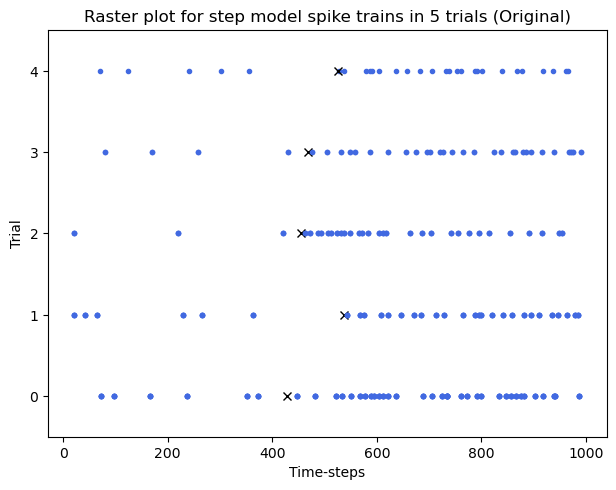

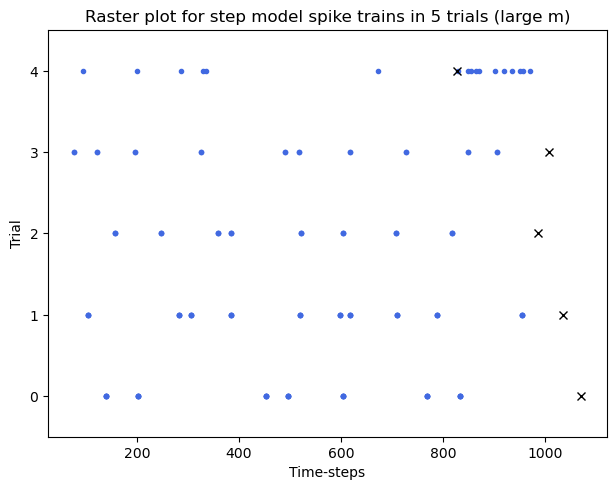

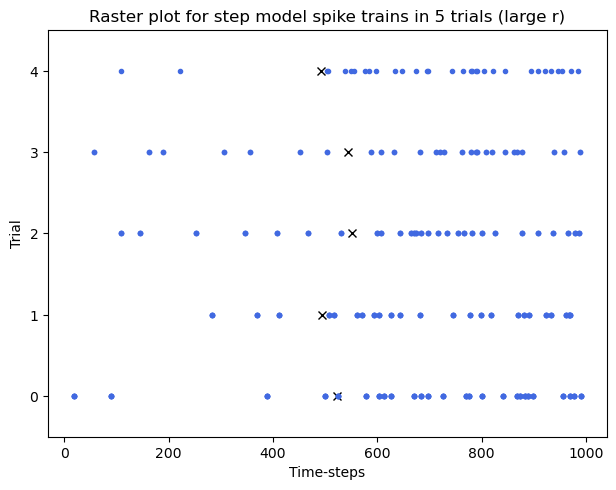

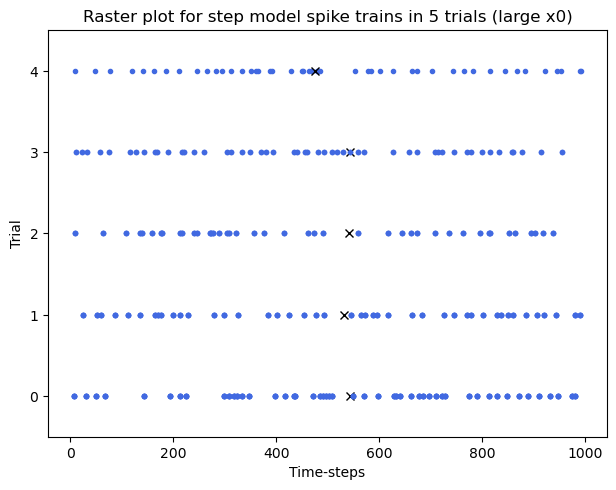

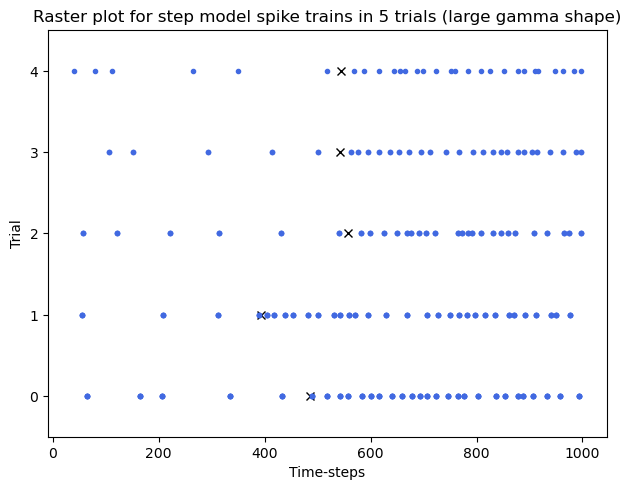

...

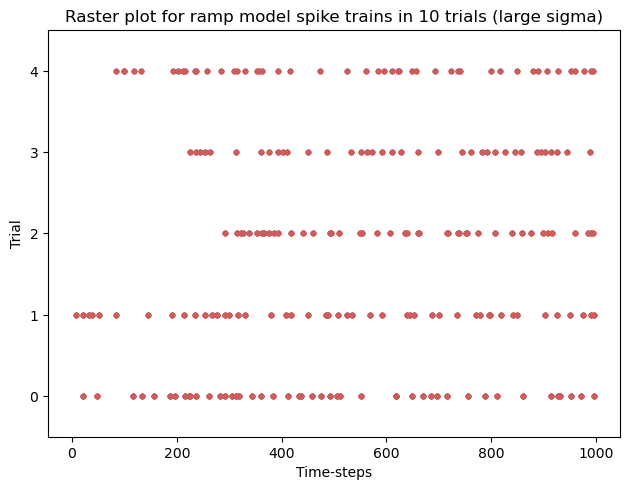

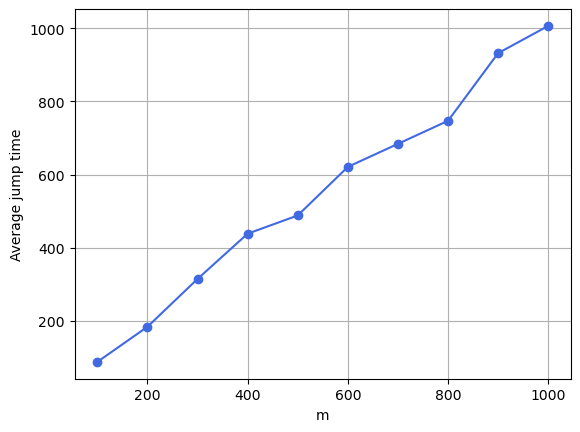

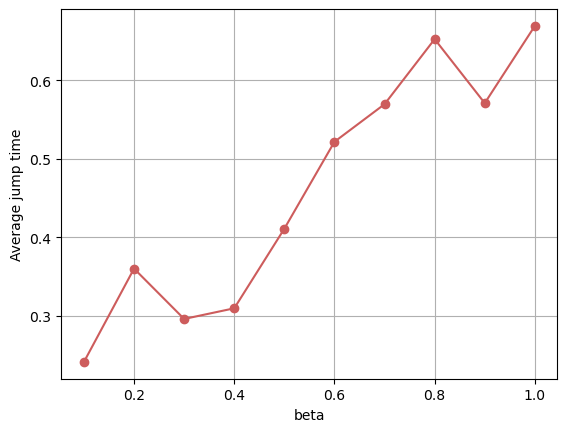

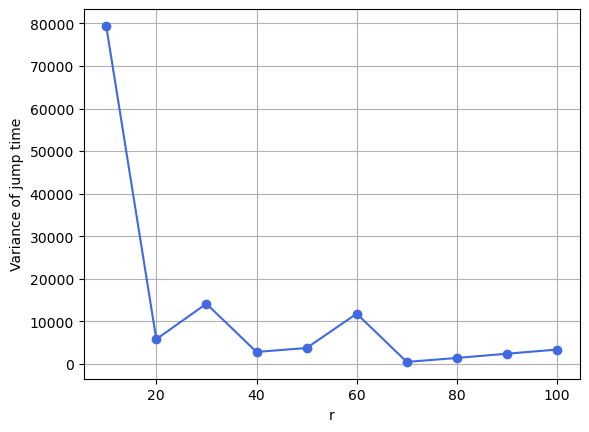

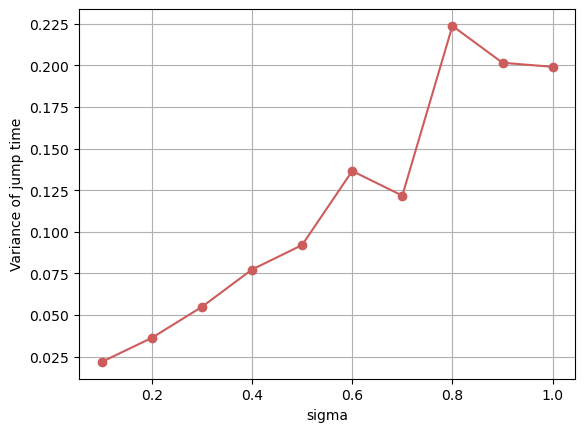

In [238]:
red = "royalblue"
blue = "indianred"


def plot_raster(N_trials, spikes, jump, model, change, hide=False): 
    x=[]
    y=[]
    
    for k in range(N_trials):
        for i,j in enumerate(spikes[k]):
            if j != 0:
                x.append(i)
                y.append(j + k - 1)
        
        if model == "step model":
            plt.plot(x, y, ".", color = red)
            if hide == False:
                plt.plot(jump[k], j + k, "x", color="black")
        else:
            plt.plot(x, y, ".", color = blue)
            
        
    plt.xlabel("Time-steps")
    plt.ylabel("Trial")
    plt.tight_layout()
    plt.ylim([-0.5, 4.5])
    plt.title("Raster plot for " + model + " spike trains in " + str(N_trials) + " trials " + "(" + change + ")")
    plt.show()


# Create a StepModel object with some parameters
# var = m/p --> (m scales with r) affects the variance of the negative binomial distribution
#R_0 is initial firing rate 
#Rh is the threshold for the firing rate

step = models.StepModel(m=500, r=100, x0=0.2, Rh=50, isi_gamma_shape=2) 
# Simulate 5 trials of 1000 time-steps each
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
plot_raster(5, spikes_step, jumps_step, "step model", "Original")

step = models.StepModel(m=1000, r=100, x0=0.2, Rh=50, isi_gamma_shape=2) 
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
plot_raster(5, spikes_step, jumps_step, "step model", "large m")

step = models.StepModel(m=500, r=1000, x0=0.2, Rh=50, isi_gamma_shape=2) 
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
plot_raster(5, spikes_step, jumps_step, "step model", "large r")

step = models.StepModel(m=500, r=100, x0=1.0, Rh=50, isi_gamma_shape=2) 
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
plot_raster(5, spikes_step, jumps_step, "step model", "large x0")

step = models.StepModel(m=500, r=100, x0=0.2, Rh=50, isi_gamma_shape=6) 
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
plot_raster(5, spikes_step, jumps_step, "step model", "large gamma shape")

# Create a RampModel object with some parameters

ramp = models.RampModel(beta=0.5, sigma=0.2, x0=.2, Rh=50, isi_gamma_shape=2)
# Simulate 10 trials of 100 time-steps each
spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=10, T=1000, get_rate=True)
plot_raster(10, spikes_ramp, [], "ramp model", "Original")

ramp = models.RampModel(beta=5, sigma=0.2, x0=.2, Rh=50, isi_gamma_shape=2)
spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=10, T=1000, get_rate=True)
plot_raster(10, spikes_ramp, [], "ramp model", "large beta")

ramp = models.RampModel(beta=0.5, sigma=10, x0=.2, Rh=50, isi_gamma_shape=2)
spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=10, T=1000, get_rate=True)
plot_raster(10, spikes_ramp, [], "ramp model", "large sigma")

#Changing m in the step model changes when the jump occurs in the raster plot. m=T/2 means the jump occurs at the middle of the raster plot. m is the mean jump time
#Changing r in the step model changes the number of successes in the negative binomial distribution. In the raster plot, the spikes are more frequent when r is large

#Changing beta changes the rate of the spikes in the raster plot. The spikes are more frequent when beta is large
#changing sigma adds noise to the spikes in the raster plot. The spikes are more spread out when sigma is large.

###########################################################################################
"""SYSTEMATIC PATTERNS IN THE RASTER PLOTS"""
"""JUMP TIMES FOR RAMP MODEL? CHECK HISTOGRAM OF JUMP TIMES"""
"""HOW DO BETA AND SIGMA AFFECT HISTOGRAM OF JUMP TIMES?"""
###########################################################################################

#Plot variation in average jump times for step model with increasing m

ms = np.linspace(100, 1000, 10)
mlist = []
for m in ms:
    step = models.StepModel(m=m, r=100, x0=0.2, Rh=50, isi_gamma_shape=2) 
    spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
    mlist.append(np.mean(jumps_step))
    
plt.plot(ms, mlist, "-o", color=red)
plt.xlabel("m")
plt.ylabel("Average jump time")
# plt.title("Average jump time for step model with increasing m")
plt.grid()
plt.show()

#Plot variation in average jump times for ramp model with increasing beta

betas = np.linspace(0.1, 1, 10)
blist = []
for beta in betas:
    ramp = models.RampModel(beta=beta, sigma=0.2, x0=.2, Rh=50, isi_gamma_shape=2)
    spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=10, T=1000, get_rate=True)
    blist.append(np.mean(xs_ramp))
    
plt.plot(betas, blist, "-o", color=blue)
plt.xlabel("beta")
plt.ylabel("Average jump time")
# plt.title("Average jump time for ramp model with increasing beta")
plt.grid()
plt.show()

#Plot variation in varaince of jump times for ramp model with increasing r

rs = np.linspace(10, 100, 10)
rlist = []
for r in rs:
    step = models.StepModel(m=500, r=r, x0=0.2, Rh=50, isi_gamma_shape=2) 
    spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5, T=1000, get_rate=True)
    rlist.append(np.var(jumps_step))
        
plt.plot(rs, rlist, "-o", color=red)
plt.xlabel("r")
plt.ylabel("Variance of jump time")
# plt.title("Variance of jump time for step model with increasing r")
plt.grid()
plt.show()

#Plot variation in bin wise variance as sigma increases

sigmas = np.linspace(0.1, 1, 10)
slist = []
for sigma in sigmas:
    ramp = models.RampModel(beta=0.5, sigma=sigma, x0=.2, Rh=50, isi_gamma_shape=2)
    spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=10, T=1000, get_rate=True)
    slist.append(np.var(xs_ramp))

plt.plot(sigmas, slist, "-o", color=blue)
plt.xlabel("sigma")
plt.ylabel("Variance of jump time")
# plt.title("Variance of jump time for ramp model with increasing sigma")
plt.grid()
plt.show()




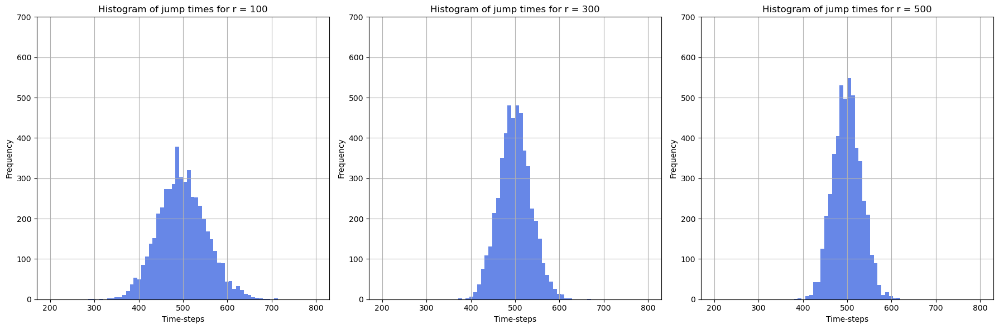

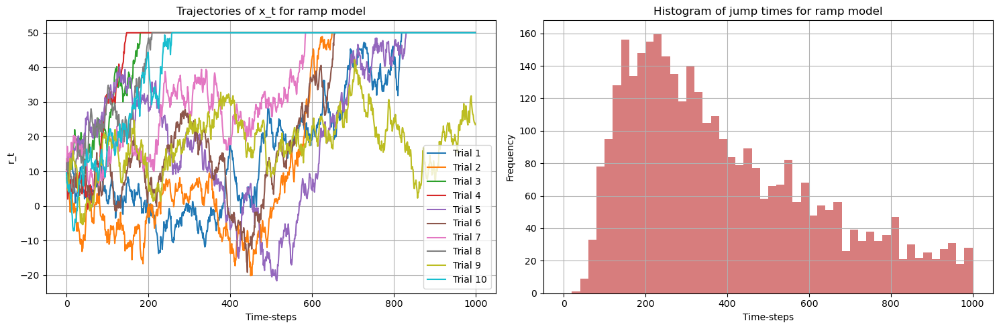

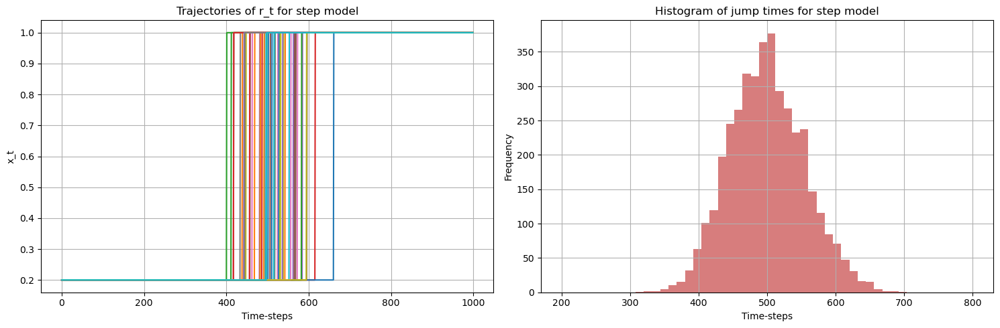

In [239]:
#Histograms for jump times:
# Create a figure with three subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot histograms for jump times for three different conditions
for i in range(3):
    step = models.StepModel(m=500, r=100 + 200 * i, x0=0.2, Rh=50, isi_gamma_shape=2)
    spikes_step, jumps_step, rates_step = step.simulate(Ntrials=5000, T=1000, get_rate=True)
    
    ax = axes[i]
    ax.hist(jumps_step, bins=70, range=(200, 800), color=red, alpha=0.8)
    ax.set_xlabel("Time-steps")
    ax.set_ylabel("Frequency")
    #fix y lims
    ax.set_ylim([0, 700])
    ax.set_title("Histogram of jump times for r = " + str(100 + 200 * i))
    ax.grid(True)

plt.tight_layout()
plt.show()

# Initialize the jumps list
jumps = []

# Create the RampModel and simulate data
ramp = models.RampModel(beta=1.5, sigma=1, x0=0.2, Rh=50, isi_gamma_shape=2)
spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=4000, T=1000, get_rate=True)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot the trajectories of r_t for the first 10 trials
for i in range(10):
    ax1.plot(xs_ramp[i]*50, label="Trial " + str(i+1))

# Extract the time at which xs first crosses 1
for i in range(4000):
    for j, x in enumerate(xs_ramp[i]):
        if x >= 1:
            jumps.append(j)
            break

ax1.set_xlabel("Time-steps")
ax1.set_ylabel("r_t")
ax1.set_title("Trajectories of x_t for ramp model")
ax1.legend()
ax1.grid(True)

# Plot histogram of jump times for ramp model
ax2.hist(jumps, bins=50, range=(0, 1000), color=blue, alpha=0.8)
ax2.set_xlabel("Time-steps")
ax2.set_ylabel("Frequency")
ax2.set_title("Histogram of jump times for ramp model")
ax2.grid(True)

plt.tight_layout()
plt.show()

# Plot trajectories of x_t for step model
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(50):
    step = models.StepModel(m=500, r=100, x0=0.2, Rh=50, isi_gamma_shape=2) 
    spikes_step, jumps_step, rates_step = step.simulate(Ntrials=50, T=1000, get_rate=True)
    ax1.plot(rates_step[i]/50, label="Trial " + str(i+1))

ax1.set_xlabel("Time-steps")
ax1.set_ylabel("x_t")
ax1.set_title("Trajectories of r_t for step model")
ax1.grid(True)

# Extract jump time for step model and plot histogram
step = models.StepModel(m=500, r=100, x0=0.2, Rh=50, isi_gamma_shape=2)
spikes_step, jumps_step, rates_step = step.simulate(Ntrials=4000, T=1000, get_rate=True)
ax2.hist(jumps_step, bins=50, range=(200, 800), color=blue, alpha=0.8)
ax2.set_xlabel("Time-steps")
ax2.set_ylabel("Frequency")
ax2.set_title("Histogram of jump times for step model")
ax2.grid(True)

plt.tight_layout()
plt.show()

**Beta and sigma change the rate at which the trajectory increases and the noise with which it increases. Beta shifts the histogram left and sigma increases the variance of the histogram**

$$x_{t+1} = x_t + \beta t + \sigma \sqrt(dt) \epsilon_t$$

### Task 1.2

PSTH is an important data analysis tool used in neuroscience.<br>
This  is a statistical estimate of the trial-averaged firing rate as a function of time, based on recordings of spike trains in<br>
multiple experimental trials. It is obtained by binning/histogramming spikes (e.g. using `np.histogram`) in different time bins<br>
and averaging the resulting spike counts over many trials (you can also divide by `dt` to turn into rate in units of Hz).<br>

Write code to construct and plot PSTH's in different regions of each model's parameter space. Note how the PSTH <br>
fluctuates randomly from dataset to dataset. It is better to do some sort of (temporal) smoothing in order to reduce these<br>
fluctuations and the jaggedness of the PSTH. You can use either a sliding window (e.g. a boxcar window/functin) averaging, or simply <br>
use time bins that are larger than the oridinal time steps (e.g. 50 milliseconds -- or 5 timesteps if you are using a `dt` of 10 ms,<br>
corresponding to `T = 100`). The smooth ramping firing rate curves in Figure 4 of the [Background](https://github.com/ahmadianlab/gg3_nda/blob/main/Background.ipynb)
are examples of smoothed PSTH's.

Even with the smoothing there will be fluctuations in the PSTH from dataset to dataset. How does the strength of these fluctuations depend on (or scale with)<br>
the number of trials (in each dataset)? Try to be quantitative about this. <br>
For the rest of this task use a high number of trials (e.g. 5000) to minimise these fluctuations. (But note <br>
that in real experiments the number of trials rarely exceeds a few hundred -- so for later tasks we will bring the number down.)


<font color = red> Finally, try to find parameter regimes that make the PSTH of the stepping model very close to that of the ramp model. (First make sure<br>
the ramp model's PSTH look qualitatively like the classic ramping PSTH's in the LIP experiments.) In which parameter regions<br>
does this fail drastically, and in which regimes are the two PSTH's nearly indistinguishable?</font>

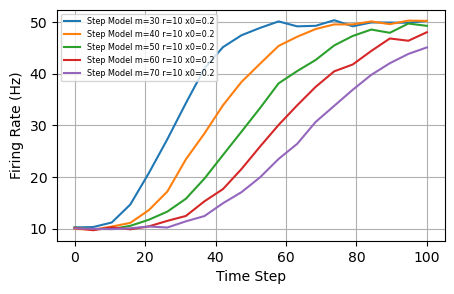

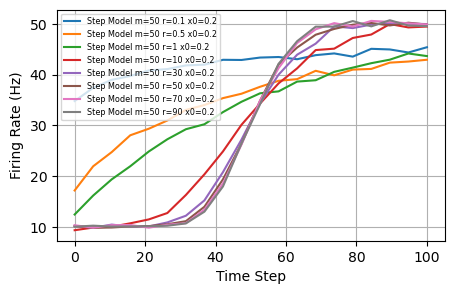

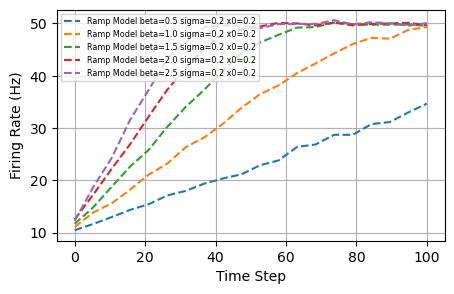

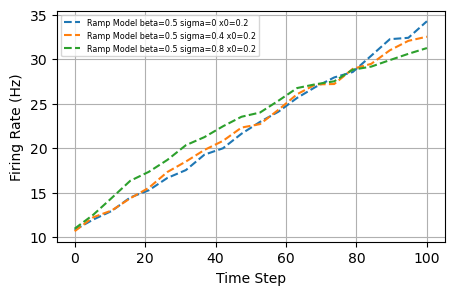

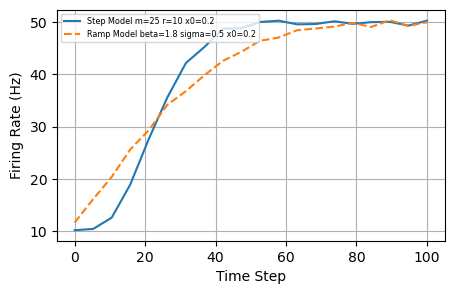

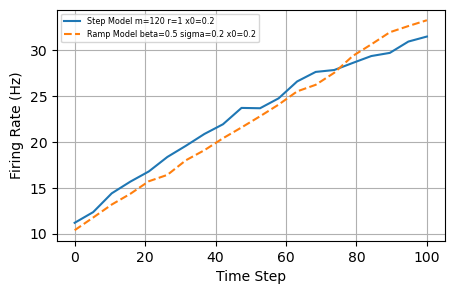

In [240]:
def simulate_and_plot_psth(step_params_list, ramp_params_list, Ntrials=5000, T=100, dt=0.01):
    bin_size = 5  # Larger bins for smoothing
    time_axis = np.linspace(0, T, int(T / bin_size))

    plt.figure(figsize=(5, 3))

    def calculate_psth(spikes, bin_size):
      bin_count = int(T / bin_size)
      psth = np.zeros(bin_count)

     
      for spike_train in spikes:
          for time, value in enumerate(spike_train):
              if value:  # Only add non-zero values
                  bin_index = int(time / bin_size)
                  if bin_index < len(psth):  # Ensure the index is within the array bounds
                      psth[bin_index] += value

      return psth / (Ntrials * dt* bin_size)

    # Loop through stepping model parameter sets
    for params in step_params_list:
        step_model = models.StepModel(**params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        psth_step = calculate_psth(spikes_step, bin_size)
        plt.plot(time_axis, psth_step, label=f'Step Model m={params["m"]} r={params["r"]} x0={params["x0"]}', alpha=1)

    # Loop through ramping model parameter sets
    for params in ramp_params_list:
        ramp_model = models.RampModel(**params)
        spikes_ramp, _, _ = ramp_model.simulate(Ntrials=Ntrials, T=T)
        psth_ramp = calculate_psth(spikes_ramp, bin_size)
        plt.plot(time_axis, psth_ramp, linestyle = "dashed", label=f'Ramp Model beta={params["beta"]} sigma={params["sigma"]} x0={params["x0"]}', alpha=1)

    plt.xlabel('Time Step')
    plt.ylabel('Firing Rate (Hz)')
    # plt.title('Comparison of PSTHs Across Models and Parameters')
    plt.legend(loc='upper left', fontsize='xx-small')
    plt.grid(True)
    plt.show()


step_params_list = [
    # {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'m': 60, 'r': 5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
]

ramp_params_list = [
    # {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.8, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 2.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
]

def vary_parameter(parameter, value, step_params_list, ramp_params_list):
    if parameter == "m":
        step_params_list = [{'m': value, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': value+10, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': value+20, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': value+30, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': value+40, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}]
    elif parameter == 'r': 
        step_params_list = [{'m': 50, 'r': 0.1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': value, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': value+20, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': value+40, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': value+60, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'m': 50, 'r': value+80, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}]
    elif parameter == 'beta':
        ramp_params_list = [{'beta': value, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': value+0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': value+1, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': value+1.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': value+2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}]
    elif parameter == 'sigma':
        ramp_params_list = [{'beta': 0.5, 'sigma': value, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': 0.5, 'sigma': value+0.4, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}, {'beta': 0.5, 'sigma': value+0.8, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}]
    return step_params_list, ramp_params_list   
    

simulate_and_plot_psth(vary_parameter("m",30 ,step_params_list, ramp_params_list)[0], [])
simulate_and_plot_psth(vary_parameter("r",10 ,step_params_list, ramp_params_list)[0], [])
simulate_and_plot_psth([], vary_parameter("beta",0.5,step_params_list, ramp_params_list)[1])
simulate_and_plot_psth([], vary_parameter("sigma",0,step_params_list, ramp_params_list)[1],)
simulate_and_plot_psth(step_params_list, ramp_params_list)
simulate_and_plot_psth([{'m': 120, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}], [{'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}])

**The Stepping model approaches the Ramping model when $r$ is approximately 1 and $m$ is approximately 120. & SIGMA IS LARGE**
<font color = lightgreen> WHEN ARE MODELS MOST DIFFERENT:Small r means small variance. Small r is when they're most similar. Most different when r is large or close to zero.</font>

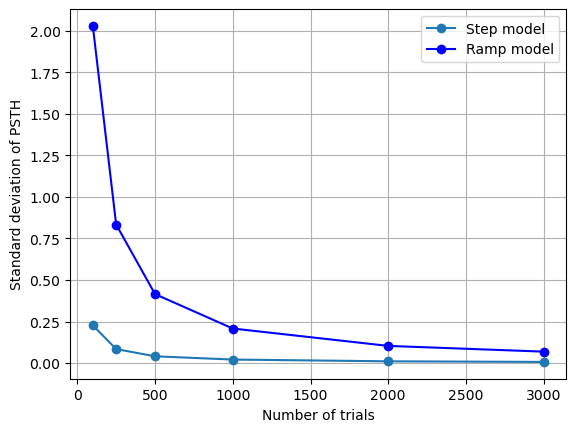

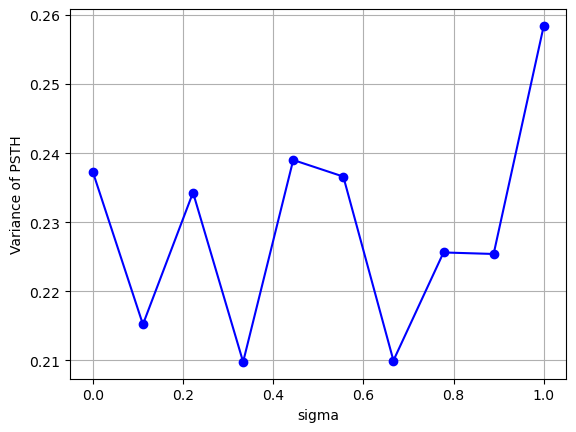

In [241]:
T=100
bin_size = 3  # Larger bins for smoothing
time_axis = np.linspace(0, T, int(T / bin_size))
# Ntrials=5000
dt=0.01

def calculate_psth(spikes, bin_size, Ntrials):
    bin_count = int(T / bin_size)
    psth = np.zeros(bin_count)

    
    for spike_train in spikes:
        for time, value in enumerate(spike_train):
            if value:  # Only add non-zero values
                bin_index = int(time / bin_size)
                if bin_index < len(psth):  # Ensure the index is within the array bounds
                    psth[bin_index] += value

    return psth / (Ntrials * dt* bin_size)

Ntrials = [100, 250, 500, 1000, 2000, 3000]
#calculate the standard deviations of the PSTHs for different number of trials in STEP model
stds = []
for N in Ntrials:
    psth = np.zeros(int(T / bin_size))
    for i in range(20):
        spikes_step, _, _ = step.simulate(Ntrials=N, T=100, get_rate=True)
        psth += calculate_psth(spikes_step, bin_size, N)
    psth /= N
    stds.append(np.std(psth))
    
plt.plot(Ntrials, stds, "-o")

#calculate the standard deviations for the PSTH in RAMP model
stds1 = []
for N in Ntrials:
    psth = np.zeros(int(T / bin_size))
    for i in range(20):
        spikes_ramp, _, _ = ramp.simulate(Ntrials=N, T=100, get_rate=True)
        psth += calculate_psth(spikes_ramp, bin_size, N)
    psth /= N
    stds1.append(np.std(psth))
plt.plot(Ntrials, stds1, "-o", color="blue")
plt.xlabel("Number of trials")
plt.ylabel("Standard deviation of PSTH")
plt.legend(["Step model", "Ramp model"])
plt.grid(True)
plt.show()

#calculate change in binwise variance with sigma for ramp model
sigmas = np.linspace(0, 1, 10)
variances = []
for sigma in sigmas:
    ramp = models.RampModel(beta=1.5, sigma=sigma, x0=0.2, Rh=50, isi_gamma_shape=2)
    spikes_ramp, xs_ramp, rates_ramp = ramp.simulate(Ntrials=5000, T=1000, get_rate=True)
    psth = calculate_psth(spikes_ramp, bin_size, 5000)
    variances.append(np.var(psth))
    
plt.plot(sigmas, variances, "-o", color="blue")
plt.xlabel("sigma")
plt.ylabel("Variance of PSTH")
# plt.title("Variance of PSTH for ramp model with increasing sigma")
plt.grid(True)
plt.show()


### Task 1.3

The PSTH is an example of a so-called first-order statistic, in that it is the averge of spike counts, $n_t$, which is their first moment.

You can also evaluate higher order statistics, such as the variance of $n_t$ (across trials).
(Instead of smoothing, for evaluating the variance use larger time bins -- e.g. 50 or 100 milliseconds).
However, instead of directly plotting and exploring the variance, we will plot a more useful quantity: the **Fano factor**, which is the ratio of the variance of $n_t$ to its mean (obviously both evaluated in the same time bin). This quantity is 1 for the Poisson distribution (the default choice for the emission distribution of both models).<br>
Evalute and plot the Fano Factor as a function of time, and again <font color = red> investigate how it changes in different parameter regimes, and importantly<br> 
whether and how it behaves differently in the two models.</font>

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\1887741387.py:15: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


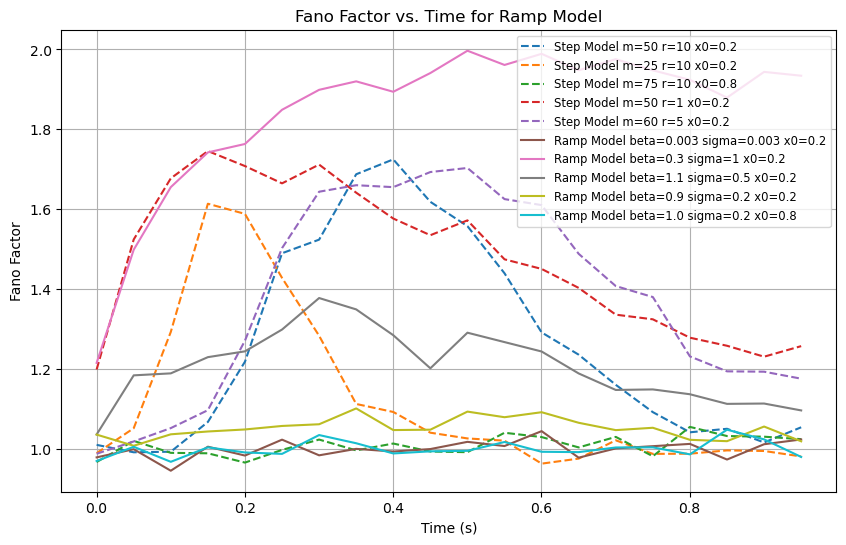

In [242]:
def simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=0.05, separate=True):
    def calculate_fano_factor(spikes, bin_size, T, Ntrials, dt):
        bin_size_in_steps = int(bin_size / dt)
        bin_count = int(T / bin_size)
        spike_counts = np.zeros((Ntrials, bin_count)) # this is a 2D array with Ntrials rows and bin_count columns

        for trial_index, spike_train in enumerate(spikes):
            for time in range(0, len(spike_train), bin_size_in_steps): # this loop goes through the spike train in steps of bin_size_in_steps
                bin_index = time // bin_size_in_steps # this is the index of the bin where the spike count will be stored.
                spike_counts[trial_index, bin_index] = np.sum(spike_train[time:time + bin_size_in_steps]) # this is the spike count in the bin. This fills the spike_counts array.
       
        means = np.mean(spike_counts, axis=0) # axis=0 means that we are calculating the mean across the rows (i.e., across trials)
        variances = np.var(spike_counts, axis=0) # axis=0 means that we are calculating the variance across the rows (i.e., across trials)
        
        fano_factors = variances / means
        
        return fano_factors, np.linspace(0, T, bin_count)

    # Plot for Step Model
    plt.figure(figsize=(10, 6))
    for i, step_params in enumerate(step_params_list):
        step_model = models.StepModel(**step_params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        fano_step, time_bins = calculate_fano_factor(spikes_step, bin_size, T, Ntrials, dt)
        plt.plot(time_bins, fano_step, "--", label=f'Step Model m={step_params["m"]} r={step_params["r"]} x0={step_params["x0"]}', alpha=1)

    plt.xlabel('Time (s)')
    plt.ylabel('Fano Factor')
    plt.title('Fano Factor vs. Time for Step Model')
    plt.legend()
    plt.grid(True)
    if separate == True:
        plt.show()

        # Plot for Ramp Model
        plt.figure(figsize=(10, 6))
    for i, ramp_params in enumerate(ramp_params_list):
        ramp_model = models.RampModel(**ramp_params)
        spikes_ramp, _, _ = ramp_model.simulate(Ntrials=Ntrials, T=T)
        fano_ramp, time_bins = calculate_fano_factor(spikes_ramp, bin_size, T, Ntrials, dt)
        plt.plot(time_bins, fano_ramp, label=f'Ramp Model beta={ramp_params["beta"]} sigma={ramp_params["sigma"]} x0={ramp_params["x0"]}', alpha=1)
   
    plt.xlabel('Time (s)')
    plt.ylabel('Fano Factor')
    plt.title('Fano Factor vs. Time for Ramp Model')
    plt.legend(fontsize='small')
    plt.grid(True)
    plt.show()

# Define parameter sets for both models
step_params_list = [
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.8, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 60, 'r': 5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
]

ramp_params_list = [
    {'beta': 0.003, 'sigma': 0.003, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.3, 'sigma': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.9, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.0, 'sigma': 0.2, 'x0': 0.8, 'Rh': 50, 'dt': 0.01},
]

# Number of trials and bin size for the analysis
Ntrials = 5000
bin_size = 0.05  # 50 milliseconds

# Call the function to simulate and plot the Fano factors for multiple parameter sets
simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=bin_size, separate=False)

### Task 1.4

(This is a more open-ended and less guided task compared to the previous ones. Use brainstorming in the group and come up with creative ideas to address this, working together.)

In this task you will explore an informal or relatively ad-hoc version of what we intend to do eventually using the systematic approach of Bayesian inference. <br>
The aim is to find an intelligent but ad-hoc (in the sense that it is not Bayesian and does not rely on the two models' likelihood function, but only relies on
observed statistics) way of telling the two models apart, i.e. deciding which model generated a dataset.

Relying on the 1st and 2nd order statistics that you have explored (or other 2nd or higher order statistics you may come up it),
construct a criterion (or multiple alternative criteria which you would then compare) for deciding between the two models. To make this challening,
you will obviously need to put the two sets of model parameter in respective regimes in which the two models are least distinguishable based their generated spike trains.
Also try to come up with criteria that are relatively robust, i.e. are not handcrafted to tell the two models apart only for a fixed choice of parameters.

You have to test your criterion by running it on several datasets, once generated by the ramp model, and in another round, generted by the step model.
And then quantify what percent of datasets in each case where classified/decided correctly. Use a number of trials not more than 400 for each dataset you will run your test/criterion on.

Step Model {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: unsure
Step Model {'m': 25, 'r': 1, 'x0': 0.7, 'Rh': 50, 'dt': 0.01}: unsure
Step Model {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: step
Step Model {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Step Model {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Step Model {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: step
Step Model {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: step
Ramp Model {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: step
Ramp Model {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Ramp Model {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Ramp Model {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Ramp Model {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: unsure
Ramp Model {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: unsure
Ramp Model {'beta': 1.1, 'sigma': 

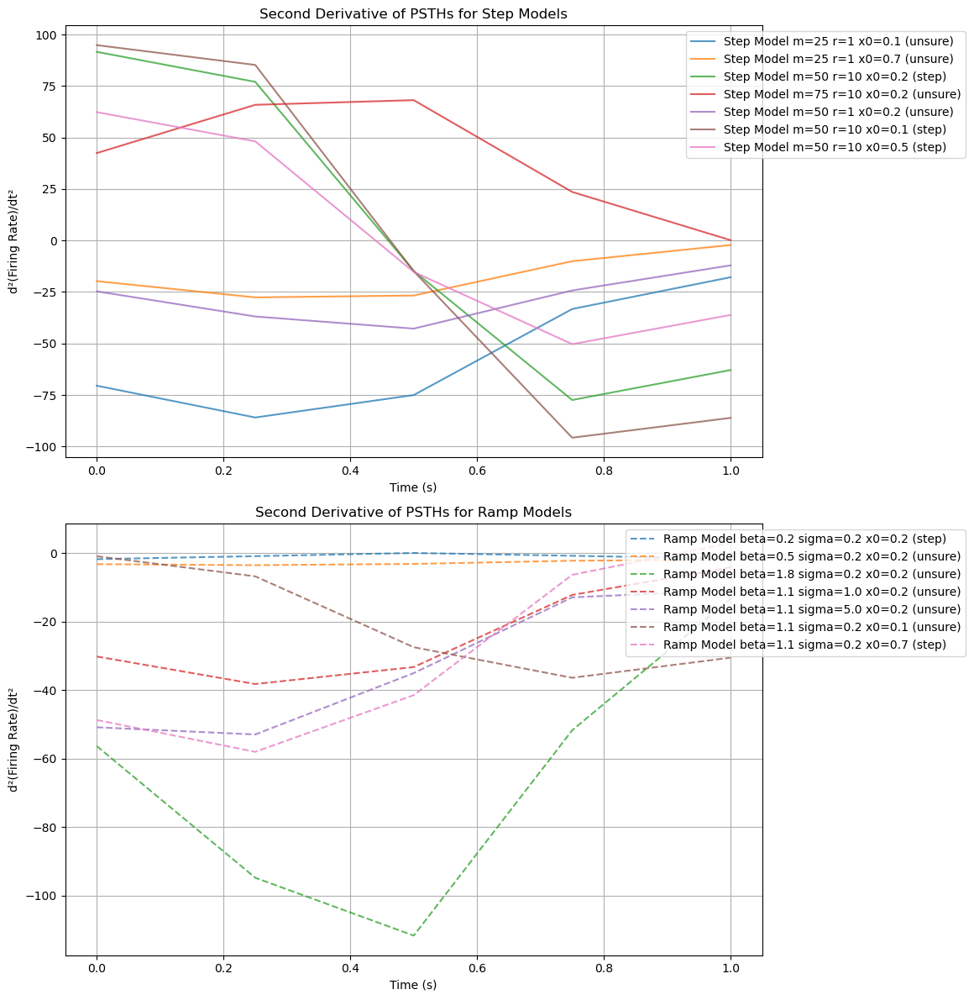

In [243]:

# test of filter 1, testing if zero crossing of second derivative is reliable.
def simulate_and_plot_psth(step_params_list, ramp_params_list, Ntrials=5000, T=100, dt=0.01):
    bin_size = 20  # Larger bins for smoothing
    time_axis = np.linspace(0, T, int(T / bin_size)) / T

    plt.figure(figsize=(12, 12))

    def calculate_psth(spikes, bin_size):
        bin_count = int(T / bin_size)
        psth = np.zeros(bin_count)

        for spike_train in spikes:
            for time, value in enumerate(spike_train):
                if value:  # Only add non-zero values
                    bin_index = int(time / bin_size)
                    if bin_index < len(psth):  # Ensure the index is within the array bounds
                        psth[bin_index] += value

        return psth / (Ntrials * dt * bin_size)

    def check_zero_crossing(derivative, time_axis):
        crossings = np.where(np.diff(np.sign(derivative)))[0]
        for crossing in crossings:
            if 0.05 < time_axis[crossing] < 0.95:
                return "step"
        return "unsure"

    # Plotting step model PSTH and its second derivative
    plt.subplot(2, 1, 1)
    for params in step_params_list:
        step_model = models.StepModel(**params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        psth_step = calculate_psth(spikes_step, bin_size)
        second_derivative_step = np.gradient(np.gradient(psth_step, time_axis), time_axis)
        classification = check_zero_crossing(second_derivative_step, time_axis)
        print(f"Step Model {params}: {classification}")
        plt.plot(time_axis, second_derivative_step, label=f'Step Model m={params["m"]} r={params["r"]} x0={params["x0"]} ({classification})', alpha=0.75)
    plt.xlabel('Time (s)')
    plt.ylabel('d²(Firing Rate)/dt²')
    plt.title('Second Derivative of PSTHs for Step Models')
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
    plt.grid(True)

    # Plotting ramp model PSTH and its second derivative
    plt.subplot(2, 1, 2)
    for params in ramp_params_list:
        ramp_model = models.RampModel(**params)
        spikes_ramp, _, _ = ramp_model.simulate(Ntrials=Ntrials, T=T)
        psth_ramp = calculate_psth(spikes_ramp, bin_size)
        second_derivative_ramp = np.gradient(np.gradient(psth_ramp, time_axis), time_axis)
        classification = check_zero_crossing(second_derivative_ramp, time_axis)
        print(f"Ramp Model {params}: {classification}")
        plt.plot(time_axis, second_derivative_ramp, linestyle="dashed", label=f'Ramp Model beta={params["beta"]} sigma={params["sigma"]} x0={params["x0"]} ({classification})', alpha=0.75)
    plt.xlabel('Time (s)')
    plt.ylabel('d²(Firing Rate)/dt²')
    plt.title('Second Derivative of PSTHs for Ramp Models')
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Define the step and ramp model parameters
step_params_list = [
    {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.7, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50, 'dt': 0.01}
]


simulate_and_plot_psth(step_params_list, ramp_params_list)

# Demonstration of filter 2, used to find a reasonable threshold for detecting high variance ramping model,
# note that ramping model can easily fire variance above 200 by sigma > 1 but stepping has to have a particular combination of parameters acheieve nearly that (and it doens't even achieve var > 200 reliably)





    
    

 

In [244]:
def calculate_spike_variance_step(m=50, r=10, x0=0.2, Rh=50, Ntrials=100, T=100, isi_gamma_shape=None, Rl=None, dt=None):
    # Simulate step model
    step = models.StepModel(m, r, x0, Rh, isi_gamma_shape=isi_gamma_shape, Rl=Rl, dt=dt)
    spikes_step, jumps_step = step.simulate(Ntrials=Ntrials, T=T, get_rate=False)

    # Calculate total spikes per trial
    total_spikes_step = np.sum(spikes_step, axis=1)

    # Calculate variance of total spikes
    variance_step = np.var(total_spikes_step)

    return variance_step

def calculate_spike_variance_ramp(beta=0.5, sigma=0.2, x0=0.2, Rh=50, Ntrials=100, T=100, dt=0.01):
    # Simulate ramp model
    ramp = models.RampModel(beta, sigma, x0, Rh, dt=dt)
    spikes_ramp, jumps_ramp = ramp.simulate(Ntrials=Ntrials, T=T, get_rate=False)

    # Calculate total spikes per trial
    total_spikes_ramp = np.sum(spikes_ramp, axis=1)

    # Calculate variance of total spikes
    variance_ramp = np.var(total_spikes_ramp)

    return variance_ramp

# Example usage
Ntrials = 200
T = 100
dt = 0.01

# Example usage
Ntrials = 200
T = 100
dt = 0.01

# Step model parameters
step_params = [
    {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

ramp_params = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50},
]

# Calculate variance for step model
for params in step_params:
    variance_step = calculate_spike_variance_step(**params, Ntrials=Ntrials, T=T)
    print(f"Step model with parameters {params}: Variance of total spikes = {variance_step}")

# Calculate variance for ramp model
for params in ramp_params:
    variance_ramp = calculate_spike_variance_ramp(**params, Ntrials=Ntrials, T=T)
    print(f"Ramp model with parameters {params}: Variance of total spikes = {variance_ramp}")


Step model with parameters {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 167.7171
Step model with parameters {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 65.955975
Step model with parameters {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 82.3899
Step model with parameters {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 99.836975
Step model with parameters {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 190.850775
Step model with parameters {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 85.694375
Step model with parameters {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 55.1271
Ramp model with parameters {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: Variance of total spikes = 42.605599999999995
Ramp model with parameters {'beta': 0.5, 'sigma': 0.2

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\477254876.py:17: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Maximum Fano Factor for Step Model with parameters {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: 2.0358989454378076
Maximum Fano Factor for Step Model with parameters {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: 1.242312679288551
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.726849774360726
Maximum Fano Factor for Step Model with parameters {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.7480126686016453
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.6919710144927724
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: 2.088844222111078
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: 1.1988353067814483
Maximum Fano Factor for Ramp Model with parameters {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.2450114107421184
Maximum Fano 

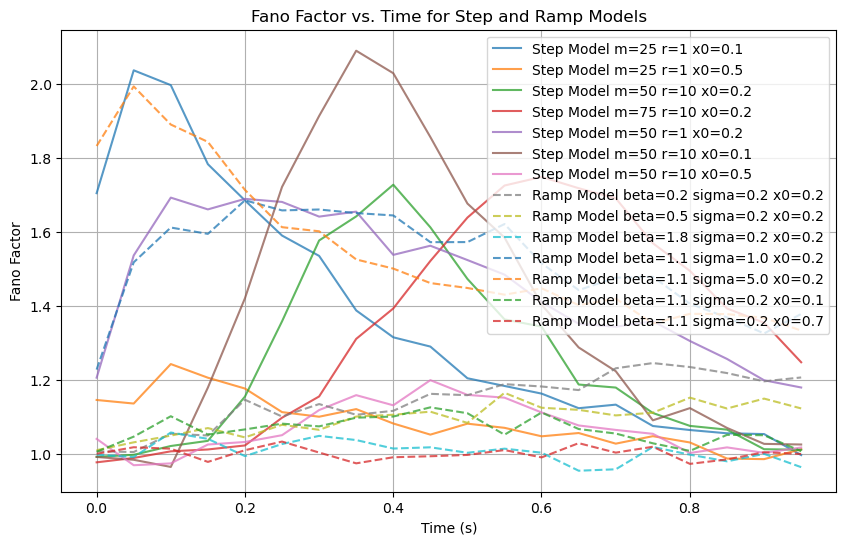

In [245]:
# Demonstration of Step 3, used to find reasonable threshold for max fano threshold
# clearly ramping has lower fano except for high sigma, so reliable

def simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=0.05):
    def calculate_fano_factor(spikes, bin_size, T, Ntrials, dt):
        bin_size_in_steps = int(bin_size / dt)
        bin_count = int(T / bin_size)
        spike_counts = np.zeros((Ntrials, bin_count))

        for trial_index, spike_train in enumerate(spikes):
            for time in range(0, len(spike_train), bin_size_in_steps):
                bin_index = time // bin_size_in_steps
                spike_counts[trial_index, bin_index] = np.sum(spike_train[time:time + bin_size_in_steps])

        means = np.mean(spike_counts, axis=0)
        variances = np.var(spike_counts, axis=0)
        fano_factors = variances / means

        return fano_factors, np.linspace(0, T, bin_count)

    # Plot for Step Model
    plt.figure(figsize=(10, 6))
    for i, step_params in enumerate(step_params_list):
        step_model = models.StepModel(**step_params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        fano_step, time_bins = calculate_fano_factor(spikes_step, bin_size, T, Ntrials, dt)
        max_fano_step = np.nanmax(fano_step)  # Use nanmax to find the maximum Fano factor
        print(f"Maximum Fano Factor for Step Model with parameters {step_params}: {max_fano_step}")
        plt.plot(time_bins, fano_step, label=f'Step Model m={step_params["m"]} r={step_params["r"]} x0={step_params["x0"]}', alpha=0.75)

    # Plot for Ramp Model
    for i, ramp_params in enumerate(ramp_params_list):
        ramp_model = models.RampModel(**ramp_params)
        spikes_ramp, _, _ = ramp_model.simulate(Ntrials=Ntrials, T=T)
        fano_ramp, time_bins = calculate_fano_factor(spikes_ramp, bin_size, T, Ntrials, dt)
        max_fano_ramp = np.nanmax(fano_ramp)  # Use nanmax to find the maximum Fano factor
        print(f"Maximum Fano Factor for Ramp Model with parameters {ramp_params}: {max_fano_ramp}")
        plt.plot(time_bins, fano_ramp, linestyle="dashed", label=f'Ramp Model beta={ramp_params["beta"]} sigma={ramp_params["sigma"]} x0={ramp_params["x0"]}', alpha=0.75)

    plt.xlabel('Time (s)')
    plt.ylabel('Fano Factor')
    plt.title('Fano Factor vs. Time for Step and Ramp Models')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define parameter sets for both models
step_params_list = [
    {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50, 'dt': 0.01}
]

# Number of trials and bin size for the analysis
Ntrials = 5000
bin_size = 0.05  # 50 milliseconds

# Call the function to simulate and plot the Fano factors for multiple parameter sets
simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=bin_size)



C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\1715886126.py:17: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Maximum Fano Factor for Step Model with parameters {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: 2.0740531169136633
Maximum Fano Factor for Step Model with parameters {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: 1.2025184780324054
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.6949848050111143
Maximum Fano Factor for Step Model with parameters {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.728704993252341
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.7312096996019026
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01}: 2.041635514967182
Maximum Fano Factor for Step Model with parameters {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}: 1.1858644236920926
Maximum Fano Factor for Ramp Model with parameters {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}: 1.2733429160651533
Maximum Fano

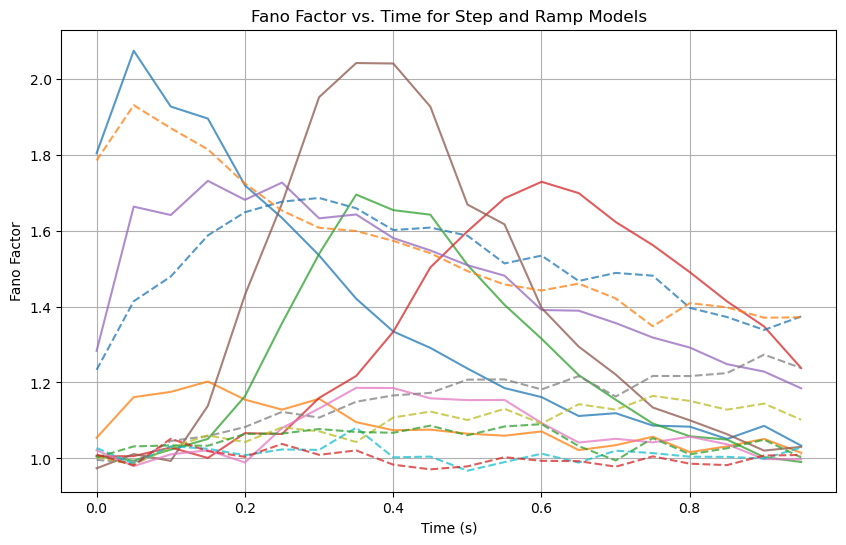

In [246]:
# Demonstration of Step 3, used to find reasonable threshold for max fano threshold
# clearly ramping has lower fano except for high sigma, so reliable

def simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=0.05):
    def calculate_fano_factor(spikes, bin_size, T, Ntrials, dt):
        bin_size_in_steps = int(bin_size / dt)
        bin_count = int(T / bin_size)
        spike_counts = np.zeros((Ntrials, bin_count))

        for trial_index, spike_train in enumerate(spikes):
            for time in range(0, len(spike_train), bin_size_in_steps):
                bin_index = time // bin_size_in_steps
                spike_counts[trial_index, bin_index] = np.sum(spike_train[time:time + bin_size_in_steps])

        means = np.mean(spike_counts, axis=0)
        variances = np.var(spike_counts, axis=0)
        fano_factors = variances / means

        return fano_factors, np.linspace(0, T, bin_count)

    # Plot for Step Model
    plt.figure(figsize=(10, 6))
    for i, step_params in enumerate(step_params_list):
        step_model = models.StepModel(**step_params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        fano_step, time_bins = calculate_fano_factor(spikes_step, bin_size, T, Ntrials, dt)
        max_fano_step = np.nanmax(fano_step)  # Use nanmax to find the maximum Fano factor
        print(f"Maximum Fano Factor for Step Model with parameters {step_params}: {max_fano_step}")
        plt.plot(time_bins, fano_step, label=f'Step Model m={step_params["m"]} r={step_params["r"]} x0={step_params["x0"]}', alpha=0.75)

    # Plot for Ramp Model
    for i, ramp_params in enumerate(ramp_params_list):
        ramp_model = models.RampModel(**ramp_params)
        spikes_ramp, _, _ = ramp_model.simulate(Ntrials=Ntrials, T=T)
        fano_ramp, time_bins = calculate_fano_factor(spikes_ramp, bin_size, T, Ntrials, dt)
        max_fano_ramp = np.nanmax(fano_ramp)  # Use nanmax to find the maximum Fano factor
        print(f"Maximum Fano Factor for Ramp Model with parameters {ramp_params}: {max_fano_ramp}")
        plt.plot(time_bins, fano_ramp, linestyle="dashed", label=f'Ramp Model beta={ramp_params["beta"]} sigma={ramp_params["sigma"]} x0={ramp_params["x0"]}', alpha=0.75)

    plt.xlabel('Time (s)')
    plt.ylabel('Fano Factor')
    plt.title('Fano Factor vs. Time for Step and Ramp Models')
    # plt.legend()
    plt.grid(True)
    plt.show()

# Define parameter sets for both models
step_params_list = [
    {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.5, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50, 'dt': 0.01}
]

# Number of trials and bin size for the analysis
Ntrials = 5000
bin_size = 0.05  # 50 milliseconds

# Call the function to simulate and plot the Fano factors for multiple parameter sets
simulate_and_plot_fano_factor(step_params_list, ramp_params_list, Ntrials, T=100, dt=0.01, bin_size=bin_size)



In [247]:
# first prototype of predictor
def calculate_psth(spikes, bin_size, T, Ntrials, dt):
    bin_count = int(T / bin_size)
    psth = np.zeros(bin_count)

    for spike_train in spikes:
        for time, value in enumerate(spike_train):
            if value:  # Only add non-zero values
                bin_index = int(time / bin_size)
                if bin_index < len(psth):  # Ensure the index is within the array bounds
                    psth[bin_index] += value

    return psth / (Ntrials * dt * bin_size)

def check_zero_crossing(derivative, time_axis):
    crossings = np.where(np.diff(np.sign(derivative)))[0]
    for crossing in crossings:
        if 0.05 < time_axis[crossing] < 0.95:
            return True
    return False

def calculate_spike_variance(spikes, Ntrials):
    total_spikes = np.sum(spikes, axis=1)
    variance = np.var(total_spikes)
    return variance

def calculate_fano_factor(spikes, bin_size, T, Ntrials, dt):
    bin_size_in_steps = int(bin_size / dt)
    bin_count = int(T / bin_size)
    spike_counts = np.zeros((Ntrials, bin_count))

    for trial_index, spike_train in enumerate(spikes):
        for time in range(0, len(spike_train), bin_size_in_steps):
            bin_index = time // bin_size_in_steps
            spike_counts[trial_index, bin_index] = np.sum(spike_train[time:time + bin_size_in_steps])

    means = np.mean(spike_counts, axis=0)
    variances = np.var(spike_counts, axis=0)
    fano_factors = variances / means

    return fano_factors, np.linspace(0, T, bin_count)

def predict_model(spikes, Ntrials=200, T=100, dt=0.01):
    bin_size = 20  # Larger bins for smoothing for step 1
    time_axis = np.linspace(0, T, int(T / bin_size)) / T

    # Step 1: Calculate PSTH and check for zero crossing in the second derivative
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    print("PSTH:", psth)

    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)
    print("Second Derivative:", second_derivative)

    if check_zero_crossing(second_derivative, time_axis):
        print("Step model detected (zero crossing in second derivative).")
        return "step"

    # Use smaller bin size for steps 2 and 3
    bin_size = 3  # 3 ms bins for variance and Fano factor calculation

    # Step 2: Calculate variance of total spikes
    variance = calculate_spike_variance(spikes, Ntrials)
    print("Variance of total spikes:", variance)

    if variance > 200:
        print("Ramping model detected (variance > 200).")
        return "ramping"

    # Step 3: Calculate average Fano factor
    bin_size = 0.05  # Correct bin size for Fano factor calculation
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    average_fano_factor = np.nanmean(fano_factors)
    print("Fano Factors:", fano_factors)
    print("Average Fano Factor:", average_fano_factor)


    if average_fano_factor > 1.3:
        print("Step model detected (average Fano factor > 1.2).")
        return "step"
    else:
        print("Ramping model detected (average Fano factor <= 1.2).")
        return "ramping"


# Generate spike trains for the example
def generate_example_spike_trains(model_type, params, Ntrials=200, T=100, dt=0.01):
    if model_type == "step":
        model = models.StepModel(**params)
    elif model_type == "ramp":
        model = models.RampModel(**params)
    else:
        raise ValueError("Invalid model type")

    spikes, _, _ = model.simulate(Ntrials=Ntrials, T=T)
    return spikes

# Example parameters for step and ramp models
step_params = {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
ramp_params = {'beta': 0.5, 'sigma': 2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
# Generate spike trains for both models
spikes_step = generate_example_spike_trains("step", step_params)
spikes_ramp = generate_example_spike_trains("ramp", ramp_params)

# Predict the model type for each set of spike trains
print("Predicting model for step-generated spikes:")
result_step = predict_model(spikes_step)

print("Predicting model for ramp-generated spikes:")
result_ramp = predict_model(spikes_ramp)

print("Predicted model for step-generated spikes:", result_step)
print("Predicted model for ramp-generated spikes:", result_ramp)


Predicting model for step-generated spikes:
PSTH: [ 9.7   15.25  30.65  44.4   49.075]
Second Derivative: [ 78.8  72.2 -10.1 -79.2 -72.6]
Step model detected (zero crossing in second derivative).
Predicting model for ramp-generated spikes:
PSTH: [15.65  23.125 26.425 30.25  32.95 ]
Second Derivative: [-33.4 -31.3 -17.   -6.9  -9. ]
Variance of total spikes: 393.75759999999997
Ramping model detected (variance > 200).
Predicted model for step-generated spikes: step
Predicted model for ramp-generated spikes: ramping


In [248]:
# Tested model performance (this algorithm uses average fano factor value as step 3)

def predict_model(spikes, Ntrials=400, T=100, dt=0.01):
    bin_size = 20  # Larger bins for smoothing for step 1
    time_axis = np.linspace(0, T, int(T / bin_size)) / T

    # Step 1: Calculate PSTH and check for zero crossing in the second derivative
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    # print("PSTH:", psth)

    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)
    # print("Second Derivative:", second_derivative)

    if check_zero_crossing(second_derivative, time_axis):
        # print("Step model detected (zero crossing in second derivative).")
        return "step"

    # Use smaller bin size for steps 2 and 3
    bin_size = 3  # 3 ms bins for variance and Fano factor calculation

    # Step 2: Calculate variance of total spikes
    variance = calculate_spike_variance(spikes, Ntrials)
    # print("Variance of total spikes:", variance)

    if variance > 190:
        # print("Ramping model detected (variance > 200).")
        return "ramping"

    # Step 3: Calculate average Fano factor
    bin_size = 0.05  # Correct bin size for Fano factor calculation
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    average_fano_factor = np.nanmean(fano_factors)
    # print("Fano Factors:", fano_factors)
    # print("Average Fano Factor:", average_fano_factor)


    if average_fano_factor > 1.3:
        # print("Step model detected (average Fano factor > 1.2).")
        return "step"
    else:
        # print("Ramping model detected (average Fano factor <= 1.2).")
        return "ramping"


# Test function to evaluate the performance of the predictor
def test_predictor_performance():
    # Initialize counters for correct predictions
    correct_step = 0
    correct_ramp = 0
    total_tests = 1000

    # Generate and test step model parameters
    for _ in range(total_tests):
        step_params = {
            'm': np.random.uniform(25, 75),
            'r': np.random.uniform(1, 100),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_step = generate_example_spike_trains("step", step_params)
        if predict_model(spikes_step) == "step":
            correct_step += 1

    # Generate and test ramp model parameters
    for _ in range(total_tests):
        ramp_params = {
            'beta': np.random.uniform(0.1, 2),
            'sigma': np.random.uniform(0.2, 3),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_ramp = generate_example_spike_trains("ramp", ramp_params)
        if predict_model(spikes_ramp) == "ramping":
            correct_ramp += 1

    # Calculate performance
    performance_step = (correct_step / total_tests) * 100
    performance_ramp = (correct_ramp / total_tests) * 100

    print(f"Performance for Step Model: {performance_step}%")
    print(f"Performance for Ramp Model: {performance_ramp}%")

# Run the test
test_predictor_performance()


C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\26225638.py:39: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Performance for Step Model: 100.0%
Performance for Ramp Model: 44.800000000000004%


In [249]:
# Tested performance against 1000 datasets using mean fano value for step 3
# max fano in the next cell was found to be better


def predict_model(spikes, Ntrials=400, T=100, dt=0.01, var_threshold=200, fano_threshold=1.4):
    bin_size = 20
    time_axis = np.linspace(0, T, int(T / bin_size)) / T
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)

    if check_zero_crossing(second_derivative, time_axis):
        return "step"

    bin_size = 3
    variance = calculate_spike_variance(spikes, Ntrials)
    if variance > var_threshold:
        return "ramping"

    bin_size = 0.05
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    average_fano_factor = np.nanmean(fano_factors)
    if average_fano_factor > fano_threshold:
        return "step"

    return "ramping"


def test_predictor_performance(var_threshold, fano_threshold):
    tp, tn, fp, fn = 0, 0, 0, 0
    total_tests = 1000

    for _ in range(total_tests):
        step_params = {'m': np.random.uniform(25, 75), 'r': np.random.uniform(1, 100), 'x0': np.random.uniform(0.1, 0.5), 'Rh': 50, 'dt': 0.01}
        spikes_step = generate_example_spike_trains("step", step_params)
        prediction = predict_model(spikes_step, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "step":
            tp += 1
        else:
            fn += 1

        ramp_params = {'beta': np.random.uniform(0.1, 2), 'sigma': np.random.uniform(0.2, 3), 'x0': np.random.uniform(0.1, 0.5), 'Rh': 50, 'dt': 0.01}
        spikes_ramp = generate_example_spike_trains("ramp", ramp_params)
        prediction = predict_model(spikes_ramp, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "ramping":
            tn += 1
        else:
            fp += 1

    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
    hit_rate_step = tp / (tp + fn) if (tp + fn) > 0 else 0
    false_alarm_rate_step = fp / (fp + tn) if (fp + tn) > 0 else 0
    hit_rate_ramp = tn / (tn + fp) if (tn + fp) > 0 else 0
    false_alarm_rate_ramp = fn / (fn + tp) if (fn + tp) > 0 else 0

    performance_step = (tp / total_tests) * 100
    performance_ramp = (tn / total_tests) * 100

    print(f"Performance for Step Model (Hit Rate): {performance_step}%")
    print(f"Performance for Ramp Model (Hit Rate): {performance_ramp}%")
    print(f"False Alarm Rate for Step Model: {false_alarm_rate_step * 100:.2f}%")
    print(f"False Alarm Rate for Ramp Model: {false_alarm_rate_ramp * 100:.2f}%")
    print("--------------------------------")

# Example run with different thresholds
test_predictor_performance(var_threshold=190, fano_threshold=1.3)
test_predictor_performance(var_threshold=200, fano_threshold=1.3)
test_predictor_performance(var_threshold=200, fano_threshold=1.4) # seems alright
test_predictor_performance(var_threshold=210, fano_threshold=1.4)
test_predictor_performance(var_threshold=215, fano_threshold=1.6)


C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\26225638.py:39: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Performance for Step Model (Hit Rate): 99.7%
Performance for Ramp Model (Hit Rate): 43.9%
False Alarm Rate for Step Model: 56.10%
False Alarm Rate for Ramp Model: 0.30%
--------------------------------
Performance for Step Model (Hit Rate): 99.8%
Performance for Ramp Model (Hit Rate): 42.5%
False Alarm Rate for Step Model: 57.50%
False Alarm Rate for Ramp Model: 0.20%
--------------------------------
Performance for Step Model (Hit Rate): 99.9%
Performance for Ramp Model (Hit Rate): 43.7%
False Alarm Rate for Step Model: 56.30%
False Alarm Rate for Ramp Model: 0.10%
--------------------------------
Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 41.9%
False Alarm Rate for Step Model: 58.10%
False Alarm Rate for Ramp Model: 0.00%
--------------------------------
Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 41.9%
False Alarm Rate for Step Model: 58.10%
False Alarm Rate for Ramp Model: 0.00%
---------------------

In [250]:
# Tested performance against 1000 datasets using max_fano for step 3
# as a result, var_threshold=200, fano_threshold=1.6 were found to be good as a result

def predict_model(spikes, Ntrials=400, T=100, dt=0.01, var_threshold=200, fano_threshold=1.4):
    bin_size = 20
    time_axis = np.linspace(0, T, int(T / bin_size)) / T
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)

    if check_zero_crossing(second_derivative, time_axis):
        return "step"

    bin_size = 3
    variance = calculate_spike_variance(spikes, Ntrials)
    if variance > var_threshold:
        return "ramping"

    bin_size = 0.05
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    max_fano_factor = np.nanmax(fano_factors)
    if max_fano_factor > fano_threshold:
        return "step"

    return "ramping"

# Example run with different thresholds
# test_predictor_performance(var_threshold=180, fano_threshold=1.2)
test_predictor_performance(var_threshold=190, fano_threshold=1.4)
test_predictor_performance(var_threshold=200, fano_threshold=1.6) # seems good, chosen
test_predictor_performance(var_threshold=200, fano_threshold=1.8)
test_predictor_performance(var_threshold=200, fano_threshold=1.9)
test_predictor_performance(var_threshold=210, fano_threshold=1.9)
test_predictor_performance(var_threshold=220, fano_threshold=2.0) # seems good
# test_predictor_performance(var_threshold=200, fano_threshold=2.2)

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\26225638.py:39: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 46.5%
False Alarm Rate for Step Model: 53.50%
False Alarm Rate for Ramp Model: 0.00%
--------------------------------
Performance for Step Model (Hit Rate): 99.8%
Performance for Ramp Model (Hit Rate): 44.9%
False Alarm Rate for Step Model: 55.10%
False Alarm Rate for Ramp Model: 0.20%
--------------------------------
Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 44.4%
False Alarm Rate for Step Model: 55.60%
False Alarm Rate for Ramp Model: 0.00%
--------------------------------
Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 44.7%
False Alarm Rate for Step Model: 55.30%
False Alarm Rate for Ramp Model: 0.00%
--------------------------------
Performance for Step Model (Hit Rate): 100.0%
Performance for Ramp Model (Hit Rate): 44.7%
False Alarm Rate for Step Model: 55.30%
False Alarm Rate for Ramp Model: 0.00%
-------------------

In [251]:
# test max fano for TEST 2
def predict_model(spikes, Ntrials=400, T=100, dt=0.01, var_threshold=200, fano_threshold=1.4):
    bin_size = 20
    counter=0
    time_axis = np.linspace(0, T, int(T / bin_size)) / T
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)

    if check_zero_crossing(second_derivative, time_axis):
        return "step"

    bin_size = 3
    variance = calculate_spike_variance(spikes, Ntrials)
    if variance > var_threshold:
        counter += 1
        return "ramping"
    if counter > 500:
      print("a lot of variance ramping")

    bin_size = 0.05
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    max_fano_factor = np.nanmax(fano_factors)
    if max_fano_factor > fano_threshold:
        return "step"

    return "ramping"
def test2_predictor_performance(var_threshold, fano_threshold):
    tp, tn, fp, fn = 0, 0, 0, 0
    total_tests = 1000

    for _ in range(total_tests):
        # Sample parameters for step model
        step_params = {
            'm': np.random.uniform(25, 75),
            'r': np.random.normal(1, 0.1),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_step = generate_example_spike_trains("step", step_params)
        prediction = predict_model(spikes_step, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "step":
            tp += 1
        else:
            fn += 1

        # Sample parameters for ramp model
        ramp_params = {
            'beta': np.random.uniform(0.1, 2),
            'sigma': np.random.normal(1, 0.1),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_ramp = generate_example_spike_trains("ramp", ramp_params)
        prediction = predict_model(spikes_ramp, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "ramping":
            tn += 1
        else:
            fp += 1

    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
    hit_rate_step = tp / (tp + fn) if (tp + fn) > 0 else 0
    false_alarm_rate_step = fp / (fp + tn) if (fp + tn) > 0 else 0
    hit_rate_ramp = tn / (tn + fp) if (tn + fp) > 0 else 0
    false_alarm_rate_ramp = fn / (fn + tp) if (fn + tp) > 0 else 0

    performance_step = (tp / total_tests) * 100
    performance_ramp = (tn / total_tests) * 100

    print(f"Performance for Step Model (Hit Rate): {performance_step}%")
    print(f"Performance for Ramp Model (Hit Rate): {performance_ramp}%")
    print(f"False Alarm Rate for Step Model: {false_alarm_rate_step * 100:.2f}%")
    print(f"False Alarm Rate for Ramp Model: {false_alarm_rate_ramp * 100:.2f}%")
    print("--------------------------------")

# Example run with different thresholds
test2_predictor_performance(var_threshold=200, fano_threshold=1.6)
test2_predictor_performance(var_threshold=200, fano_threshold=1.6)

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\26225638.py:39: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Performance for Step Model (Hit Rate): 81.39999999999999%
Performance for Ramp Model (Hit Rate): 36.3%
False Alarm Rate for Step Model: 63.70%
False Alarm Rate for Ramp Model: 18.60%
--------------------------------
Performance for Step Model (Hit Rate): 82.39999999999999%
Performance for Ramp Model (Hit Rate): 37.4%
False Alarm Rate for Step Model: 62.60%
False Alarm Rate for Ramp Model: 17.60%
--------------------------------


In [252]:
# test mean fano for test 2


def predict_model(spikes, Ntrials=400, T=100, dt=0.01, var_threshold=200, fano_threshold=1.4):
    bin_size = 20
    time_axis = np.linspace(0, T, int(T / bin_size)) / T
    psth = calculate_psth(spikes, bin_size, T, Ntrials, dt)
    second_derivative = np.gradient(np.gradient(psth, time_axis), time_axis)

    if check_zero_crossing(second_derivative, time_axis):
        return "step"

    bin_size = 3
    variance = calculate_spike_variance(spikes, Ntrials)
    if variance > var_threshold:
        return "ramping"

    bin_size = 0.05
    fano_factors, _ = calculate_fano_factor(spikes, bin_size, T, Ntrials, dt)
    average_fano_factor = np.nanmean(fano_factors)
    if average_fano_factor > fano_threshold:
        return "step"

    return "ramping"
def test2_predictor_performance(var_threshold, fano_threshold):
    tp, tn, fp, fn = 0, 0, 0, 0
    total_tests = 1000

    for _ in range(total_tests):
        # Sample parameters for step model
        step_params = {
            'm': np.random.uniform(25, 75),
            'r': np.random.normal(1, 0.1),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_step = generate_example_spike_trains("step", step_params)
        prediction = predict_model(spikes_step, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "step":
            tp += 1
        else:
            fn += 1

        # Sample parameters for ramp model
        ramp_params = {
            'beta': np.random.uniform(0.1, 2),
            'sigma': np.random.normal(1, 0.1),
            'x0': np.random.uniform(0.1, 0.5),
            'Rh': 50,
            'dt': 0.01
        }
        spikes_ramp = generate_example_spike_trains("ramp", ramp_params)
        prediction = predict_model(spikes_ramp, var_threshold=var_threshold, fano_threshold=fano_threshold)
        if prediction == "ramping":
            tn += 1
        else:
            fp += 1

    hit_rate_step = tp / (tp + fn) if (tp + fn) > 0 else 0
    hit_rate_ramp = tn / (tn + fp) if (tn + fp) > 0 else 0

    performance_step = (tp / total_tests) * 100
    performance_ramp = (tn / total_tests) * 100

    print(f"Performance for Step Model (Hit Rate): {performance_step}%")
    print(f"Performance for Ramp Model (Hit Rate): {performance_ramp}%")
    print("--------------------------------")

# Example run with different thresholds
test2_predictor_performance(var_threshold=200, fano_threshold=1.4)
test2_predictor_performance(var_threshold=200, fano_threshold=1.4)

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\26225638.py:39: RuntimeWarning: invalid value encountered in divide
  fano_factors = variances / means


Performance for Step Model (Hit Rate): 81.8%
Performance for Ramp Model (Hit Rate): 36.8%
--------------------------------
Performance for Step Model (Hit Rate): 82.69999999999999%
Performance for Ramp Model (Hit Rate): 34.8%
--------------------------------


# Week 2
### Latent variable inference

**ramp model latent variable is $x_t$. To formulate it as a HMM, we need to discretise it: Break the interval from zero to one into k different values, which will be our K states in the HMM. Approximate the transition probabilities between the states using a gaussian. We expect as k approaches infinity, to recover the continuous version. For computational reasons use 50 < K < 100. This week we enforce that $x_t \geq 0$.**

**For step model, cant simply use a 2 state HMM. Refer to negative binomial distribution wikipedia.  #of successes vs # of failures. r is a non-negative integer.**

In Week 2, your task is to formulate the two models as (time-homogeneous) **Hidden Markov Models (HMM)** with *discrete* states. To recap, <br>
a HMM is described by latent variables that are temporal/sequential and form a **Markov chain (MC)**.<br>
If we denote these variable at time step $t$ by $x_t$, the Markovian property means that conditioned on $x_t$, all future states<br>
$(x_{t+1}, x_{t+2}, \ldots)$ are independent of states at times before $t$.<br>
Colloquially, conditioned on the present, the future is independent of the past.<br>

In an HMM, the Markovian state variables are not directly observerd. Instead at each time, we observe an observed variable, $n_t$, which<br>
only depends of the Markov state, $x_t$, at the same time step. For us this dependence is given by the Poisson distribution describing the <br>
spike emissions, conditioned on the rates, with the latter being determined by $x_t$ (in other words, the rate at time $t$ is a<br>
deterministic instantaneous functions of $x_t$).<br> Figure 2 shows the graphical model for the HMM, with such Poisson observation (aka emission) distributions.  

Here, we aim to design Markov chains with discrete states to approximate the behavior of the latent variables of the step and ramp models.<br>
In the case of the step model, the discretization is actually exact, as the model really just has two levels of rates (although we will see that the correspondence between Markov states and possible firing rate levels is rather complicated). <br>
It is for the ramp model (which in its original formulation has continuous states, $x_t$) that a discretization will be an approximation.

The reason for formulating the models as discrete state HMMs is that in this case we can use the powerful and efficient <br>
[forward-backward algorithm](https://en.wikipedia.org/wiki/Forward%E2%80%93backward_algorithm) to calculate<br> (1) the Bayesian *posterior* estimate (the posterior mean) of the state variables, $x_t$, given the observations, $n_t$, and<br>
(2) calculate the model likelihood function,  $P(n_{1:t}|\Theta, M)$, i.e. the probability of the observed spike train conditioned on the model parameters.


<img src="https://github.com/ahmadianlab/gg3_nda/blob/main/figs/HMM_graph.png?raw=1" width=600/>





### Task 2.1:
**Forming an HMM approximation to the ramp model**

$\newcommand{\T}{\mathcal{T}}$

The state variable of the (original) ramp model is continuous and because the update rule $x_{t+1} = x_t + \beta dt + \sigma\sqrt{dt}\epsilon_t$<br>
involves the Gaussian variables $\epsilon_t$, the transition probability $P(x_{t+1}| x_{t})$ is Gaussian (with mean and variance possibly depending on $x_t$, as well as the model parameters). Your first sub-task is to work out this distribution.

First, we will approximate $x_t$ (which lies between 0 and 1) to take values on a regular grid of $K$ points going from 0 to 1 (inclusive of both ends). Let's use $K=50$ or $K=100$.<br>
These $K$ points form the disrete states of our approximate discrete-state HMM. We will denote these states by their index $s$ going from 0 to $K-1$.
The corresponding value of $x_t$ is then given by

$x_t = \frac{s_t}{K-1} \qquad \text{where} \quad s_t \in \{0, \ldots, K - 1\}$.

By evaluating the relevant probabilities, based on the Gaussian distribution you derived above, form the transition matrix for the Markov chain, defined as

$
\T_{s,s'} = P(s_{t+1}= s'| s_{t}= s)
$

Note that the state *transitioned to* (i.e. the one at $t+1$) is the column index of the matrix. Thus the rows of $\T$ have to sum up to 1.<br>
You may need to (and at any rate, it is safe to) **enforce this constraint by hand** after constructing the (intial) matrix using the evaluated Gaussian probabilities. <br>

Also note that according to the original model, once the variable $x$ reaches 1, it stays there. So you will need to use a separate way<br> to construct the last row of $\T$, corresponding to transitions out of state $s = K-1$, corresponding to $x=1$.

Next, you will need to form the initial state distribution, $\pi$, as an array of $K$ values (summing to 1!) giving the probabilities of different possibilities of $s_0$. This should approximate the equation $x[0] = x_0 + \sigma\sqrt{dt} \epsilon_0$.

Once the transition matrix $\T$ and initial state distribution $\pi$ are formed, we can simulate the chain. In order to <br> do this, you will first draw $s_0$ from the initial state distribution, then successively sample from the <br>
appropriate distribution according to the transition matrix $\T$ (and depending on the current state $s_t$). To sample <br>
the discrete (integer) $s$ from a distribution over its $K$ possibilities, you can use `np.random.choice`.

For different choices of $\beta$, $\sigma$ and $x_0$, simulate several trials of this chain and (after rescaling) plot the trajectories $x_t$. Compare with corresponding simulated trajectories of the original (continuous state) model, to make sure your implementation is accurate enough.

Finally, given each $x_t$ you can calculate the corresponding rate $r_t$ and (after multiplying by $dt$!) obtain the mean count in each time bin/step and draw a sample from the corresponding Poisson distribution to obtain a sample of $n_t$ (you can look up how this was done in `models.py`).<br>
Simulate various spike trains, plot their rasters, PSTH's and Fano Factor plots, and compare with the corresponding results from the original model.


**Note:** if you use values of $\sigma$ that are too small, and depending on your code for constructing $\T$, your code for generating $\T$ or $\pi$ may run into numerical truncation issues resulting in `NaN` values. Something that could help is implementing things first in terms of log-probabilities, using the numerically stable function `scipy.special.logsumexp` in the normalization step (when you normalize rows of $\T$ or the vector $\pi$), and only in the end exponentiating to obtain the actual $\T$ or $\pi$. Another solution (recommended) is to not use very small values for $\sigma$ and/or `dt`.

In [253]:
""" Form the transition matrix for the Markov chain"""

def ramp_transition_matrix(beta=0.5, dt=0.01, sigma=0.5, K=50):
    # Mean and variance of the Gaussian distribution for the transition
    mu = beta * dt
    variance = (sigma ** 2) * dt

    # Define the PDF of the Gaussian distribution
    def gaussian_pdf(x, mu, variance):
        return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

    # Discretized states
    states = np.linspace(0, 1, K)

    # Initialize the transition matrix
    T = np.zeros((K, K))

    # Fill the transition matrix
    for s in range(K):
        current_state_value = states[s]
        mu_s = current_state_value + mu #
        """################################################################################################################################"""
        for s_prime in range(K):
            next_state_value = states[s_prime]
            if s < K - 1:  # Normal transitions
                T[s, s_prime] = gaussian_pdf(next_state_value, mu_s, variance) # the pdf is used. The cdf is not used because the transition is not cumulative for example

        # Normalize the row to ensure it sums to 1
        if s < K - 1:
            T[s, :] /= np.sum(T[s, :])
        """################################################################################################################################"""
    # Handling the last row: once in the last state, stay there
    T[K-1, K-1] = 1.0

    return T


K = 50
beta = 0.5
dt = 0.01
sigma = 0.5

T = ramp_transition_matrix(beta=beta, dt=dt, sigma=sigma, K=K)
print(np.round(T, 3))



[[0.261 0.25  0.203 ... 0.    0.    0.   ]
 [0.187 0.212 0.203 ... 0.    0.    0.   ]
 [0.123 0.164 0.186 ... 0.    0.    0.   ]
 ...
 [0.    0.    0.    ... 0.197 0.189 0.153]
 [0.    0.    0.    ... 0.205 0.232 0.223]
 [0.    0.    0.    ... 0.    0.    1.   ]]


In [254]:
"""Form the initial state distribution for the Markov chain"""

def ramp_initial_state_distribution(x0=0.2, sigma=0.5, dt=0.01, K=50):
    # Define the Gaussian PDF
    def gaussian_pdf(x, mu, variance):
        return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

    # Mean and variance of the initial state distribution
    mu = x0
    variance = sigma ** 2 * dt

    # Discretized states
    states = np.linspace(0, 1, K)

    # Calculate the initial state distribution using the PDF
    pi = gaussian_pdf(states, mu, variance)

    # Normalize to make it a valid probability distribution
    pi /= np.sum(pi)

    return pi

K = 50
x0 = 0.2
sigma = 0.5
dt = 0.01

pi = ramp_initial_state_distribution(x0=x0, sigma=sigma, dt=dt, K=K)
print("Initial state distribution π:\n", np.round(pi, 3))
print("Sum of π:", np.sum(pi))

Initial state distribution π:
 [0.    0.    0.001 0.003 0.01  0.024 0.049 0.085 0.124 0.154 0.162 0.144
 0.109 0.069 0.037 0.017 0.007 0.002 0.001 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.   ]
Sum of π: 1.0


In [255]:
"""Simulate the Markov chain for the ramping model"""

# Function to simulate the Markov chain
def simulate_markov_chain(T, pi, num_steps=100):
    K = len(pi)
    states = np.arange(K)

    # Draw the initial state from the initial state distribution
    current_state = np.random.choice(states, p=pi)
    chain = [current_state]

    for _ in range(num_steps - 1):
        current_state = np.random.choice(states, p=T[current_state])
        chain.append(current_state)

    return chain

K, beta, dt, sigma, x0, num_steps = 50, 0.5, 0.01, 0.5, 0.2, 100

# Form the transition matrix
T = ramp_transition_matrix(beta=beta, dt=dt, sigma=sigma, K=K)
print("Transition matrix T:\n", np.round(T, 2), "\n")

# Form the initial state distribution
pi = ramp_initial_state_distribution(x0=x0, sigma=sigma, dt=dt, K=K)
print("Initial state distribution π:\n", np.round(pi, 2))
print("Sum of π:", np.sum(pi), "\n")

# Simulate the Markov chain
chain = simulate_markov_chain(T, pi, num_steps=num_steps)
print("Simulated Markov chain:\n", np.round(chain, 2))

Transition matrix T:
 [[0.26 0.25 0.2  ... 0.   0.   0.  ]
 [0.19 0.21 0.2  ... 0.   0.   0.  ]
 [0.12 0.16 0.19 ... 0.   0.   0.  ]
 ...
 [0.   0.   0.   ... 0.2  0.19 0.15]
 [0.   0.   0.   ... 0.21 0.23 0.22]
 [0.   0.   0.   ... 0.   0.   1.  ]] 

Initial state distribution π:
 [0.   0.   0.   0.   0.01 0.02 0.05 0.08 0.12 0.15 0.16 0.14 0.11 0.07
 0.04 0.02 0.01 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.  ]
Sum of π: 1.0 

Simulated Markov chain:
 [ 6  1  3  1  1  2  6  9 12 13  9  8 12 13  9 10 14 16 13 11 13 10 14 11
 11 13 15 14 10 11 11 12 15 13 11  7  8 11  9  9  7  7 11 10  9 11 11  7
  6  8  8 10  6  6  7  8 11  8  9  5  7  6  8  7  6  6  7  8  9  8  9  9
 10 11 13  8  8  9  8  9 12 13 10 11 14 16 15 17 17 15 15 18 15 16 17 18
 13 17 15 12]


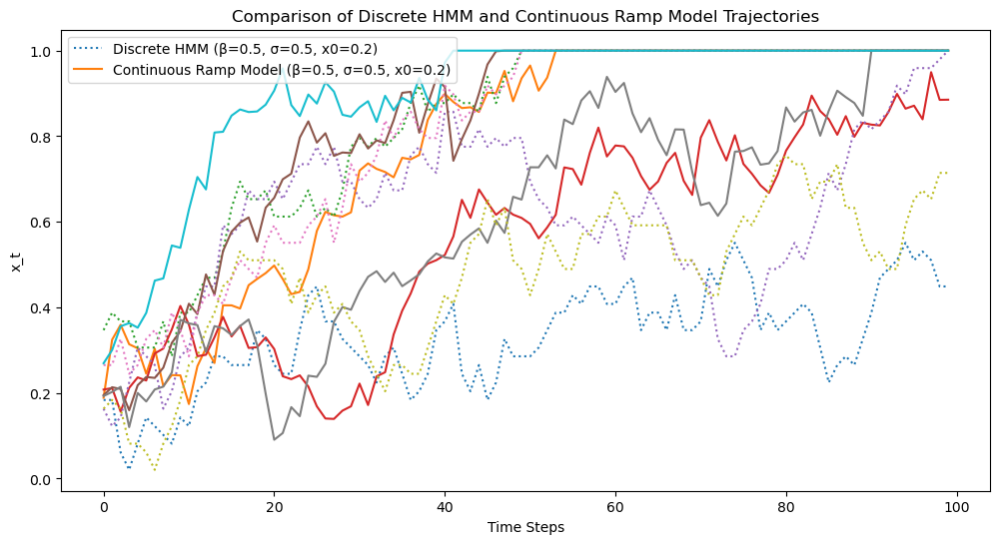

In [256]:
# Function to simulate the continuous ramp model
def simulate_continuous_ramp(beta=0.5, sigma=0.5, dt=0.01, x0=0.2, num_steps=100):
    ramp = models.RampModel(beta, sigma, x0, dt=dt)
    _, xs, _ = ramp.simulate(Ntrials=1, T=num_steps, get_rate=True)
    return xs[0]

# Parameters
K = 50
beta = 0.5
dt = 0.01
sigma = 0.5
x0 = 0.2
num_steps = 100
num_trials = 5
Rh = 50

# Form the transition matrix and initial state distribution
T = ramp_transition_matrix(beta=beta, dt=dt, sigma=sigma, K=K)
pi = ramp_initial_state_distribution(x0=x0, sigma=sigma, dt=dt, K=K)

# Simulate and plot several trials of both models
plt.figure(figsize=(12, 6))

for trial in range(num_trials):
    # Simulate the Markov chain
    discrete_chain = simulate_markov_chain(T, pi, num_steps=num_steps)
    discrete_x_t = np.array(discrete_chain) / (K - 1)

    # Simulate the continuous ramp model
    continuous_x_t = simulate_continuous_ramp(beta=beta, sigma=sigma, dt=dt, x0=x0, num_steps=num_steps)

    # Plot the trajectories
    plt.plot(discrete_x_t, label=f'Discrete HMM (β={beta}, σ={sigma}, x0={x0})' if trial == 0 else "", linestyle='dotted')
    plt.plot(continuous_x_t, label=f'Continuous Ramp Model (β={beta}, σ={sigma}, x0={x0})' if trial == 0 else "")

plt.xlabel('Time Steps')
plt.ylabel('x_t')
plt.title('Comparison of Discrete HMM and Continuous Ramp Model Trajectories')
plt.legend(loc='upper left')
plt.show()

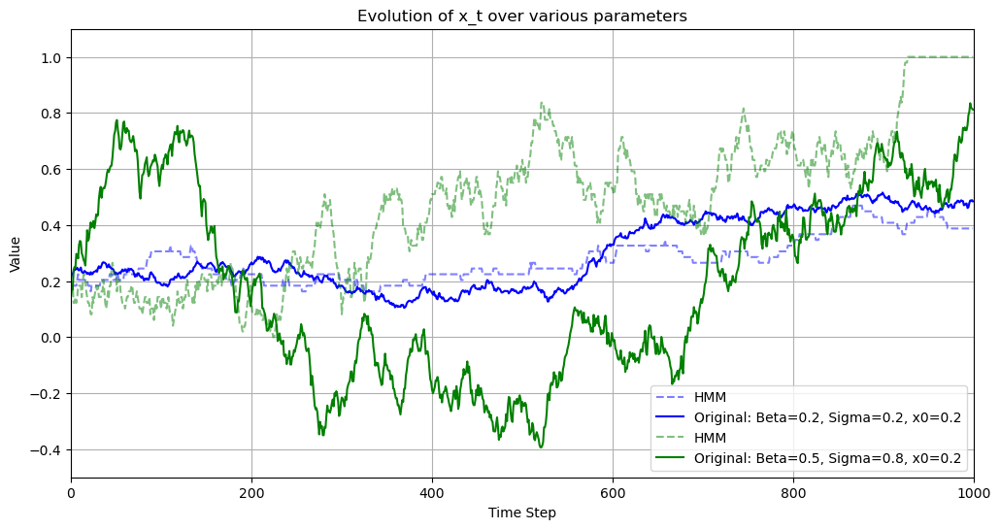

'HIGH SIGMA IS POOR PERFORMANCE'

In [257]:
# Dan's code

# Function to create the Tau matrix and simulate HMM
def plot_xt_ramp_hmm(K, T, beta, sigma, dt, x0):
    s = np.linspace(0, K - 1, K)
    x_t_options = s / (K - 1)
    Tau = np.zeros((K, K))

    # Generating the Tau matrix
    for i in range(K):
        if i != K - 1:
            for j in range(K):
                if j == 0:
                    interval = [j, (j + 0.5) / (K - 1)]
                elif j == K - 1:
                    interval = [(j - 0.5) / (K - 1), j]
                else:
                    interval = [(j - 0.5) / (K - 1), (j + 0.5) / (K - 1)]
                cdf_a = norm.cdf(interval[0], loc=i / (K - 1) + beta * dt, scale=sigma * np.sqrt(dt))
                cdf_b = norm.cdf(interval[1], loc=i / (K - 1) + beta * dt, scale=sigma * np.sqrt(dt))
                Tau[i][j] = cdf_b - cdf_a
        else:
            Tau[i][K - 1] = 1

    # Ensuring Tau rows sum to 1
    Tau = Tau / Tau.sum(axis=1)[:, np.newaxis]

    # Forming the initial distribution s_0
    s_0 = np.zeros(K)
    for j in range(K):
        if j == 0:
            interval = [j, (j + 0.5) / (K - 1)]
        elif j == K - 1:
            interval = [(j - 0.5) / (K - 1), j]
        else:
            interval = [(j - 0.5) / (K - 1), (j + 0.5) / (K - 1)]
        cdf_a = norm.cdf(interval[0], loc=x0, scale=sigma * np.sqrt(dt))
        cdf_b = norm.cdf(interval[1], loc=x0, scale=sigma * np.sqrt(dt))
        s_0[j] = cdf_b - cdf_a

    s_0 /= s_0.sum()

    # Simulating the Markov chain
    states = np.zeros(T, dtype=int)
    states[0] = np.random.choice(np.arange(K), p=s_0)

    for t in range(1, T):
        states[t] = np.random.choice(np.arange(K), p=Tau[states[t - 1]])

    states = states.astype(np.float64) / (K - 1)

    return np.linspace(0, T - 1, T), states, Tau, s_0

# Function to plot combined x_t evolutions
def plot_combined_x_evolutions(Ntrials=1, T=1000, Rh=50, isi_gamma_shape=None, Rl=None, dt=0.001):
    # Define parameter sets
    params = [
        # {'beta': 0.8, 'sigma': 0.2, 'x0': 0.2},
        {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2},
        # {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2},
        {'beta': 0.5, 'sigma': 0.8, 'x0': 0.2},
        # {'beta': 0.5, 'sigma': 0.2, 'x0': 0.8}
    ]
    colors = ['b', 'g', 'r', 'c', 'm']  # Assign a color for each parameter set

    plt.figure(figsize=(12, 6))  # Create a new figure with a specific size
    ax = plt.gca()  # Get the current Axes instance

    # Loop through each set of parameters
    for idx, param in enumerate(params):
        ramp = models.RampModel(beta=param['beta'], sigma=param['sigma'], x0=param['x0'], Rh=Rh, isi_gamma_shape=isi_gamma_shape, Rl=Rl, dt=dt)
        _, xs, _ = ramp.simulate(Ntrials=Ntrials, T=T, get_rate=True)

        # Loop through each trial and plot its evolution
        for trial_index, data in enumerate(xs):
            t_values, states, _, _ = plot_xt_ramp_hmm(K=50, T=T, beta=param['beta'], sigma=param['sigma'], dt=dt, x0=param['x0'])
            ax.plot(t_values, states, linestyle="dashed", color=colors[idx], alpha=0.5, label = "HMM")
            ax.plot(np.arange(T), data, color=colors[idx], label=f"Original: Beta={param['beta']}, Sigma={param['sigma']}, x0={param['x0']}" if trial_index == 0 else "")

    ax.set_xlabel('Time Step')  # Label the x-axis
    ax.set_ylabel('Value')  # Label the y-axis
    ax.set_title('Evolution of x_t over various parameters')  # Set the title of the plot
    ax.legend()  # Add a legend to identify the parameter sets
    ax.grid(True)  # Enable grid for better readability
    ax.set_xlim([0, T])  # Ensure all lines cover the same range of x
    ax.set_ylim([-0.5, 1.1])  # Set y-axis limits to standardize across plots

    plt.show()  # Display the plot

# Example usage
plot_combined_x_evolutions()


"""HIGH SIGMA IS POOR PERFORMANCE"""


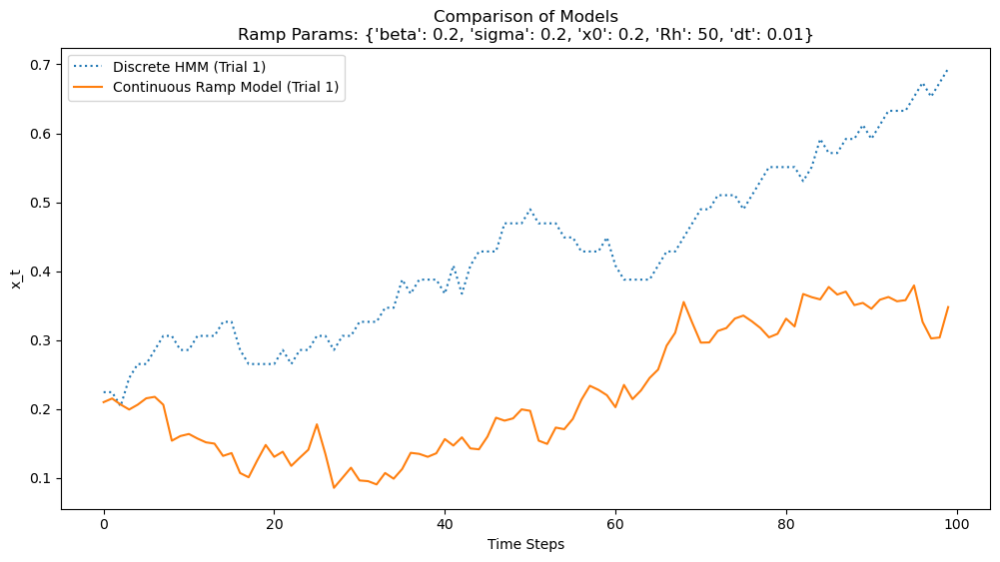

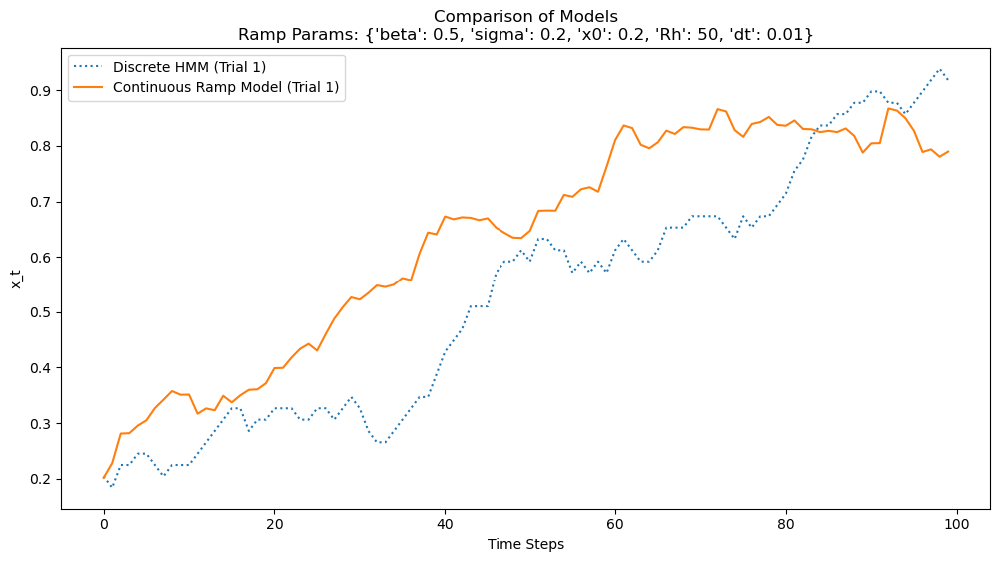

In [258]:


# Function to simulate the continuous ramp model
def simulate_continuous_ramp(beta=0.5, sigma=0.5, dt=0.01, x0=0.2, num_steps=100):
    ramp = models.RampModel(beta, sigma, x0, dt=dt)
    _, xs, _ = ramp.simulate(Ntrials=1, T=num_steps, get_rate=True)
    return xs[0]



# Parameters
K = 50
dt = 0.01
num_steps = 100
num_trials = 1

# Define parameter sets
ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 5.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 0.2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50, 'dt': 0.01}
]

# Iterate through parameter sets and simulate models
for ramp_params in ramp_params_list:
    # Form the transition matrix and initial state distribution for the ramp model
    T = ramp_transition_matrix(beta=ramp_params['beta'], dt=ramp_params['dt'], sigma=ramp_params['sigma'], K=K)
    pi = ramp_initial_state_distribution(x0=ramp_params['x0'], sigma=ramp_params['sigma'], dt=ramp_params['dt'], K=K)

    plt.figure(figsize=(12, 6))

    for trial in range(num_trials):
        # Simulate the Markov chain for the ramp model
        discrete_chain = simulate_markov_chain(T, pi, num_steps=num_steps)
        discrete_x_t = np.array(discrete_chain) / (K - 1)

        # Simulate the continuous ramp model
        continuous_params = {key: ramp_params[key] for key in ['beta', 'sigma', 'dt', 'x0']}
        continuous_x_t = simulate_continuous_ramp(**continuous_params, num_steps=num_steps)

        # Plot the trajectories
        plt.plot(discrete_x_t, label=f'Discrete HMM (Trial {trial + 1})' if trial == 0 else "", linestyle='dotted')
        plt.plot(continuous_x_t, label=f'Continuous Ramp Model (Trial {trial + 1})' if trial == 0 else "")

    plt.xlabel('Time Steps')
    plt.ylabel('x_t')
    plt.title(f'Comparison of Models\nRamp Params: {ramp_params}')
    plt.legend(loc='upper left')
    plt.show()
    #the continuous model is 


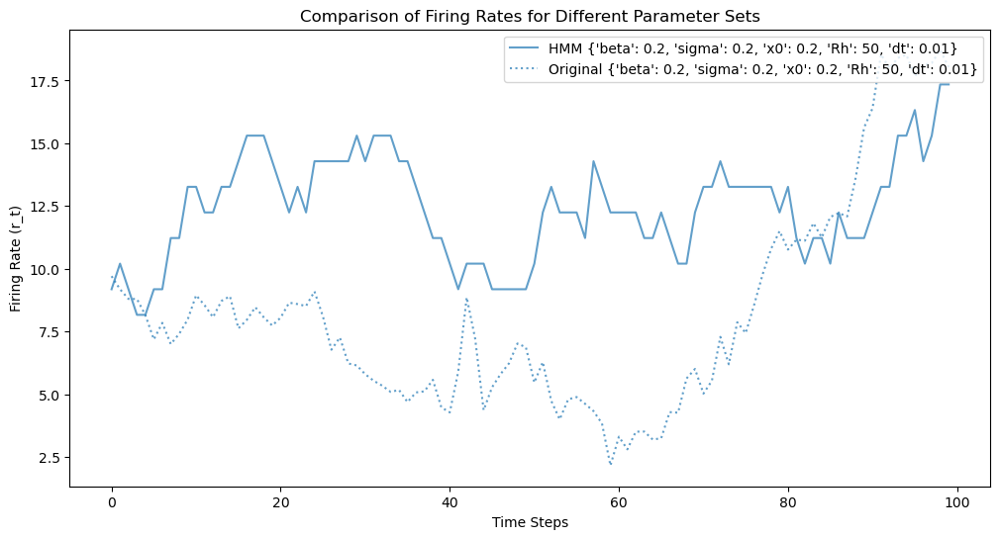

'r_t = R_h [x_t]'

In [259]:
# Function to simulate the continuous ramp model
def simulate_continuous_ramp(beta=0.5, sigma=0.5, dt=0.01, x0=0.2, num_steps=100):
    ramp = models.RampModel(beta, sigma, x0, dt=dt)
    _, xs, _ = ramp.simulate(Ntrials=1, T=num_steps, get_rate=True)
    return xs[0]

# Function to simulate the Markov chain
def simulate_markov_chain(T, pi, num_steps=100):
    K = len(pi)
    states = np.arange(K)
    current_state = np.random.choice(states, p=pi)
    chain = [current_state]

    for _ in range(num_steps - 1):
        current_state = np.random.choice(states, p=T[current_state])
        chain.append(current_state)

    return chain

# Function to form the transition matrix for the Markov chain
def ramp_transition_matrix(beta=0.5, dt=0.01, sigma=0.5, K=50):
    mu = beta * dt
    variance = (sigma ** 2) * dt

    def gaussian_pdf(x, mu, variance):
        return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

    states = np.linspace(0, 1, K)
    T = np.zeros((K, K))

    for s in range(K):
        current_state_value = states[s]
        mu_s = current_state_value + mu

        for s_prime in range(K):
            next_state_value = states[s_prime]
            if s < K - 1:
                T[s, s_prime] = gaussian_pdf(next_state_value, mu_s, variance)

        if s < K - 1:
            T[s, :] /= np.sum(T[s, :])

    T[K-1, K-1] = 1.0

    return T

# Function to form the initial state distribution
def ramp_initial_state_distribution(x0=0.2, sigma=0.5, dt=0.01, K=50):
    def gaussian_pdf(x, mu, variance):
        return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

    mu = x0
    variance = sigma ** 2 * dt
    states = np.linspace(0, 1, K)
    pi = gaussian_pdf(states, mu, variance)
    pi /= np.sum(pi)

    return pi

class HMMRampModel:
    def __init__(self, beta=0.5, sigma=0.5, x0=0.2, Rh=50, dt=0.01, K=50):
        self.beta = beta
        self.sigma = sigma
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.K = K
        self.T = self.create_transition_matrix()
        self.pi = self.ramp_initial_state_distribution()

    def create_transition_matrix(self):
        mu = self.beta * self.dt
        variance = (self.sigma ** 2) * self.dt

        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        states = np.linspace(0, 1, self.K)
        T = np.zeros((self.K, self.K))

        for s in range(self.K):
            current_state_value = states[s]
            mu_s = current_state_value + mu

            for s_prime in range(self.K):
                next_state_value = states[s_prime]
                if s < self.K - 1:
                    T[s, s_prime] = gaussian_pdf(next_state_value, mu_s, variance)

            if s < self.K - 1:
                T[s, :] /= np.sum(T[s, :])

        T[self.K-1, self.K-1] = 1.0

        return T

    def ramp_initial_state_distribution(self):
        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        mu = self.x0
        variance = self.sigma ** 2 * self.dt
        states = np.linspace(0, 1, self.K)
        pi = gaussian_pdf(states, mu, variance)
        pi /= np.sum(pi)

        return pi

    def simulate_spike_trains(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        spike_trains = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            spike_trains.append(self.calculate_spike_counts(np.array(chain) / (K - 1)))

        return np.array(spike_trains)

    def calculate_spike_counts(self, x_t): 
        r_t = self.Rh * np.maximum(0, x_t)  # Calculate the firing rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    def calculate_rates(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        rates = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t = np.array(chain) / (K - 1)
            r_t = self.Rh * np.maximum(0, x_t)
            rates.append(r_t)

        return np.array(rates)
    
    # This function gives x_t
    def simulate_x_t(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        x_t_trials = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t_trials.append(np.array(chain) / (K - 1)) # this np.array(chain) / (K - 1) is x_t

        return np.array(x_t_trials)

    # This function gives a single spike n_t
    def calculate_spike_counts(self, x_t):
        r_t = self.Rh * np.maximum(0, x_t)  # Calculate the firing rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    # This function gives rates as array r_t
    def calculate_rates(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        rates = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t = np.array(chain) / (K - 1)
            r_t = self.Rh * np.maximum(0, x_t)
            rates.append(r_t)

        return np.array(rates)

    # New function to simulate spike trains and return them as an array of n_t
    def simulate_spike_trains_array(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        spike_trains = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t = np.array(chain) / (K - 1)
            n_t = self.calculate_spike_counts(x_t)
            spike_trains.append(n_t)

        return np.array(spike_trains)
    
hmm_ramp_model = HMMRampModel(**ramp_params)

# Simulate and plot for the ramping model
spike_trains_ramp = hmm_ramp_model.simulate_spike_trains(num_steps=100, num_trials=10)

# Calculate and plot rates
rates_ramp = hmm_ramp_model.calculate_rates(num_steps=100, num_trials=10)
# print(rates_ramp)


ramp_params = {'beta': 0.5, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
hmm_ramp_model = HMMRampModel(**ramp_params)
# Simulate and plot for the ramping model
spike_trains_ramp = hmm_ramp_model.simulate_spike_trains(num_steps=100, num_trials=10)

# Parameters
K = 100
dt = 0.01
num_steps = 100
num_trials = 1

# Define parameter sets
ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 0.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.8, 'sigma': 0.4, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    # {'beta': 1.1, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
]

# Get the default color cycle
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Plot all trajectories on the same plot
plt.figure(figsize=(12, 6))

for idx, ramp_params in enumerate(ramp_params_list):
    color = default_colors[idx % len(default_colors)]

    # Create HMMRampModel instance
    hmm_ramp_model = HMMRampModel(**ramp_params)

    for trial in range(num_trials):
        # Calculate rates for HMM ramp model
        hmm_rates = hmm_ramp_model.calculate_rates(num_steps=num_steps, num_trials=1).flatten()

        # Simulate the continuous ramp model
        ramp = models.RampModel(**ramp_params)
        _, _, continuous_rates = ramp.simulate(Ntrials=1, T=num_steps, get_rate=True)
        continuous_rates = continuous_rates.flatten()

        # Plot the trajectories
        plt.plot(hmm_rates, color=color, alpha=0.7, label=f'HMM {ramp_params}' if trial == 0 else "")
        plt.plot(continuous_rates, color=color, alpha=0.7,linestyle='dotted', label=f'Original {ramp_params}' if trial == 0 else "")

# Customize and show plot
plt.xlabel('Time Steps')
plt.ylabel('Firing Rate (r_t)')
plt.title('Comparison of Firing Rates for Different Parameter Sets')
plt.legend(loc='upper right')
plt.show()

"""WHAT IS THE CONCLUSION HERE, AND ARENT WE SUPPOSED TO PLOT R_T instead of X_T"""
"""r_t = R_h [x_t]"""

***Order of magnitude of sigma to be stuck in initial state is $\frac{1}{K\sqrt{dt}}$***

***For small values of sigma the trajectories get stuck in the initial state because the gaussian transition probability variance will be too small to induce changes into different states***

### Task 2.2:
**Forming an HMM approximation to the step model**

Intuitively, given its discrete (binary) rate levels, the step model can actually be exactly formulated as a discrete state HMM.<br>

1) First, implement a *time-homogeneous* Markov chain representing the step state with two states. How would you choose the transition probabilities?<br> (Hint: think of the
parameter $p$ of the Negative Binomial distribution, which in terms of $m$ and $r$ is given by $r/(m+r)$).

2) Simulate the Markov chain for several trials and plot the corresponding $x_t$ trajectories.

3) Also evaluate the jump times (time-steps) and make histograms of these jump times. How do the histograms appear? Do they resemble any of the histograms of jump times<br> (meaning histograms
corresponding to different values of $m$ and $r$)  you made in Week 1?

4) What do you think is wrong with the 2-state Markov chain approximation to the step model? **§**



5) Read about the [Negative Binomial distribution](https://en.wikipedia.org/wiki/Negative_binomial_distribution) and its "meaning" (*for the case of positive integer $r$*), to get clues for constucting an exact Markov Chain formulation of the step model (Hint: use $r + 1$ states!).**§§**

6) Again, simulate several trials of this new chain, plot state trajectories, and form histograms of jump times for different values of $r$. How do these compare with the histograms you obtained in Week 1 for jump times of the original step model?

**§:** An exact fomrulation of the step model is possible as a *time-inhomogenous* 2-state Markov chain (MC). You can experiment with that of course (this is optional). However, we will be using a time-homogenous HMM, and so in the above sub-task I am asking you to construct a time-homogenous Markov chain. If you did implement a time-inhomogeneous MC formulation, feel free to write about it in your final report. But make sure you do investigate the time-homogeneous version (which is in general not a correct formulation of the original model) as well, and answer the questions for that (too).

**§§:** The suggested MC implementation of the step model will differ from the Week 1 step model, in which step time had the distribution $\mathrm{NB}(\tau | m, r)$ by a time shift by $r$ time-steps.

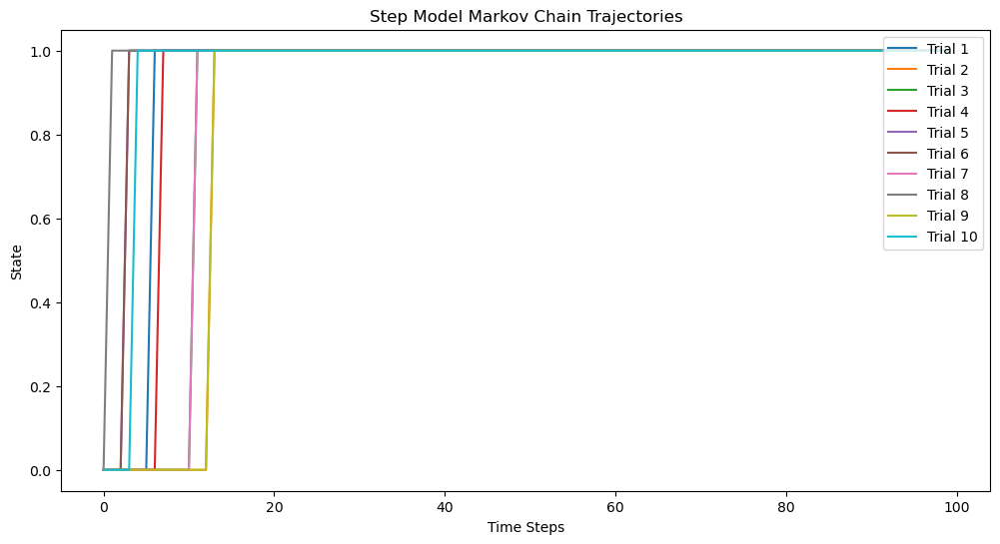

'This model clearly fails to produce the step at time step 50'

In [260]:


# Parameters
r = 10  # Number of successes
m = 50  # Mean number of time steps between jumps
p = r / (m + r)  # Transition probability from "no jump" to "jump"
num_steps = 100  # Number of time steps in each trial
num_trials = 10  # Number of trials

# Transition matrix
T = np.array([
    [1 - p, p],  # Transitions from "no jump" state
    [0, 1]  # Transitions from "jump" state
])

# Function to simulate the Markov chain
def simulate_step_markov_chain(T, num_steps, num_trials):
    states = [0, 1]  # 0: "no jump", 1: "jump"
    trajectories = np.zeros((num_trials, num_steps))

    for trial in range(num_trials):
        current_state = 0  # Start in the "no jump" state
        for step in range(num_steps): # for each time step
            trajectories[trial, step] = current_state #fill trajectories matrix 
            current_state = np.random.choice(states, p=T[current_state]) #Transition probability based on appropriate row of transition matrix 

    return trajectories

# Simulate the Markov chain
trajectories = simulate_step_markov_chain(T, num_steps, num_trials)

# Plot the trajectories
plt.figure(figsize=(12, 6))
for trial in range(num_trials):
    plt.plot(trajectories[trial], label=f'Trial {trial + 1}')

plt.xlabel('Time Steps')
plt.ylabel('State')
plt.title('Step Model Markov Chain Trajectories')
plt.legend(loc='upper right')
plt.show()

"""This model clearly fails to produce the step at time step 50"""

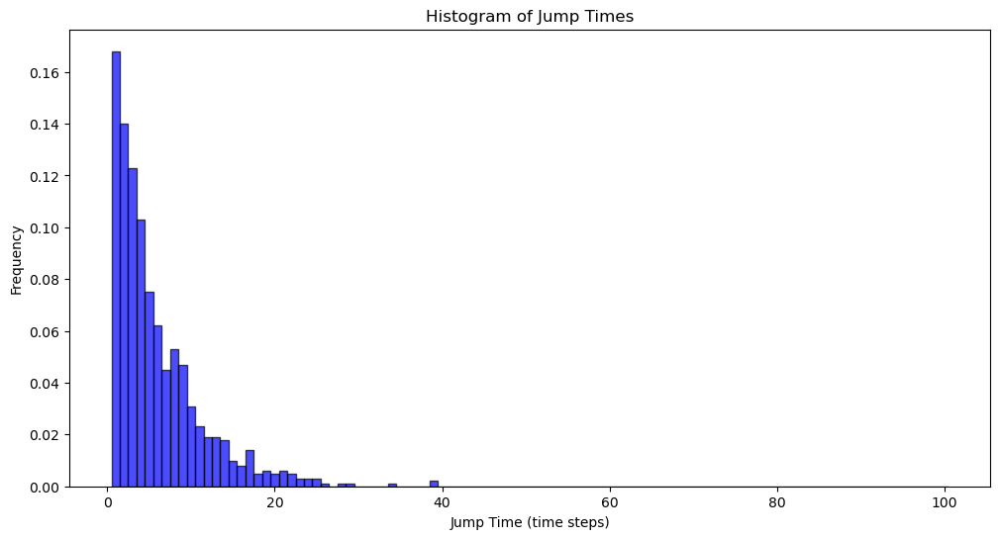

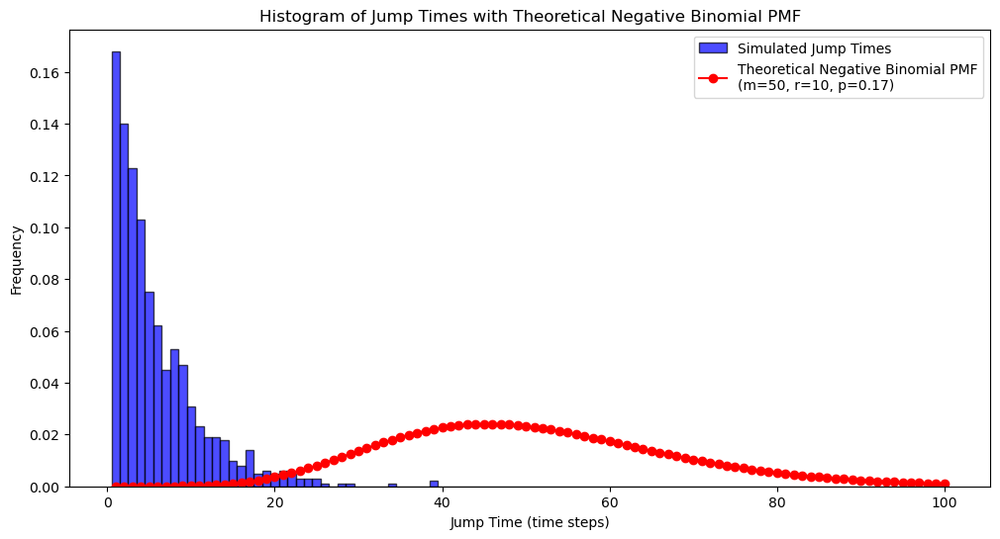

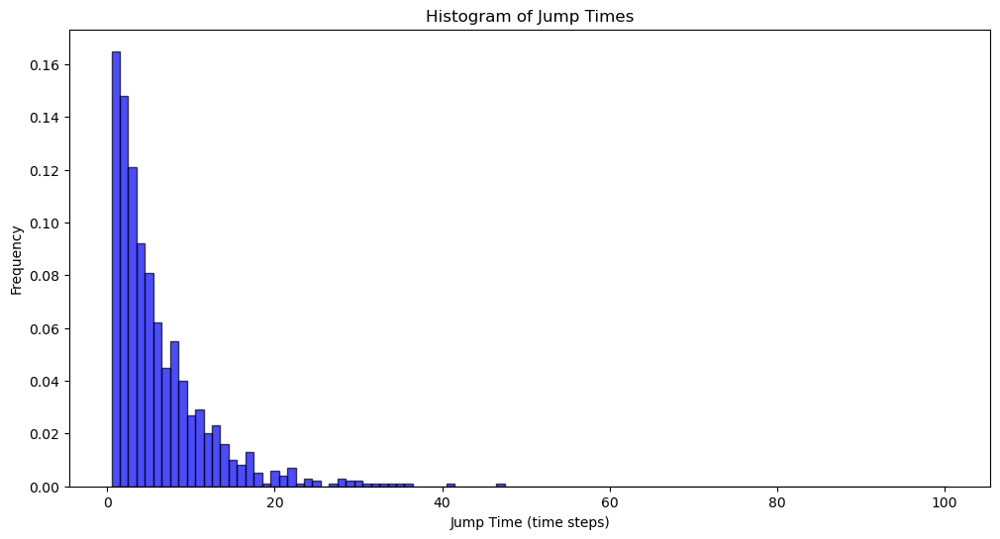

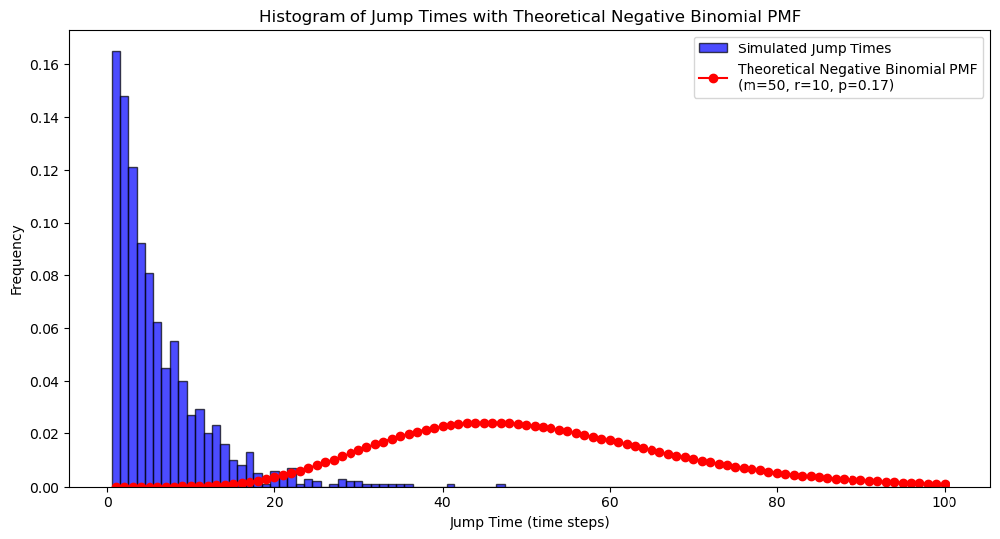

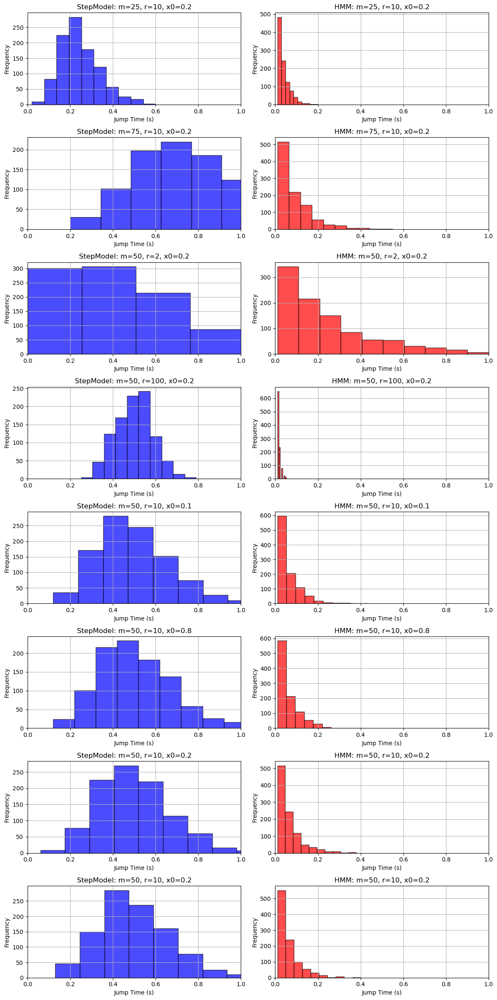

In [261]:
# 2 state, wrong model
import scipy.stats as stats
# Parameters
r = 10  # Number of successes
m = 50  # Mean number of time steps between jumps
p = r / (m + r)  # Transition probability from "no jump" to "jump"
num_steps = 100  # Number of time steps in each trial
num_trials = 1000  # Number of trials

# Transition matrix
T = np.array([
    [1 - p, p],  # Transitions from "no jump" state
    [0, 1]  # Transitions from "jump" state
])

# Function to simulate the Markov chain and record jump times
def simulate_step_markov_chain(T, num_steps, num_trials):
    states = [0, 1]  # 0: "no jump", 1: "jump"
    jump_times = []

    for trial in range(num_trials):
        current_state = 0  # Start in the "no jump" state
        for step in range(num_steps):
            if current_state == 1:
                break
            current_state = np.random.choice(states, p=T[current_state])
            if current_state == 1:
                jump_times.append(step + 1)  # Record the jump time (1-based index)

    return jump_times

# Simulate the Markov chain and get jump times
jump_times = simulate_step_markov_chain(T, num_steps, num_trials)

# Plot histogram of jump times
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times')
plt.show()

# Theoretical Negative Binomial Distribution
k = np.arange(1, num_steps + 1)
theoretical_pmf = stats.nbinom.pmf(k - 1, r, p)

# Plot histogram and theoretical PMF for comparison
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black', label='Simulated Jump Times')
plt.plot(k, theoretical_pmf, 'r-', marker='o', label=f'Theoretical Negative Binomial PMF\n(m={m}, r={r}, p={p:.2f})')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times with Theoretical Negative Binomial PMF')
plt.legend()
plt.show()


# 2 state, wrong model

# Parameters
r = 10  # Number of successes
m = 50  # Mean number of time steps between jumps
p = r / (m + r)  # Transition probability from "no jump" to "jump"
num_steps = 100  # Number of time steps in each trial
num_trials = 1000  # Number of trials

# Function to create the transition matrix
def create_transition_matrix(r, p):
    return np.array([
        [1 - p, p],
        [0, 1]
    ])

# Function to simulate the Markov chain and record jump times
def simulate_step_markov_chain(T, num_steps, num_trials):
    states = [0, 1]  # 0: "no jump", 1: "jump"
    jump_times = []
    for trial in range(num_trials):
        current_state = 0  # Start in the "no jump" state
        for step in range(num_steps):
            if current_state == 1:
                break
            current_state = np.random.choice(states, p=T[current_state])
            if current_state == 1:
                jump_times.append(step + 1)  # Record the jump time (1-based index)
    return jump_times

# Simulate the Markov chain and get jump times
T = create_transition_matrix(r, p)
jump_times = simulate_step_markov_chain(T, num_steps, num_trials)

# Plot histogram of jump times
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times')
plt.show()

# Theoretical Negative Binomial Distribution
k = np.arange(1, num_steps + 1)
theoretical_pmf = stats.nbinom.pmf(k - 1, r, p)

# Plot histogram and theoretical PMF for comparison
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black', label='Simulated Jump Times')
plt.plot(k, theoretical_pmf, 'r-', marker='o', label=f'Theoretical Negative Binomial PMF\n(m={m}, r={r}, p={p:.2f})')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times with Theoretical Negative Binomial PMF')
plt.legend()
plt.show()

# Plot HMM jump histogram
def plot_hmm_jump_histogram(ax, m, r, x0, Rh, Ntrials=1000, steps=100):
    p = r / (m + r)
    T_matrix = create_transition_matrix(r, p)
    jump_times = simulate_step_markov_chain(T_matrix, steps, Ntrials)
    ax.hist(np.array(jump_times) / steps, bins=10, color='red', alpha=0.7, edgecolor='black')
    ax.set_xlabel('Jump Time (s)')
    ax.set_ylabel('Frequency')
    ax.set_title(f'HMM: m={m}, r={r}, x0={x0}')
    ax.grid(True)
    ax.set_xlim([0, 1])

# Plot StepModel jump histogram
def plot_stepmodel_jump_histogram(ax, m, r, x0, Rh, Ntrials=1000, steps=100):
    step_model = models.StepModel(m, r, x0, Rh)
    spikes_step, jumps_step, rates_step = step_model.simulate(Ntrials=Ntrials, T=steps, get_rate=True)
    ax.hist(np.array(jumps_step) / steps, bins=10, color='blue', alpha=0.7, edgecolor='black')
    ax.set_xlabel('Jump Time (s)')
    ax.set_ylabel('Frequency')
    ax.set_title(f'StepModel: m={m}, r={r}, x0={x0}')
    ax.grid(True)
    ax.set_xlim([0, 1])

# Parameters to test
params = [
    {'m': 25, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 2, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 100, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.8, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 20},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 80}
]

# Create a figure and set of subplots
fig, axs = plt.subplots(len(params), 2, figsize=(12, 24))

# Generate plots for different parameters
for idx, param in enumerate(params):
    plot_stepmodel_jump_histogram(axs[idx, 0], **param, Ntrials=1000, steps=100)
    plot_hmm_jump_histogram(axs[idx, 1], **param, Ntrials=1000, steps=100)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()



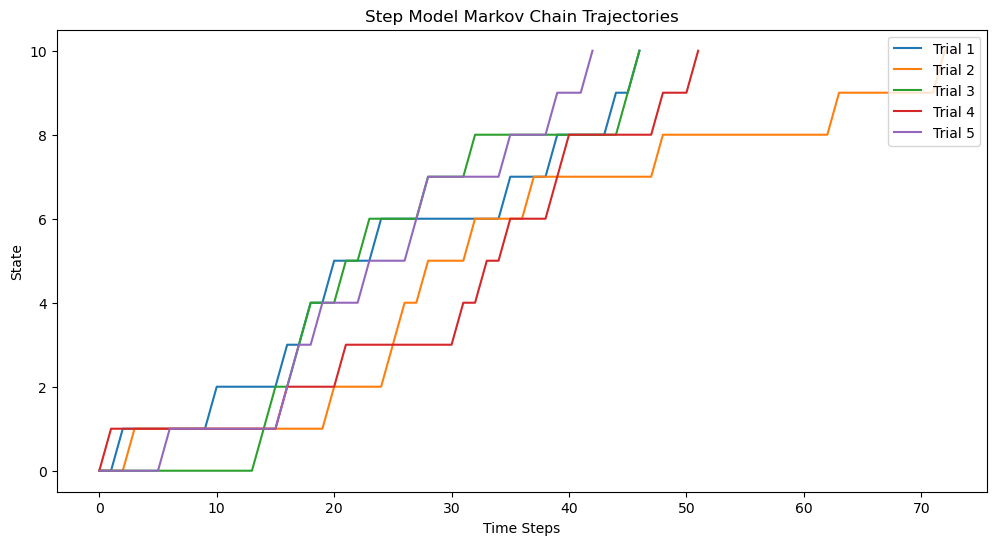

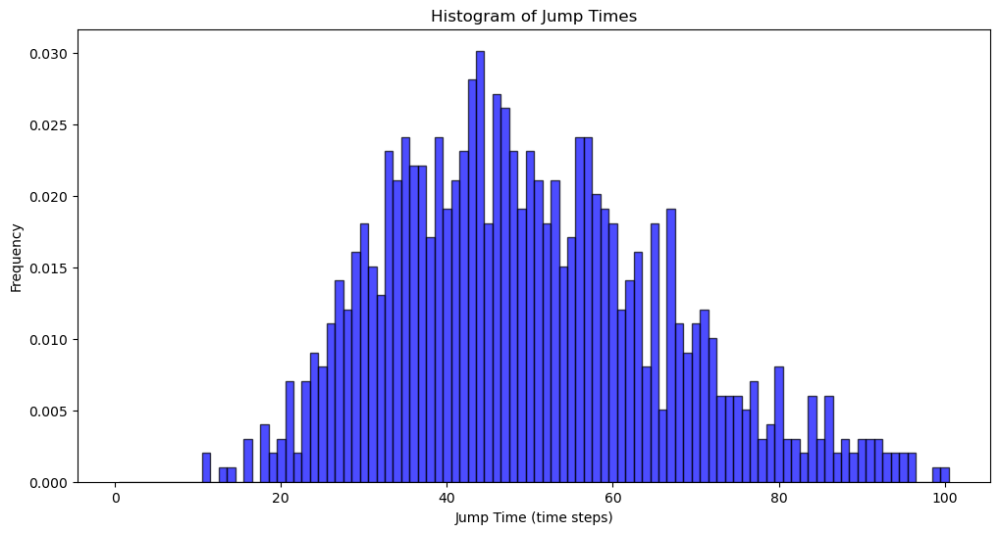

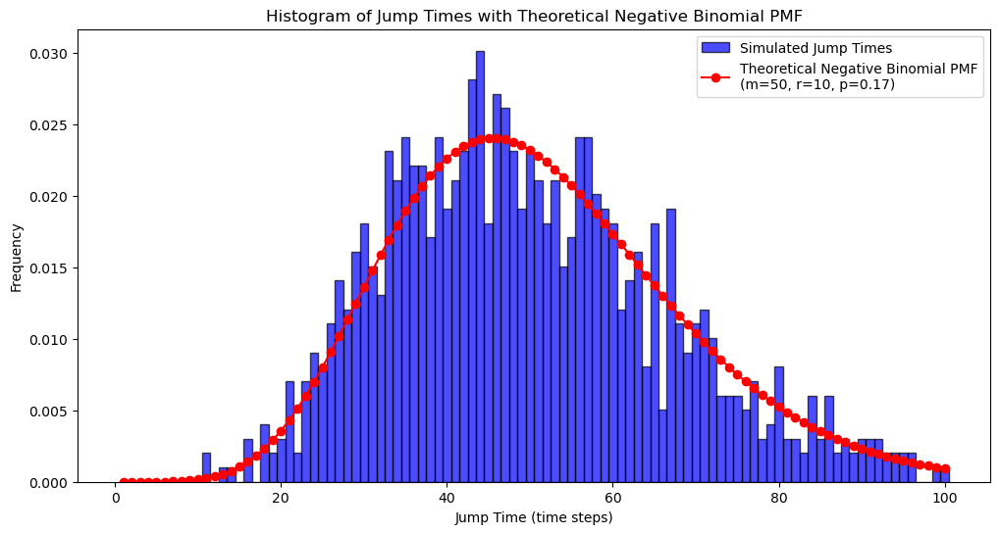

In [262]:
# fixing the transition matrix
# Parameters
r = 10  # Number of successes needed
m = 50  # Mean number of time steps between jumps
p = r / (m + r)
num_steps = 100  # Number of time steps in each trial
num_trials = 1000  # Number of trials

# Transition matrix for the r+1-state HMM
def create_transition_matrix(r, p):
    T = np.zeros((r + 1, r + 1))
    for i in range(r):
        T[i, i] = 1 - p  # Probability of staying in the same state
        T[i, i + 1] = p  # Probability of moving to the next state
    T[r, r] = 1  # Once in the final state, stay there
    return T

# Create the transition matrix
T = create_transition_matrix(r, p)

# Initial state probability vector
pi0 = np.zeros(r + 1)
pi0[0] = 1  # 100% probability of starting in state 0
pi_r = pi0 @ np.linalg.matrix_power(T, r)


# Function to simulate the r+1-state Markov chain and record jump times
def simulate_step_markov_chain(T, pi0, num_steps, num_trials):
    states = np.arange(len(T))  # Define the states
    jump_times = []

    for trial in range(num_trials):
        current_state = np.random.choice(states, p=pi0)  # Start from initial state distribution
        for step in range(num_steps):
            if current_state == r:
                break
            current_state = np.random.choice(states, p=T[current_state])
            if current_state == r:
                jump_times.append(step + 1)  # Record the jump time (1-based index)
                break  # Stop after the first jump

    return jump_times

# Simulate the Markov chain and get jump times
jump_times = simulate_step_markov_chain(T, pi_r, num_steps, num_trials)

# Plot state trajectories for a few trials
plt.figure(figsize=(12, 6))
for trial in range(5):
    states = np.arange(len(T))
    trajectory = []
    current_state = 0
    for step in range(num_steps):
        trajectory.append(current_state)
        if current_state == r:
            break
        current_state = np.random.choice(states, p=T[current_state])
    plt.plot(trajectory, label=f'Trial {trial + 1}')
plt.xlabel('Time Steps')
plt.ylabel('State')
plt.title('Step Model Markov Chain Trajectories')
plt.legend(loc='upper right')
plt.show()

# Plot histogram of jump times
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times')
plt.show()

# Theoretical Negative Binomial Distribution
k = np.arange(1, num_steps + 1)
theoretical_pmf = stats.nbinom.pmf(k - 1, r, p)

# Plot histogram and theoretical PMF for comparison
plt.figure(figsize=(12, 6))
plt.hist(jump_times, bins=range(1, num_steps + 2), align='left', density=True, alpha=0.7, color='b', edgecolor='black', label='Simulated Jump Times')
plt.plot(k, theoretical_pmf, 'r-', marker='o', label=f'Theoretical Negative Binomial PMF\n(m={m}, r={r}, p={p:.2f})')
plt.xlabel('Jump Time (time steps)')
plt.ylabel('Frequency')
plt.title('Histogram of Jump Times with Theoretical Negative Binomial PMF')
plt.legend()
plt.show()


In [263]:
# UPDATED: Class for HMM approximation of the stepping model
class HMMStepModel:
    def __init__(self, m=50, r=10, x0=0.2, Rh=50, dt=0.01):
        self.m = m
        self.r = r
        self.p = r / (m + r)
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.T = self.create_transition_matrix()

    def create_transition_matrix(self):
        T = np.zeros((self.r + 1, self.r + 1))
        for i in range(self.r):
            T[i, i] = 1 - self.p  # Probability of staying in the same state
            T[i, i + 1] = self.p  # Probability of moving to the next state
        T[self.r, self.r] = 1  # Once in the final state, stay there
        return T

    def simulate_jump_times(self, num_steps, num_trials):
        states = np.arange(len(self.T))  # Define the states
        jump_times = []

        pi0 = np.zeros(self.r + 1)
        pi0[0] = 1  # Initial state probability vector [1, 0, 0, ..., 0]

        pi_r = pi0 @ np.linalg.matrix_power(self.T, self.r)

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=pi_r)  # Start using the rth state probability
            for step in range(num_steps):
                if current_state == self.r:
                    jump_times.append(step + 1)  # Record the jump time (1-based index)
                    break  # Stop after the first jump
                current_state = np.random.choice(states, p=self.T[current_state])
            else:
                jump_times.append(num_steps)  # Record the last time step if no jump occurs

        # Ensure jump_times has length of num_trials
        assert len(jump_times) == num_trials, f"Length of jump_times ({len(jump_times)}) does not match num_trials ({num_trials})"

        return jump_times

    def calculate_spike_counts(self, jump_time, num_steps):
        r_t = np.ones(num_steps) * self.x0 * self.Rh  # Initialize with pre-jump rate
        if jump_time < num_steps:
            r_t[jump_time:] = self.Rh  # Update to post-jump rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    def simulate_spike_trains(self, jump_times, num_steps, num_trials):
        spike_trains = []
        for trial in range(num_trials):
            spike_train = self.calculate_spike_counts(jump_times[trial], num_steps)
            spike_trains.append(spike_train)
        return np.array(spike_trains)

# Example usage with parameters
step_params = {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}


# Initialize the models
hmm_step_model = HMMStepModel(**step_params)


# Simulate and plot for the stepping model
jump_times_step = hmm_step_model.simulate_jump_times(num_steps=100, num_trials=10)
print(jump_times_step)
spike_trains_step = hmm_step_model.simulate_spike_trains(jump_times_step, num_steps=100, num_trials=10)




[23, 53, 47, 70, 46, 32, 49, 58, 44, 48]


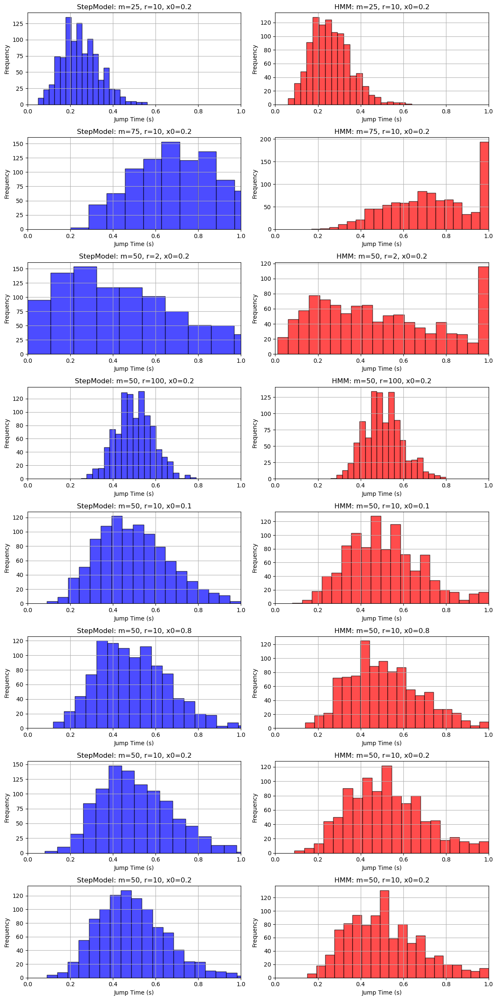

In [264]:
# Plot r+1 state HMM
def plot_hmm_jump_histogram(ax, hmm_step_model, Ntrials=1000, T=100):
    jump_times = hmm_step_model.simulate_jump_times(num_steps=T, num_trials=Ntrials)
    ax.hist(np.array(jump_times) / T, bins=20, color='red', alpha=0.7, edgecolor='black')
    ax.set_xlabel('Jump Time (s)')
    ax.set_ylabel('Frequency')
    ax.set_title(f'HMM: m={hmm_step_model.m}, r={hmm_step_model.r}, x0={hmm_step_model.x0}')
    ax.grid(True)
    ax.set_xlim([0, 1])

def plot_stepmodel_jump_histogram(ax, m, r, x0, Rh, Ntrials=1000, T=100):
    step_model = models.StepModel(m, r, x0, Rh)
    spikes_step, jumps_step, rates_step = step_model.simulate(Ntrials=Ntrials, T=T, get_rate=True)
    ax.hist(jumps_step / T, bins=20, color='blue', alpha=0.7, edgecolor='black')
    ax.set_xlabel('Jump Time (s)')
    ax.set_ylabel('Frequency')
    ax.set_title(f'StepModel: m={m}, r={r}, x0={x0}')
    ax.grid(True)
    ax.set_xlim([0, 1])


# Parameters to test
params = [
    {'m': 25, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 2, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 100, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.8, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 20},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 80}
]

# Create a figure and set of subplots
fig, axs = plt.subplots(len(params), 2, figsize=(12, 24))

# Generate plots for different parameters
for idx, param in enumerate(params):
    plot_stepmodel_jump_histogram(axs[idx, 0], **param, Ntrials=1000, T=100)
    hmm_param = param.copy()
    hmm_param['dt'] = 0.01  # Adding dt back for HMMStepModel
    hmm_step_model = HMMStepModel(**hmm_param)
    plot_hmm_jump_histogram(axs[idx, 1], hmm_step_model, Ntrials=1000, T=100)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

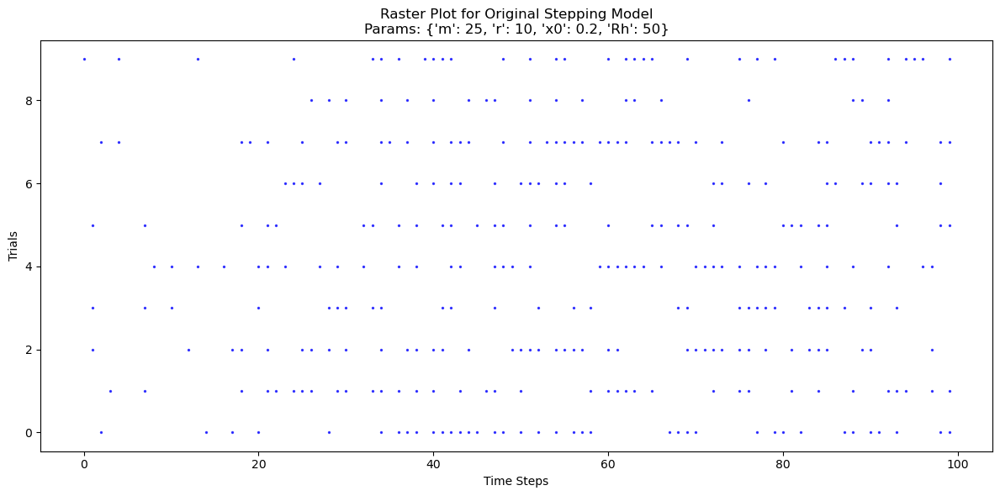

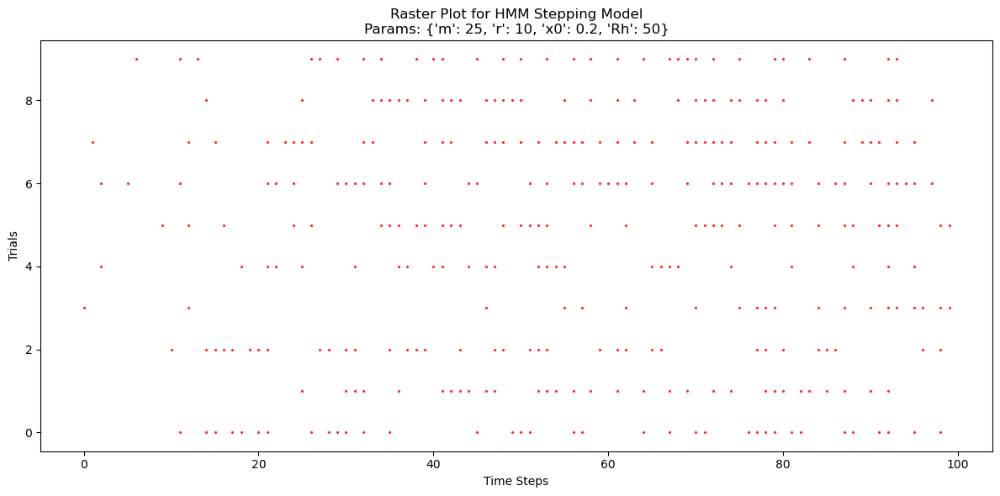

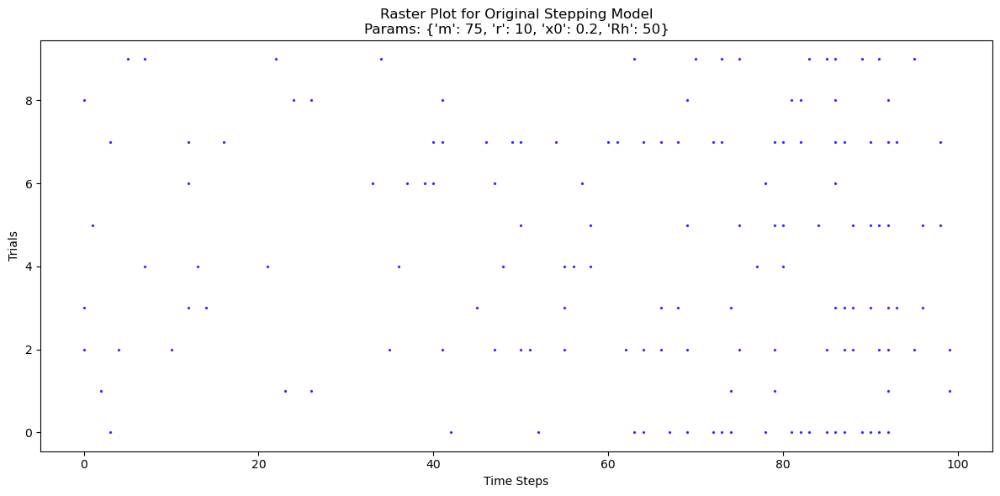

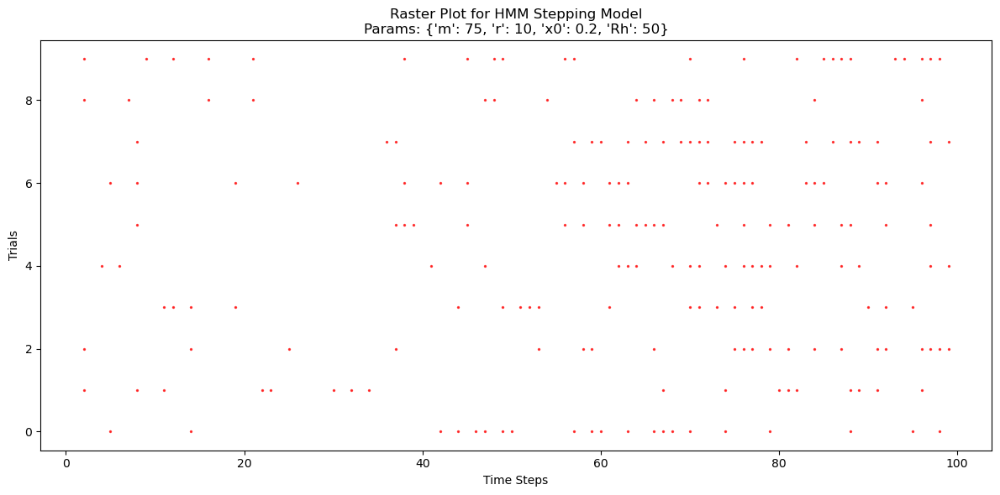

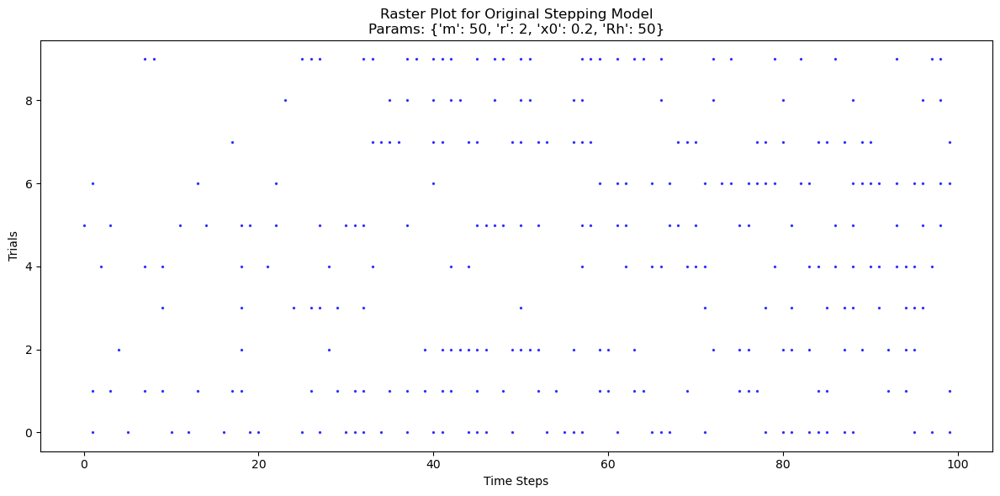

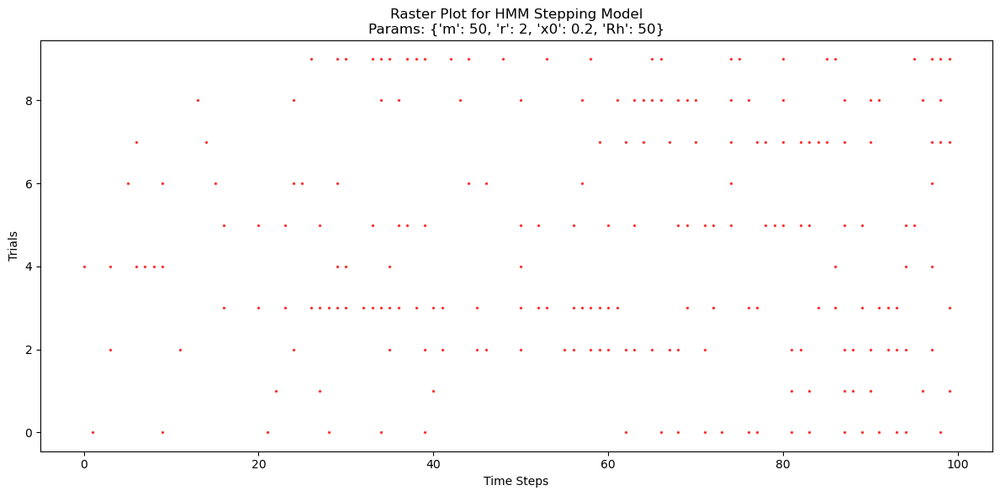

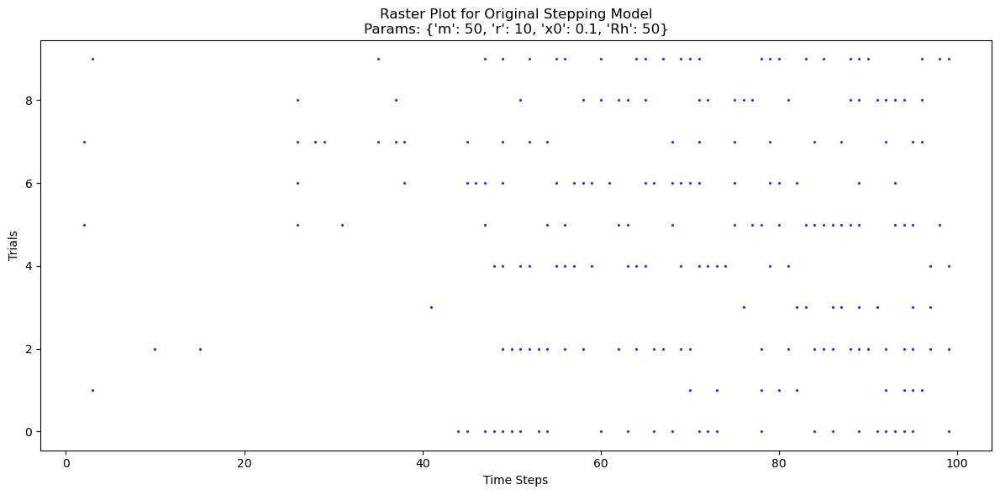

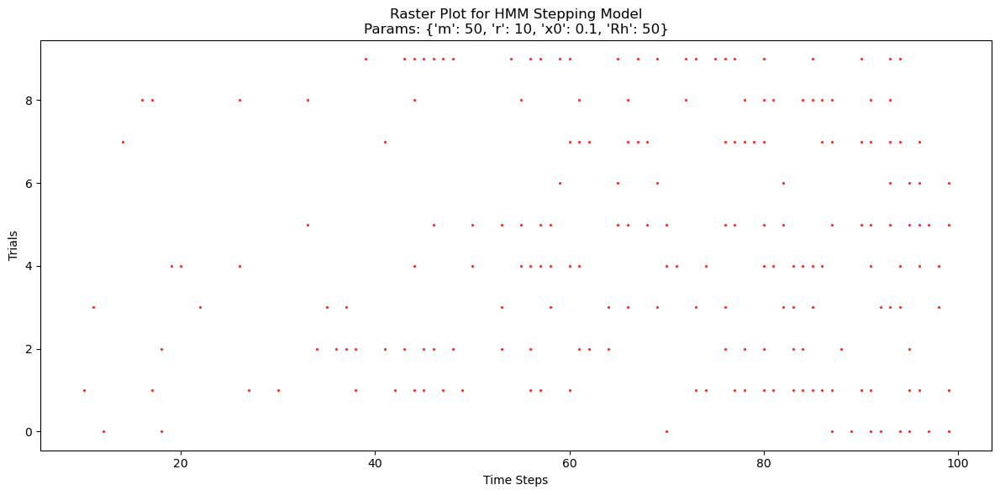

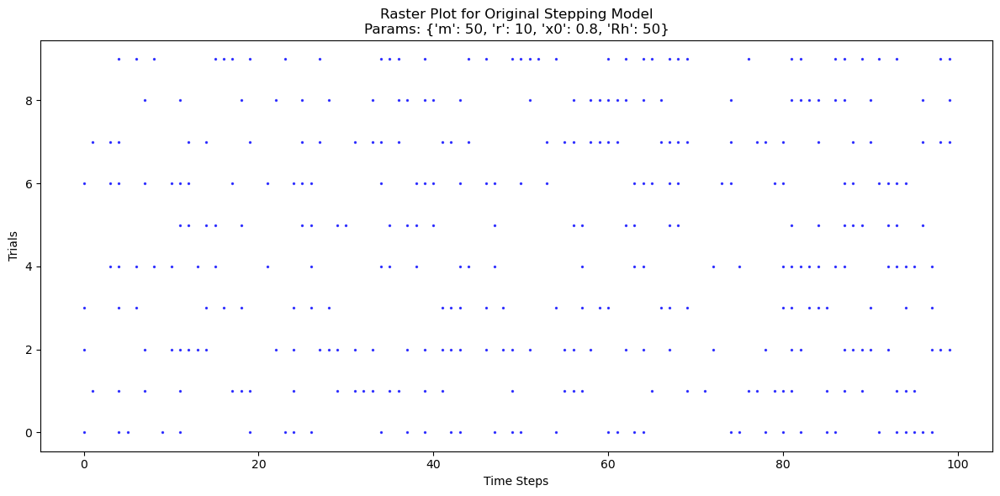

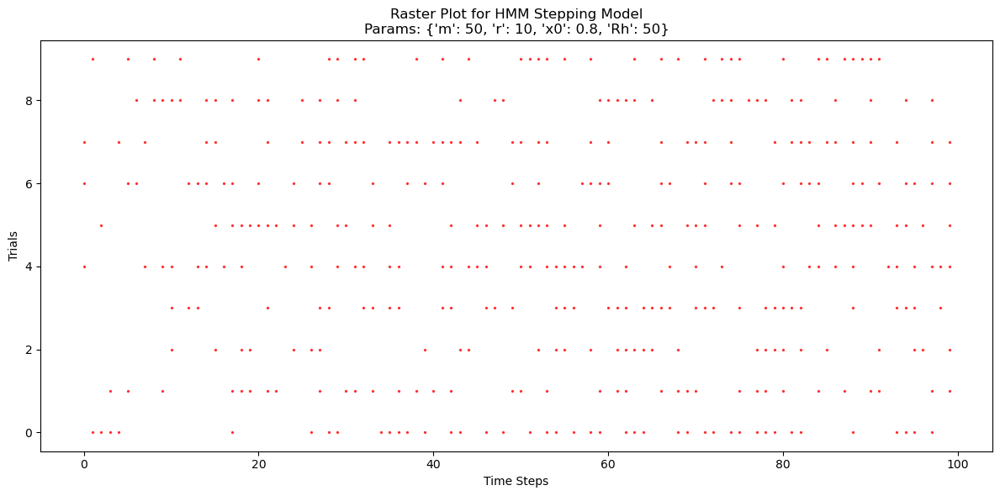

In [265]:
# Function to plot raster plots
def plot_raster(spike_trains, title, color):
    num_trials, num_steps = spike_trains.shape
    plt.figure(figsize=(12, 6))
    for trial in range(num_trials):
        spike_times = np.where(spike_trains[trial] > 0)[0]
        plt.scatter(spike_times, np.full_like(spike_times, trial), color=color, alpha=0.7, s=2)
    plt.title(title)
    plt.xlabel('Time Steps')
    plt.ylabel('Trials')
    plt.tight_layout()
    plt.show()

# Parameters to test
params_list = [
    {'m': 25, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 2, 'x0': 0.2, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50},
    {'m': 50, 'r': 10, 'x0': 0.8, 'Rh': 50}
]

# Simulation and plotting
num_steps = 100
num_trials = 10

for params in params_list:
    # Simulate and plot for the original stepping model
    step_model = models.StepModel(**params)
    spikes_step, jumps_step, rates_step = step_model.simulate(Ntrials=num_trials, T=num_steps, get_rate=True)
    plot_raster(spikes_step, f'Raster Plot for Original Stepping Model\nParams: {params}', color='blue')

    # Simulate and plot for the HMM stepping model
    hmm_step_model = HMMStepModel(**params)
    jump_times_step = hmm_step_model.simulate_jump_times(num_steps=num_steps, num_trials=num_trials)
    spike_trains_step = hmm_step_model.simulate_spike_trains(jump_times_step, num_steps=num_steps, num_trials=num_trials)
    plot_raster(spike_trains_step, f'Raster Plot for HMM Stepping Model\nParams: {params}', color='red')

In [266]:
"""TASK REMOVED"""

# Class for HMM approximation of the stepping model
class HMMStepModel:
    def __init__(self, m=50, r=10, x0=0.2, Rh=50, dt=0.01):
        self.m = m
        self.r = r
        self.p = r / (m + r)
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.T = self.create_transition_matrix()
        self.pi = self.initial_distribution()

    def create_transition_matrix(self):
        T = np.zeros((self.r + 1, self.r + 1))
        for i in range(self.r):
            T[i, i] = 1 - self.p  # Probability of staying in the same state
            T[i, i + 1] = self.p  # Probability of moving to the next state
        T[self.r, self.r] = 1  # Once in the final state, stay there
        return T

    def initial_distribution(self):
        pi0 = np.zeros(self.r + 1)
        pi0[0] = 1  # Initial state probability vector [1, 0, 0, ..., 0]
        pi_r = pi0 @ np.linalg.matrix_power(self.T, self.r)
        return pi_r

    def simulate_jump_times(self, num_steps, num_trials):
        states = np.arange(len(self.T))  # Define the states
        jump_times = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)  # Start using the initial distribution
            for step in range(num_steps):
                if current_state == self.r:
                    jump_times.append(step + 1)  # Record the jump time (1-based index)
                    break  # Stop after the first jump
                current_state = np.random.choice(states, p=self.T[current_state])
            else:
                jump_times.append(num_steps)  # Record the last time step if no jump occurs

        # Ensure jump_times has length of num_trials
        assert len(jump_times) == num_trials, f"Length of jump_times ({len(jump_times)}) does not match num_trials ({num_trials})"

        return jump_times

    def calculate_spike_counts(self, jump_time, num_steps):
        r_t = np.ones(num_steps) * self.x0 * self.Rh  # Initialize with pre-jump rate
        if jump_time < num_steps:
            r_t[jump_time:] = self.Rh  # Update to post-jump rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    def simulate_spike_trains(self, jump_times, num_steps, num_trials):
        spike_trains = []
        for trial in range(num_trials):
            spike_train = self.calculate_spike_counts(jump_times[trial], num_steps)
            spike_trains.append(spike_train)
        return np.array(spike_trains)
    
# Example usage with parameters
step_params = {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}


# Initialize the models
hmm_step_model = HMMStepModel(**step_params)


# Simulate and plot for the stepping model
jump_times_step = hmm_step_model.simulate_jump_times(num_steps=100, num_trials=10)
spike_trains_step = hmm_step_model.simulate_spike_trains(jump_times_step, num_steps=100, num_trials=10)

step = HMMStepModel()
print(step.pi)



[1.61505583e-01 3.23011166e-01 2.90710049e-01 1.55045360e-01
 5.42658759e-02 1.30238102e-02 2.17063503e-03 2.48072575e-04
 1.86054431e-05 8.26908584e-07 1.65381717e-08]


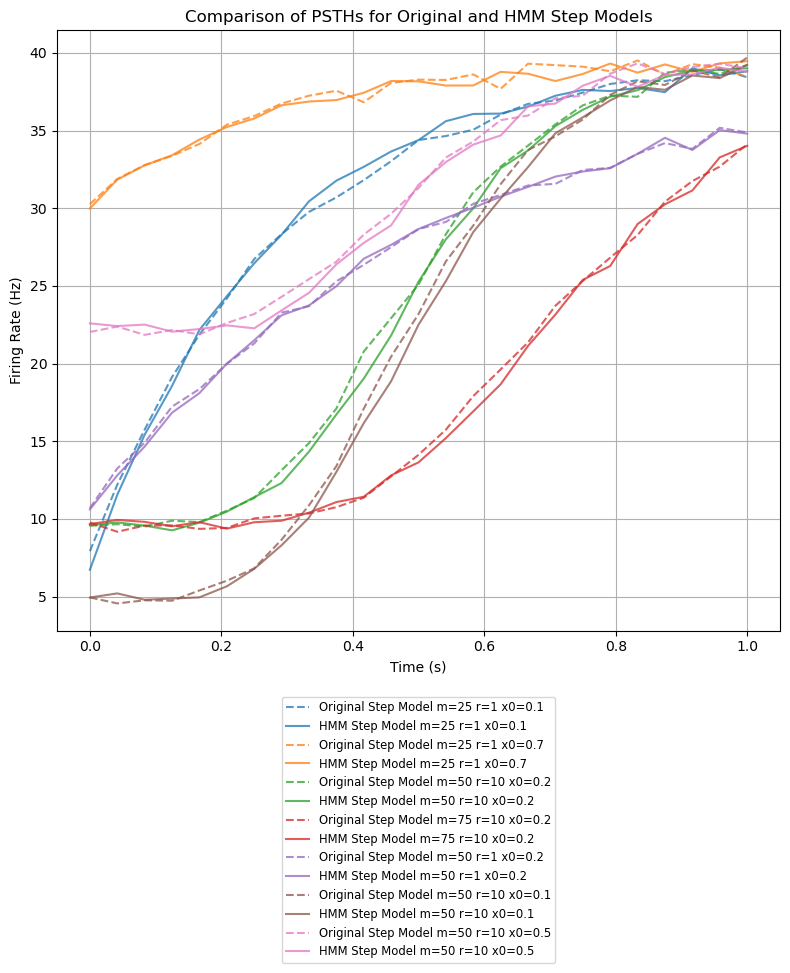

In [267]:

# Function to calculate PSTH from given spike trains
def calculate_psth(spikes, bin_size, T, dt, Ntrials):
    bin_count = int(T / bin_size)
    psth = np.zeros(bin_count)
    bin_edges = np.arange(0, T + bin_size, bin_size)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    for spike_train in spikes:
        hist, _ = np.histogram(np.where(spike_train > 0)[0], bins=bin_edges)
        psth += hist

    psth /= (Ntrials * dt * bin_size)
    return psth, bin_centers * dt  # Normalize the time axis

# Function to simulate and plot PSTH
def simulate_and_plot_psth(step_params_list, Ntrials=5000, T=100, dt=0.01):
    bin_size = 4  # Larger bins for smoothing
    time_axis = np.linspace(0, T, int(T / bin_size)) * dt

    plt.figure(figsize=(8, 10))  # Adjusting figure size for better fit

    # Get the default color cycle
    default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

    # Loop through stepping model parameter sets
    for idx, params in enumerate(step_params_list):
        color = default_colors[idx % len(default_colors)]

        # Simulate and plot for the original stepping model
        step_model = models.StepModel(**params)
        spikes_step, _, _ = step_model.simulate(Ntrials=Ntrials, T=T)
        psth_step, _ = calculate_psth(spikes_step, bin_size, T, dt, Ntrials)
        plt.plot(time_axis, psth_step, linestyle='dashed', color=color, label=f'Original Step Model m={params["m"]} r={params["r"]} x0={params["x0"]}', alpha=0.75)

        # Simulate and plot for the HMM stepping model
        hmm_step_model = HMMStepModel(**params)
        jump_times_step = hmm_step_model.simulate_jump_times(num_steps=T, num_trials=Ntrials)
        # print(len(jump_times_step))
        spike_trains_step = hmm_step_model.simulate_spike_trains(jump_times_step, num_steps=T, num_trials=Ntrials)
        psth_hmm_step, _ = calculate_psth(spike_trains_step, bin_size, T, dt, Ntrials)
        plt.plot(time_axis, psth_hmm_step, color=color, label=f'HMM Step Model m={params["m"]} r={params["r"]} x0={params["x0"]}', alpha=0.75)

    plt.xlabel('Time (s)')
    plt.ylabel('Firing Rate (Hz)')
    plt.title('Comparison of PSTHs for Original and HMM Step Models')
    plt.grid(True)

    # Place the legend outside the plot area
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=1, fontsize='small')

    plt.tight_layout()
    plt.show()

# Define the parameters for the step model
step_params_list = [
    {'m': 25, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.7, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

# Call the function to simulate and plot PSTHs
simulate_and_plot_psth(step_params_list)


### Task 2.3:
**Inference of hidden states**

Henceforth, for the rest of the activities this week (as well as most of the activities of the next two weeks), we will be solely working with the discrete-state HMM versions of the two models that you have implemented (instead of using the `models.py` simulators).

The `hmm_expected_states` function (see its doc/help) in the `inference.py` (run the next code cell to import this on Colab **§**) module implements the forward-backward algorithm (FBA) to calculate the posterior probabilities $P(s_t | n_{1:T})$, as well as the log-likelihood $\ln P(n_{1:T})$.**§§**<br>
One of the inputs to `hmm_expected_states` is the array, `ll`, of the logs of the conditional observation probabilities $ll[t, s] = \log P(n_t|s_t = s)$.**§§§** Use the function `inference.poisson_logpdf` from the provided new module `inference.py`, to construct this array based on the observed spike counts of one or several trials (see the help of this function).



Use this function to obtain these posterior probabilities for your finite-state MC implementations of both models.

- Write code to calcualte the posterior expectation of $x_t$ (i.e. $\mathbb{E}[x_t | n_{1:T}]$), for the ramp model, based on the posterior probabilities $P(s_t | n_{1:T})$. As in task 2.1, generate several trial spike trains using the discrete-state HMM ramp model (with the corresponding $x_t$ trajectories retained), and for each trial infer and plot $\mathbb{E}[x_t | n_{1:T}]$, together with the ground-truth simulated $x_t$. Repeat this in different regions of model parameter space (including low and high values of $x_0$ and $R_h$). In what parameter regimes is the inference more accurate, and vice versa? Provide intuitive/qualitative explanations for your observations.

- Repeat the above for the step model, with the following modifications. The aspect of the step model's hidden states that we really care about is whether or not the ''neuron" has jumped to the upper rate level. Calculate the probability of being in the upper rate level based on the posterior state probabilities $P(s_t | n_{1:T})$, and again make plots of it for various simulated spike-train trials. Visualise the true jump time on these plots. You can take the time point when the posterior probability of being in the upper rate level exceeds 0.5 as the estimated/inferred jump time, and mark that on the plots as well.<br>
For your report, try to combine different trials in one plot or figure, in a compact but nice way.<br> Based on these plots, comment (include both accounts of your observations and your qualitative explanations for them) on the accuracy  of the inference in different regions of the model parameter space.


- The `hmm_expected_states` function has an optional boolean input `filter` which is false by default. When true, the function calculates $P(s_t | n_{1:t})$ instead of $P(s_t | n_{1:T})$: i.e. the posterior conditioned only on observations up to and including the "current" time-step $t$. This corresponds to the so-called filtering problem (as in the Kalman filter; the default case, `filter = False`, corresponds to "smoothing". Filtering is appropriate for applications where inference has to be performed online, in which case, to infer $x_t$ we do not have the luxury of having access to future observations -- without a time-machine, that is! In our case (as engineers studying the computational mechanisms in area LIP), we do of course have access to the entire spike-train; hence the default option. Nevertheless, carry out a theoretical study of the differences in inference accuracy, for both models, using smoothing vs. filtering. Again comment on your observations of the dependence of the difference between the respective errors of smoothing and filtering, in each case, in different regions of the model parameter space (again including $R_h$ and $x_0$). Try to provide qualitative explanations for these observations.

In all of the above sub-tasks,  quantiatify the latent-state inference accuracy by evaluating the average error (both over trials and over time, if the latter makes sense) of the posterior estimates of the $x_t$ trajectories (for the ramp model) or the jump times (for the step model). You can then make heatmap or contour plots of these errors as a function of two parameters -- and different plots for different choices of parameter pairs. (The `tricontourf` function of `matplotlib` is very useful for this purpose.)


**§:** The module `inference.py` makes use of the [Numba package](http://numba.pydata.org/) to speed up computations by so-called just-in-time (JIT) compilation.  Numba can be imported in Colab, but to use it locally, you will need to install it, following these [instructions](https://numba.readthedocs.io/en/stable/user/installing.html).
Also note that JIT makes a function run slowly the first time you use it. So the first time you run a JITed function (e.g. `hmm_expected_states`) it's better to run it on a "light" test case (e.g. a single spike train, rather than several spike trains, or on a short one), and only then run it for the true use case.  


**§§:** This (log) probability depends implicitly on model parameters, hence the name (log) likelihood; it is called `normalizer` in the code for reasons having to do with the fact that it normalizes the message products involved in the FBA.

**§§§:** Note that at inference time, the $n_t$ are known and fixed, but the MC states are unknown; thus, as part of the inference procedure, we need to evaluate the observation (log-)probabilities for *all* possible states, $s$, at *every* times $t$. For more details see my [notes on the FBA](https://github.com/ahmadianlab/gg3_nda/blob/main/fwdbwd.ipynb).




In [268]:
mode = "local" # change this to "local" if you are on Deepnote or your own computer

if mode == "local":
    import inference
elif mode == "colab":
    import requests
    url = 'https://github.com/ahmadianlab/gg3_nda/blob/main/inference.py?raw=true'
    r = requests.get(url)
    with open('inference.py', 'w') as f:
        f.write(r.text)
    import inference
else:
    raise Exception("mode must be either local or colab")

#### <span style='color:lightgreen'> Task 2.3.2 </style>


In [269]:
# made class for HMM version of ramping model to make it easier for later
class HMMRampModel:
    def __init__(self, beta=0.5, sigma=0.5, x0=0.2, Rh=50, dt=0.01, K=50):
        self.beta = beta
        self.sigma = sigma
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.K = K
        self.T = self.create_transition_matrix()
        self.pi = self.ramp_initial_state_distribution()

    def create_transition_matrix(self):
        mu = self.beta * self.dt
        variance = (self.sigma ** 2) * self.dt

        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        states = np.linspace(0, 1, self.K)
        T = np.zeros((self.K, self.K))

        for s in range(self.K):
            current_state_value = states[s]
            mu_s = current_state_value + mu

            for s_prime in range(self.K):
                next_state_value = states[s_prime]
                if s < self.K - 1:
                    T[s, s_prime] = gaussian_pdf(next_state_value, mu_s, variance)

            if s < self.K - 1:
                T[s, :] /= np.sum(T[s, :])

        T[self.K-1, self.K-1] = 1.0

        return T

    def ramp_initial_state_distribution(self):
        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        mu = self.x0
        variance = self.sigma ** 2 * self.dt
        states = np.linspace(0, 1, self.K)
        pi = gaussian_pdf(states, mu, variance)
        pi /= np.sum(pi)

        return pi

    # This function gives x_t
    def simulate_x_t(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        x_t_trials = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t_trials.append(np.array(chain) / (K - 1)) # this np.array(chain) / (K - 1) is x_t

        return np.array(x_t_trials)

    # This function gives a single spike n_t
    def calculate_spike_counts(self, x_t):
        r_t = self.Rh * np.maximum(0, x_t)  # Calculate the firing rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    # This function gives rates as array r_t
    def calculate_rates(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        rates = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t = np.array(chain) / (K - 1)
            r_t = self.Rh * np.maximum(0, x_t)
            rates.append(r_t)

        return np.array(rates)

    # New function to simulate spike trains and return them as an array of n_t
    def simulate_spike_trains_array(self, num_steps, num_trials):
        x_t_trajectories = self.simulate_x_t(num_steps, num_trials)
        spike_trains = []

        for trial in range(num_trials):
            x_t = x_t_trajectories[trial]
            n_t = self.calculate_spike_counts(x_t)
            spike_trains.append(n_t)

        return np.array(spike_trains), x_t_trajectories


In [278]:
# This uses fixed s_t according to K available x_t values and generated n_t. I think this is it
ramp_params = {'beta': 0.5, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
hmm_ramp_model = HMMRampModel(**ramp_params)
num_steps = 100
num_trials = 10
K=50
x_ts = np.linspace(0, 1, K)
r_t = ramp_params["Rh"] * np.maximum(0, x_ts)
lambdas = r_t * ramp_params['dt']
# Get the initial state distribution and transition matrix
pi0 = hmm_ramp_model.ramp_initial_state_distribution()
Ps = hmm_ramp_model.create_transition_matrix()
# Simulate and plot for the ramping model
spike_trains_ramp = hmm_ramp_model.simulate_spike_trains_array(num_steps=num_steps, num_trials=num_trials)[0]
# Calculate the expected states and normalizer
lls = poisson_logpdf(spike_trains_ramp, lambdas, mask=None)  #lambdas are r_t*dt
print(lls.shape)
for i in range(num_trials):
  ll = lls[i]
  expected_states, normaliser = hmm_expected_states(pi0, Ps, ll, filter=False)

  print("Log-likelihoods (lls):")
  print(lls)
  print("\nExpected States:")
  print(expected_states)
  print("\nNormalizer:")
  print(normaliser)
  # row_sums = expected_states.sum(axis=1)
  # print("Row sums of transition matrix T:", row_sums)

(10, 100, 50)
Log-likelihoods (lls):
[[[-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.00000000e-01]
  [-1.84206808e+01 -4.59517156e+00 -3.91222846e+00 ... -1.21441171e+00
   -1.20356239e+00 -1.19314718e+00]
  [-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.00000000e-01]
  ...
  [-1.84206808e+01 -4.59517156e+00 -3.91222846e+00 ... -1.21441171e+00
   -1.20356239e+00 -1.19314718e+00]
  [-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.00000000e-01]
  [-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.00000000e-01]]

 [[-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.00000000e-01]
  [-1.84206808e+01 -4.59517156e+00 -3.91222846e+00 ... -1.21441171e+00
   -1.20356239e+00 -1.19314718e+00]
  [-1.00000000e-08 -1.02040816e-02 -2.04081633e-02 ... -4.79591837e-01
   -4.89795918e-01 -5.000000

In [279]:
""" STEP MODEL"""

#repeat for the step model
rates, dt, num_steps, num_trials = 10, 0.01, 100, 2
step_params = {'m': 50, 'r': 49, 'x0': 0.9, 'Rh': 50, 'dt': 0.01}
hmm_poisson = HMMStepModel(**step_params)
model = hmm_poisson

def calculate_posterior_step(model, rate, num_steps, num_trials, step_params):
    """_summary_

    Args:
        model (HMM instance): instance of the HMM Step model
        rate (list/float): list of rates if they vary with trials, or float 
        to be assumed constant per trial
        num_steps (int)): number of time steps
        num_trials (int): Number of trials being run

    Returns:
        array: posterior probabilities of the states
    """
    def simulate_poisson_process(model, num_steps, num_trials):
        #use previous function to create a HMM poisson process and return its spike counts
        jump_times = model.simulate_jump_times(num_steps, num_trials)
        spike_counts = model.simulate_spike_trains(jump_times, num_steps, num_trials)
        return spike_counts

    #Use poisson_logpdf to calculate log likelihood of spike counts
    K = 50
    x_ts = np.linspace(0, 1, K)
    r_t = step_params["Rh"] * np.maximum(0, x_ts)
    lambdas = r_t * step_params['dt']
    
    def calculate_log_likelihood(spike_counts):
        log_likelihood = inference.poisson_logpdf(spike_counts, lambdas)
        return log_likelihood

    spike_counts = simulate_poisson_process(model, num_steps, num_trials) # T = 100, Ntrials = 1
    if isinstance(rate, list):
        rates = np.array(rate)
    else:
        rates = np.ones(num_steps) * rate

    initial_prob = np.zeros(K)
    initial_prob[0] = 1
    transition_matrix = model.create_transition_matrix()
    ll = calculate_log_likelihood(spike_counts)

    #print the shape of initial prob, transition matrix and log likelihood
    print("Init probs states", initial_prob.shape) # K = 50
    print("Ps shape", transition_matrix.shape) # 50 x 50
    print("llshape ", ll.shape) #1 X 100 X 4
    
    posterior = inference.hmm_expected_states(initial_prob, transition_matrix, ll[0])
    
    return posterior

#Obtain posterior probabilities using hmm_expected_states
initial_prob = hmm_poisson.create_transition_matrix()
# print(initial_prob.shape)
transition_matrix = np.array(hmm_poisson.create_transition_matrix())
# print(transition_matrix.shape)
posterior = calculate_posterior_step(hmm_poisson, rate, num_steps, num_trials, step_params)
print(posterior)

# print("Probability of final state")
for i in posterior[0]:
    print(i[-1])

Init probs states (50,)
Ps shape (50, 50)
llshape  (2, 100, 50)
(array([[1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.27208185e-01, 7.72791815e-01, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [4.10969032e-02, 3.70333127e-01, 5.88569970e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 1.53465647e-84, 3.53986488e-70, ...,
        2.01882264e-02, 3.00874385e-02, 9.20754674e-01],
       [0.00000000e+00, 5.89436756e-85, 1.50924435e-70, ...,
        1.65127306e-02, 2.52272789e-02, 9.35609152e-01],
       [0.00000000e+00, 2.00481758e-85, 6.14744382e-71, ...,
        1.33783227e-02, 2.08931201e-02, 9.48161064e-01]]), -93.67526309911422)
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\2655955425.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10')


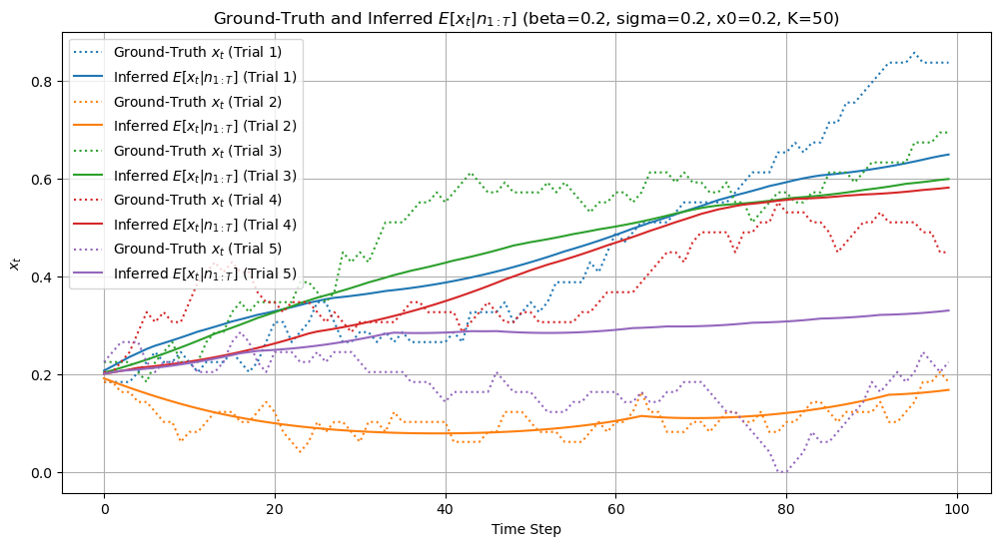

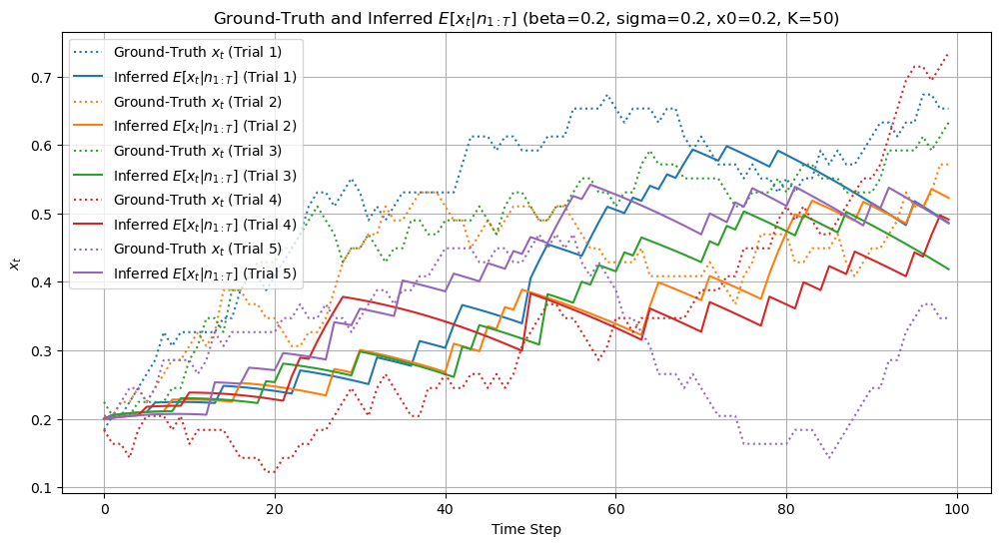

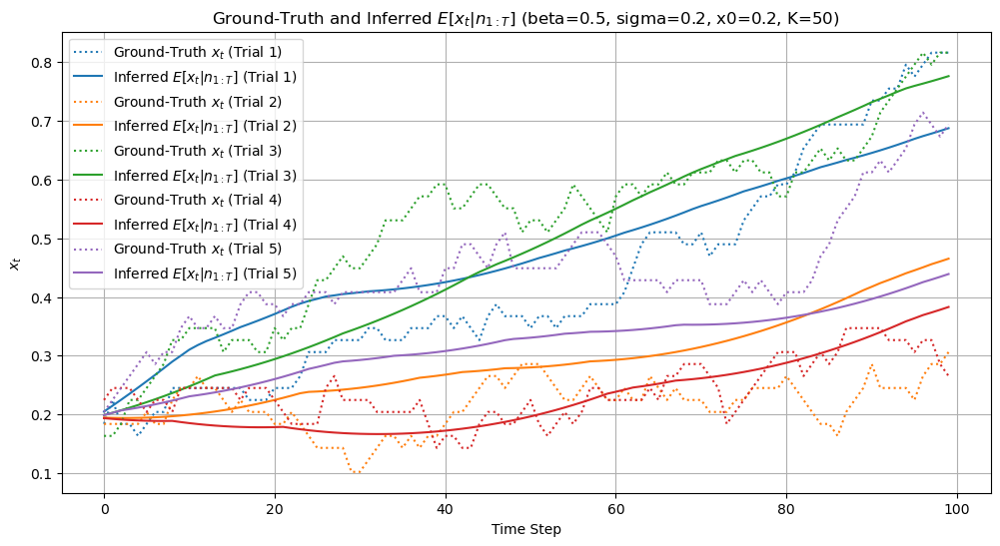

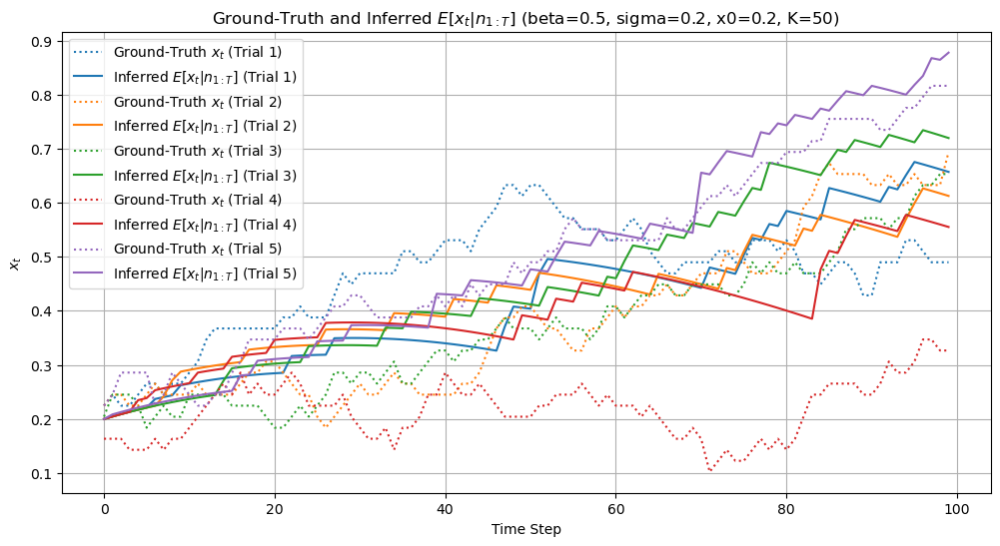

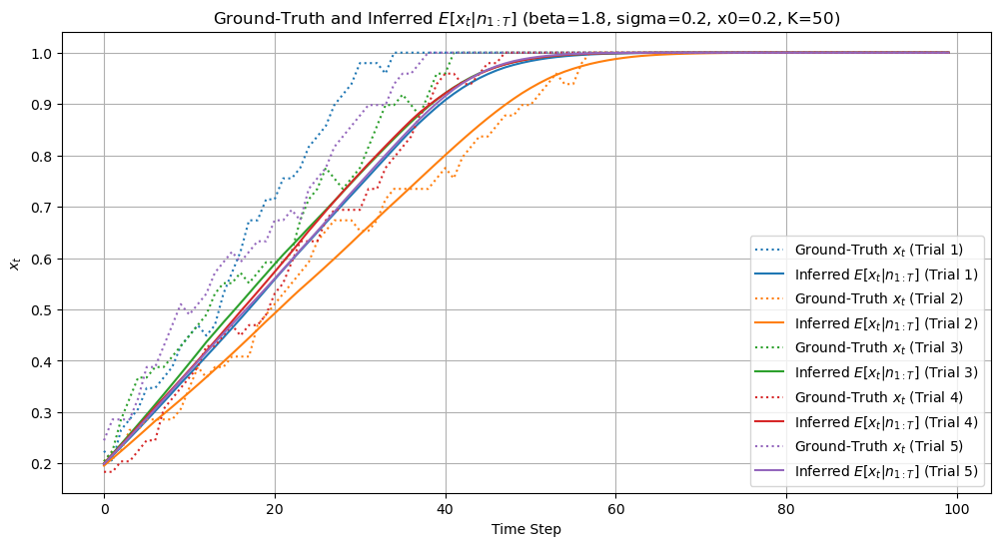

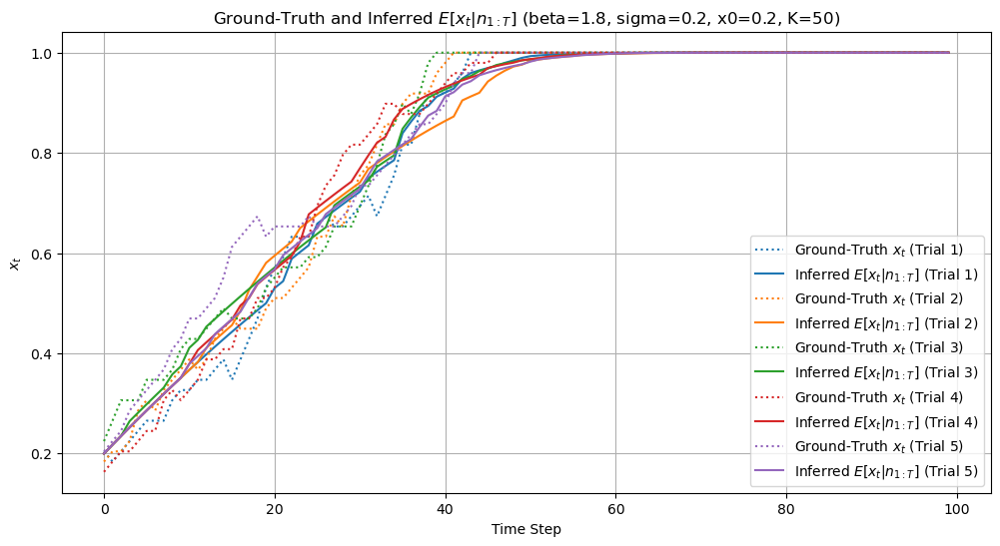

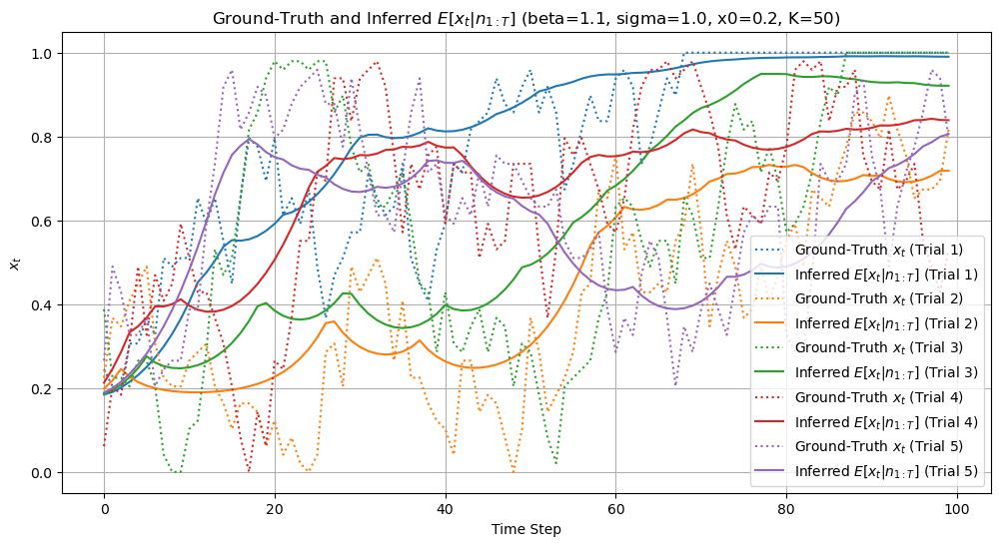

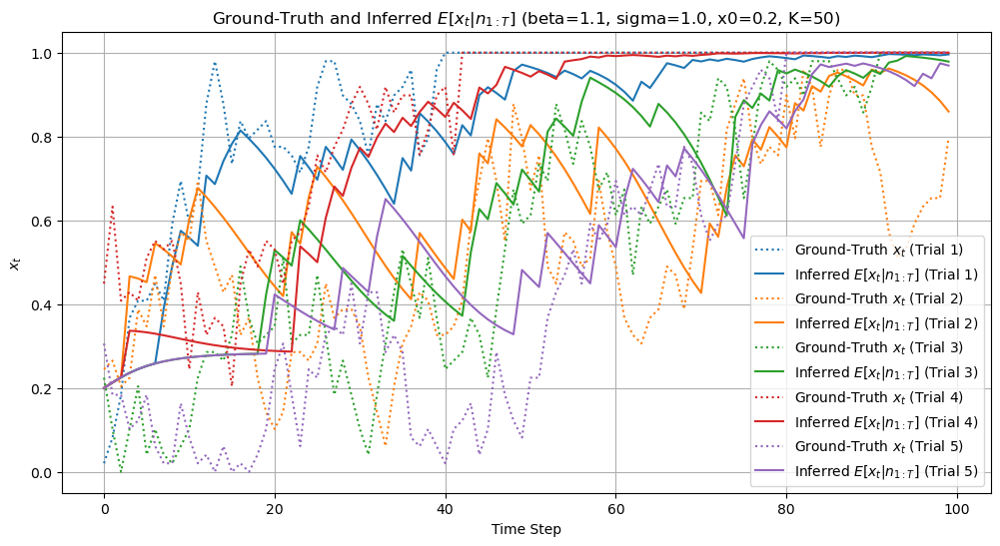

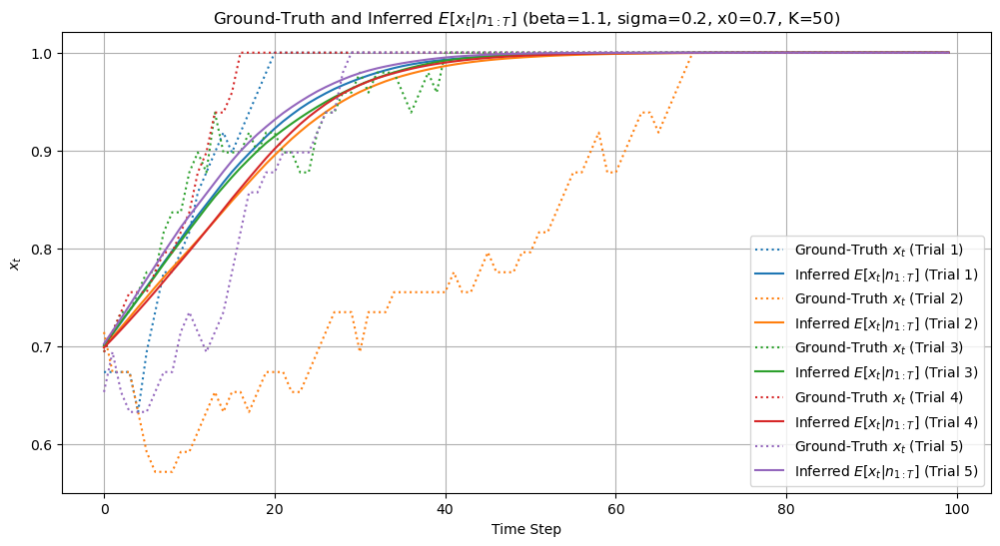

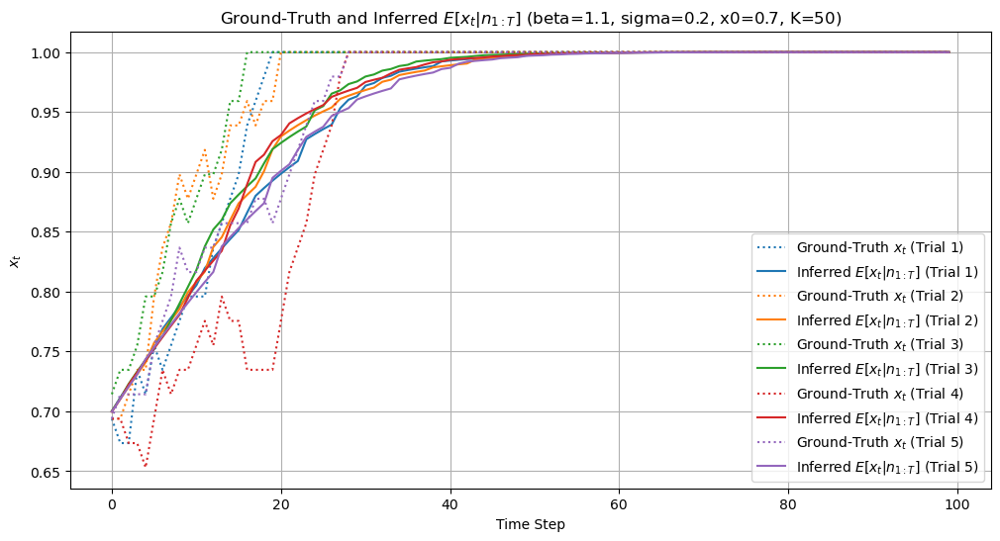

In [280]:

from scipy.special import logsumexp

# Define the function to find posterior expectation
def simulate_and_infer_xt(ramp_params, num_steps, num_trials, filter=False):
    hmm_ramp_model = HMMRampModel(**ramp_params)
    K = ramp_params['K']

    # Simulate spike trains and x_t trajectories
    spike_trains_ramp, x_t_trajectories = hmm_ramp_model.simulate_spike_trains_array(num_steps=num_steps, num_trials=num_trials)

    # Calculate the expected spike rates (lambdas)
    x_ts = np.linspace(0, 1, K)
    r_t = ramp_params["Rh"] * np.maximum(0, x_ts)
    lambdas = r_t * ramp_params['dt']

    # Calculate the log-likelihoods
    lls = inference.poisson_logpdf(spike_trains_ramp, lambdas, mask=None)  # lambdas are r_t * dt

    # Get the initial state distribution and transition matrix
    pi0 = hmm_ramp_model.ramp_initial_state_distribution()
    Ps = hmm_ramp_model.create_transition_matrix()

    x_t_expectation = np.zeros((num_trials, num_steps))

    # Calculate the expected states and normalizer for each trial
    for trial in range(num_trials):
        ll = lls[trial]
        expected_states, normaliser = inference.hmm_expected_states(pi0, Ps, ll, filter=filter)

        # Calculate the posterior expectation E[x_t | n_{1:T}]
        x_t_expectation[trial] = np.dot(expected_states, x_ts)

    return x_t_expectation, x_t_trajectories


# Define the function to plot the results
def plot_xt_inference(ramp_params, num_steps=100, num_trials=5, filter=False):
    x_t_expectation, x_t_trajectories = simulate_and_infer_xt(ramp_params, num_steps, num_trials, filter=filter)

    plt.figure(figsize=(12, 6))
    colors = plt.cm.get_cmap('tab10')

    for trial in range(num_trials):
        color = colors(trial)
        plt.plot(x_t_trajectories[trial], label=f"Ground-Truth $x_t$ (Trial {trial+1})", linestyle='dotted', color=color)
        plt.plot(x_t_expectation[trial], label=f"Inferred $E[x_t|n_{{1:T}}]$ (Trial {trial+1})", color=color)

    plt.xlabel('Time Step')
    plt.ylabel('$x_t$')
    plt.title(f"Ground-Truth and Inferred $E[x_t|n_{{1:T}}]$ (beta={ramp_params['beta']}, sigma={ramp_params['sigma']}, x0={ramp_params['x0']}, K={ramp_params['K']})")
    plt.legend()
    plt.grid(True)
    plt.show()



# Example usage with different parameter sets
ramp_params_list = [
    {'beta': 0.2, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50},
    {'beta': 0.5, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50},
    {'beta': 1.8, 'sigma': 0.2, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50},
    {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50},
    {'beta': 1.1, 'sigma': 0.2, 'x0': 0.7, 'Rh': 50, 'dt': 0.01, 'K': 50}
]

# Plot results for each parameter set
for ramp_params in ramp_params_list:
    plot_xt_inference(ramp_params, num_steps=100, num_trials=5, filter=False)
    plot_xt_inference(ramp_params, num_steps=100, num_trials=5, filter=True)


In [281]:
def find_posterior_expectation_xt(hmm_ramp_model, num_steps, num_trials):
    K = hmm_ramp_model.K

    # Simulate spike trains and x_t trajectories
    x_t_trajectories = hmm_ramp_model.simulate_x_t(num_steps=num_steps, num_trials=num_trials)
    spike_trains = hmm_ramp_model.simulate_spike_trains_array(num_steps=num_steps, num_trials=num_trials)
    spike_trains_ramp_flattened = spike_trains_ramp.flatten()

    # Calculate the expected spike rates (lambdas)
    x_ts = np.linspace(0, 1, K)
    r_t = hmm_ramp_model.Rh * np.maximum(0, x_ts)
    lambdas = r_t * hmm_ramp_model.dt
    lambdas_flattened = lambdas.flatten()

    # Calculate the expected states and normalizer
    lls = inference.poisson_logpdf(spike_trains_ramp_flattened, lambdas_flattened, mask=None)  #lambdas are r_t*dt

    # Get the initial state distribution and transition matrix
    pi0 = hmm_ramp_model.ramp_initial_state_distribution()
    Ps = hmm_ramp_model.create_transition_matrix()

    # Calculate the expected states and normalizer using the forward-backward algorithm
    expected_states, normaliser = inference.hmm_expected_states(pi0, Ps, lls, filter=False)

    # Calculate the posterior expectation E[x_t | n_{1:T}]
    x_t_expectation = np.dot(expected_states, x_ts)

    return x_t_expectation, x_t_trajectories

# Example usage
ramp_params = {'beta': 0.5, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50}
hmm_ramp_model = HMMRampModel(**ramp_params)
num_steps = 100
num_trials = 5

x_t_expectation, x_t_trajectories = find_posterior_expectation_xt(hmm_ramp_model, num_steps, num_trials)

print("Posterior Expectation E[x_t | n_{1:T}]:")
print(x_t_expectation)
print("\nGround-Truth x_t Trajectories:")
print(x_t_trajectories)


Posterior Expectation E[x_t | n_{1:T}]:
[0.2147195  0.23573998 0.24653512 0.25869549 0.27221736 0.27670301
 0.27224284 0.25838179 0.24602218 0.23518078 0.2258222  0.21788129
 0.21127998 0.20593868 0.20178349 0.19875057 0.1967887  0.19586061
 0.19594374 0.19703058 0.1991289  0.20226206 0.20646959 0.21180839
 0.2183553  0.22621302 0.23552539 0.24652864 0.24446126 0.24404401
 0.24505881 0.24740223 0.251023   0.25590032 0.26203343 0.26943513
 0.27812689 0.28813458 0.29948432 0.31219819 0.32628991 0.3417603
 0.358593   0.36844381 0.37166064 0.37617216 0.37420411 0.37353844
 0.37417607 0.37612496 0.37137842 0.36795885 0.36585696 0.36506666
 0.36558533 0.36741516 0.37056518 0.37505726 0.37254987 0.371384
 0.37153645 0.37299635 0.37575925 0.379825   0.38519618 0.39187661
 0.39987016 0.4016905  0.40480473 0.40920812 0.40773684 0.40755294
 0.40139689 0.39654475 0.39299489 0.3907449  0.38979356 0.39014304
 0.3918017  0.39479124 0.39112509 0.38879725 0.38778399 0.38807162
 0.38965163 0.39251943 0.

#### <span style='color:lightgreen'> Task 2.3.2 </style>


In [282]:
# UPDATED: Class for HMM approximation of the stepping model
class HMMStepModel:
    def __init__(self, m=50, r=10, x0=0.2, Rh=50, dt=0.01):
        self.m = m
        self.r = r
        self.p = r / (m + r)
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.T = self.create_transition_matrix()

    def create_transition_matrix(self):
        T = np.zeros((self.r + 1, self.r + 1))
        for i in range(self.r):
            T[i, i] = 1 - self.p  # Probability of staying in the same state
            T[i, i + 1] = self.p  # Probability of moving to the next state
        T[self.r, self.r] = 1  # Once in the final state, stay there
        return T

    def simulate_jump_times(self, num_steps, num_trials):
        states = np.arange(len(self.T))  # Define the states
        jump_times = []

        pi0 = np.zeros(self.r + 1)
        pi0[0] = 1  # Initial state probability vector [1, 0, 0, ..., 0]

        pi_r = pi0 @ np.linalg.matrix_power(self.T, self.r)

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=pi_r)  # Start using the rth state probability
            for step in range(num_steps):
                if current_state == self.r:
                    jump_times.append(step + 1)  # Record the jump time (1-based index)
                    break  # Stop after the first jump
                current_state = np.random.choice(states, p=self.T[current_state])
            else:
                jump_times.append(num_steps)  # Record the last time step if no jump occurs

        # Ensure jump_times has length of num_trials
        assert len(jump_times) == num_trials, f"Length of jump_times ({len(jump_times)}) does not match num_trials ({num_trials})"

        return jump_times

    def calculate_spike_counts(self, jump_time, num_steps):
        r_t = np.ones(num_steps) * self.x0 * self.Rh  # Initialize with pre-jump rate
        if jump_time < num_steps:
            r_t[jump_time:] = self.Rh  # Update to post-jump rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    def simulate_spike_trains(self, jump_times, num_steps, num_trials):
        spike_trains = []
        for trial in range(num_trials):
            spike_train = self.calculate_spike_counts(jump_times[trial], num_steps)
            spike_trains.append(spike_train)
        return np.array(spike_trains)

# Example usage with parameters
step_params = {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}


# Initialize the models
hmm_step_model = HMMStepModel(**step_params)


# Simulate and plot for the stepping model
jump_times_step = hmm_step_model.simulate_jump_times(num_steps=100, num_trials=10)
spike_trains_step = hmm_step_model.simulate_spike_trains(jump_times_step, num_steps=100, num_trials=10)




C:\Users\Soham Karmarkar\AppData\Local\Temp\ipykernel_10684\2674179107.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10')


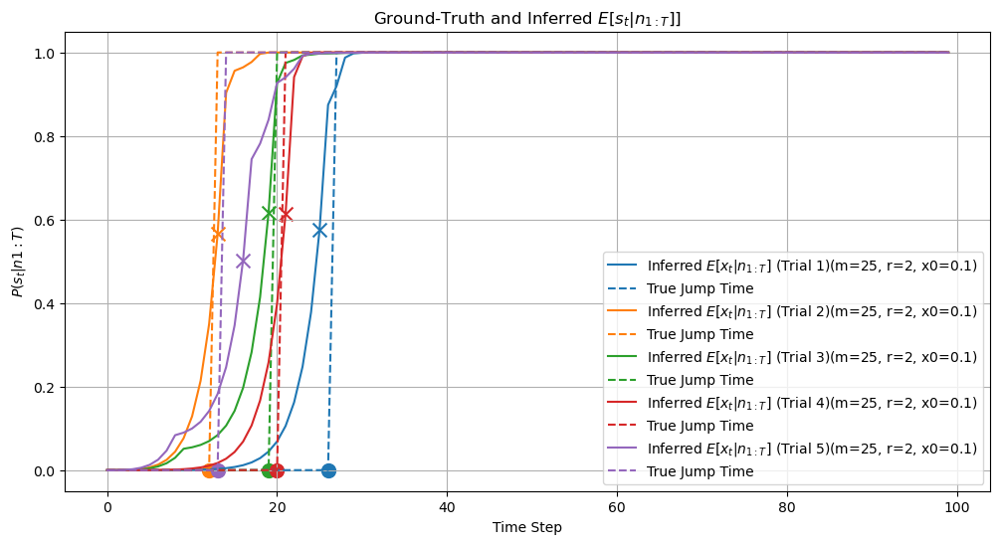

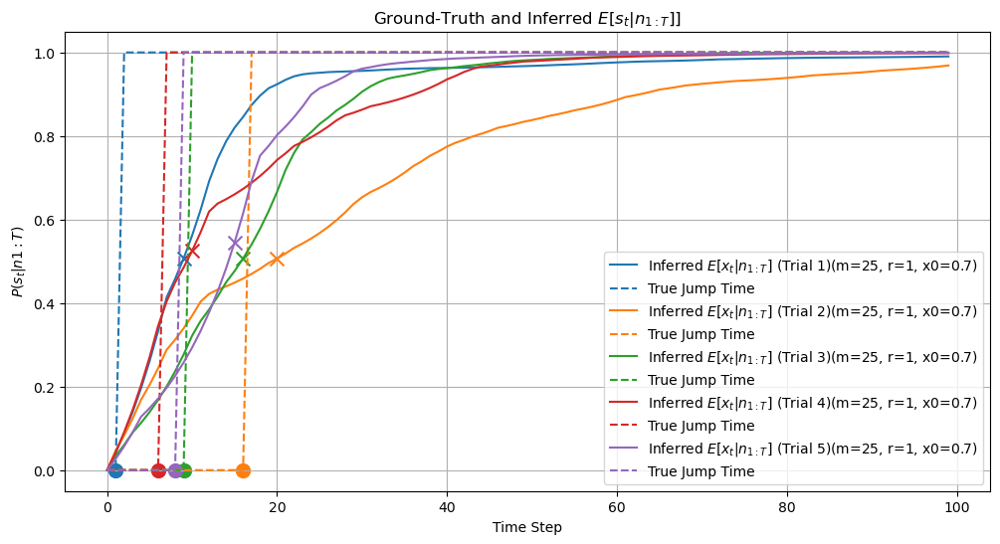

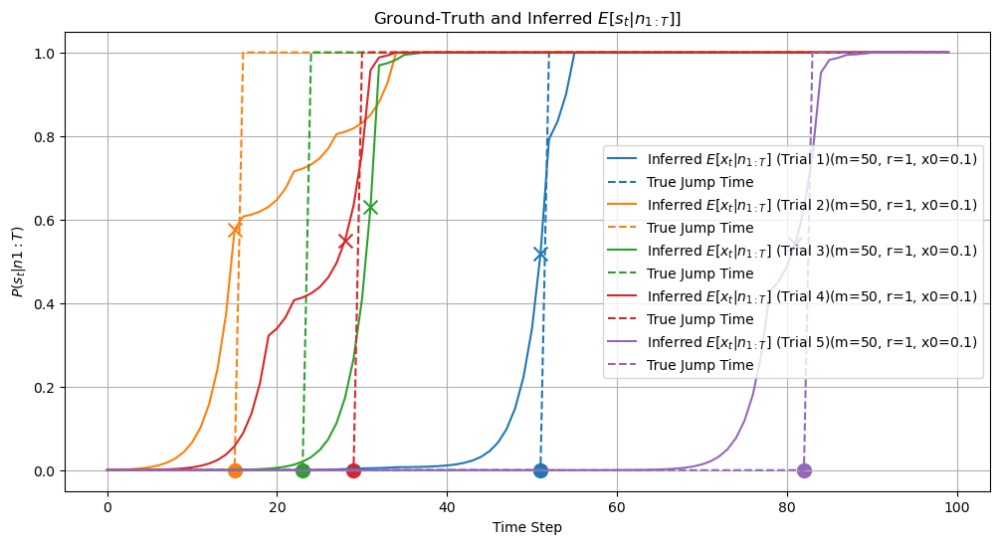

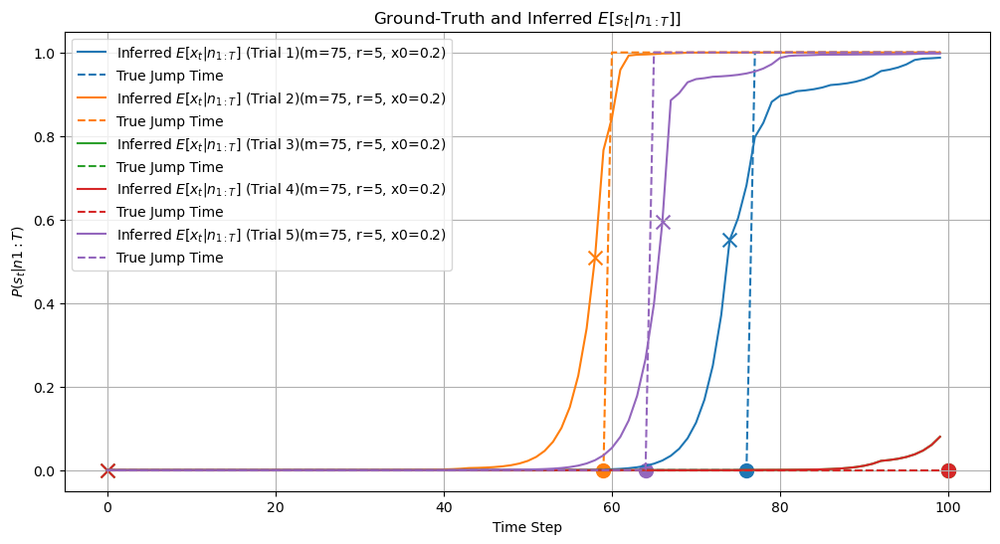

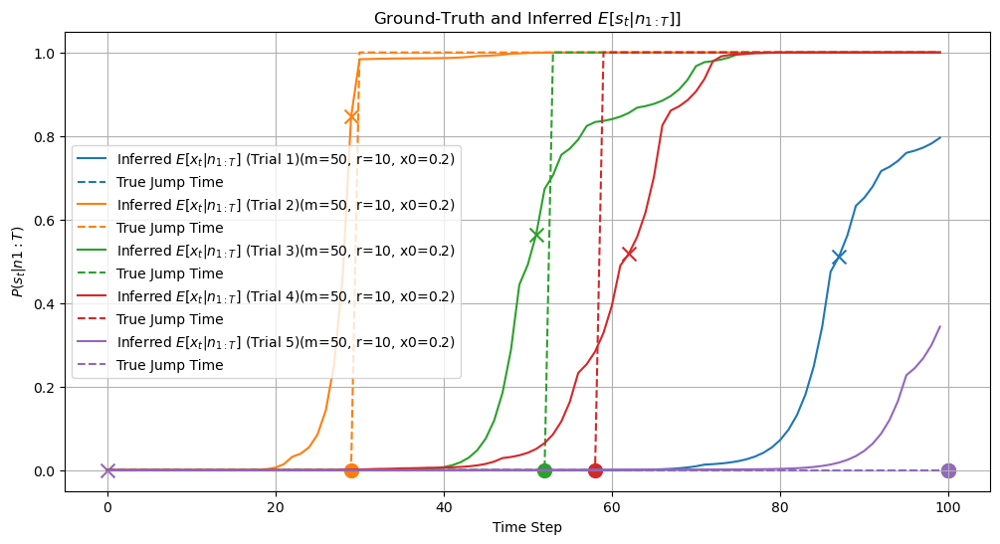

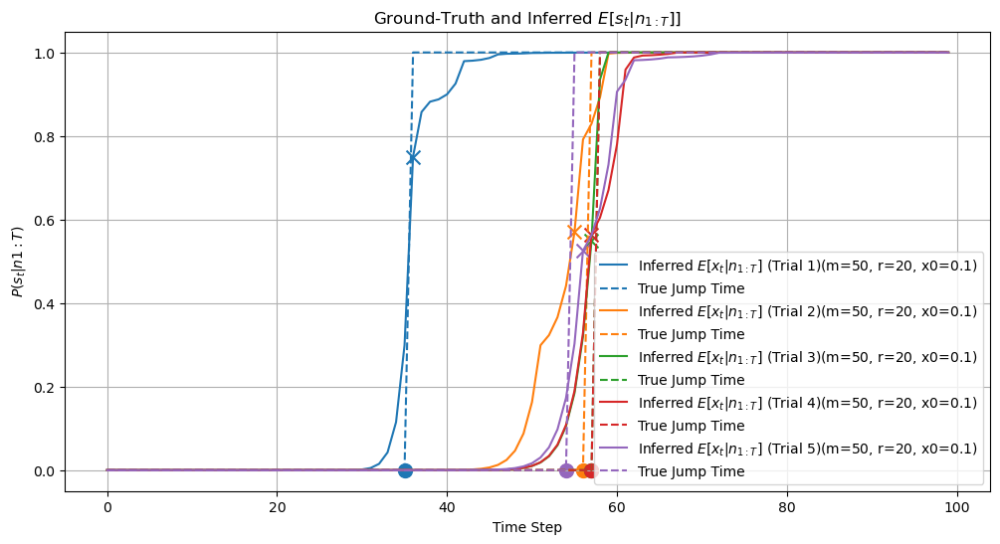

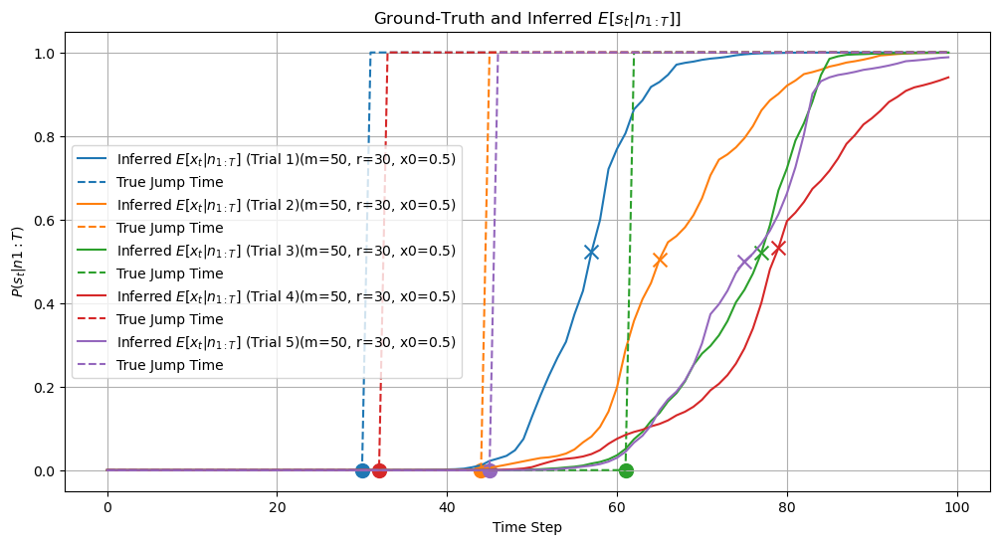

In [286]:
# sub task 2
from scipy.special import logsumexp


# Define the function to find posterior expectation
def step_simulate_and_infer_xt(step_params, num_steps, num_trials, filter=False):
    hmm_step_model = HMMStepModel(**step_params)

    # Simulate spike trains and x_t trajectories
    jump_times = hmm_step_model.simulate_jump_times(num_steps, num_trials)
    
    spike_trains = hmm_step_model.simulate_spike_trains(jump_times, num_steps, num_trials)
    
    # Calculate the expected spike rates (lambdas)
    s_ts = np.linspace(0, 1, step_params["r"]+1)

    r_t = np.ones(len(s_ts)) * step_params['x0'] * step_params['Rh']  # Initialize with pre-jump rate
    r_t[-1] = step_params['Rh']
    lambdas = r_t * step_params['dt']  # Obtain the mean count in each time bin
    
    # Calculate the log-likelihoods
    lls = inference.poisson_logpdf(spike_trains, lambdas, mask=None)  # lambdas are r_t * dt


    # Get the initial state distribution and transition matrix
    Ps = hmm_step_model.create_transition_matrix()
    pi0 = np.zeros(len(Ps))
    pi0[0] = 1

    s_t_posterior = np.zeros((num_trials, num_steps, step_params["r"]+1))

    # Calculate the expected states and normalizer for each trial
    for trial in range(num_trials):
        ll = lls[trial]
        # print(ll.shape)
        expected_states, normaliser = inference.hmm_expected_states(pi0, Ps, ll, filter)

        # Calculate the posterior expectation E[x_t | n_{1:T}]
        s_t_posterior[trial] = expected_states
        
    return s_t_posterior, jump_times

def plot_step_function(step_time):
    x = np.arange(0, 100)
    y = np.zeros(100)
    y[step_time+1:] = 1
    plt.plot(x, y, linestyle = "dashed", label = "True Jump Time")

def step_plot_xt_inference(step_params, num_steps=100, num_trials = 2):
  # shape of s_t_posterior is (num_trial, num_steps, r+1)
    s_t_posterior, jump_times = step_simulate_and_infer_xt(step_params, num_steps, num_trials)
    # print(np.round(s_t_posterior, 2))
    # print(s_t_posterior.shape)
    

    plt.figure(figsize=(12, 6))
    colors = plt.cm.get_cmap('tab10')

    for trial in range(num_trials):
        color = colors(trial)
        # Plot inferred E[x_t|n_{1:T}]
        plt.plot(s_t_posterior[trial][:, -1], label=f"Inferred $E[x_t|n_{{1:T}}]$ (Trial {trial+1})(m={step_params['m']}, r={step_params['r']}, x0={step_params['x0']})", color=color)

        # Plot jump times
        plt.scatter(jump_times[trial], np.full_like(jump_times[trial], 0.5), marker='o', color=color, s=100)
        plot_step_function(jump_times[trial])
        
        #plot find the time and value where the s_t_posterior is first greater than or equal to 0.5
        inferred_jump_time = np.where(s_t_posterior[trial][:, -1] >= 0.5)
        if inferred_jump_time[0].size == 0:
            plt.scatter(0, s_t_posterior[trial][0, -1], marker='x', color=color, s=100)
        else:
            plt.scatter(inferred_jump_time[0][0], s_t_posterior[trial][inferred_jump_time[0][0], -1], marker='x', color=color, s=100)

    plt.xlabel('Time Step')
    plt.ylabel('$P(s_t | n1:T)$')
    plt.title(f"Ground-Truth and Inferred $E[s_t|n_{{1:T}}]]$")
    plt.grid(True)


# Example usage with different parameter sets

step_params_list = [
    {'m': 25, 'r': 2, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 25, 'r': 1, 'x0': 0.7, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 1, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 75, 'r': 5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 10, 'x0': 0.2, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 20, 'x0': 0.1, 'Rh': 50, 'dt': 0.01},
    {'m': 50, 'r': 30, 'x0': 0.5, 'Rh': 50, 'dt': 0.01}
]

# Plot results for each parameter set
for i in range(len(step_params_list)):
    try:
        step_plot_xt_inference(step_params_list[i], num_steps=100, num_trials=5) #num_trials sets jump times indicies
        
    except:
        print("Error")
    plt.legend()
plt.show()


In [287]:
# smoothing vs. filtering. What qualitative differences do you observe between the inference accuracy using filtering vs. smoothing?

def calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=10, filter=False):
    x_t_expectation_all, x_t_trajectories_all = simulate_and_infer_xt(ramp_params, num_steps, num_trials, filter=filter)
    average_error = np.mean(abs(x_t_expectation_all - x_t_trajectories_all))
    return average_error

# Example usage
ramp_params = {'beta': 1.1, 'sigma': 1.0, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50}
average_error = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=1000, filter=False)
print(f"Average Error across 1000 trials: {average_error:.4f}")
# average_error = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=1000, filter=True)
# print(f"Average Error across 1000 trials using filter: {average_error:.4f}")


Average Error across 1000 trials: 0.1240


In [288]:
def calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=1000, filter=False):
    # Run the simulation and inference
    s_t_posterior, jump_times = step_simulate_and_infer_xt(step_params, num_steps, num_trials, filter=filter)

    # The actual states are represented by jump times converted into binary steps
    actual_states = np.zeros((num_trials, num_steps))
    error = 0
    for trial in range(num_trials):
        jump_time = jump_times[trial]
        actual_states[trial, jump_time:] = 1  # Assuming the state changes to 1 after jump time

    # Plot where s_t_posterior first reaches 0.5
        first_reach_0_5 = np.argmax(s_t_posterior[trial][:, -1] >= 0.5)

        error += abs(jump_time - first_reach_0_5)



    # Calculate MSE
    average_error = error / num_trials
    return average_error

# Example usage with a parameter set
step_params = {'m': 25, 'r': 20, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
average_error = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=1000, filter=False)
print(f"Average Error across 1000 trials: {average_error:.4f} time steps")
# average_error = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=1000, filter=True)
# print(f"Average Error across 1000 trials using filter: {average_error:.4f} time steps")

Average Error across 1000 trials: 8.9060 time steps


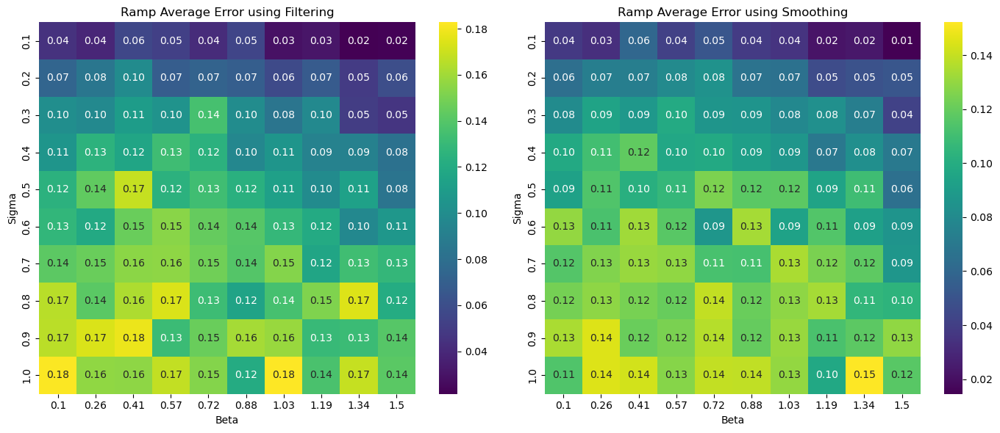

In [289]:
import seaborn as sns

from scipy.special import logsumexp


# Define a range of values for sigma and beta
sigma_values = np.linspace(0.1, 1, 10)
beta_values = np.linspace(0.1, 1.5, 10)

# Initialize arrays to store MSE values
mse_filtering = np.zeros((len(sigma_values), len(beta_values)))
mse_smoothing = np.zeros((len(sigma_values), len(beta_values)))

# Loop over all combinations of sigma and beta
for i, sigma in enumerate(sigma_values):
    for j, beta in enumerate(beta_values):
        ramp_params = {'beta': beta, 'sigma': sigma, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50}
        mse_filtering[i, j] = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=10, filter=True)
        mse_smoothing[i, j] = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=10, filter=False)
        # print(f"Completed sigma={sigma:.2f}, beta={beta:.2f}")

# Plot heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(mse_filtering, xticklabels=np.round(beta_values, 2), yticklabels=np.round(sigma_values, 2), annot=True, fmt=".2f", cmap="viridis")
plt.title('Ramp Average Error using Filtering')
plt.xlabel('Beta')
plt.ylabel('Sigma')

plt.subplot(1, 2, 2)
sns.heatmap(mse_smoothing, xticklabels=np.round(beta_values, 2), yticklabels=np.round(sigma_values, 2), annot=True, fmt=".2f", cmap="viridis")
plt.title('Ramp Average Error using Smoothing')
plt.xlabel('Beta')
plt.ylabel('Sigma')

plt.tight_layout()
plt.show()

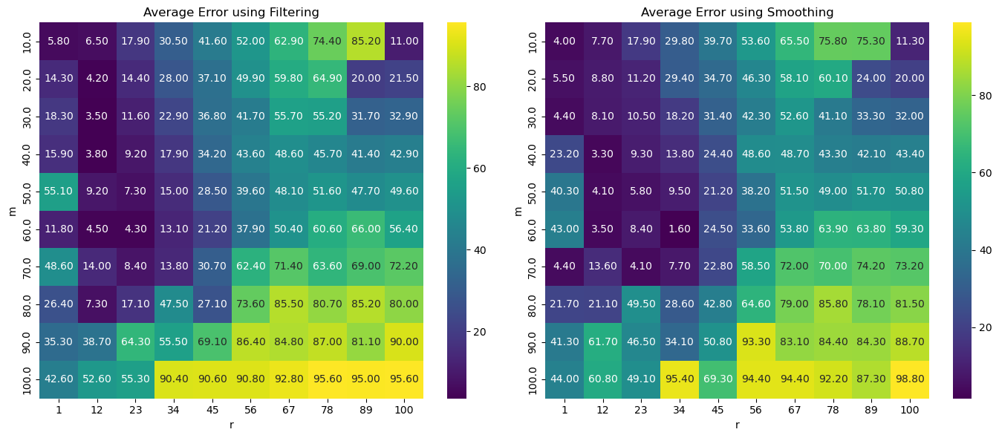

In [290]:
# Stepping Model


# Define a range of values for m and r
m_values = np.linspace(10, 100, 10)
r_values = np.linspace(1, 100, 10, dtype=int)

# Initialize arrays to store MSE values
mse_filtering = np.zeros((len(m_values), len(r_values)))
mse_smoothing = np.zeros((len(m_values), len(r_values)))

# Loop over all combinations of m and r
for i, m in enumerate(m_values):
    for j, r in enumerate(r_values):
        step_params = {'m': m, 'r': r, 'x0': 0.2, 'Rh': 50, 'dt': 0.01}
        mse_filtering[i, j] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=10, filter=True)
        mse_smoothing[i, j] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=10, filter=False)


# Plot heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(mse_filtering, xticklabels=r_values, yticklabels=np.round(m_values, 2), annot=True, fmt=".2f", cmap="viridis")
plt.title('Average Error using Filtering')
plt.xlabel('r')
plt.ylabel('m')

plt.subplot(1, 2, 2)
sns.heatmap(mse_smoothing, xticklabels=r_values, yticklabels=np.round(m_values, 2), annot=True, fmt=".2f", cmap="viridis")
plt.title('Average Error using Smoothing')
plt.xlabel('r')
plt.ylabel('m')

plt.tight_layout()
plt.show()


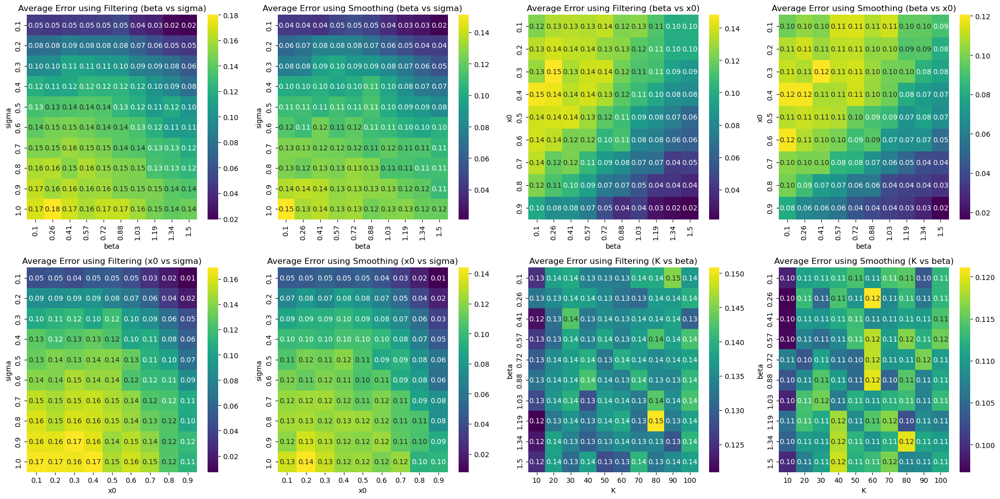

In [291]:
#ramping model
import seaborn as sns

def calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=1000, filter=False):
    x_t_expectation_all, x_t_trajectories_all = simulate_and_infer_xt(ramp_params, num_steps, num_trials, filter=filter)
    error = np.mean(np.abs(x_t_expectation_all - x_t_trajectories_all))
    return error

# Define the ranges of the parameters
beta_values = np.linspace(0.1, 1.5, 10)
sigma_values = np.linspace(0.1, 1, 10)
x0_values = np.linspace(0.1, 0.9, 9)
K_values = np.linspace(10, 100, 10, dtype=int)  # Ensure K_values are integers

# Function to plot heatmaps
def plot_heatmaps_ramping(x_values, y_values, x_label, y_label, filter_label, filter=True, ax=None):
    average_error_values = np.zeros((len(y_values), len(x_values)))

    for i, x in enumerate(x_values):
        for j, y in enumerate(y_values):
            ramp_params = {'beta': x, 'sigma': y, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'beta' and y_label == 'sigma' else \
                          {'beta': x, 'sigma': 0.5, 'x0': y, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'beta' and y_label == 'x0' else \
                          {'beta': 0.5, 'sigma': y, 'x0': x, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'x0' and y_label == 'sigma' else \
                          {'beta': 0.5, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': x}
            average_error_values[j, i] = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=100, filter=filter)

    sns.heatmap(average_error_values, xticklabels=np.round(x_values, 2), yticklabels=np.round(y_values, 2), annot=True, fmt=".2f", cmap="viridis", ax=ax)
    ax.set_title(f'Average Error using {filter_label} ({x_label} vs {y_label})')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Create a 2x4 grid for the plots
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# Plot heatmaps for each combination of parameters
# beta vs sigma
plot_heatmaps_ramping(beta_values, sigma_values, 'beta', 'sigma', 'Filtering', filter=True, ax=axs[0, 0])
plot_heatmaps_ramping(beta_values, sigma_values, 'beta', 'sigma', 'Smoothing', filter=False, ax=axs[0, 1])

# beta vs x0
plot_heatmaps_ramping(beta_values, x0_values, 'beta', 'x0', 'Filtering', filter=True, ax=axs[0, 2])
plot_heatmaps_ramping(beta_values, x0_values, 'beta', 'x0', 'Smoothing', filter=False, ax=axs[0, 3])

# sigma vs x0
plot_heatmaps_ramping(x0_values, sigma_values, 'x0', 'sigma', 'Filtering', filter=True, ax=axs[1, 0])
plot_heatmaps_ramping(x0_values, sigma_values, 'x0', 'sigma', 'Smoothing', filter=False, ax=axs[1, 1])

# K vs beta
plot_heatmaps_ramping(K_values, beta_values, 'K', 'beta', 'Filtering', filter=True, ax=axs[1, 2])
plot_heatmaps_ramping(K_values, beta_values, 'K', 'beta', 'Smoothing', filter=False, ax=axs[1, 3])

plt.tight_layout()
plt.show()


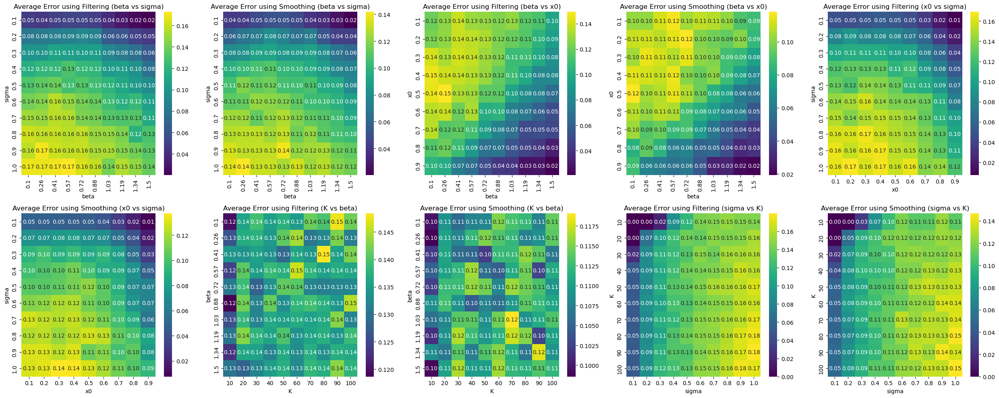

In [292]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the HMMRampModel class and related functions are already defined

def calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=1000, filter=False):
    x_t_expectation_all, x_t_trajectories_all = simulate_and_infer_xt(ramp_params, num_steps, num_trials, filter=filter)
    error = np.mean(np.abs(x_t_expectation_all - x_t_trajectories_all))
    return error

# Define the ranges of the parameters
beta_values = np.linspace(0.1, 1.5, 10)
sigma_values = np.linspace(0.1, 1, 10)
x0_values = np.linspace(0.1, 0.9, 9)
K_values = np.linspace(10, 100, 10, dtype=int)  # Ensure K_values are integers

# Function to plot heatmaps
def plot_heatmaps_ramping(x_values, y_values, x_label, y_label, filter_label, filter=True, ax=None):
    average_error_values = np.zeros((len(y_values), len(x_values)))

    for i, x in enumerate(x_values):
        for j, y in enumerate(y_values):
            ramp_params = {'beta': x, 'sigma': y, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'beta' and y_label == 'sigma' else \
                          {'beta': x, 'sigma': 0.5, 'x0': y, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'beta' and y_label == 'x0' else \
                          {'beta': 0.5, 'sigma': y, 'x0': x, 'Rh': 50, 'dt': 0.01, 'K': 50} if x_label == 'x0' and y_label == 'sigma' else \
                          {'beta': 0.5, 'sigma': 0.5, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': x} if x_label == 'K' and y_label == 'beta' else \
                          {'beta': 0.5, 'sigma': x, 'x0': 0.2, 'Rh': 50, 'dt': 0.01, 'K': y}  # 'sigma' vs 'K'
            average_error_values[j, i] = calculate_average_error_across_trials(ramp_params, num_steps=100, num_trials=100, filter=filter)

    sns.heatmap(average_error_values, xticklabels=np.round(x_values, 2), yticklabels=np.round(y_values, 2), annot=True, fmt=".2f", cmap="viridis", ax=ax)
    ax.set_title(f'Average Error using {filter_label} ({x_label} vs {y_label})')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Create a 2x5 grid for the plots
fig, axs = plt.subplots(2, 5, figsize=(25, 10))

# Plot heatmaps for each combination of parameters
# beta vs sigma
plot_heatmaps_ramping(beta_values, sigma_values, 'beta', 'sigma', 'Filtering', filter=True, ax=axs[0, 0])
plot_heatmaps_ramping(beta_values, sigma_values, 'beta', 'sigma', 'Smoothing', filter=False, ax=axs[0, 1])

# beta vs x0
plot_heatmaps_ramping(beta_values, x0_values, 'beta', 'x0', 'Filtering', filter=True, ax=axs[0, 2])
plot_heatmaps_ramping(beta_values, x0_values, 'beta', 'x0', 'Smoothing', filter=False, ax=axs[0, 3])

# sigma vs x0
plot_heatmaps_ramping(x0_values, sigma_values, 'x0', 'sigma', 'Filtering', filter=True, ax=axs[0, 4])
plot_heatmaps_ramping(x0_values, sigma_values, 'x0', 'sigma', 'Smoothing', filter=False, ax=axs[1, 0])

# K vs beta
plot_heatmaps_ramping(K_values, beta_values, 'K', 'beta', 'Filtering', filter=True, ax=axs[1, 1])
plot_heatmaps_ramping(K_values, beta_values, 'K', 'beta', 'Smoothing', filter=False, ax=axs[1, 2])

# sigma vs K
plot_heatmaps_ramping(sigma_values, K_values, 'sigma', 'K', 'Filtering', filter=True, ax=axs[1, 3])
plot_heatmaps_ramping(sigma_values, K_values, 'sigma', 'K', 'Smoothing', filter=False, ax=axs[1, 4])

plt.tight_layout()
plt.show()


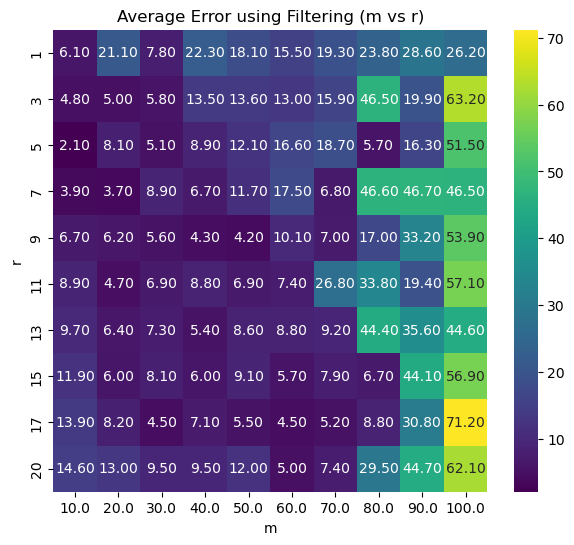

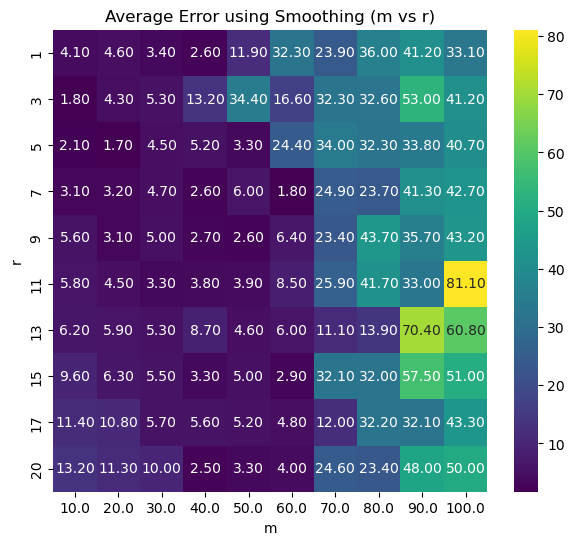

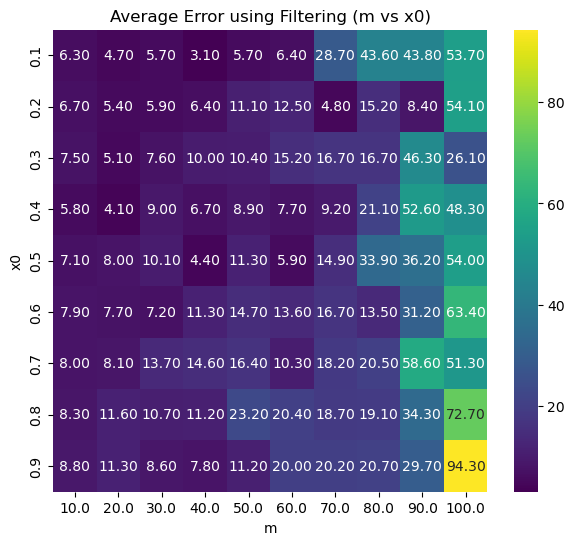

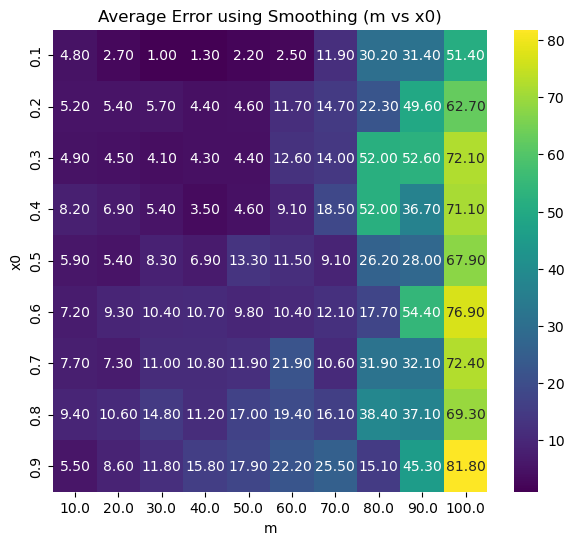

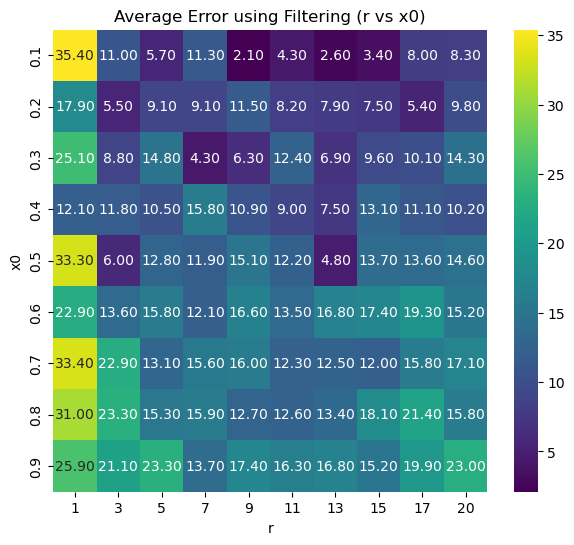

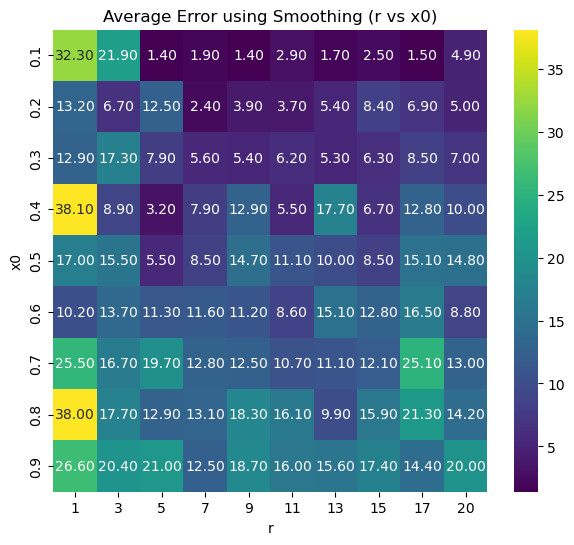

In [293]:
#stepping model plot
import seaborn as sns


# Define the ranges of the parameters
m_values = np.linspace(10, 100, 10)
r_values = np.linspace(1, 20, 10, dtype=int)
x0_values = np.linspace(0.1, 0.9, 9)

# Function to plot heatmaps
def plot_heatmaps(x_values, y_values, x_label, y_label, filter_label, filter=True):
    average_error_values = np.zeros((len(y_values), len(x_values)))

    for i, x in enumerate(x_values):
        for j, y in enumerate(y_values):
            step_params = {'m': x, 'r': y, 'x0': 0.2, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'r' else \
                          {'m': x, 'r': 10, 'x0': y, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'x0' else \
                          {'m': 50, 'r': x, 'x0': y, 'Rh': 50, 'dt': 0.01}
            average_error_values[j, i] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=10, filter=filter)

    plt.figure(figsize=(7, 6))
    sns.heatmap(average_error_values, xticklabels=np.round(x_values, 2), yticklabels=np.round(y_values, 2), annot=True, fmt=".2f", cmap="viridis")
    plt.title(f'Average Error using {filter_label} ({x_label} vs {y_label})')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.show()

# Plot heatmaps for each combination of parameters
# m vs r
plot_heatmaps(m_values, r_values, 'm', 'r', 'Filtering', filter=True)
plot_heatmaps(m_values, r_values, 'm', 'r', 'Smoothing', filter=False)

# m vs x0
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Filtering', filter=True)
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Smoothing', filter=False)

# r vs x0
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Filtering', filter=True)
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Smoothing', filter=False)


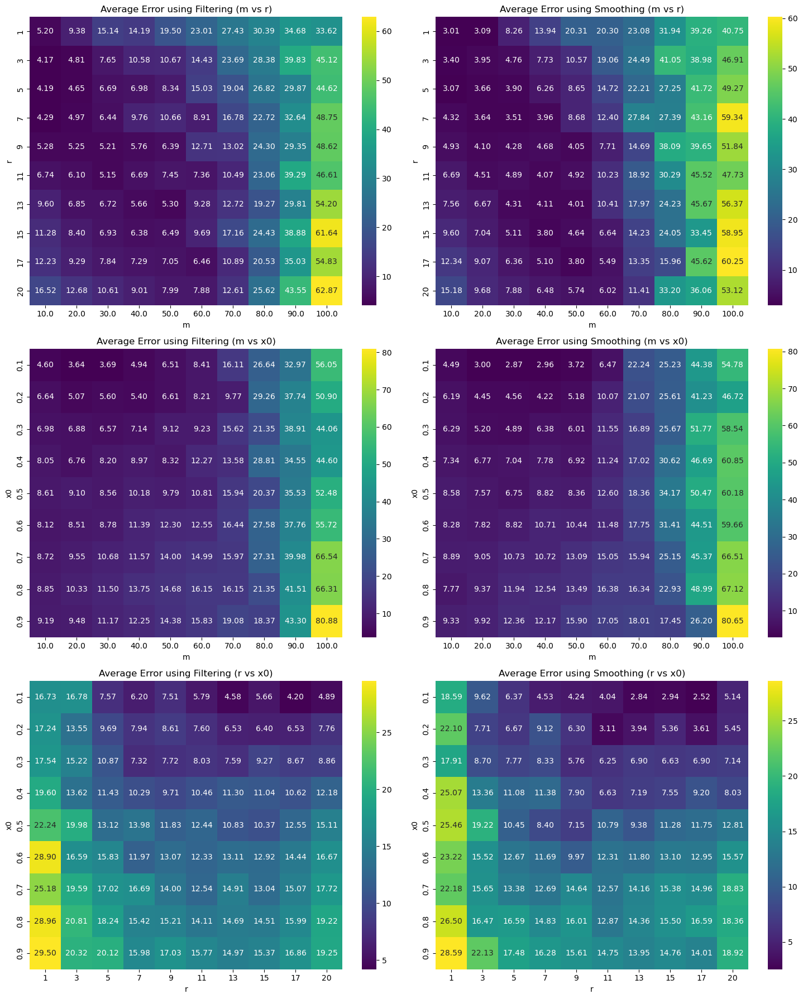

In [294]:
# Stepping model Function to plot heatmaps
# Define the ranges of the parameters
m_values = np.linspace(10, 100, 10)
r_values = np.linspace(1, 20, 10, dtype=int)
x0_values = np.linspace(0.1, 0.9, 9)
def plot_heatmaps(x_values, y_values, x_label, y_label, filter_label, filter=True, ax=None):
    average_error_values = np.zeros((len(y_values), len(x_values)))

    for i, x in enumerate(x_values):
        for j, y in enumerate(y_values):
            step_params = {'m': x, 'r': y, 'x0': 0.2, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'r' else \
                          {'m': x, 'r': 10, 'x0': y, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'x0' else \
                          {'m': 50, 'r': x, 'x0': y, 'Rh': 50, 'dt': 0.01}
            average_error_values[j, i] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=100, filter=filter)

    sns.heatmap(average_error_values, xticklabels=np.round(x_values, 2), yticklabels=np.round(y_values, 2), annot=True, fmt=".2f", cmap="viridis", ax=ax)
    ax.set_title(f'Average Error using {filter_label} ({x_label} vs {y_label})')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Create a 3x2 grid for the plots
fig, axs = plt.subplots(3, 2, figsize=(15, 18))

# Plot heatmaps for each combination of parameters
# m vs r
plot_heatmaps(m_values, r_values, 'm', 'r', 'Filtering', filter=True, ax=axs[0, 0])
plot_heatmaps(m_values, r_values, 'm', 'r', 'Smoothing', filter=False, ax=axs[0, 1])

# m vs x0
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Filtering', filter=True, ax=axs[1, 0])
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Smoothing', filter=False, ax=axs[1, 1])

# r vs x0
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Filtering', filter=True, ax=axs[2, 0])
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Smoothing', filter=False, ax=axs[2, 1])

plt.tight_layout()
plt.show()

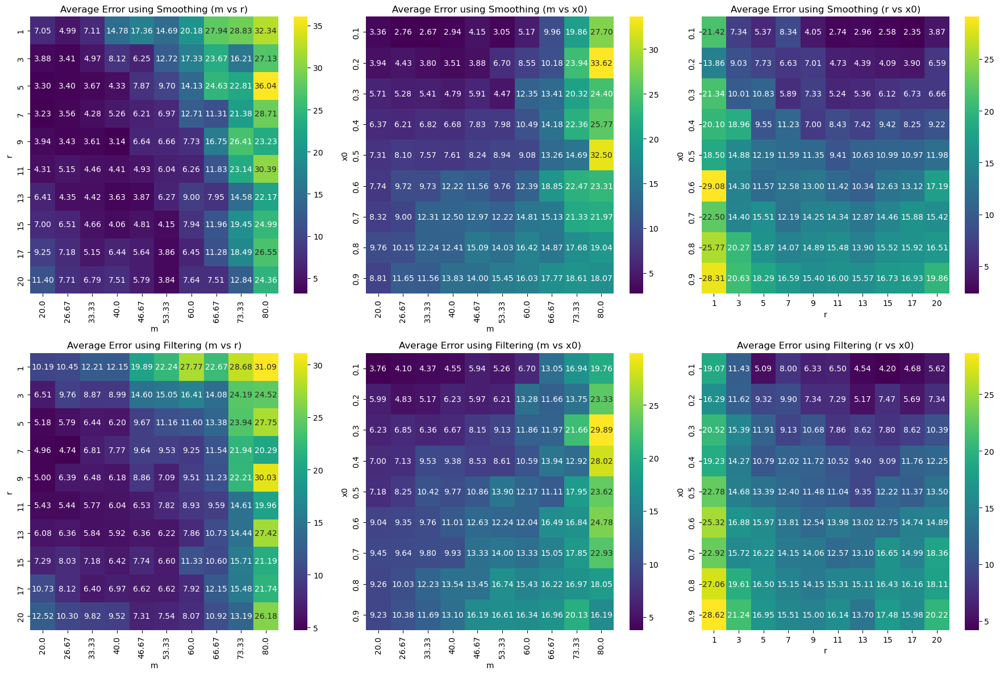

In [295]:
# Stepping model Function to plot heatmaps
import seaborn as sns

def calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=1000, filter=False):
    # Run the simulation and inference
    s_t_posterior, jump_times = step_simulate_and_infer_xt(step_params, num_steps, num_trials, filter=filter)

    # The actual states are represented by jump times converted into binary steps
    actual_states = np.zeros((num_trials, num_steps))
    error = 0
    for trial in range(num_trials):
        jump_time = jump_times[trial]
        actual_states[trial, jump_time:] = 1  # Assuming the state changes to 1 after jump time

        # Calculate the point where s_t_posterior first reaches 0.5
        first_reach_0_5 = np.argmax(s_t_posterior[trial][:, -1] >= 0.5)
        error += abs(jump_time - first_reach_0_5)

    # Calculate average error
    average_error = error / num_trials
    return average_error

# Define the ranges of the parameters
m_values = np.linspace(20, 80, 10)
r_values = np.linspace(1, 20, 10, dtype=int)
x0_values = np.linspace(0.1, 0.9, 9)

# Function to plot heatmaps
def plot_heatmaps(x_values, y_values, x_label, y_label, filter_label, filter=True, ax=None):
    average_error_values = np.zeros((len(y_values), len(x_values)))

    for i, x in enumerate(x_values):
        for j, y in enumerate(y_values):
            step_params = {'m': x, 'r': y, 'x0': 0.2, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'r' else \
                          {'m': x, 'r': 10, 'x0': y, 'Rh': 50, 'dt': 0.01} if x_label == 'm' and y_label == 'x0' else \
                          {'m': 50, 'r': x, 'x0': y, 'Rh': 50, 'dt': 0.01}
            average_error_values[j, i] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=100, filter=filter)

    sns.heatmap(average_error_values, xticklabels=np.round(x_values, 2), yticklabels=np.round(y_values, 2), annot=True, fmt=".2f", cmap="viridis", ax=ax)
    ax.set_title(f'Average Error using {filter_label} ({x_label} vs {y_label})')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Create a 2x3 grid for the plots
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Plot heatmaps for each combination of parameters
# m vs r
plot_heatmaps(m_values, r_values, 'm', 'r', 'Smoothing', filter=False, ax=axs[0, 0])
plot_heatmaps(m_values, r_values, 'm', 'r', 'Filtering', filter=True, ax=axs[1, 0])

# m vs x0
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Smoothing', filter=False, ax=axs[0, 1])
plot_heatmaps(m_values, x0_values, 'm', 'x0', 'Filtering', filter=True, ax=axs[1, 1])

# r vs x0
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Smoothing', filter=False, ax=axs[0, 2])
plot_heatmaps(r_values, x0_values, 'r', 'x0', 'Filtering', filter=True, ax=axs[1, 2])

plt.tight_layout()
plt.show()


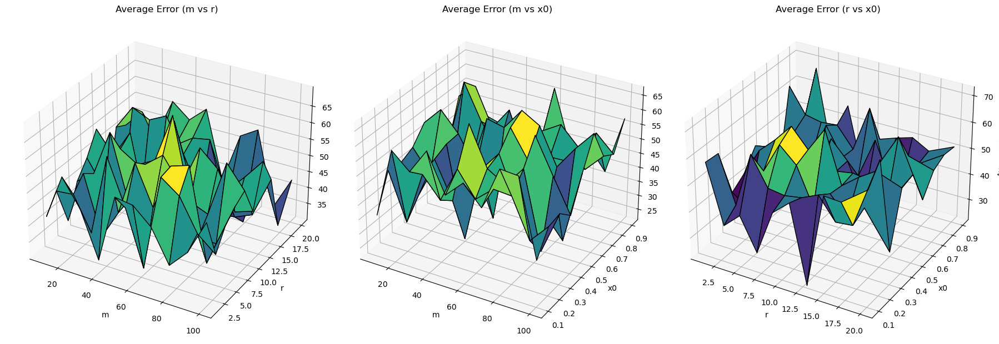

In [297]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Placeholder for step_simulate_and_infer_xt function
def step_simulate_and_infer_xt(step_params, num_steps, num_trials, filter=False):
    # This should return s_t_posterior and jump_times based on your actual implementation
    s_t_posterior = np.random.rand(num_trials, num_steps, 2)
    jump_times = np.random.randint(0, num_steps, size=num_trials)
    return s_t_posterior, jump_times

# Function to calculate the average error across trials
def calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=1000, filter=False):
    s_t_posterior, jump_times = step_simulate_and_infer_xt(step_params, num_steps, num_trials, filter=filter)
    actual_states = np.zeros((num_trials, num_steps))
    error = 0
    for trial in range(num_trials):
        jump_time = jump_times[trial]
        actual_states[trial, jump_time:] = 1  # Assuming the state changes to 1 after jump time
        first_reach_0_5 = np.argmax(s_t_posterior[trial][:, -1] >= 0.5)
        error += abs(jump_time - first_reach_0_5)
    average_error = error / num_trials
    return average_error

# Define the ranges of the parameters
m_values = np.linspace(10, 100, 10)
r_values = np.linspace(1, 20, 10, dtype=int)
x0_values = np.linspace(0.1, 0.9, 9)

# Function to calculate average errors for a grid of parameter values
def calculate_average_errors(x_values, y_values, fixed_value, param_set):
    X, Y = np.meshgrid(x_values, y_values)
    average_errors = np.zeros_like(X, dtype=float)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            step_params = {'m': X[i, j], 'r': Y[i, j], 'x0': fixed_value, 'Rh': 50, 'dt': 0.01} if param_set == 'm_r' else \
                          {'m': X[i, j], 'r': fixed_value, 'x0': Y[i, j], 'Rh': 50, 'dt': 0.01}  # param_set == 'r_x0'
            average_errors[i, j] = calculate_step_average_error_across_trials(step_params, num_steps=100, num_trials=10, filter=False)

    return X, Y, average_errors

# Function to plot a 3D surface
def plot_3d_surface(X, Y, values, x_label, y_label, z_label, title, ax):
    ax.plot_surface(X, Y, values, cmap='viridis', edgecolor='k')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    ax.set_title(title)

# Generate 3D plots for each combination of parameters
fig = plt.figure(figsize=(18, 12))

# Plot for m vs r with x0 fixed
ax1 = fig.add_subplot(131, projection='3d')
X, Y, average_errors = calculate_average_errors(m_values, r_values, 0.2, 'm_r')
plot_3d_surface(X, Y, average_errors, 'm', 'r', 'Average Error', 'Average Error (m vs r)', ax1)

# Plot for m vs x0 with r fixed
ax2 = fig.add_subplot(132, projection='3d')
X, Y, average_errors = calculate_average_errors(m_values, x0_values, 10, 'm_x0')
plot_3d_surface(X, Y, average_errors, 'm', 'x0', 'Average Error', 'Average Error (m vs x0)', ax2)

# Plot for r vs x0 with m fixed
ax3 = fig.add_subplot(133, projection='3d')
X, Y, average_errors = calculate_average_errors(r_values, x0_values, 50, 'r_x0')
plot_3d_surface(X, Y, average_errors, 'r', 'x0', 'Average Error', 'Average Error (r vs x0)', ax3)

plt.tight_layout()
plt.show()


# Week 3

This week we will start proceed to inference of model parameters (aka learning or fitting of model parameters), as well as<br>
to  preliminary model selection.

For Bayesian inference of parameters, we would like to compute the posterior distribution over model parameters, $\Theta$, given a dataset of <br>
observed spike trains:

$P(\Theta\, |\, \mathrm{data}\!=\!\{(n_t)_{t=1}^T\}, M)$

where the observed data are the set of spike trains in different trials and $M$ ($ =$ ramp or step) denotes the model. According to the Bayes rule<br>


$P(\Theta| \mathrm{data}, M) \propto P(\mathrm{data}|\Theta, M) P(\Theta| M). \qquad\qquad$             **(3.1)**

where $P(\Theta| M)$ is the prior distribution over parameters and $P(\mathrm{data}|\Theta, M)$ is the model's likelihood function.<br>
Calculating the posterior distribution is hard  in general, since the  expression on the right hand side of Eq. (3.1)<br>
is not normalized (below we will refer to this expression  as the **unnormalized posterior**), and calculating <br>
the normalization constant requires integrating or summing over the possibly high-dimensional space of parameters.  <br>
The same is true if we want to calulate the expectation of some function of parameters (e.g. $\mathbb{E}[\Theta| \text{data}, M]$):<br>
again we have to integrate over the parameters.
In general, the computational cost of this integration grows exponentially in the number of parameters <br>
(or the dimension of parameter space). Thus Bayesian methods almost inevitably rely on one or another type of approximation<br>
 for calculating the posterior.

In our project, the models have only 3 unknown parameters to be inferred, and the above problem is not prohibitive. <br>
However, if, e.g., we approximate the integral by a sum over a discretized 3D grid of points, such that the grid partitions<br>
 each parameter's range of values (as determined by the prior) into, say, only $M = 10$ sub-intervals, we will have to sum <br>
over $M^3$ points, which requires $M^3 = 1000$ evaluations of the likelihood.

In our case, at each point of the grid, the likelihood or its logarithm, can be calculated using the forward pass<br>
of the forward-backward algorithm (those curious about the details: see the section Model Log-likelihood of the [notes on the FBA](https://github.com/ahmadianlab/gg3_nda/blob/main/fwdbwd.ipynb)).<br>
Note that this requires order $T$ matrix multiplications, each involving order $K^2$ arithmetic operations for $K$ Markov states;<br>
thus evaluation of the log-likelikehood for each value of parameters has cost $O(K^2 T)$.<br>
Thus computing the likelihood is relatively expensive (even if on our laptops it can be evaluated in a fraction of a second),<br>
and evaluating the posterior on such a grid has computational cost $O(M^d K^2 T)$, where for us $d=3$, or in some of the tasks<br>
below $d=2$.                                                                                                                

Use the function `hmm_normalizer` of `inference.py` to calculate the model **log-** likelihood using the forward pass.

**Prior distributions:**
Unless instructed otherwise, use a uniform prior distribution on the parameters, on specified ranges. For $\sigma$ of the ramp model<br>
it will be more sensible to use a uniform prior on its logarithm. In fact, to make things easier you should work with $\ln \sigma$, when<br>
evaluating the unnormalized posterior, and in the grid method, construct the (regular) grid for $\ln \sigma$, instead of $\sigma$ <br>
(but obviously exponentiate $\ln \sigma$ when passing to your likelihood function, and when calculating posterior estimates of the parameters<br>
calculate the posterior mean or error of the exponential of the $\ln \sigma$ values). Sensible ranges are as follows:

$\beta \in [0, 4]$

$\ln\sigma \in [\ln(0.04), \ln(4)]$

$r \in \{1,2, \ldots, 10\}$ (note that you can still further "discretize" or coarse-grain this range of integers into a fewer number of "bins".)

$m \in [0,T]$

$x_0 \in [0, 1]$

**Hyperparameters:** Unless otherwise stated, use $T = 100$ and for the ramp model: $K = 100$.

#### <span style='color:lightgreen'> Note on Step Likelihood </style>

Note on the step model's likelihood evaluation:

Before we proceed to the tasks, a note on the $K = r$ hidden-state HMM implementation of the step model (you can ignore this note<br>
if you have opted to use the time-inhomogeneous Markov chain implementation instead). As you may have noted,<br>
the jump times in the $r$-state implementation will have a delay of $r-1$ steps compared to the draws form the $\mathrm{NB}(m, r)$ distribution<br>
as used in Week 1. For simulating a trial with $T$ time steps, this issue can be dealt with by a time-shift,<br>
at the expense of simulating the Markov chain for $r$ extra steps: simulate $T+r - 1$ steps but only consider the last $T$ steps,<br>
and only generate spikes in those final $T$ steps.<br>
This week, however, we would like to evaluate the likelihoods of the two models, on the *same* set of spike trains <br>
on the interval $t = 1:T$, using the forward pass of FBA. In this case, the necessary compensation for the extra, observation-less<br>
$r$ steps can be made by the following modification to the input argument `ll` that you will pass to the function `hmm_normalizer`:  <br>

- evaluate this array as normal, as the $T \times K$ matrix of observed probabilities of $n_{1:T}$ in all possible hidden states.<br>
- then prepend $r-1$ rows with all elements equal to 0 to the top of this matrix to make it a $(r-1+T)\times K$ matrix instead.

(If curious, you can verify that this is the correct way of generalizing the forward pass to  cases with "missing observations" by inspecting<br>
the [details of the forward pass](https://github.com/ahmadianlab/gg3_nda/blob/main/fwdbwd.ipynb). Also note that this compenstation<br>
is exactly equivalent to running the forward pass on the $T$ steps with observation but using $\mathcal{T}^{r-1} \pi$ --where $\mathcal{T}$
is transition matrix--<br> as the initial Markov chain probability distribution instead of $\pi$.)





In [298]:
mode = "colab" # change this to "local" if you are on your own computer

if mode == "local":
    import models
elif mode == "colab":
    import requests
    url = 'https://github.com/ahmadianlab/gg3_nda/blob/main/models.py?raw=true'
    r = requests.get(url)
    with open('models.py', 'w') as f:
        f.write(r.text)
    import models
else:
    raise Exception("mode must be either local or colab")

if mode == "local":
    import inference
elif mode == "colab":
    import requests
    url = 'https://github.com/ahmadianlab/gg3_nda/blob/main/inference.py?raw=true'
    r = requests.get(url)
    with open('inference.py', 'w') as f:
        f.write(r.text)
    import inference
else:
    raise Exception("mode must be either local or colab")

from inference import hmm_expected_states, poisson_logpdf, hmm_normalizer
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import seaborn as sns
from scipy.special import logsumexp

# made class for HMM version of ramping model to make it easier for later
class HMMRampModel:
    def __init__(self, beta=0.5, sigma=0.5, x0=0.2, Rh=50, dt=0.01, K=50):
        self.beta = beta
        self.sigma = sigma
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.K = K
        self.T = self.create_transition_matrix()
        self.pi = self.ramp_initial_state_distribution()

    def create_transition_matrix(self):
        mu = self.beta * self.dt
        variance = (self.sigma ** 2) * self.dt

        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        states = np.linspace(0, 1, self.K)
        T = np.zeros((self.K, self.K))

        for s in range(self.K):
            current_state_value = states[s]
            mu_s = current_state_value + mu

            for s_prime in range(self.K):
                next_state_value = states[s_prime]
                if s < self.K - 1:
                    T[s, s_prime] = gaussian_pdf(next_state_value, mu_s, variance)

            if s < self.K - 1:
                T[s, :] /= np.sum(T[s, :])

        T[self.K-1, self.K-1] = 1.0

        return T

    def ramp_initial_state_distribution(self):
        def gaussian_pdf(x, mu, variance):
            return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(-((x - mu) ** 2) / (2 * variance))

        mu = self.x0
        variance = self.sigma ** 2 * self.dt
        states = np.linspace(0, 1, self.K)
        pi = gaussian_pdf(states, mu, variance)
        pi /= np.sum(pi)

        return pi

    # This function gives x_t
    def simulate_x_t(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        x_t_trials = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t_trials.append(np.array(chain) / (K - 1)) # this np.array(chain) / (K - 1) is x_t

        return np.array(x_t_trials)

    # This function gives a single spike n_t
    def calculate_spike_counts(self, x_t):
        r_t = self.Rh * np.maximum(0, x_t)  # Calculate the firing rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    # This function gives rates as array r_t
    def calculate_rates(self, num_steps, num_trials):
        K = len(self.pi)
        states = np.arange(K)
        rates = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)
            chain = [current_state]

            for _ in range(num_steps - 1):
                current_state = np.random.choice(states, p=self.T[current_state])
                chain.append(current_state)

            x_t = np.array(chain) / (K - 1)
            r_t = self.Rh * np.maximum(0, x_t)
            rates.append(r_t)

        return np.array(rates)

    # New function to simulate spike trains and return them as an array of n_t
    def simulate_spike_trains_array(self, num_steps, num_trials):
        x_t_trajectories = self.simulate_x_t(num_steps, num_trials)
        spike_trains = []

        for trial in range(num_trials):
            x_t = x_t_trajectories[trial]
            n_t = self.calculate_spike_counts(x_t)
            spike_trains.append(n_t)

        return np.array(spike_trains), x_t_trajectories



# UPDATED: Class for HMM approximation of the stepping model
class HMMStepModel:
    def __init__(self, m=50, r=10, x0=0.2, Rh=50, dt=0.01):
        self.m = m
        self.r = r
        self.p = r / (m + r)
        self.x0 = x0
        self.Rh = Rh
        self.dt = dt
        self.T = self.create_transition_matrix()
        self.pi = self.initial_distribution()

    def create_transition_matrix(self):
        T = np.zeros((self.r + 1, self.r + 1))
        for i in range(self.r):
            T[i, i] = 1 - self.p  # Probability of staying in the same state
            T[i, i + 1] = self.p  # Probability of moving to the next state
        T[self.r, self.r] = 1  # Once in the final state, stay there
        return T

    def initial_distribution(self):
        pi0 = np.zeros(self.r + 1)
        pi0[0] = 1  # Initial state probability vector [1, 0, 0, ..., 0]
        pi_r = pi0 @ np.linalg.matrix_power(self.T, self.r)
        return pi_r

    def simulate_jump_times(self, num_steps, num_trials):
        states = np.arange(len(self.T))  # Define the states
        jump_times = []

        for trial in range(num_trials):
            current_state = np.random.choice(states, p=self.pi)  # Start using the initial distribution
            for step in range(num_steps):
                if current_state == self.r:
                    jump_times.append(step + 1)  # Record the jump time (1-based index)
                    break  # Stop after the first jump
                current_state = np.random.choice(states, p=self.T[current_state])
            else:
                jump_times.append(num_steps)  # Record the last time step if no jump occurs

        # Ensure jump_times has length of num_trials
        assert len(jump_times) == num_trials, f"Length of jump_times ({len(jump_times)}) does not match num_trials ({num_trials})"

        return jump_times

    def calculate_spike_counts(self, jump_time, num_steps):
        r_t = np.ones(num_steps) * self.x0 * self.Rh  # Initialize with pre-jump rate
        if jump_time < num_steps:
            r_t[jump_time:] = self.Rh  # Update to post-jump rate
        mean_count = r_t * self.dt  # Obtain the mean count in each time bin
        n_t = np.random.poisson(mean_count)  # Draw spike counts from Poisson distribution
        return n_t

    def simulate_spike_trains(self, jump_times, num_steps, num_trials):
        spike_trains = []
        for trial in range(num_trials):
            spike_train = self.calculate_spike_counts(jump_times[trial], num_steps)
            spike_trains.append(spike_train)
        return np.array(spike_trains)

### <span style='color:lightgreen'> Task 3.1 </style>
**Grid approximation**

We will start this task by fixing the value of $x_0$ to 0.2 (for both models); so we will not infer it, but  assume it known.<br>
Construct a regular 2D grid on each model's parameter space (on the ranges given above, and using $\ln \sigma$ instead of $\sigma$) with $M$ grid points along each coordinate axis,<br>
thinking of each grid point as <u>*the center*</u> of its "assigned" sub-interval.<br>
Start by relatively high values of $M$, e.g. $M=30$.<br>

(For one calculation of the posterior over all grid points, going to higher $M$'s is also feasible, but since you want to experiment and explore with different parameters <br>
 and hyperparameters, you should compromise on using higher values of $M$. But ultimately use your own judgement, in particular by using $M < 30$ if necessary. <br>
Similarly, in the sub-tasks below, make reasonable choices of the number of different cases of true parameters, etc., that you explore.<br>
It is probably wise to start small-scale, in a first pass through all sub-tasks, and after you have a rough overview of computational times, inference behaviour, etc,<br>
do  more thorough final runs going over a larger number of possibilities and/or using higher $M$ values, which would take longer to compute.)

For each model simulate a dataset of $N_{\rm trial}$ spike trains, and for each dataset, evaluate *that* model's log-likelihood on all grid points<br>
(by summing the log-likelihood of all trials), and form the *normalized* posterior by using Bayes' rule Eq. (3.1).

**3.1.1:** Visualize the (approximate) posterior on the grid (e.g. using `plt.imshow`) with a  super-imposed point representing the true parameters. <br>
Repeat for different true parameter values (within the ranges of the prior distribution) and for different number of trials (over a range from 1 to 400). <br>
Document your observations of systematic dependence of the posterior on the number of trials. Similarly, note any systematic changes in behaviour<br>
for different values of the true parameters.

**3.1.2:** In addition to visualisation, evaluate the posterior expectations of the parameters as their estimates, as well as their posterior standard deviations (as measures of their<br>
posterior uncertainties or  "error bars" for their estimates).  Given the true parameter value, you can also evaluate the actual estimation error of different parameters, <br>
for  dataset of different sizes (different number of trials) or choices of true parameters (averaging the error over a few, even just 2-3, datasets when $N_{trial}$ is low). <br>
Make appropriate plots.

Also quantitatively compare the estimation errors with the posterior uncertainties of different parameters.
What do you expect for this relationship, and what do you observe?

**3.1.3:** Repeat the above (using judgment to scale down $M$ or the number of explored cases) for the case where $x_0$ is unknown as well, and has to be inferred.

#### <span style="color:lightgreen"> 3.1.1 </span>



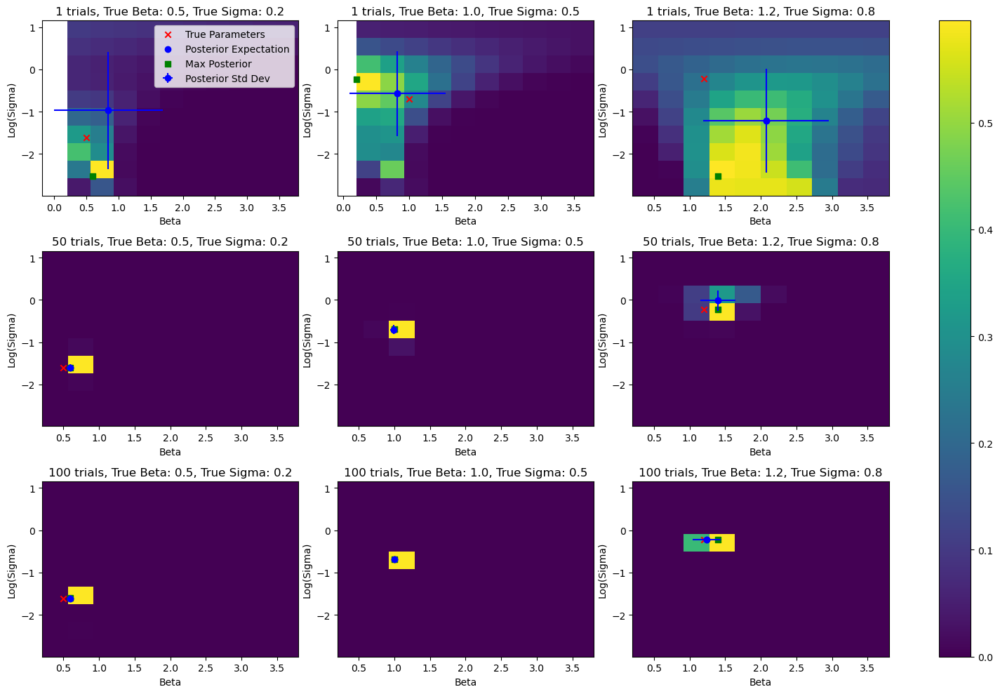

In [300]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import logsumexp

# Assume HMMRampModel, poisson_logpdf, and hmm_normalizer are defined elsewhere

# Define ranges for parameters
K = 11
beta_range = np.linspace(0, 4, K)
log_sigma_range = np.linspace(np.log(0.04), np.log(4), K)
sigma_range = np.exp(log_sigma_range)

# Calculate midpoints
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)

# Create a grid of parameter values using midpoints
beta_grid, log_sigma_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints)
M = beta_grid.shape[0]

# Fix x0 to 0.2
x0 = 0.2

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma):
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    x_ts = np.linspace(0, 1, 50)
    r_t = 50 * np.maximum(0, x_ts)
    lambdas = r_t * 0.01
    log_likelihoods = np.zeros((M, M))
    for i in range(M):
        for j in range(M):
            beta = beta_grid[i, j]
            sigma = sigma_midpoints[i]
            ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
            ll = 0
            for trial in range(num_trials):
                log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
            log_likelihoods[i, j] = ll

    prior = 1 / (M * M)
    unnormalized_posterior = log_likelihoods + np.log(prior)
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Posterior expectations and uncertainties
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_std_beta, posterior_std_log_sigma

# Set up the figure with subplots
fig, axes = plt.subplots(len(num_trials_range), len(true_parameters), figsize=(15, 10))

# Run simulations and visualize posteriors
true_parameters = [(0.5, 0.2), (1.0, 0.5), (1.2, 0.8)]
for row_idx, num_trials in enumerate(num_trials_range):
    for col_idx, (true_beta, true_sigma) in enumerate(true_parameters):
        posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma)
        max_posterior_idx = np.unravel_index(np.argmax(posterior), posterior.shape)
        max_posterior_beta = beta_grid[max_posterior_idx]
        max_posterior_log_sigma = log_sigma_grid[max_posterior_idx]

        mean_beta, mean_log_sigma, std_beta, std_log_sigma = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid)

        ax = axes[row_idx, col_idx]
        im = ax.imshow(posterior, extent=(beta_midpoints[0], beta_midpoints[-1], log_sigma_midpoints[0], log_sigma_midpoints[-1]), origin='lower', aspect='auto')
        ax.scatter(true_beta, np.log(true_sigma), color='red', marker='x', label='True Parameters')
        ax.scatter(mean_beta, mean_log_sigma, color='blue', marker='o', label='Posterior Expectation')
        ax.scatter(max_posterior_beta, max_posterior_log_sigma, color='green', marker='s', label='Max Posterior')
        ax.errorbar(mean_beta, mean_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='o', color='blue', label='Posterior Std Dev')
        ax.set_xlabel('Beta')
        ax.set_ylabel('Log(Sigma)')
        ax.set_title(f'{num_trials} trials, True Beta: {true_beta}, True Sigma: {true_sigma}')

        if row_idx == 0 and col_idx == 0:
            ax.legend()

# Adjust layout and show the figure
plt.tight_layout()
fig.colorbar(im, ax=axes, orientation='vertical', fraction=.1)
plt.show()


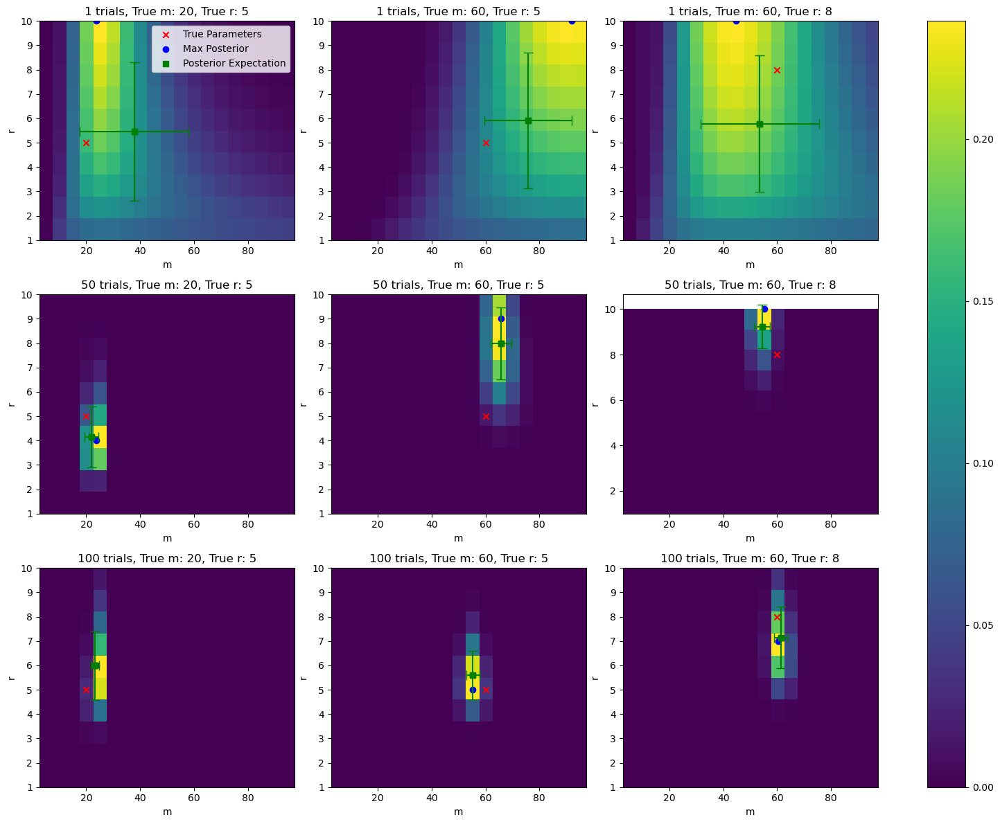

In [302]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import logsumexp

# Assume HMMStepModel, poisson_logpdf, and hmm_normalizer are defined elsewhere
K = 20
# Define ranges for parameters
m_range = np.linspace(0, 100, K)
r_range = [i + 1 for i in range(10)]

# Calculate midpoints for m
m_midpoints = (m_range[:-1] + m_range[1:]) / 2

# Create a grid of parameter values using midpoints for m
m_grid, r_grid = np.meshgrid(m_midpoints, r_range)
M = m_grid.shape[0]

# Fix x0 to 0.2
x0 = 0.2
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_m, true_r):
    step_model = HMMStepModel(m=true_m, r=true_r, x0=x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)

    log_likelihoods = np.zeros((len(r_range), len(m_midpoints)))

    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            r = r_range[i]
            s_ts = np.linspace(0, 1, int(r) + 1)
            r_t = np.ones(len(s_ts)) * x0 * Rh
            r_t[-1] = Rh
            lambdas = r_t * dt

            m = m_grid[i, j]
            step_model = HMMStepModel(m=m, r=int(r), x0=x0)
            ll = 0
            for trial in range(num_trials):
                log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
            log_likelihoods[i, j] = ll

    prior = 1 / (len(r_range) * len(m_midpoints))
    unnormalized_posterior = log_likelihoods + np.log(prior)
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Posterior expectations and uncertainties
def compute_posterior_statistics(posterior, m_grid, r_grid):
    posterior_mean_m = np.sum(posterior * m_grid) / np.sum(posterior)
    posterior_mean_r = np.sum(posterior * r_grid) / np.sum(posterior)

    posterior_std_m = np.sqrt(np.sum(posterior * (m_grid - posterior_mean_m) ** 2) / np.sum(posterior))
    posterior_std_r = np.sqrt(np.sum(posterior * (r_grid - posterior_mean_r) ** 2) / np.sum(posterior))

    return posterior_mean_m, posterior_mean_r, posterior_std_m, posterior_std_r

# Set up the figure with subplots
fig, axes = plt.subplots(len(num_trials_range), len(true_parameters), figsize=(15, 12))

# Run simulations and visualize posteriors
true_parameters = [(20, 5), (60, 5), (60, 8)]
for row_idx, num_trials in enumerate(num_trials_range):
    for col_idx, (true_m, true_r) in enumerate(true_parameters):
        posterior = simulate_and_compute_posterior(num_trials, true_m, true_r)
        mean_m, mean_r, std_m, std_r = compute_posterior_statistics(posterior, m_grid, r_grid)

        ax = axes[row_idx, col_idx]
        im = ax.imshow(posterior, extent=(m_midpoints[0], m_midpoints[-1], r_range[0], r_range[-1]), origin='lower', aspect='auto')
        ax.scatter(true_m, true_r, color='red', marker='x', label='True Parameters')

        max_posterior_idx = np.unravel_index(np.argmax(posterior), posterior.shape)
        max_posterior_m = m_midpoints[max_posterior_idx[1]]
        max_posterior_r = r_range[max_posterior_idx[0]]
        ax.scatter(max_posterior_m, max_posterior_r, color='blue', marker='o', label='Max Posterior')
        ax.scatter(mean_m, mean_r, color='green', marker='s', label='Posterior Expectation')
        ax.errorbar(mean_m, mean_r, xerr=std_m, yerr=std_r, fmt='s', color='green', capsize=5)
        
        ax.set_xlabel('m')
        ax.set_ylabel('r')
        ax.set_title(f'{num_trials} trials, True m: {true_m}, True r: {true_r}')

        if row_idx == 0 and col_idx == 0:
            ax.legend()

# Adjust layout and show the figure
plt.tight_layout()
fig.colorbar(im, ax=axes, orientation='vertical', fraction=.1)
plt.show()

# For the case where x0 is also unknown, repeat the above steps with a 3D grid for (m, r, x0).


#### <span style="color:lightgreen"> 3.1.2 </span>

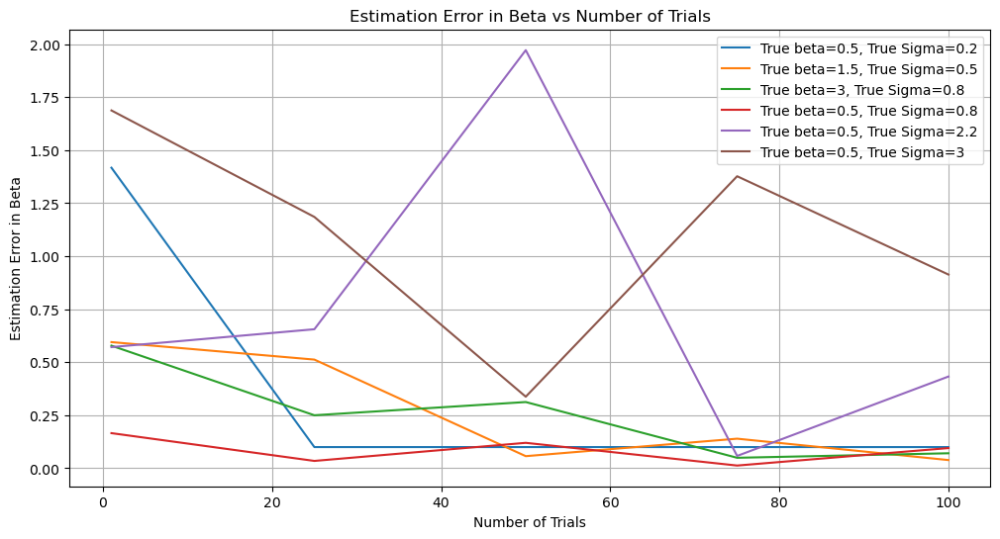

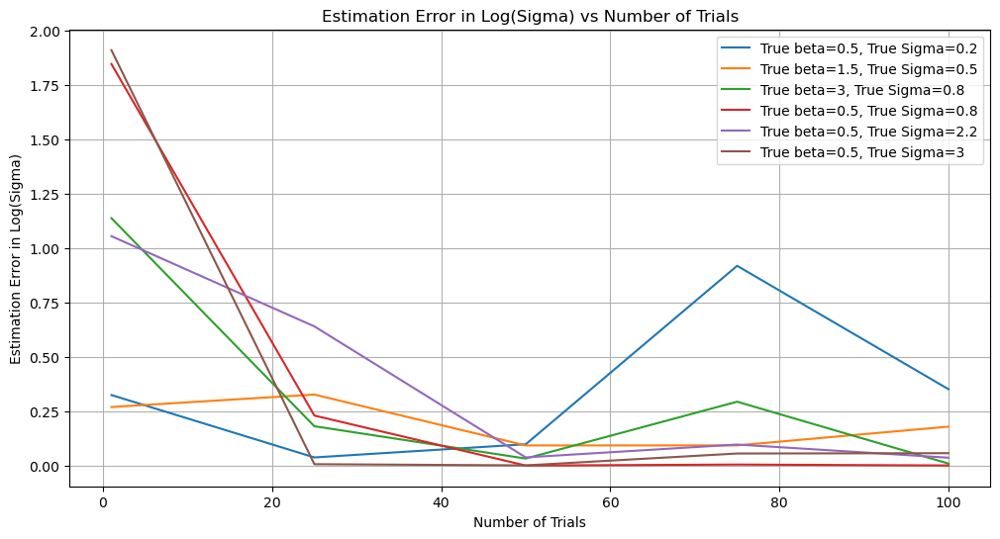

In [304]:
# 3.1.2: Ramping model, plot how error and standard deviation varies with number of trials and true parameter choice, takes 16 minutes

# Define ranges for parameters
K = 11
beta_range = np.linspace(0, 4, K)  # 31 points to get 30 intervals
log_sigma_range = np.linspace(np.log(0.04), np.log(4), K)  # 31 points to get 30 intervals
sigma_range = np.exp(log_sigma_range)

# Calculate midpoints
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)

# Create a grid of parameter values using midpoints
beta_grid, log_sigma_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints)
M = beta_grid.shape[0]  # Number of grid points along each axis

# Fix x0 to 0.2
x0 = 0.2

# Define number of trials
num_trials_range =  [1, 25, 50, 75, 100]
# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma):
    # Simulate spike trains for HMM Ramp Model
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    x_ts = np.linspace(0, 1, 50)
    r_t = 50 * np.maximum(0, x_ts)
    lambdas = r_t * 0.01
    log_likelihoods = np.zeros((M, M))
    for i in range(M):
        for j in range(M):
            beta = beta_grid[i, j]
            sigma = sigma_midpoints[i]
            ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
            ll = 0
            for trial in range(num_trials):
                log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
            log_likelihoods[i, j] = ll

    # Compute unnormalized posterior
    prior = 1 / (M * M)  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to compute posterior statistics
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_std_beta, posterior_std_log_sigma

# Function to run simulations and compute estimation errors
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_beta = {param: [] for param in true_parameters}
    estimation_errors_log_sigma = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_beta, true_sigma in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma)
            mean_beta, mean_log_sigma, std_beta, std_log_sigma = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid)
            estimation_error_beta = abs(mean_beta - true_beta)
            estimation_error_log_sigma = abs(mean_log_sigma - np.log(true_sigma))

            estimation_errors_beta[(true_beta, true_sigma)].append(estimation_error_beta)
            estimation_errors_log_sigma[(true_beta, true_sigma)].append(estimation_error_log_sigma)

    return estimation_errors_beta, estimation_errors_log_sigma

# Function to plot estimation errors
def plot_estimation_errors(estimation_errors, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        plt.plot(num_trials_range, errors, label=f"True beta={true_params[0]}, True Sigma={true_params[1]}")
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error in {parameter_name}')
    plt.title(f'Estimation Error in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(0.5, 0.2), (1.5, 0.5), (3, 0.8), (0.5, 0.8),  (0.5, 2.2), (0.5, 3)]

# Run simulations and get estimation errors
estimation_errors_beta, estimation_errors_log_sigma = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors for beta
plot_estimation_errors(estimation_errors_beta, num_trials_range, 'Beta')

# Plot estimation errors for log(sigma)
plot_estimation_errors(estimation_errors_log_sigma, num_trials_range, 'Log(Sigma)')


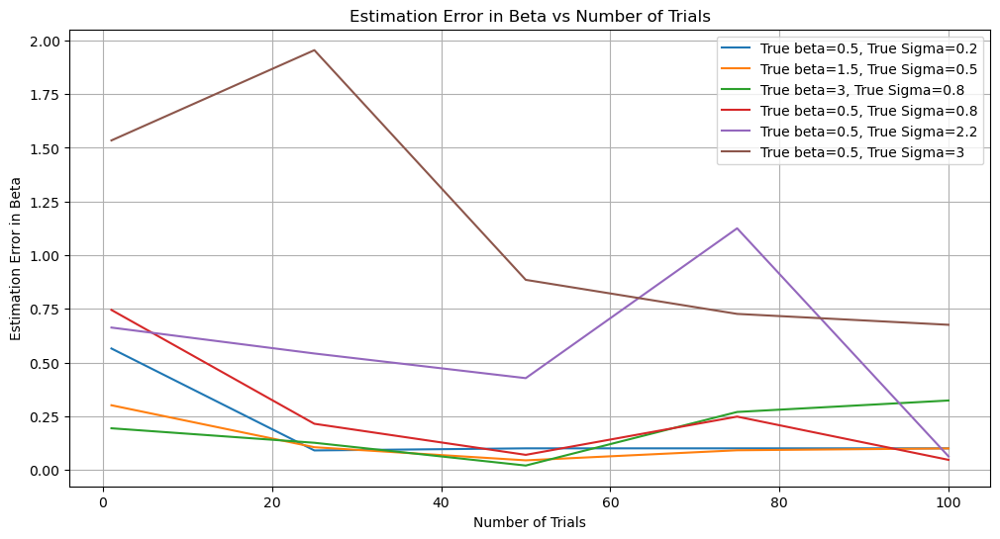

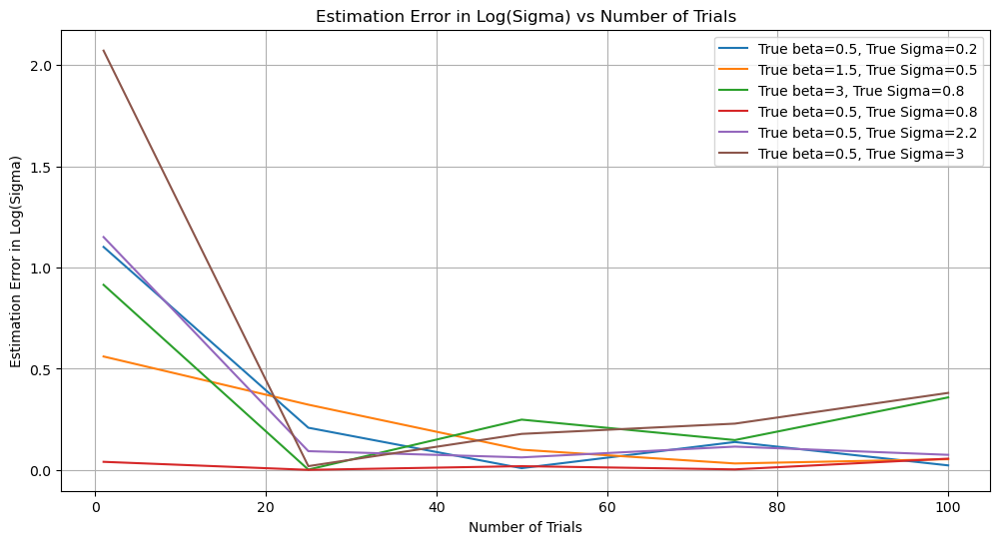

In [305]:
# 3.1.2: Now we want to focus on 100 to 200 region Ramping model, plot how error and standard deviation varies with number of trials and true parameter choice, takes 16 minutes

# Define ranges for parameters
K = 11
beta_range = np.linspace(0, 4, K)  # 31 points to get 30 intervals
log_sigma_range = np.linspace(np.log(0.04), np.log(4), K)  # 31 points to get 30 intervals
sigma_range = np.exp(log_sigma_range)

# Calculate midpoints
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)

# Create a grid of parameter values using midpoints
beta_grid, log_sigma_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints)
M = beta_grid.shape[0]  # Number of grid points along each axis

# Fix x0 to 0.2
x0 = 0.2

# Define number of trials
num_trials_range =  [1, 25, 50, 75, 100]
# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma):
    # Simulate spike trains for HMM Ramp Model
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    x_ts = np.linspace(0, 1, 50)
    r_t = 50 * np.maximum(0, x_ts)
    lambdas = r_t * 0.01
    log_likelihoods = np.zeros((M, M))
    for i in range(M):
        for j in range(M):
            beta = beta_grid[i, j]
            sigma = sigma_midpoints[i]
            ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
            ll = 0
            for trial in range(num_trials):
                log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
            log_likelihoods[i, j] = ll

    # Compute unnormalized posterior
    prior = 1 / (M * M)  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to compute posterior statistics
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_std_beta, posterior_std_log_sigma

# Function to run simulations and compute estimation errors
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_beta = {param: [] for param in true_parameters}
    estimation_errors_log_sigma = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_beta, true_sigma in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma)
            mean_beta, mean_log_sigma, std_beta, std_log_sigma = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid)
            estimation_error_beta = abs(mean_beta - true_beta)
            estimation_error_log_sigma = abs(mean_log_sigma - np.log(true_sigma))

            estimation_errors_beta[(true_beta, true_sigma)].append(estimation_error_beta)
            estimation_errors_log_sigma[(true_beta, true_sigma)].append(estimation_error_log_sigma)

    return estimation_errors_beta, estimation_errors_log_sigma

# Function to plot estimation errors
def plot_estimation_errors(estimation_errors, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        plt.plot(num_trials_range, errors, label=f"True beta={true_params[0]}, True Sigma={true_params[1]}")
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error in {parameter_name}')
    plt.title(f'Estimation Error in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(0.5, 0.2), (1.5, 0.5), (3, 0.8), (0.5, 0.8),  (0.5, 2.2), (0.5, 3)]

# Run simulations and get estimation errors
estimation_errors_beta, estimation_errors_log_sigma = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors for beta
plot_estimation_errors(estimation_errors_beta, num_trials_range, 'Beta')

# Plot estimation errors for log(sigma)
plot_estimation_errors(estimation_errors_log_sigma, num_trials_range, 'Log(Sigma)')


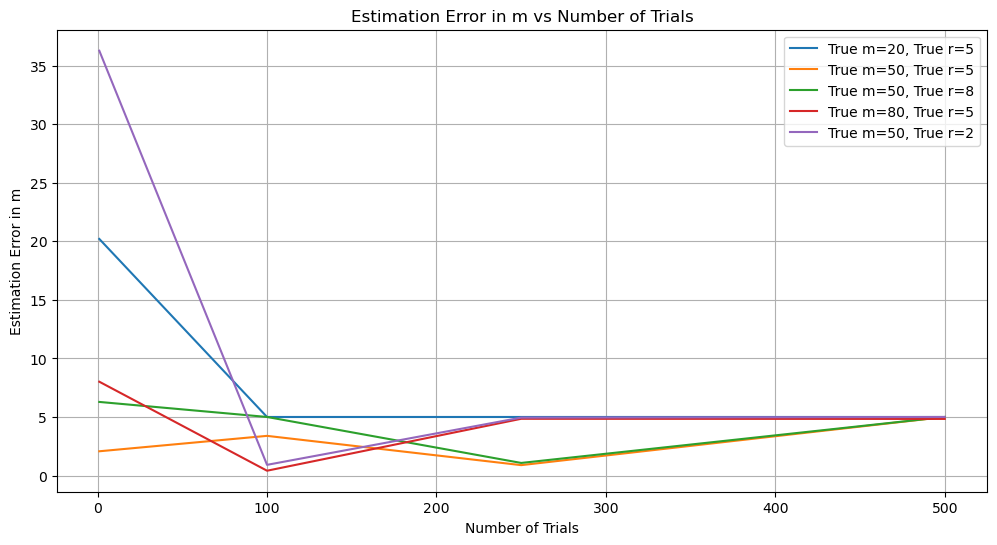

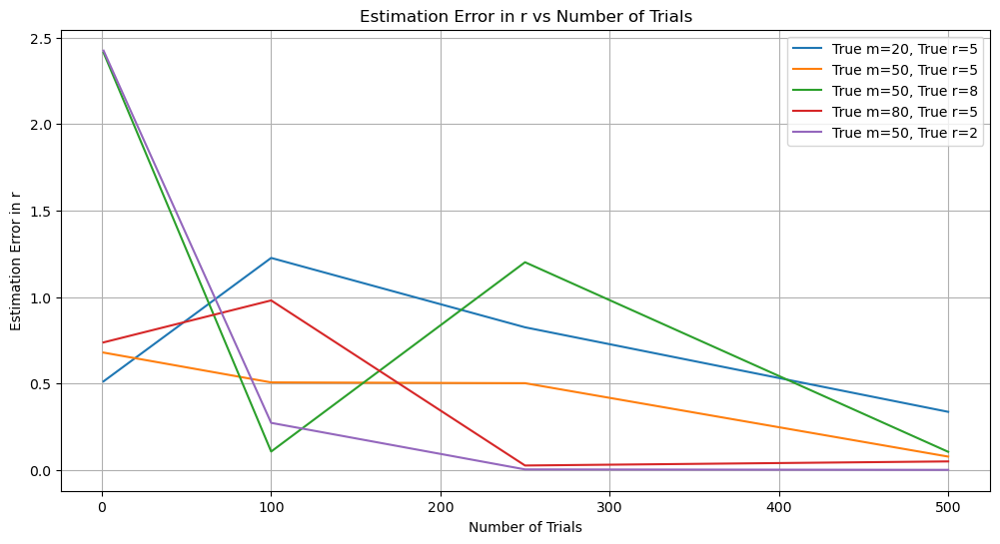

In [318]:
# 3.1.2 Stepping Model, plot how error and standard deviation varies with number of trials and true parameter choice
# Define ranges for parameters
K=11
m_range = np.linspace(0, 100, K)  # 31 points to get 30 intervals
r_range = [i + 1 for i in range(10)]

# Calculate midpoints for m
m_midpoints = (m_range[:-1] + m_range[1:]) / 2

# Create a grid of parameter values using midpoints for m
m_grid, r_grid = np.meshgrid(m_midpoints, r_range)
M = m_grid.shape[0]

# Fix x0 to 0.2
x0 = 0.2
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range =  [1, 100, 250, 500]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_m, true_r):
    # Simulate spike trains for HMM Step Model
    step_model = HMMStepModel(m=true_m, r=true_r, x0=x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)

    log_likelihoods = np.zeros((len(r_range), len(m_midpoints)))

    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            r = r_range[i]
            s_ts = np.linspace(0, 1, int(r) + 1)
            r_t = np.ones(len(s_ts)) * x0 * Rh  # Initialize with pre-jump rate
            r_t[-1] = Rh
            lambdas = r_t * dt  # Obtain the mean count in each time bin

            m = m_grid[i, j]
            step_model = HMMStepModel(m=m, r=int(r), x0=x0)
            ll = 0
            for trial in range(num_trials):
                log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
            log_likelihoods[i, j] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(r_range) * len(m_midpoints))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to compute posterior statistics
def compute_posterior_statistics(posterior, m_grid, r_grid):
    posterior_mean_m = np.sum(posterior * m_grid) / np.sum(posterior)
    posterior_mean_r = np.sum(posterior * r_grid) / np.sum(posterior)

    posterior_std_m = np.sqrt(np.sum(posterior * (m_grid - posterior_mean_m) ** 2) / np.sum(posterior))
    posterior_std_r = np.sqrt(np.sum(posterior * (r_grid - posterior_mean_r) ** 2) / np.sum(posterior))

    return posterior_mean_m, posterior_mean_r, posterior_std_m, posterior_std_r

# Function to run simulations and compute estimation errors
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_m = {param: [] for param in true_parameters}
    estimation_errors_r = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_m, true_r in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_m, true_r)
            mean_m, mean_r, std_m, std_r = compute_posterior_statistics(posterior, m_grid, r_grid)
            estimation_error_m = abs(mean_m - true_m)
            estimation_error_r = abs(mean_r - true_r)

            estimation_errors_m[(true_m, true_r)].append(estimation_error_m)
            estimation_errors_r[(true_m, true_r)].append(estimation_error_r)

    return estimation_errors_m, estimation_errors_r

# Function to plot estimation errors
def plot_estimation_errors(estimation_errors, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        plt.plot(num_trials_range, errors, label=f"True m={true_params[0]}, True r={true_params[1]}")
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error in {parameter_name}')
    plt.title(f'Estimation Error in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(20, 5), (50, 5), (50, 8), (80, 5), (50, 2)]

# Run simulations and get estimation errors
estimated_m, estimated_r = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors for m
plot_estimation_errors(estimated_m, num_trials_range, 'm')

# Plot estimation errors for r
plot_estimation_errors(estimated_r, num_trials_range, 'r')


#### <span style="color:lightgreen"> 3.1.3 </span>



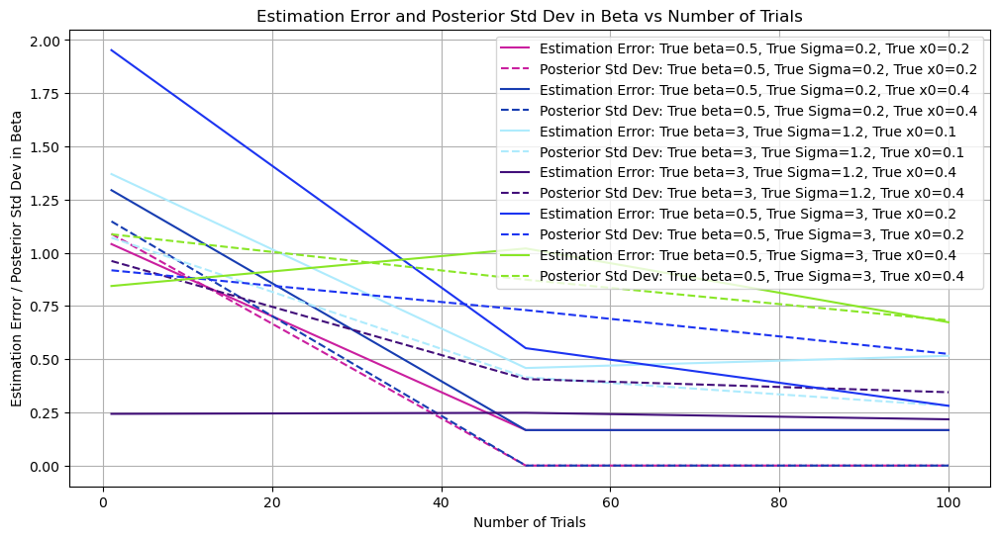

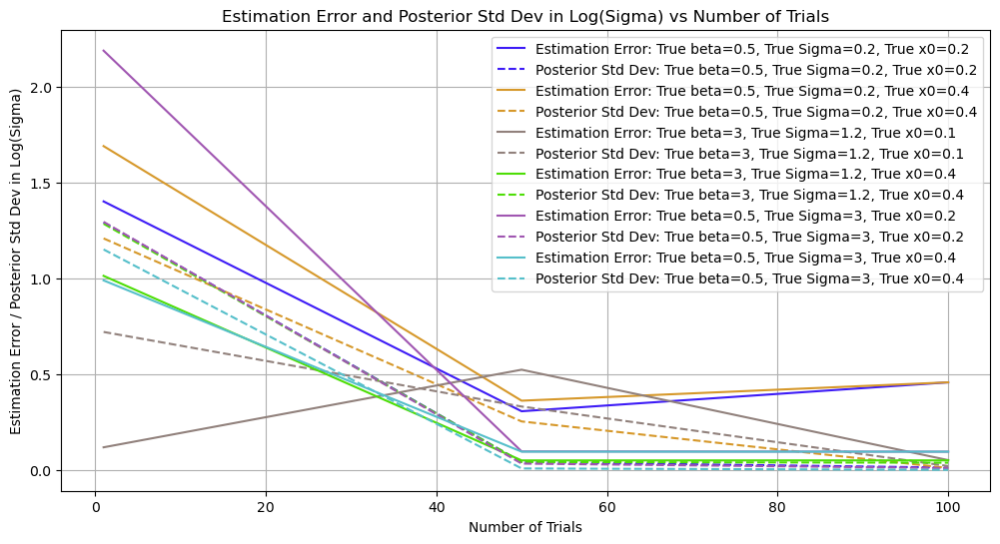

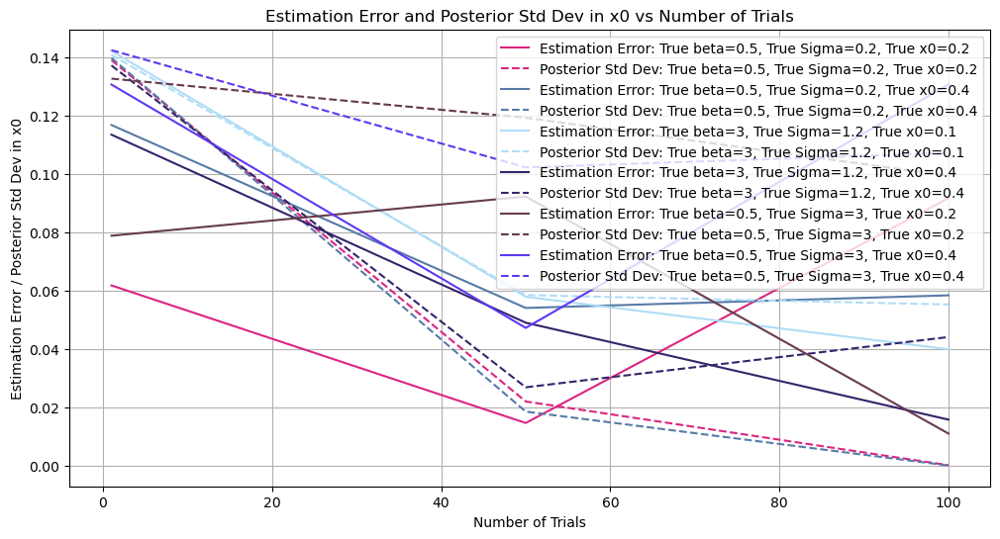

In [319]:
# # 3.1.3: error analysis of ramping model when it also infers x0
# Define ranges for parameters
beta_range = np.linspace(0, 4, 7)  # 5 points for simplicity
log_sigma_range = np.linspace(np.log(0.04), np.log(4), 7)  # 5 points for simplicity
sigma_range = np.exp(log_sigma_range)
x0_range = np.linspace(0, 0.5, 7)  # 5 points for simplicity

# Calculate midpoints
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Create a grid of parameter values using midpoints
beta_grid, log_sigma_grid, x0_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints, x0_midpoints)
M = beta_grid.shape[0]  # Number of grid points along each axis

# Fix Rh and dt
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0):
    # Simulate spike trains for HMM Ramp Model
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=true_x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    x_ts = np.linspace(0, 1, 50)
    r_t = Rh * np.maximum(0, x_ts)
    lambdas = r_t * dt
    log_likelihoods = np.zeros((M, M, M))
    for i in range(M):
        for j in range(M):
            for k in range(M):
                beta = beta_grid[i, j, k]
                sigma = sigma_midpoints[i]
                x0 = x0_midpoints[k]
                ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (M * M * M)  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to compute posterior statistics
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)
    posterior_mean_x0 = np.sum(posterior * x0_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))
    posterior_std_x0 = np.sqrt(np.sum(posterior * (x0_grid - posterior_mean_x0) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_mean_x0, posterior_std_beta, posterior_std_log_sigma, posterior_std_x0

# Function to visualize posterior
def visualize_posterior(posterior, true_beta, true_log_sigma, true_x0, num_trials, mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Integrate out x0 to visualize beta vs log_sigma
    posterior_beta_log_sigma = np.sum(posterior, axis=2)
    axs[0].imshow(posterior_beta_log_sigma, extent=(beta_midpoints[0], beta_midpoints[-1], log_sigma_midpoints[0], log_sigma_midpoints[-1]), origin='lower', aspect='auto')
    axs[0].colorbar(label='Posterior Probability')
    axs[0].scatter(true_beta, true_log_sigma, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_log_sigma), posterior_beta_log_sigma.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[0]]
    axs[0].scatter(max_posterior_beta, max_posterior_log_sigma, color='blue', marker='o', label='Max Posterior')
    axs[0].errorbar(max_posterior_beta, max_posterior_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='o', color='blue', capsize=5)
    axs[0].scatter(mean_beta, mean_log_sigma, color='green', marker='s', label='Posterior Expectation')
    axs[0].errorbar(mean_beta, mean_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='s', color='green', capsize=5)
    axs[0].set_xlabel('Beta')
    axs[0].set_ylabel('Log(Sigma)')
    axs[0].set_title(f'Posterior Distribution (Beta vs Log(Sigma)) with {num_trials} trials')
    axs[0].legend()

    # Integrate out log_sigma to visualize beta vs x0
    posterior_beta_x0 = np.sum(posterior, axis=1)
    axs[1].imshow(posterior_beta_x0, extent=(beta_midpoints[0], beta_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    axs[1].colorbar(label='Posterior Probability')
    axs[1].scatter(true_beta, true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_x0), posterior_beta_x0.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[1].scatter(max_posterior_beta, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    axs[1].errorbar(max_posterior_beta, max_posterior_x0, xerr=std_beta, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[1].scatter(mean_beta, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[1].errorbar(mean_beta, mean_x0, xerr=std_beta, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[1].set_xlabel('Beta')
    axs[1].set_ylabel('x0')
    axs[1].set_title(f'Posterior Distribution (Beta vs x0) with {num_trials} trials')
    axs[1].legend()

    # Integrate out beta to visualize log_sigma vs x0
    posterior_log_sigma_x0 = np.sum(posterior, axis=0)
    axs[2].imshow(posterior_log_sigma_x0, extent=(log_sigma_midpoints[0], log_sigma_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    axs[2].colorbar(label='Posterior Probability')
    axs[2].scatter(true_log_sigma, true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_log_sigma_x0), posterior_log_sigma_x0.shape)
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[2].scatter(max_posterior_log_sigma, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    axs[2].errorbar(max_posterior_log_sigma, max_posterior_x0, xerr=std_log_sigma, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[2].scatter(mean_log_sigma, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[2].errorbar(mean_log_sigma, mean_x0, xerr=std_log_sigma, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[2].set_xlabel('Log(Sigma)')
    axs[2].set_ylabel('x0')
    axs[2].set_title(f'Posterior Distribution (Log(Sigma) vs x0) with {num_trials} trials')
    axs[2].legend()

    plt.show()

# Function to run simulations and compute estimation errors and standard deviations
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_beta = {param: [] for param in true_parameters}
    estimation_errors_log_sigma = {param: [] for param in true_parameters}
    estimation_errors_x0 = {param: [] for param in true_parameters}
    std_devs_beta = {param: [] for param in true_parameters}
    std_devs_log_sigma = {param: [] for param in true_parameters}
    std_devs_x0 = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_beta, true_sigma, true_x0 in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0)
            mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0 = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid)
            estimation_error_beta = abs(mean_beta - true_beta)
            estimation_error_log_sigma = abs(mean_log_sigma - np.log(true_sigma))
            estimation_error_x0 = abs(mean_x0 - true_x0)

            estimation_errors_beta[(true_beta, true_sigma, true_x0)].append(estimation_error_beta)
            estimation_errors_log_sigma[(true_beta, true_sigma, true_x0)].append(estimation_error_log_sigma)
            estimation_errors_x0[(true_beta, true_sigma, true_x0)].append(estimation_error_x0)
            std_devs_beta[(true_beta, true_sigma, true_x0)].append(std_beta)
            std_devs_log_sigma[(true_beta, true_sigma, true_x0)].append(std_log_sigma)
            std_devs_x0[(true_beta, true_sigma, true_x0)].append(std_x0)

    return estimation_errors_beta, estimation_errors_log_sigma, estimation_errors_x0, std_devs_beta, std_devs_log_sigma, std_devs_x0

# Function to plot estimation errors and posterior standard deviations
def plot_errors_and_std_devs(estimation_errors, std_devs, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        color = np.random.rand(3,)
        plt.plot(num_trials_range, errors, label=f"Estimation Error: True beta={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}", color=color)
        plt.plot(num_trials_range, std_devs[true_params], '--', label=f"Posterior Std Dev: True beta={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}", color=color)
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error / Posterior Std Dev in {parameter_name}')
    plt.title(f'Estimation Error and Posterior Std Dev in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(0.5, 0.2, 0.2), (0.5, 0.2, 0.4), (3, 1.2, 0.1), (3, 1.2, 0.4),  (0.5, 3, 0.2), (0.5, 3, 0.4)]

# Run simulations and get estimation errors and posterior standard deviations
estimation_errors_beta, estimation_errors_log_sigma, estimation_errors_x0, std_devs_beta, std_devs_log_sigma, std_devs_x0 = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors and posterior standard deviations for beta
plot_errors_and_std_devs(estimation_errors_beta, std_devs_beta, num_trials_range, 'Beta')

# Plot estimation errors and posterior standard deviations for log(sigma)
plot_errors_and_std_devs(estimation_errors_log_sigma, std_devs_log_sigma, num_trials_range, 'Log(Sigma)')

# Plot estimation errors and posterior standard deviations for x0
plot_errors_and_std_devs(estimation_errors_x0, std_devs_x0, num_trials_range, 'x0')


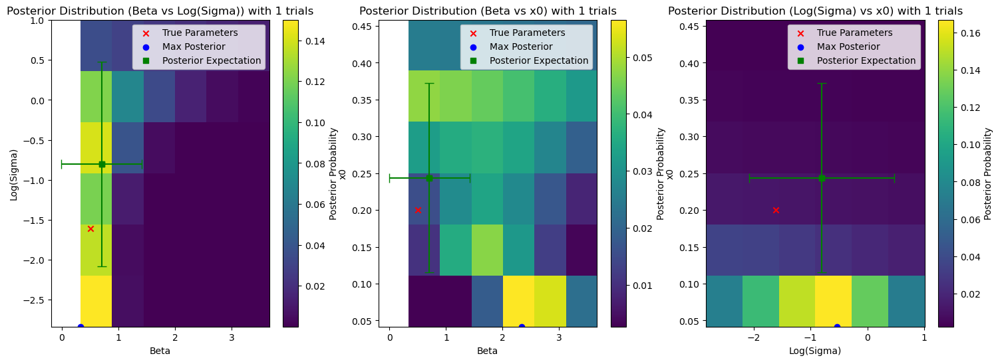

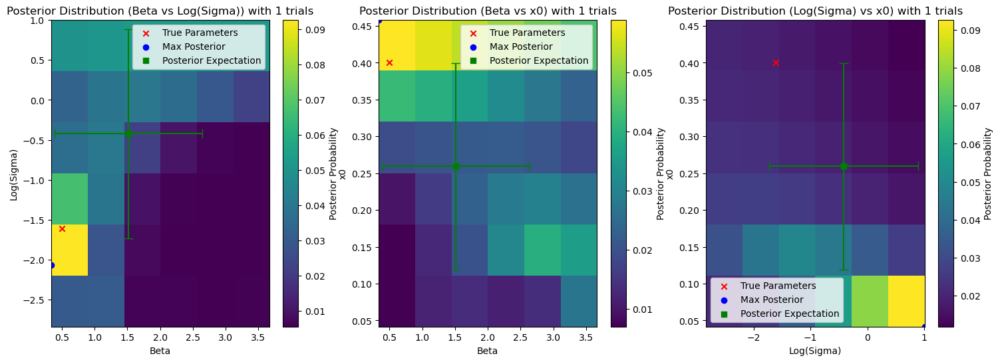

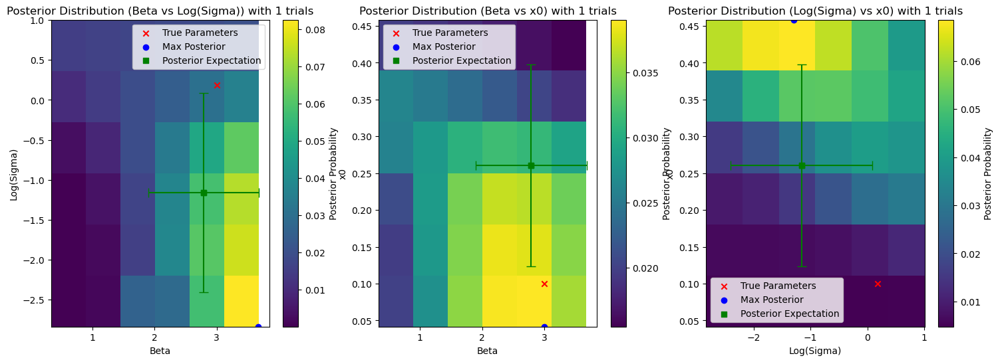

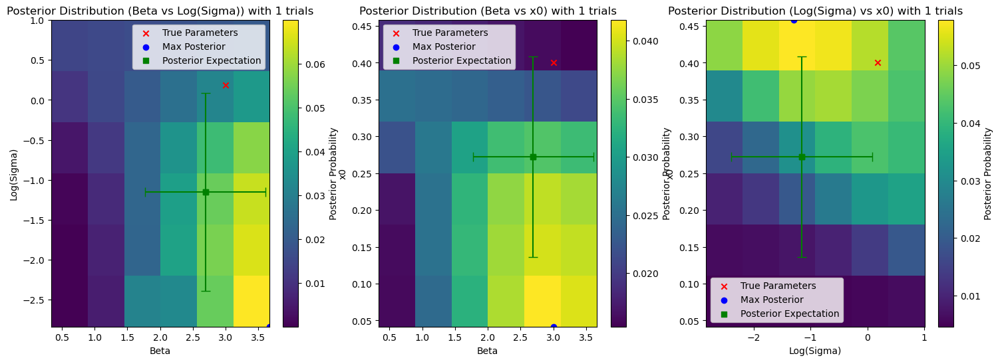

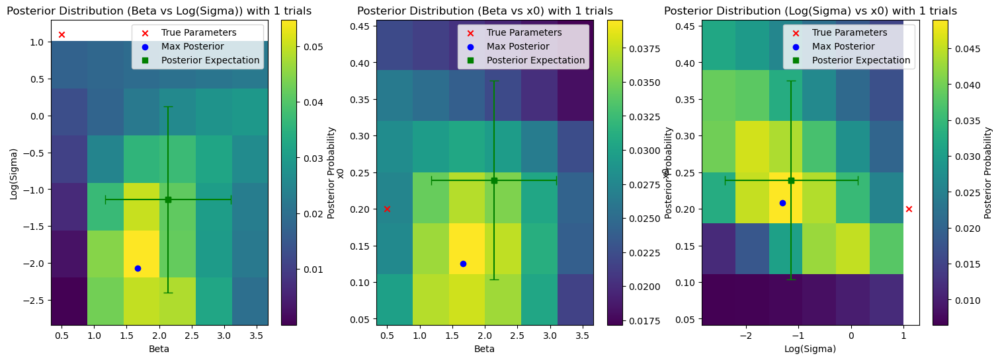

...

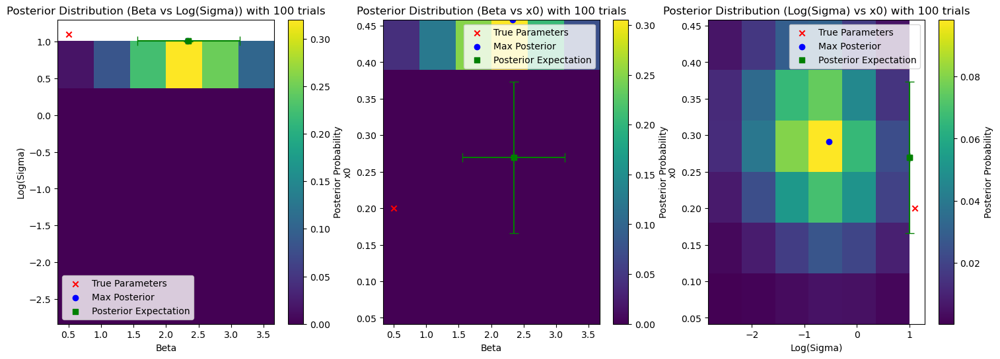

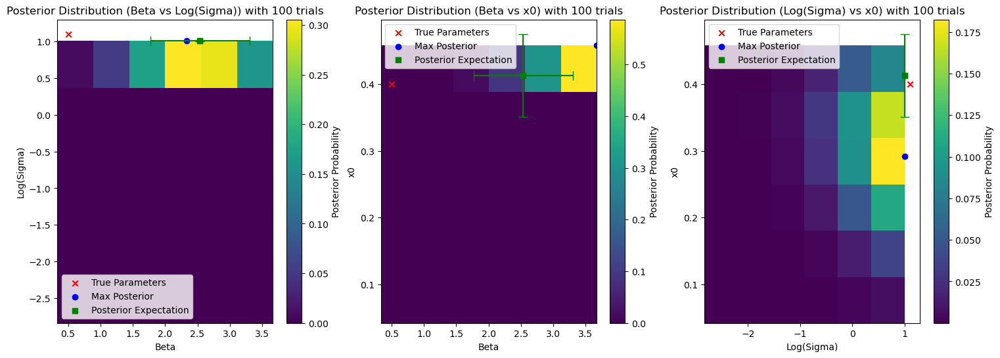

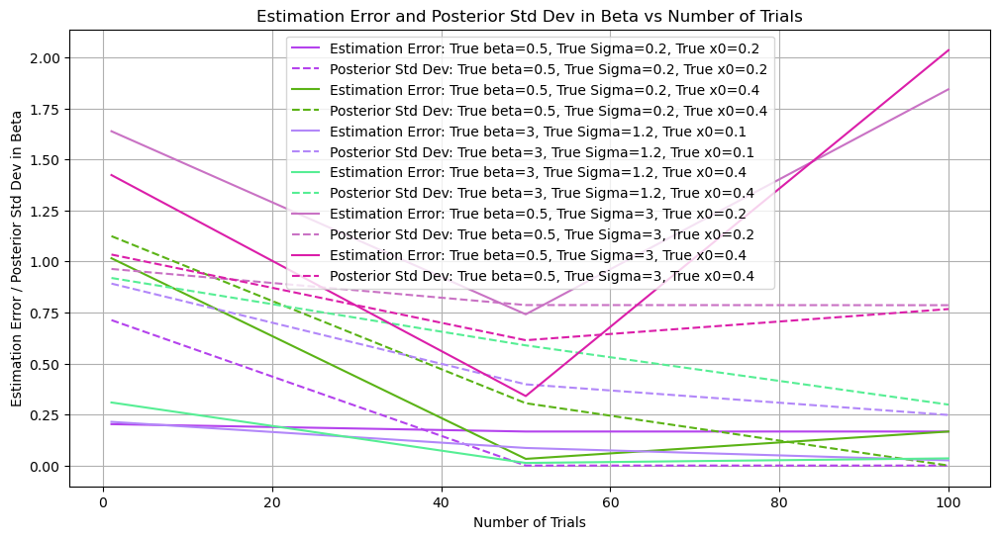

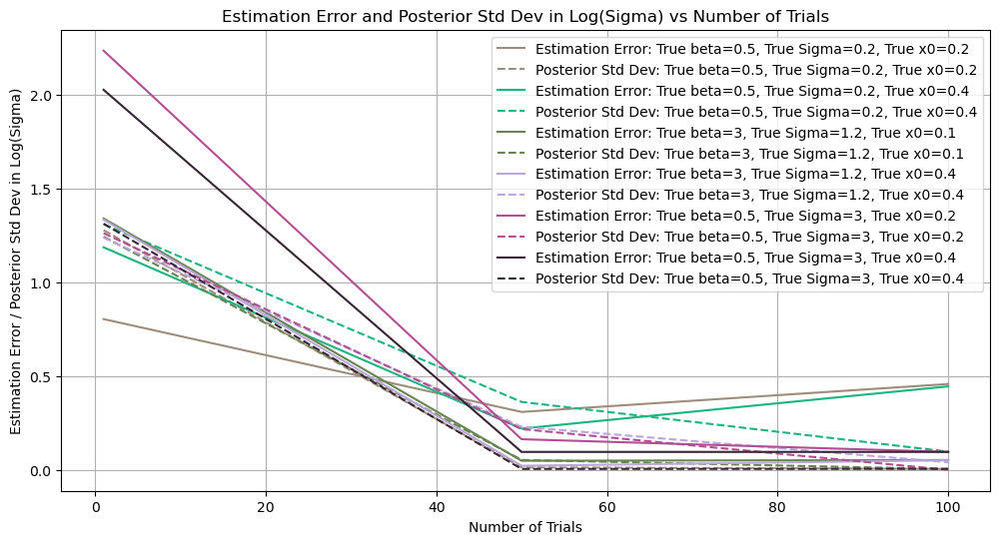

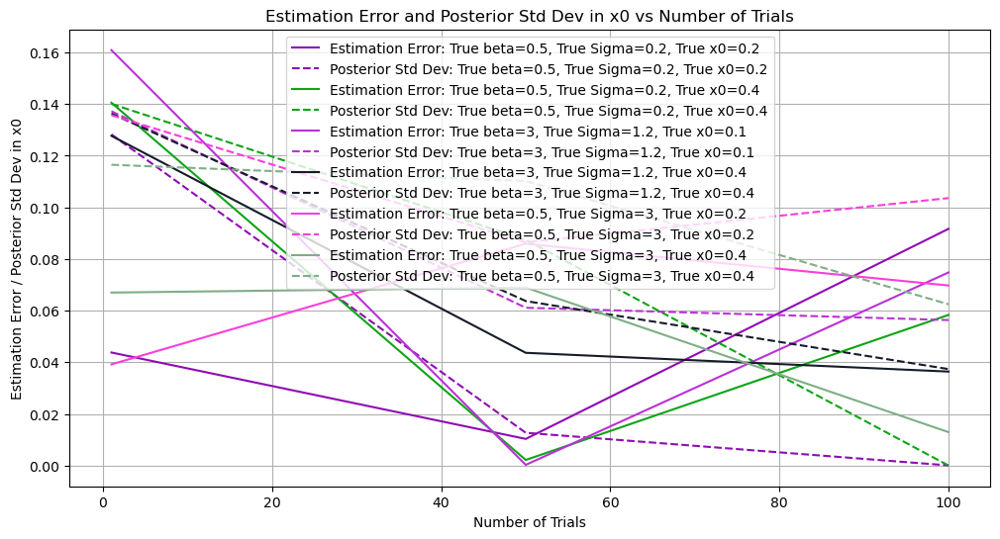

In [320]:
# This generates all plots needed for ramping model 3.1.3
M=7
# Define ranges for parameters for the ramping model
beta_range = np.linspace(0, 4, M)
log_sigma_range = np.linspace(np.log(0.04), np.log(4), M)
sigma_range = np.exp(log_sigma_range)
x0_range = np.linspace(0, 0.5, M)

# Calculate midpoints
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Create a grid of parameter values using midpoints
beta_grid, log_sigma_grid, x0_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints, x0_midpoints)
M = beta_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0):
    # Simulate spike trains for HMM Ramp Model
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=true_x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    x_ts = np.linspace(0, 1, 50)
    r_t = Rh * np.maximum(0, x_ts)
    lambdas = r_t * dt
    log_likelihoods = np.zeros((M, M, M))
    for i in range(M):
        for j in range(M):
            for k in range(M):
                beta = beta_grid[i, j, k]
                sigma = sigma_midpoints[i]
                x0 = x0_midpoints[k]
                ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (M * M * M)  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to compute posterior statistics
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)
    posterior_mean_x0 = np.sum(posterior * x0_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))
    posterior_std_x0 = np.sqrt(np.sum(posterior * (x0_grid - posterior_mean_x0) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_mean_x0, posterior_std_beta, posterior_std_log_sigma, posterior_std_x0

# Function to visualize posterior
def visualize_posterior(posterior, true_beta, true_log_sigma, true_x0, num_trials, mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Integrate out x0 to visualize beta vs log_sigma
    posterior_beta_log_sigma = np.sum(posterior, axis=2)
    cax0 = axs[0].imshow(posterior_beta_log_sigma, extent=(beta_midpoints[0], beta_midpoints[-1], log_sigma_midpoints[0], log_sigma_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(cax0, ax=axs[0], label='Posterior Probability')
    axs[0].scatter(true_beta, true_log_sigma, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_log_sigma), posterior_beta_log_sigma.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[0]]
    axs[0].scatter(max_posterior_beta, max_posterior_log_sigma, color='blue', marker='o', label='Max Posterior')
    # axs[0].errorbar(max_posterior_beta, max_posterior_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='o', color='blue', capsize=5)
    axs[0].scatter(mean_beta, mean_log_sigma, color='green', marker='s', label='Posterior Expectation')
    axs[0].errorbar(mean_beta, mean_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='s', color='green', capsize=5)
    axs[0].set_xlabel('Beta')
    axs[0].set_ylabel('Log(Sigma)')
    axs[0].set_title(f'Posterior Distribution (Beta vs Log(Sigma)) with {num_trials} trials')
    axs[0].legend()

    # Integrate out log_sigma to visualize beta vs x0
    posterior_beta_x0 = np.sum(posterior, axis=1)
    cax1 = axs[1].imshow(posterior_beta_x0, extent=(beta_midpoints[0], beta_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(cax1, ax=axs[1], label='Posterior Probability')
    axs[1].scatter(true_beta, true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_x0), posterior_beta_x0.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[1].scatter(max_posterior_beta, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    # axs[1].errorbar(max_posterior_beta, max_posterior_x0, xerr=std_beta, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[1].scatter(mean_beta, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[1].errorbar(mean_beta, mean_x0, xerr=std_beta, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[1].set_xlabel('Beta')
    axs[1].set_ylabel('x0')
    axs[1].set_title(f'Posterior Distribution (Beta vs x0) with {num_trials} trials')
    axs[1].legend()

    # Integrate out beta to visualize log_sigma vs x0
    posterior_log_sigma_x0 = np.sum(posterior, axis=0)
    cax2 = axs[2].imshow(posterior_log_sigma_x0, extent=(log_sigma_midpoints[0], log_sigma_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(cax2, ax=axs[2], label='Posterior Probability')
    axs[2].scatter(true_log_sigma, true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_log_sigma_x0), posterior_log_sigma_x0.shape)
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[2].scatter(max_posterior_log_sigma, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    # axs[2].errorbar(max_posterior_log_sigma, max_posterior_x0, xerr=std_log_sigma, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[2].scatter(mean_log_sigma, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[2].errorbar(mean_log_sigma, mean_x0, xerr=std_log_sigma, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[2].set_xlabel('Log(Sigma)')
    axs[2].set_ylabel('x0')
    axs[2].set_title(f'Posterior Distribution (Log(Sigma) vs x0) with {num_trials} trials')
    axs[2].legend()

    plt.show()

# Function to run simulations and compute estimation errors and standard deviations
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_beta = {param: [] for param in true_parameters}
    estimation_errors_log_sigma = {param: [] for param in true_parameters}
    estimation_errors_x0 = {param: [] for param in true_parameters}
    std_devs_beta = {param: [] for param in true_parameters}
    std_devs_log_sigma = {param: [] for param in true_parameters}
    std_devs_x0 = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_beta, true_sigma, true_x0 in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0)
            mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0 = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid)
            estimation_error_beta = abs(mean_beta - true_beta)
            estimation_error_log_sigma = abs(mean_log_sigma - np.log(true_sigma))
            estimation_error_x0 = abs(mean_x0 - true_x0)

            estimation_errors_beta[(true_beta, true_sigma, true_x0)].append(estimation_error_beta)
            estimation_errors_log_sigma[(true_beta, true_sigma, true_x0)].append(estimation_error_log_sigma)
            estimation_errors_x0[(true_beta, true_sigma, true_x0)].append(estimation_error_x0)
            std_devs_beta[(true_beta, true_sigma, true_x0)].append(std_beta)
            std_devs_log_sigma[(true_beta, true_sigma, true_x0)].append(std_log_sigma)
            std_devs_x0[(true_beta, true_sigma, true_x0)].append(std_x0)

            visualize_posterior(posterior, true_beta, np.log(true_sigma), true_x0, num_trials, mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0)

    return estimation_errors_beta, estimation_errors_log_sigma, estimation_errors_x0, std_devs_beta, std_devs_log_sigma, std_devs_x0

# Function to plot estimation errors and posterior standard deviations
def plot_errors_and_std_devs(estimation_errors, std_devs, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        color = np.random.rand(3,)
        plt.plot(num_trials_range, errors, label=f"Estimation Error: True beta={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}", color=color)
        plt.plot(num_trials_range, std_devs[true_params], '--', label=f"Posterior Std Dev: True beta={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}", color=color)
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error / Posterior Std Dev in {parameter_name}')
    plt.title(f'Estimation Error and Posterior Std Dev in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(0.5, 0.2, 0.2), (0.5, 0.2, 0.4), (3, 1.2, 0.1), (3, 1.2, 0.4), (0.5, 3, 0.2), (0.5, 3, 0.4)]

# Run simulations and get estimation errors and posterior standard deviations
estimation_errors_beta, estimation_errors_log_sigma, estimation_errors_x0, std_devs_beta, std_devs_log_sigma, std_devs_x0 = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors and posterior standard deviations for beta
plot_errors_and_std_devs(estimation_errors_beta, std_devs_beta, num_trials_range, 'Beta')

# Plot estimation errors and posterior standard deviations for log(sigma)
plot_errors_and_std_devs(estimation_errors_log_sigma, std_devs_log_sigma, num_trials_range, 'Log(Sigma)')

# Plot estimation errors and posterior standard deviations for x0
plot_errors_and_std_devs(estimation_errors_x0, std_devs_x0, num_trials_range, 'x0')


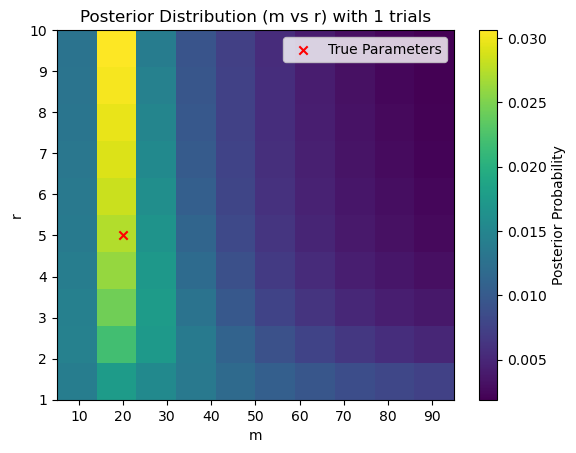

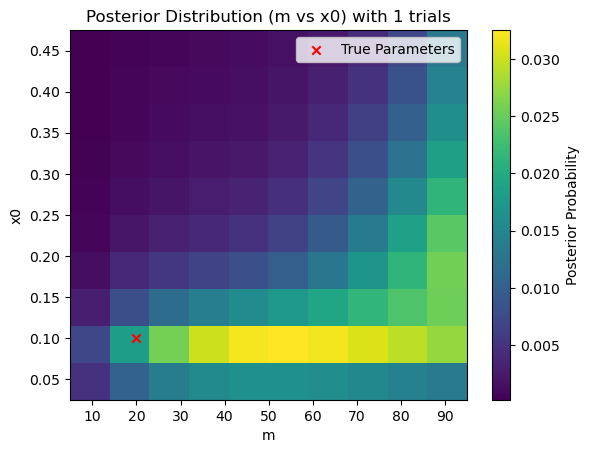

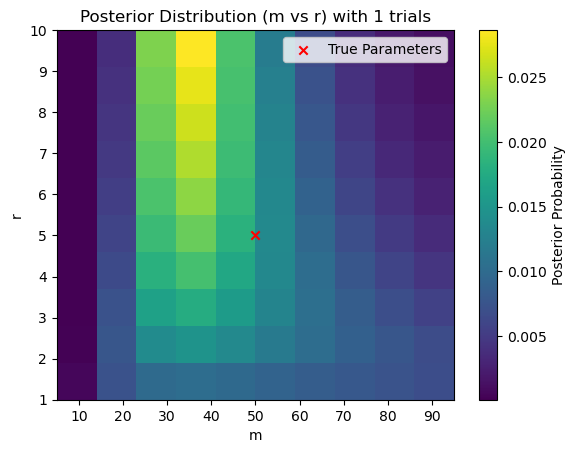

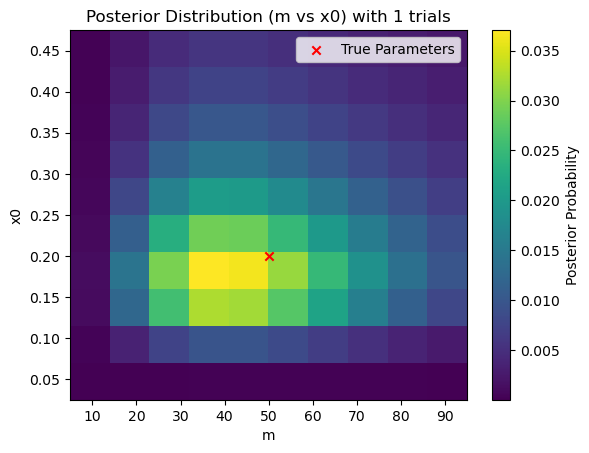

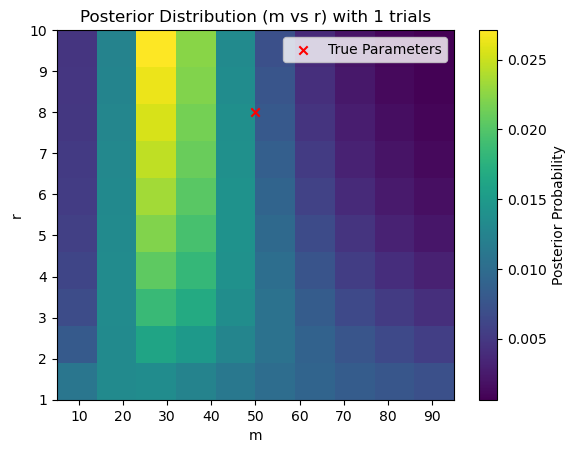

...

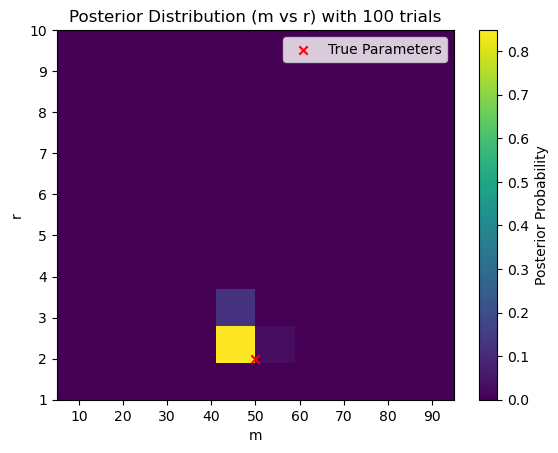

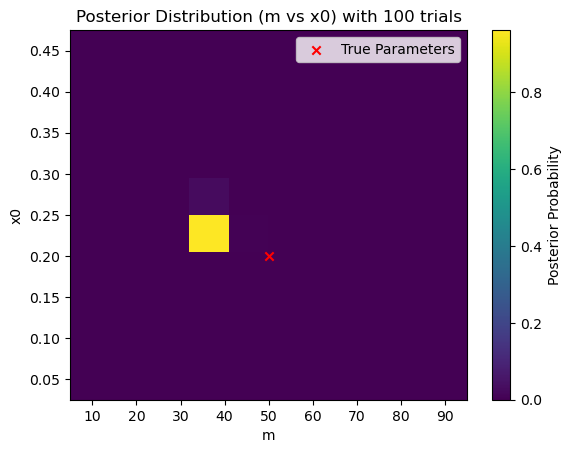

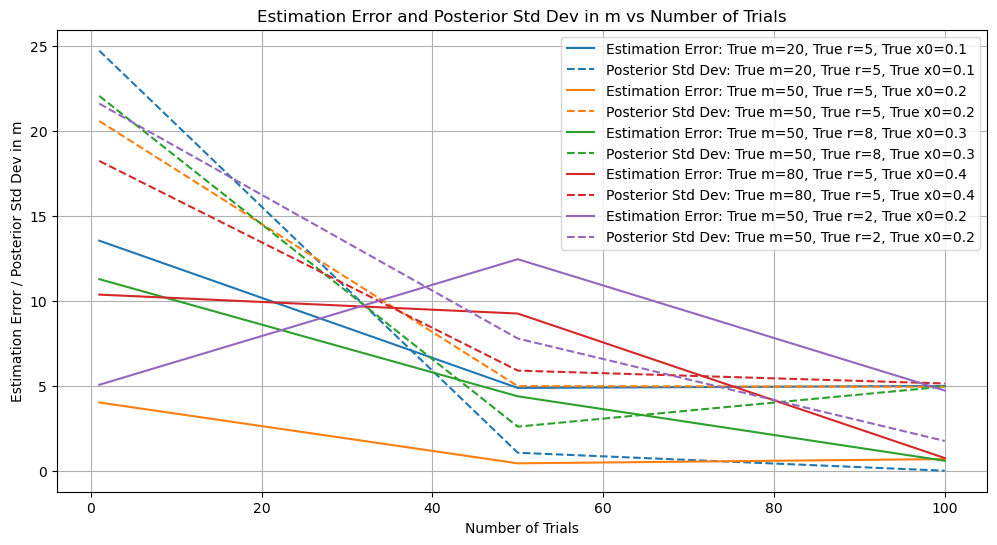

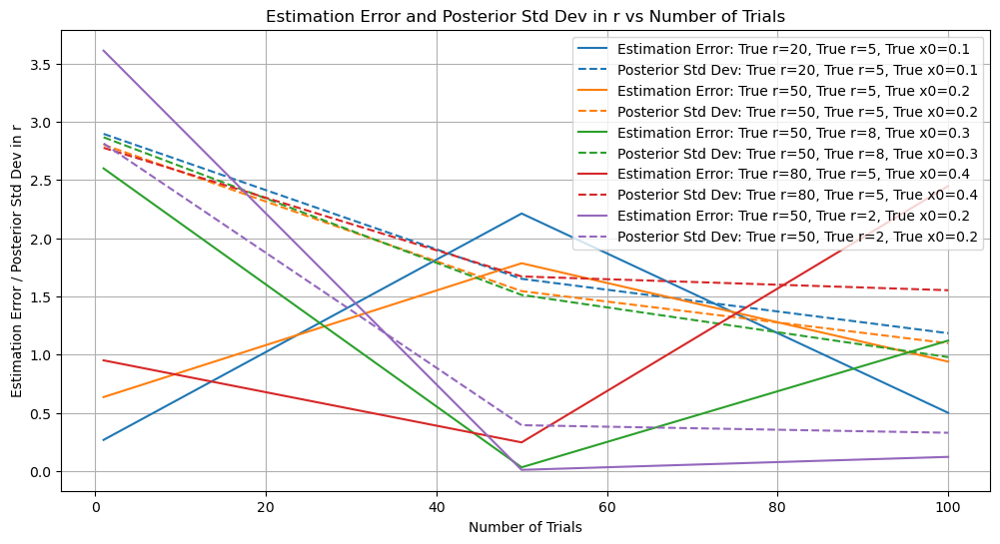

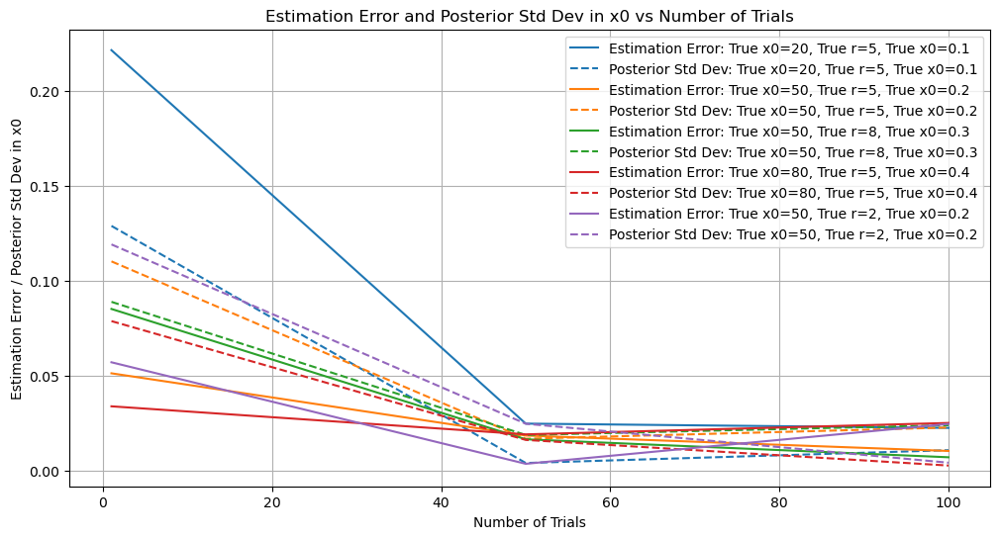

In [321]:
# Takes an hour This generates all plots needed for 3.1.3 Stepping model

# Define ranges for parameters
K = 11
m_range = np.linspace(0, 100, K)  # 31 points to get 30 intervals
r_range = [i + 1 for i in range(10)]
x0_range = np.linspace(0, 0.5, K)  # 31 points to get 30 intervals

# Calculate midpoints for m and x0
m_midpoints = (m_range[:-1] + m_range[1:]) / 2
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Create a grid of parameter values using midpoints for m and x0
m_grid, r_grid, x0_grid = np.meshgrid(m_midpoints, r_range, x0_midpoints)
M = m_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data and compute posterior
def simulate_and_compute_posterior(num_trials, true_m, true_r, true_x0):
    # Simulate spike trains for HMM Step Model
    step_model = HMMStepModel(m=true_m, r=true_r, x0=true_x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)

    log_likelihoods = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints)))

    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            for k in range(len(x0_midpoints)):
                r = r_range[i]
                s_ts = np.linspace(0, 1, int(r) + 1)
                r_t = np.ones(len(s_ts)) * x0_midpoints[k] * Rh  # Initialize with pre-jump rate
                r_t[-1] = Rh
                lambdas = r_t * dt  # Obtain the mean count in each time bin

                m = m_grid[i, j, k]
                x0 = x0_grid[i, j, k]
                step_model = HMMStepModel(m=m, r=int(r), x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(r_range) * len(m_midpoints) * len(x0_midpoints))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to visualize posterior
def visualize_posterior(posterior, true_m, true_r, true_x0, num_trials):
    # Integrate out x0 to visualize m vs r
    posterior_m_r = np.sum(posterior, axis=2)
    plt.imshow(posterior_m_r, extent=(m_midpoints[0], m_midpoints[-1], r_range[0], r_range[-1]), origin='lower', aspect='auto')
    plt.colorbar(label='Posterior Probability')
    plt.scatter(true_m, true_r, color='red', marker='x', label='True Parameters')
    plt.xlabel('m')
    plt.ylabel('r')
    plt.title(f'Posterior Distribution (m vs r) with {num_trials} trials')
    plt.legend()
    plt.show()

    # Integrate out r to visualize m vs x0
    posterior_m_x0 = np.sum(posterior, axis=0)
    plt.imshow(posterior_m_x0, extent=(m_midpoints[0], m_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    plt.colorbar(label='Posterior Probability')
    plt.scatter(true_m, true_x0, color='red', marker='x', label='True Parameters')
    plt.xlabel('m')
    plt.ylabel('x0')
    plt.title(f'Posterior Distribution (m vs x0) with {num_trials} trials')
    plt.legend()
    plt.show()

# Posterior expectations and uncertainties
def compute_posterior_statistics(posterior, m_grid, r_grid, x0_grid):
    posterior_mean_m = np.sum(posterior * m_grid) / np.sum(posterior)
    posterior_mean_r = np.sum(posterior * r_grid) / np.sum(posterior)
    posterior_mean_x0 = np.sum(posterior * x0_grid) / np.sum(posterior)

    posterior_std_m = np.sqrt(np.sum(posterior * (m_grid - posterior_mean_m) ** 2) / np.sum(posterior))
    posterior_std_r = np.sqrt(np.sum(posterior * (r_grid - posterior_mean_r) ** 2) / np.sum(posterior))
    posterior_std_x0 = np.sqrt(np.sum(posterior * (x0_grid - posterior_mean_x0) ** 2) / np.sum(posterior))

    return posterior_mean_m, posterior_mean_r, posterior_mean_x0, posterior_std_m, posterior_std_r, posterior_std_x0

# Function to run simulations and compute estimation errors and standard deviations
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_m = {param: [] for param in true_parameters}
    estimation_errors_r = {param: [] for param in true_parameters}
    estimation_errors_x0 = {param: [] for param in true_parameters}
    std_devs_m = {param: [] for param in true_parameters}
    std_devs_r = {param: [] for param in true_parameters}
    std_devs_x0 = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_m, true_r, true_x0 in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_m, true_r, true_x0)
            mean_m, mean_r, mean_x0, std_m, std_r, std_x0 = compute_posterior_statistics(posterior, m_grid, r_grid, x0_grid)
            estimation_error_m = abs(mean_m - true_m)
            estimation_error_r = abs(mean_r - true_r)
            estimation_error_x0 = abs(mean_x0 - true_x0)

            estimation_errors_m[(true_m, true_r, true_x0)].append(estimation_error_m)
            estimation_errors_r[(true_m, true_r, true_x0)].append(estimation_error_r)
            estimation_errors_x0[(true_m, true_r, true_x0)].append(estimation_error_x0)
            std_devs_m[(true_m, true_r, true_x0)].append(std_m)
            std_devs_r[(true_m, true_r, true_x0)].append(std_r)
            std_devs_x0[(true_m, true_r, true_x0)].append(std_x0)

            # Visualize posterior heatmaps for each true parameter set
            visualize_posterior(posterior, true_m, true_r, true_x0, num_trials)

    return estimation_errors_m, estimation_errors_r, estimation_errors_x0, std_devs_m, std_devs_r, std_devs_x0

# Function to plot estimation errors and posterior standard deviations
def plot_errors_and_std_devs(estimation_errors, std_devs, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        stds = std_devs[true_params]
        plt.plot(num_trials_range, errors, label=f"Estimation Error: True {parameter_name}={true_params[0]}, True r={true_params[1]}, True x0={true_params[2]}")
        plt.plot(num_trials_range, stds, '--', label=f"Posterior Std Dev: True {parameter_name}={true_params[0]}, True r={true_params[1]}, True x0={true_params[2]}", color=plt.gca().lines[-1].get_color())
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error / Posterior Std Dev in {parameter_name}')
    plt.title(f'Estimation Error and Posterior Std Dev in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(20, 5, 0.1), (50, 5, 0.2), (50, 8, 0.3), (80, 5, 0.4), (50, 2, 0.2)]

# Run simulations and get estimation errors and posterior standard deviations
estimation_errors_m, estimation_errors_r, estimation_errors_x0, std_devs_m, std_devs_r, std_devs_x0 = run_simulations(true_parameters, num_trials_range)

# Plot estimation errors and posterior standard deviations for m
plot_errors_and_std_devs(estimation_errors_m, std_devs_m, num_trials_range, 'm')

# Plot estimation errors and posterior standard deviations for r
plot_errors_and_std_devs(estimation_errors_r, std_devs_r, num_trials_range, 'r')

# Plot estimation errors and posterior standard deviations for x0
plot_errors_and_std_devs(estimation_errors_x0, std_devs_x0, num_trials_range, 'x0')


<span style='color:lightgreen'> Task 3.2 </style>
===
**Model selection (grid based)**

Repeat the sub-tasks in Task 3.1, for the two "cross-cases" where you compute the posterior and posterior expectations of one models's parameters,<br>
given spike-trains generated by the other model. How do things change in each case? Document any interesting observations of systematic behaviour.

One (or, arguably, the) Bayesian method for model selection is the computation of so-called Bayes factors, i.e. the model posteriors (for $M = $ ramp or step):

$P(M| \mathrm{data}) \propto P(\mathrm{data}| M) P(M)$

where $P(M)$ denotes the prior probability of each model (and $\mathrm{data}=\{(n_t)_{t=1}^T\}$), which we will take to be 0.5 throughout. In this case, the posterior<br>
model probabilities are proportional to their so-called **marginal likelihoods** $P(\mathrm{data}| M)$, and model selection can be entirely based on the **marginal likelihood ratio (MLR)**,<br>
also known as the **Bayes factor**: <br>

$R = \frac{P(\mathrm{data}| M=ramp)}{P(\mathrm{data}| M=step)}\qquad\qquad$     **(3.2)**

or its logarithm, with the ramp model chosen if $R>1$ or $\ln R > 0$, and vice versa.

$P(\mathrm{data}| M)$ is called marginal likelihood because its calculation involves integrating out (or marginalizing) model parameters:

$P(\mathrm{data}| M) = \int P(\mathrm{data}|\Theta, M) P(\Theta| M)\, d\Theta.\qquad\qquad$   **(3.3)**

Comparison with Eq. (3.1) shows that this is *exactly* the normalizing constant (the denominator of Bayes rule) for the unnormalized posterior over model parameters. <br>
(The denominator of the Bayes rule 3.1, is also known as "evidence", as it quantifies the strength of evidence in favor of the model.)<br>
So you have already evaluated the marignal likelihoods in Task 3.1 when you normalized the posteriors (up to approximating the integral with a sum over grid points).<br>
(**However,** you need to make sure that you have included the appropriate (approximate) $d\Theta$'s in the formula. This is the volume of each square in your grid, and for <br>
integer $r$ the number of integers within the coarse-grid, if using a coars-grid. Also note that this depends on your choice of normalization of the prior; ultimately what <br>
matters is that if you replace $P(\mathrm{data}|\Theta, M)$ in Eq. (3.3) with 1, the integral or grid-sum should evaluate to 1.)


Do model selection, based on the MLR, for datasets of different sizes (number of trials) and quantify the two different error rates. <br>

- **3.2.1:** First do this by sampling the ("true") parameters, used for generating a dataset from each model, from that model's prior parameter distribution. <br>
- **3.2.2:** Repeat this with "mismatched" parameter priors: for data-generation, sample parameters from distributions other than the priors used in inference (you may, in particular, use <br>
non-uniform distributions). What happens to the error rates? Investigate and document this for different degrees of deviation between the data-generation distribution and the priors.

### <span style='color:lightgreen'> Cross Cases </style>

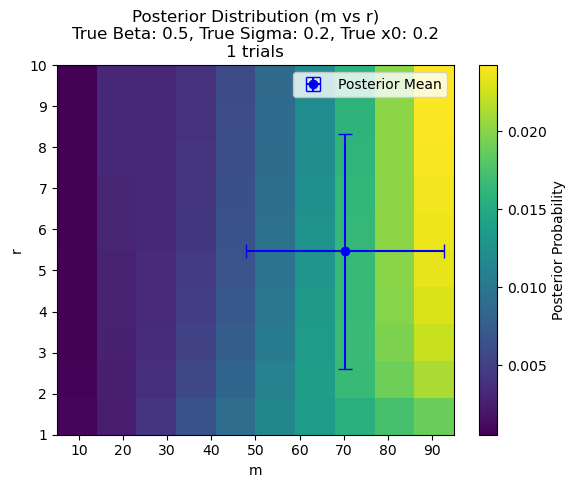

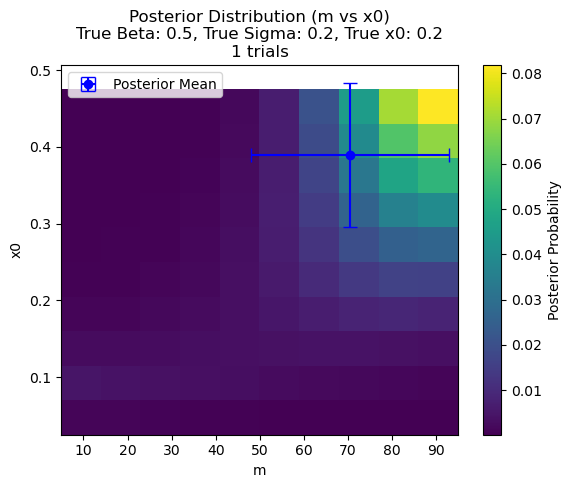

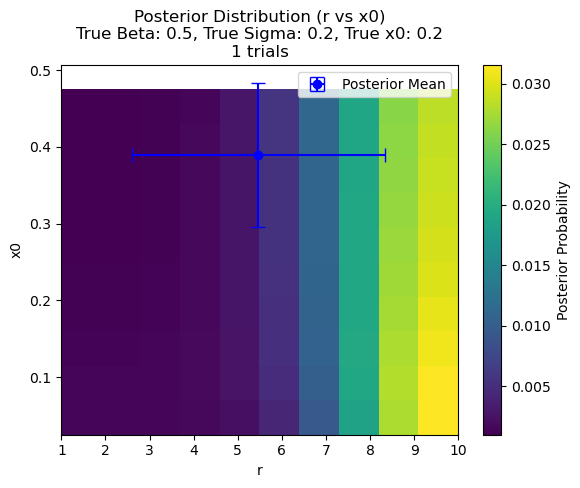

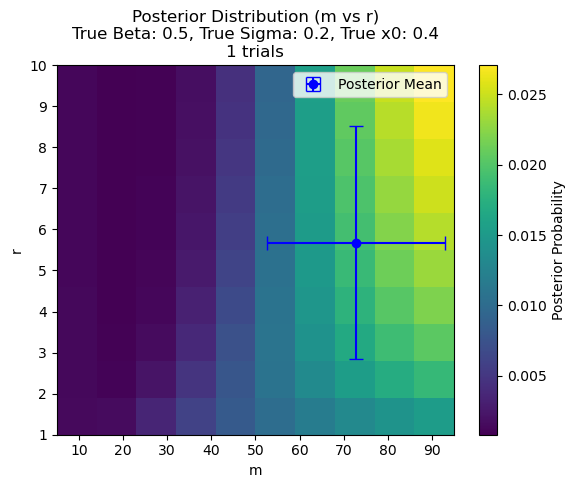

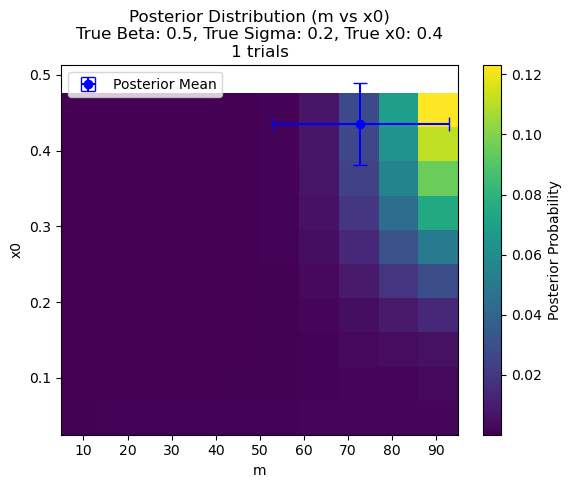

...

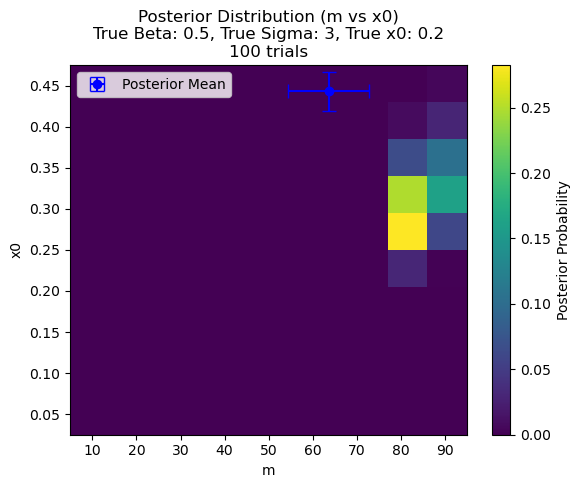

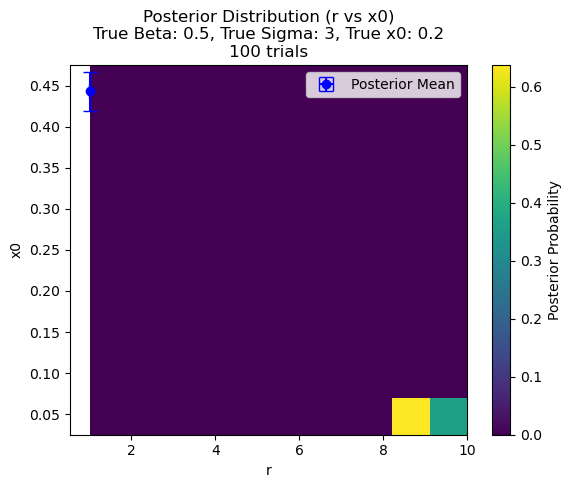

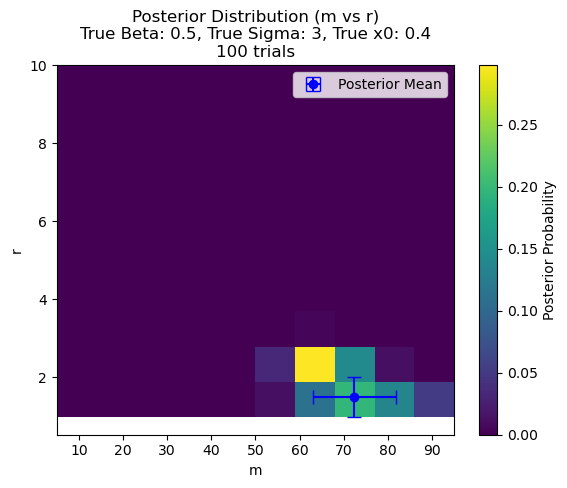

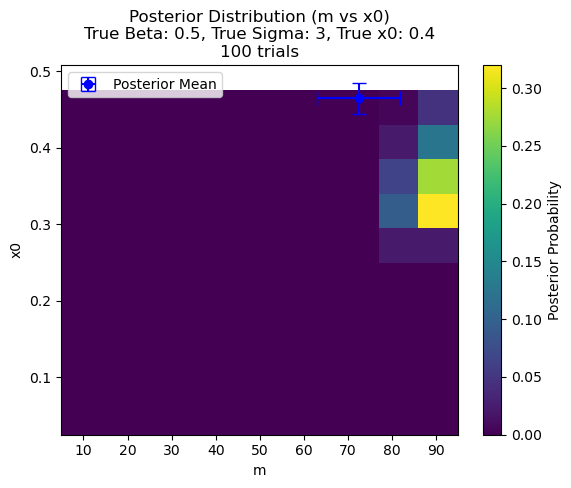

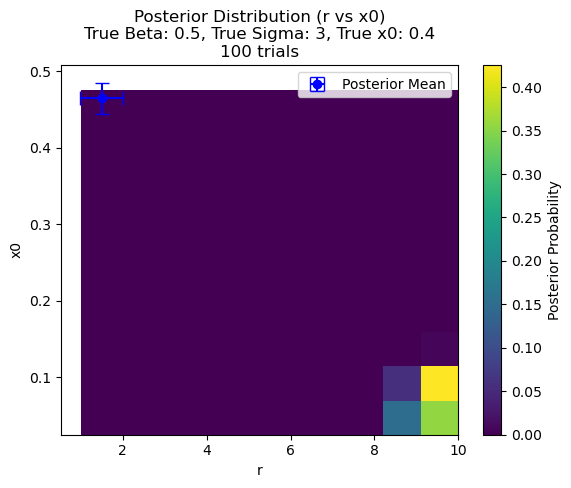

In [322]:
# working: step infer ramp trains
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import logsumexp
from scipy.stats import truncnorm

# Define ranges for parameters
K=11
m_range = np.linspace(0, 100, K)  # 11 points to get 10 intervals
r_range = [i + 1 for i in range(10)]
x0_range = np.linspace(0, 0.5, K)  # 11 points to get 10 intervals

# Calculate midpoints for m and x0
m_midpoints = (m_range[:-1] + m_range[1:]) / 2
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Create a grid of parameter values using midpoints for m and x0
m_grid, r_grid, x0_grid = np.meshgrid(m_midpoints, r_range, x0_midpoints)
M = m_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Define number of trials
num_trials_range = [1, 50, 100]

# Function to simulate data using the ramping model and compute posterior using the stepping model
def simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0):
    # Simulate spike trains for HMM Ramp Model
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=true_x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]

    log_likelihoods = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints)))

    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            for k in range(len(x0_midpoints)):
                r = r_range[i]
                s_ts = np.linspace(0, 1, int(r) + 1)
                r_t = np.ones(len(s_ts)) * x0_midpoints[k] * Rh  # Initialize with pre-jump rate
                r_t[-1] = Rh
                lambdas = r_t * dt  # Obtain the mean count in each time bin

                m = m_grid[i, j, k]
                x0 = x0_grid[i, j, k]
                step_model = HMMStepModel(m=m, r=int(r), x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(r_range) * len(m_midpoints) * len(x0_midpoints))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior

# Function to visualize posterior
def visualize_posterior(posterior, true_beta, true_sigma, true_x0, num_trials, mean_m, mean_r, mean_x0, std_m, std_r, std_x0):
    # Integrate out x0 to visualize m vs r
    posterior_m_r = np.sum(posterior, axis=2)
    plt.imshow(posterior_m_r, extent=(m_midpoints[0], m_midpoints[-1], r_range[0], r_range[-1]), origin='lower', aspect='auto')
    plt.colorbar(label='Posterior Probability')
    plt.errorbar(mean_m, mean_r, xerr=std_m, yerr=std_r, fmt='o', color='blue', capsize=5, label='Posterior Mean')
    plt.xlabel('m')
    plt.ylabel('r')
    plt.title(f'Posterior Distribution (m vs r)\nTrue Beta: {true_beta}, True Sigma: {true_sigma}, True x0: {true_x0}\n{num_trials} trials')
    plt.legend()
    plt.show()

    # Integrate out r to visualize m vs x0
    posterior_m_x0 = np.sum(posterior, axis=0)
    plt.imshow(posterior_m_x0, extent=(m_midpoints[0], m_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    plt.colorbar(label='Posterior Probability')
    plt.errorbar(mean_m, mean_x0, xerr=std_m, yerr=std_x0, fmt='o', color='blue', capsize=5, label='Posterior Mean')
    plt.xlabel('m')
    plt.ylabel('x0')
    plt.title(f'Posterior Distribution (m vs x0)\nTrue Beta: {true_beta}, True Sigma: {true_sigma}, True x0: {true_x0}\n{num_trials} trials')
    plt.legend()
    plt.show()

    # Integrate out m to visualize r vs x0
    posterior_r_x0 = np.sum(posterior, axis=1)
    plt.imshow(posterior_r_x0, extent=(r_range[0], r_range[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    plt.colorbar(label='Posterior Probability')
    plt.errorbar(mean_r, mean_x0, xerr=std_r, yerr=std_x0, fmt='o', color='blue', capsize=5, label='Posterior Mean')
    plt.xlabel('r')
    plt.ylabel('x0')
    plt.title(f'Posterior Distribution (r vs x0)\nTrue Beta: {true_beta}, True Sigma: {true_sigma}, True x0: {true_x0}\n{num_trials} trials')
    plt.legend()
    plt.show()

# Posterior expectations and uncertainties
def compute_posterior_statistics(posterior, m_grid, r_grid, x0_grid):
    posterior_mean_m = np.sum(posterior * m_grid) / np.sum(posterior)
    posterior_mean_r = np.sum(posterior * r_grid) / np.sum(posterior)
    posterior_mean_x0 = np.sum(posterior * x0_grid) / np.sum(posterior)

    posterior_std_m = np.sqrt(np.sum(posterior * (m_grid - posterior_mean_m) ** 2) / np.sum(posterior))
    posterior_std_r = np.sqrt(np.sum(posterior * (r_grid - posterior_mean_r) ** 2) / np.sum(posterior))
    posterior_std_x0 = np.sqrt(np.sum(posterior * (x0_grid - posterior_mean_x0) ** 2) / np.sum(posterior))

    return posterior_mean_m, posterior_mean_r, posterior_mean_x0, posterior_std_m, posterior_std_r, posterior_std_x0

# Function to run simulations and compute estimation errors and standard deviations
def run_simulations(true_parameters, num_trials_range):
    estimation_errors_m = {param: [] for param in true_parameters}
    estimation_errors_r = {param: [] for param in true_parameters}
    estimation_errors_x0 = {param: [] for param in true_parameters}
    std_devs_m = {param: [] for param in true_parameters}
    std_devs_r = {param: [] for param in true_parameters}
    std_devs_x0 = {param: [] for param in true_parameters}

    for num_trials in num_trials_range:
        for true_beta, true_sigma, true_x0 in true_parameters:
            posterior = simulate_and_compute_posterior(num_trials, true_beta, true_sigma, true_x0)
            mean_m, mean_r, mean_x0, std_m, std_r, std_x0 = compute_posterior_statistics(posterior, m_grid, r_grid, x0_grid)
            estimation_error_m = abs(mean_m - true_beta)  # using true_beta as a proxy for m
            estimation_error_r = abs(mean_r - true_sigma)  # using true_sigma as a proxy for r
            estimation_error_x0 = abs(mean_x0 - true_x0)

            estimation_errors_m[(true_beta, true_sigma, true_x0)].append(estimation_error_m)
            estimation_errors_r[(true_beta, true_sigma, true_x0)].append(estimation_error_r)
            estimation_errors_x0[(true_beta, true_sigma, true_x0)].append(estimation_error_x0)
            std_devs_m[(true_beta, true_sigma, true_x0)].append(std_m)
            std_devs_r[(true_beta, true_sigma, true_x0)].append(std_r)
            std_devs_x0[(true_beta, true_sigma, true_x0)].append(std_x0)

            # Visualize posterior heatmaps for each true parameter set
            visualize_posterior(posterior, true_beta, true_sigma, true_x0, num_trials, mean_m, mean_r, mean_x0, std_m, std_r, std_x0)

    return estimation_errors_m, estimation_errors_r, estimation_errors_x0, std_devs_m, std_devs_r, std_devs_x0

# Function to plot estimation errors and posterior standard deviations
def plot_errors_and_std_devs(estimation_errors, std_devs, num_trials_range, parameter_name):
    plt.figure(figsize=(12, 6))
    for true_params, errors in estimation_errors.items():
        stds = std_devs[true_params]
        plt.plot(num_trials_range, errors, label=f"Estimation Error: True {parameter_name}={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}")
        plt.plot(num_trials_range, stds, '--', label=f"Posterior Std Dev: True {parameter_name}={true_params[0]}, True Sigma={true_params[1]}, True x0={true_params[2]}", color=plt.gca().lines[-1].get_color())
    plt.xlabel('Number of Trials')
    plt.ylabel(f'Estimation Error / Posterior Std Dev in {parameter_name}')
    plt.title(f'Estimation Error and Posterior Std Dev in {parameter_name} vs Number of Trials')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define true parameters
true_parameters = [(0.5, 0.2, 0.2), (0.5, 0.2, 0.4), (3, 1.2, 0.1), (3, 1.2, 0.4), (0.5, 3, 0.2), (0.5, 3, 0.4)]

# Run simulations and get estimation errors and posterior standard deviations
estimation_errors_m, estimation_errors_r, estimation_errors_x0, std_devs_m, std_devs_r, std_devs_x0 = run_simulations(true_parameters, num_trials_range)

# # Plot estimation errors and posterior standard deviations for m
# plot_errors_and_std_devs(estimation_errors_m, std_devs_m, num_trials_range, 'm')

# # Plot estimation errors and posterior standard deviations for r
# plot_errors_and_std_devs(estimation_errors_r, std_devs_r, num_trials_range, 'r')

# # Plot estimation errors and posterior standard deviations for x0
# plot_errors_and_std_devs(estimation_errors_x0, std_devs_x0, num_trials_range, 'x0')


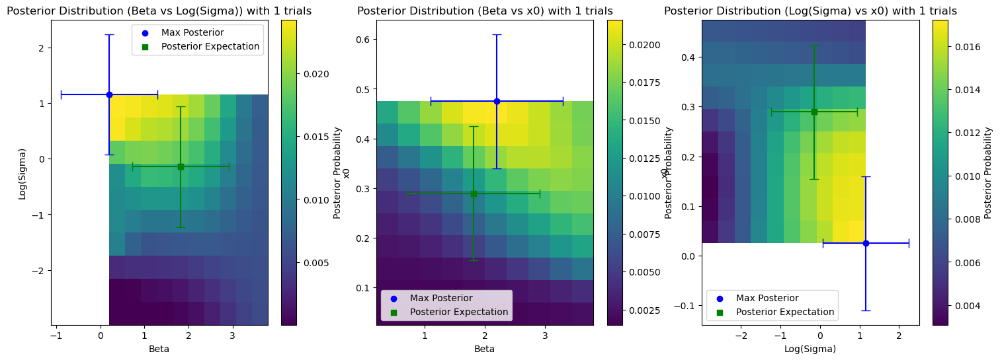

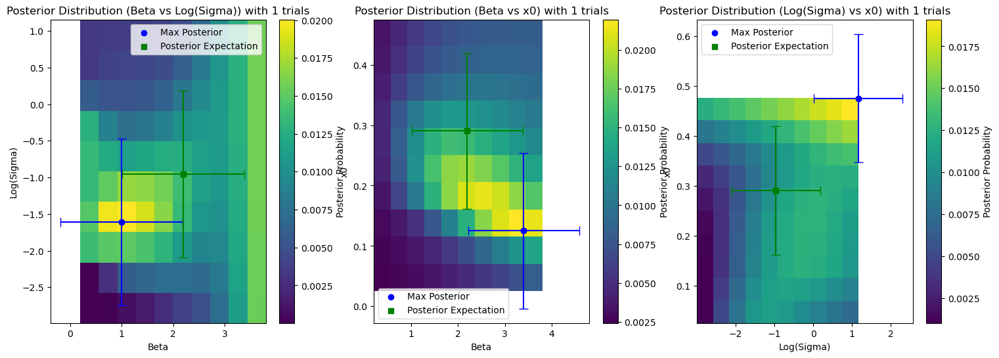

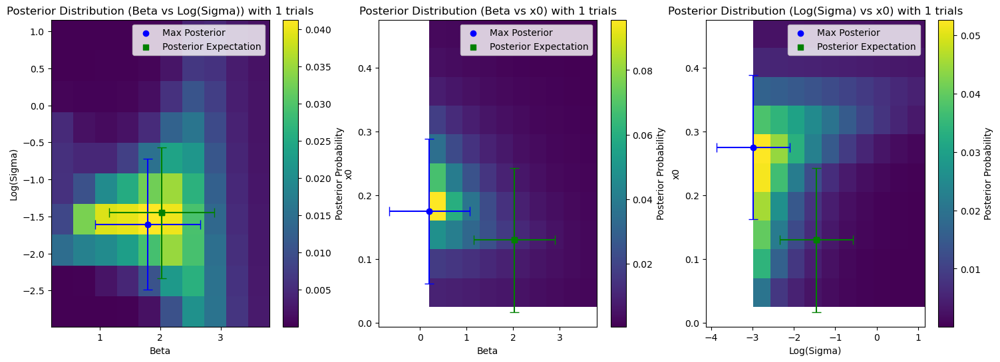

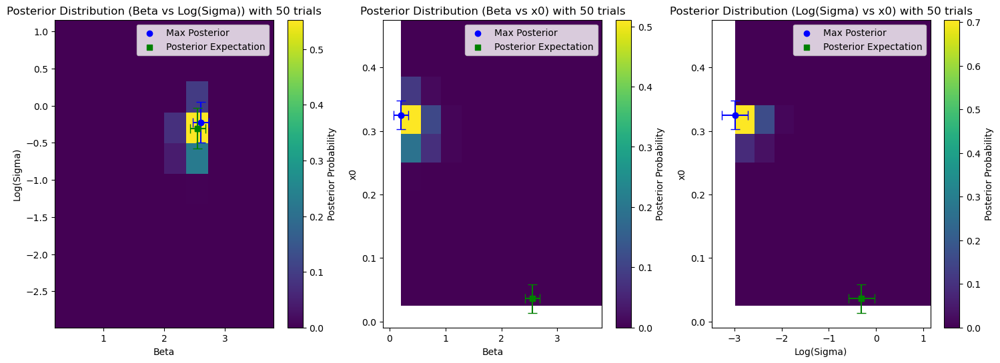

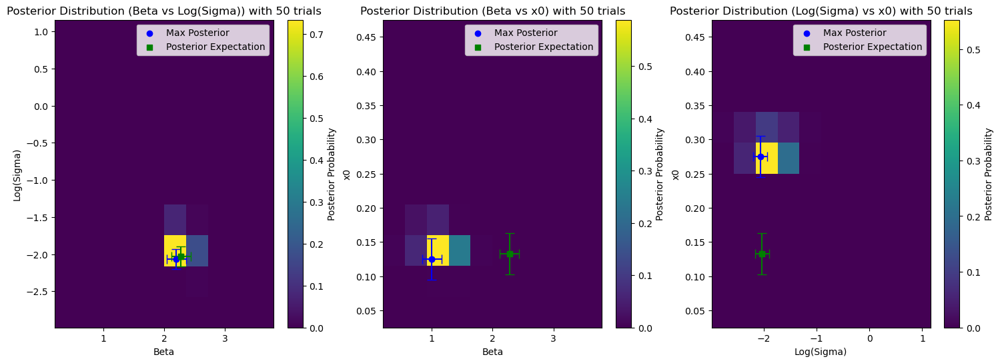

...

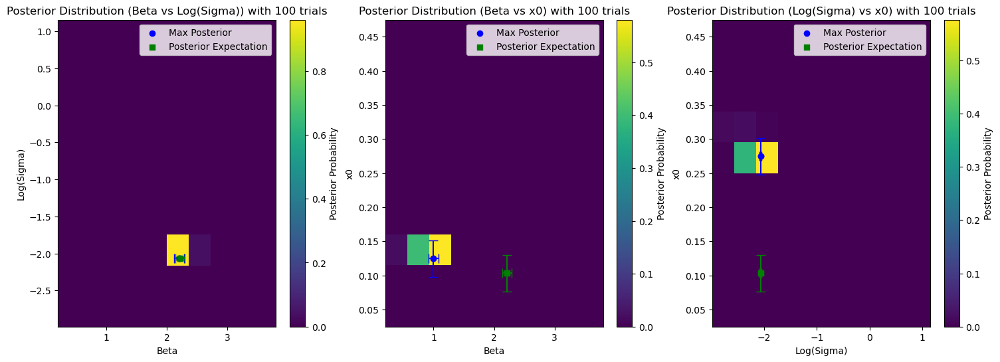

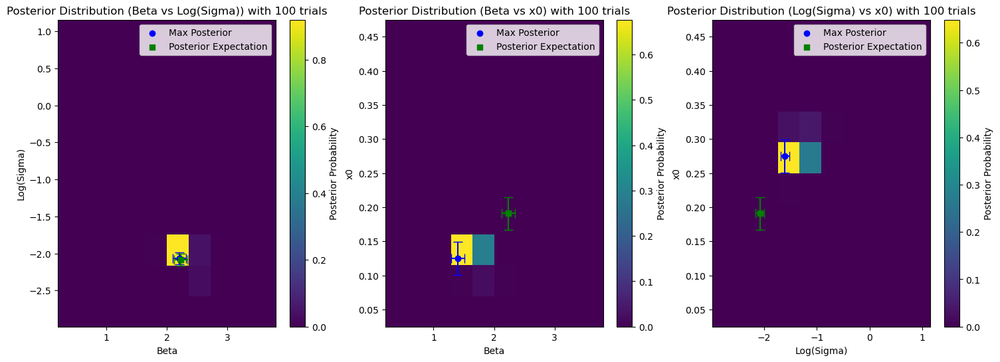

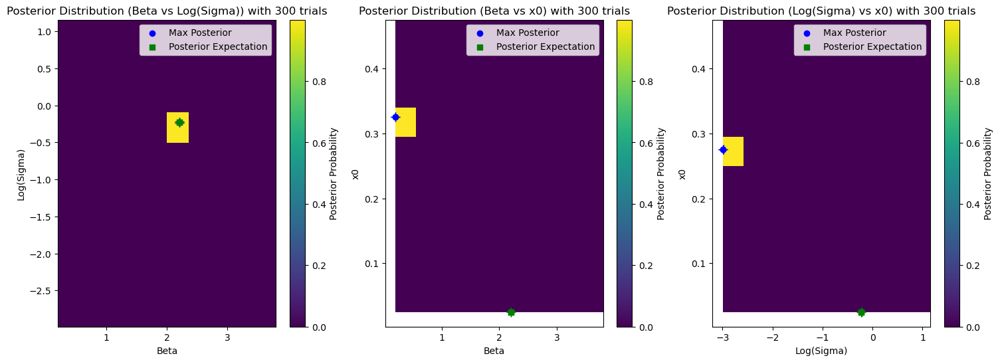

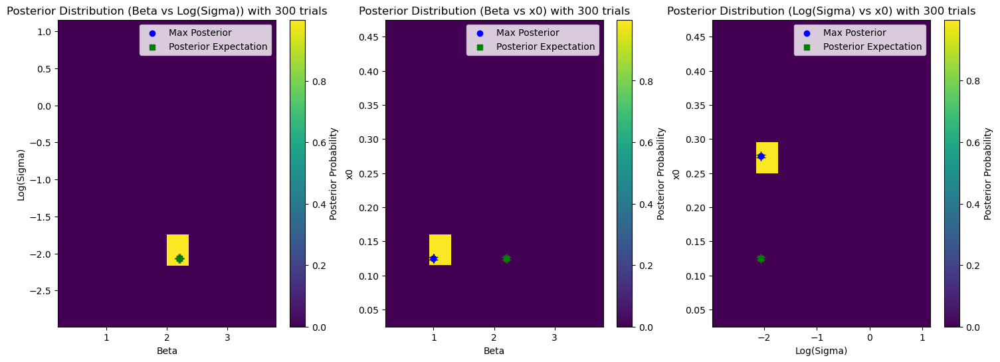

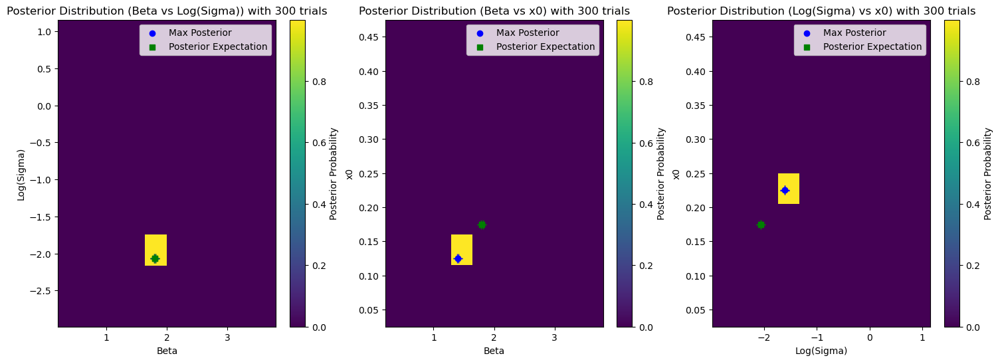

In [323]:
# working, ramp infer stepping trains
# Define ranges for parameters for the ramping model
beta_range = np.linspace(0, 4, 11)  # 5 points for simplicity
log_sigma_range = np.linspace(np.log(0.04), np.log(4), 11)  # 5 points for simplicity
x0_range = np.linspace(0, 0.5, 11)  # 5 points for simplicity

# Calculate midpoints for beta, log_sigma, and x0
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Create a grid of parameter values using midpoints for beta, log_sigma, and x0
beta_grid, log_sigma_grid, x0_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints, x0_midpoints)
M = beta_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Define true parameters for the stepping model
true_parameters_step = [(20, 5, 0.1), (50, 5, 0.2), (60, 8, 0.3)]

# Define number of trials
num_trials_range = [1, 50, 100, 300]

# Function to simulate data using the stepping model
def simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials):
    step_model = HMMStepModel(m=true_m, r=true_r, x0=true_x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)
    return spike_trains

# Function to compute posterior using ramping model
def compute_posterior_ramping_model(spike_trains, num_trials):
    log_likelihoods = np.zeros((len(beta_midpoints), len(log_sigma_midpoints), len(x0_midpoints)))
    x_ts = np.linspace(0, 1, 50)
    r_t = Rh * np.maximum(0, x_ts)
    lambdas = r_t * dt

    for i in range(len(beta_midpoints)):
        for j in range(len(log_sigma_midpoints)):
            for k in range(len(x0_midpoints)):
                beta = beta_midpoints[i]
                sigma = sigma_midpoints[j]
                x0 = x0_midpoints[k]
                ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    try:
                        ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
                    except AssertionError as e:
                        print(f"AssertionError for beta={beta}, sigma={sigma}, x0={x0}")
                        print(f"Shape of ramp_model.pi: {ramp_model.pi.shape}")
                        print(f"Shape of ramp_model.T: {ramp_model.T.shape}")
                        print(f"Shape of log_likes: {log_likes.shape}")
                        raise e
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(beta_midpoints) * len(log_sigma_midpoints) * len(x0_midpoints))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Normalize posterior
    posterior = np.exp(unnormalized_posterior - logsumexp(unnormalized_posterior))

    return posterior


# Function to compute posterior statistics
def compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid):
    posterior_mean_beta = np.sum(posterior * beta_grid) / np.sum(posterior)
    posterior_mean_log_sigma = np.sum(posterior * log_sigma_grid) / np.sum(posterior)
    posterior_mean_x0 = np.sum(posterior * x0_grid) / np.sum(posterior)

    posterior_std_beta = np.sqrt(np.sum(posterior * (beta_grid - posterior_mean_beta) ** 2) / np.sum(posterior))
    posterior_std_log_sigma = np.sqrt(np.sum(posterior * (log_sigma_grid - posterior_mean_log_sigma) ** 2) / np.sum(posterior))
    posterior_std_x0 = np.sqrt(np.sum(posterior * (x0_grid - posterior_mean_x0) ** 2) / np.sum(posterior))

    return posterior_mean_beta, posterior_mean_log_sigma, posterior_mean_x0, posterior_std_beta, posterior_std_log_sigma, posterior_std_x0

# Function to visualize posterior
def visualize_posterior(posterior, true_m, true_r, true_x0, num_trials, mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Integrate out x0 to visualize beta vs log_sigma
    posterior_beta_log_sigma = np.sum(posterior, axis=2)
    im = axs[0].imshow(posterior_beta_log_sigma, extent=(beta_midpoints[0], beta_midpoints[-1], log_sigma_midpoints[0], log_sigma_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(im, ax=axs[0], label='Posterior Probability')
    # axs[0].scatter(true_m, np.log(true_r), color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_log_sigma), posterior_beta_log_sigma.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[0]]
    axs[0].scatter(max_posterior_beta, max_posterior_log_sigma, color='blue', marker='o', label='Max Posterior')
    axs[0].errorbar(max_posterior_beta, max_posterior_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='o', color='blue', capsize=5)
    axs[0].scatter(mean_beta, mean_log_sigma, color='green', marker='s', label='Posterior Expectation')
    axs[0].errorbar(mean_beta, mean_log_sigma, xerr=std_beta, yerr=std_log_sigma, fmt='s', color='green', capsize=5)
    axs[0].set_xlabel('Beta')
    axs[0].set_ylabel('Log(Sigma)')
    axs[0].set_title(f'Posterior Distribution (Beta vs Log(Sigma)) with {num_trials} trials')
    axs[0].legend()

    # Integrate out log_sigma to visualize beta vs x0
    posterior_beta_x0 = np.sum(posterior, axis=1)
    im = axs[1].imshow(posterior_beta_x0, extent=(beta_midpoints[0], beta_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(im, ax=axs[1], label='Posterior Probability')
    # axs[1].scatter(true_m, true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_beta_x0), posterior_beta_x0.shape)
    max_posterior_beta = beta_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[1].scatter(max_posterior_beta, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    axs[1].errorbar(max_posterior_beta, max_posterior_x0, xerr=std_beta, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[1].scatter(mean_beta, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[1].errorbar(mean_beta, mean_x0, xerr=std_beta, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[1].set_xlabel('Beta')
    axs[1].set_ylabel('x0')
    axs[1].set_title(f'Posterior Distribution (Beta vs x0) with {num_trials} trials')
    axs[1].legend()

    # Integrate out beta to visualize log_sigma vs x0
    posterior_log_sigma_x0 = np.sum(posterior, axis=0)
    im = axs[2].imshow(posterior_log_sigma_x0, extent=(log_sigma_midpoints[0], log_sigma_midpoints[-1], x0_midpoints[0], x0_midpoints[-1]), origin='lower', aspect='auto')
    fig.colorbar(im, ax=axs[2], label='Posterior Probability')
    # axs[2].scatter(np.log(true_r), true_x0, color='red', marker='x', label='True Parameters')

    max_posterior_idx = np.unravel_index(np.argmax(posterior_log_sigma_x0), posterior_log_sigma_x0.shape)
    max_posterior_log_sigma = log_sigma_midpoints[max_posterior_idx[1]]
    max_posterior_x0 = x0_midpoints[max_posterior_idx[0]]
    axs[2].scatter(max_posterior_log_sigma, max_posterior_x0, color='blue', marker='o', label='Max Posterior')
    axs[2].errorbar(max_posterior_log_sigma, max_posterior_x0, xerr=std_log_sigma, yerr=std_x0, fmt='o', color='blue', capsize=5)
    axs[2].scatter(mean_log_sigma, mean_x0, color='green', marker='s', label='Posterior Expectation')
    axs[2].errorbar(mean_log_sigma, mean_x0, xerr=std_log_sigma, yerr=std_x0, fmt='s', color='green', capsize=5)
    axs[2].set_xlabel('Log(Sigma)')
    axs[2].set_ylabel('x0')
    axs[2].set_title(f'Posterior Distribution (Log(Sigma) vs x0) with {num_trials} trials')
    axs[2].legend()

    plt.show()

# Function to run the simulation and visualization for the cross-model scenario
def run_cross_model_simulation(true_parameters_step, num_trials_range):
    for num_trials in num_trials_range:
        for true_m, true_r, true_x0 in true_parameters_step:
            spike_trains = simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials)
            posterior = compute_posterior_ramping_model(spike_trains, num_trials)
            mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0 = compute_posterior_statistics(posterior, beta_grid, log_sigma_grid, x0_grid)
            visualize_posterior(posterior, true_m, true_r, true_x0, num_trials, mean_beta, mean_log_sigma, mean_x0, std_beta, std_log_sigma, std_x0)

# Run simulations and visualize posteriors for the cross-model scenario
run_cross_model_simulation(true_parameters_step, num_trials_range)


### <span style="color:lightgreen"> 3.2.1 </span>

In [325]:
# Working code for 3.2.1: uniformly sampled parameters are infered by uniform prior
# takes one hour with M=31, Define ranges for parameters for the ramping model
beta_range = np.linspace(0, 4, 5)  # 5 points for simplicity
log_sigma_range = np.linspace(np.log(0.04), np.log(4), 5)  # 5 points for simplicity
x0_range = np.linspace(0, 0.5, 5)  # 5 points for simplicity

# Define ranges for parameters for the stepping model
m_range = np.linspace(0, 100, 5)  # 5 points for simplicity
r_range = [i + 1 for i in range(10)]
x0_range_step = np.linspace(0, 0.5, 5)  # 5 points for simplicity

# Calculate midpoints for beta, log_sigma, and x0 for the ramping model
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

# Calculate midpoints for m and x0 for the stepping model
m_midpoints = (m_range[:-1] + m_range[1:]) / 2
x0_midpoints_step = (x0_range_step[:-1] + x0_range_step[1:]) / 2

# Create grids for parameter values using midpoints
beta_grid, log_sigma_grid, x0_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints, x0_midpoints)
m_grid, r_grid, x0_grid_step = np.meshgrid(m_midpoints, r_range, x0_midpoints_step)
M_ramp = beta_grid.shape[0]
M_step = m_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Sample true parameters for both models
np.random.seed(42)  # For reproducibility
num_samples = 8  # Number of samples to generate

true_parameters_ramp = [
    (np.random.uniform(0, 4), np.random.uniform(np.exp(log_sigma_range[0]), np.exp(log_sigma_range[-1])), np.random.uniform(0, 0.5))
    for _ in range(num_samples)
]

true_parameters_step = [
    (np.random.uniform(0, 100), np.random.randint(1, 11), np.random.uniform(0, 0.5))
    for _ in range(num_samples)
]

# Define number of trials
num_trials_range = [1, 10, 30, 50, 100]

# Function to simulate data using the ramping model
def simulate_ramping_model_spike_trains(true_beta, true_sigma, true_x0, num_trials):
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=true_x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    return spike_trains

# Function to simulate data using the stepping model
def simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials):
    step_model = HMMStepModel(m=true_m, r=true_r, x0=true_x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)
    return spike_trains

# Function to compute the marginal likelihood using the ramping model
def compute_marginal_likelihood_ramping(spike_trains, num_trials):
    log_likelihoods = np.zeros((len(beta_midpoints), len(log_sigma_midpoints), len(x0_midpoints)))
    x_ts = np.linspace(0, 1, 50)
    r_t = Rh * np.maximum(0, x_ts)
    lambdas = r_t * dt

    for i in range(len(beta_midpoints)):
        for j in range(len(log_sigma_midpoints)):
            for k in range(len(x0_midpoints)):
                beta = beta_midpoints[i]
                sigma = sigma_midpoints[j]
                x0 = x0_midpoints[k]
                ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    try:
                        ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
                    except AssertionError as e:
                        print(f"AssertionError for beta={beta}, sigma={sigma}, x0={x0}")
                        print(f"Shape of ramp_model.pi: {ramp_model.pi.shape}")
                        print(f"Shape of ramp_model.T: {ramp_model.T.shape}")
                        print(f"Shape of log_likes: {log_likes.shape}")
                        raise e
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(beta_midpoints) * len(log_sigma_midpoints) * len(x0_midpoints))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Compute normalization constant (marginal likelihood)
    marginal_likelihood = logsumexp(unnormalized_posterior)

    return marginal_likelihood

# Function to compute the marginal likelihood using the stepping model
def compute_marginal_likelihood_stepping(spike_trains, num_trials):
    log_likelihoods = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints_step)))

    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            for k in range(len(x0_midpoints_step)):
                r = r_range[i]
                s_ts = np.linspace(0, 1, int(r) + 1)
                r_t = np.ones(len(s_ts)) * x0_midpoints_step[k] * Rh  # Initialize with pre-jump rate
                r_t[-1] = Rh
                lambdas = r_t * dt  # Obtain the mean count in each time bin

                m = m_grid[i, j, k]
                x0 = x0_grid_step[i, j, k]
                step_model = HMMStepModel(m=m, r=int(r), x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = 1 / (len(r_range) * len(m_midpoints) * len(x0_midpoints_step))  # Uniform prior
    unnormalized_posterior = log_likelihoods + np.log(prior)

    # Compute normalization constant (marginal likelihood)
    marginal_likelihood = logsumexp(unnormalized_posterior)


    return marginal_likelihood

# Function to perform model selection and compute error rates
def perform_model_selection(true_parameters_ramp, true_parameters_step, num_trials_range):
    results = []
    for num_trials in num_trials_range:
        for true_beta, true_sigma, true_x0 in true_parameters_ramp:
            spike_trains = simulate_ramping_model_spike_trains(true_beta, true_sigma, true_x0, num_trials)
            marginal_likelihood_ramp = compute_marginal_likelihood_ramping(spike_trains, num_trials)
            marginal_likelihood_step = compute_marginal_likelihood_stepping(spike_trains, num_trials)
            log_bayes_factor = marginal_likelihood_ramp - marginal_likelihood_step
            is_correct = log_bayes_factor > 0
            results.append((num_trials, "ramping", log_bayes_factor, is_correct))

        for true_m, true_r, true_x0 in true_parameters_step:
            spike_trains = simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials)
            marginal_likelihood_ramp = compute_marginal_likelihood_ramping(spike_trains, num_trials)
            marginal_likelihood_step = compute_marginal_likelihood_stepping(spike_trains, num_trials)
            log_bayes_factor = marginal_likelihood_ramp - marginal_likelihood_step
            is_correct = log_bayes_factor < 0
            results.append((num_trials, "stepping", log_bayes_factor, is_correct))

    # Compute error rates
    error_rates = {}
    for num_trials in num_trials_range:
        ramping_errors = sum(1 for res in results if res[0] == num_trials and res[1] == "ramping" and not res[3])
        stepping_errors = sum(1 for res in results if res[0] == num_trials and res[1] == "stepping" and not res[3])
        total_ramping = sum(1 for res in results if res[0] == num_trials and res[1] == "ramping")
        total_stepping = sum(1 for res in results if res[0] == num_trials and res[1] == "stepping")
        error_rates[num_trials] = {
            "ramping_error_rate": ramping_errors / total_ramping,
            "stepping_error_rate": stepping_errors / total_stepping,
        }

    return results, error_rates

# Run model selection and compute error rates
results, error_rates = perform_model_selection(true_parameters_ramp, true_parameters_step, num_trials_range)

# # Print results and error rates
# for num_trials, model, log_bayes_factor, is_correct in results:
#     print(f"Num trials: {num_trials}, Model: {model}, Log Bayes Factor: {log_bayes_factor}, Correct: {is_correct}")

print("\nError Rates:")
for num_trials, rates in error_rates.items():
    print(f"Num trials: {num_trials}, Ramping Error Rate: {rates['ramping_error_rate']}, Stepping Error Rate: {rates['stepping_error_rate']}")



Error Rates:
Num trials: 1, Ramping Error Rate: 0.125, Stepping Error Rate: 0.375
Num trials: 10, Ramping Error Rate: 0.125, Stepping Error Rate: 0.25
Num trials: 30, Ramping Error Rate: 0.0, Stepping Error Rate: 0.375
Num trials: 50, Ramping Error Rate: 0.0, Stepping Error Rate: 0.375
Num trials: 100, Ramping Error Rate: 0.125, Stepping Error Rate: 0.125


### <span style='color:lightgreen'> 3.2.2 </style>

In [326]:
# working code for 3.2.2: samping distribution and inference distribution are different.
from scipy.stats import truncnorm
import numpy as np
from scipy.special import logsumexp

# Define ranges for parameters for the ramping model
beta_range = np.linspace(0, 4, 5)
log_sigma_range = np.linspace(np.log(0.04), np.log(4), 5)
x0_range = np.linspace(0, 0.5, 5)

# Define ranges for parameters for the stepping model
m_range = np.linspace(0, 100, 5)
r_range = [i + 1 for i in range(10)]
x0_range_step = np.linspace(0, 0.5, 5)

# Calculate midpoints for beta, log_sigma, and x0 for the ramping model
beta_midpoints = (beta_range[:-1] + beta_range[1:]) / 2
log_sigma_midpoints = (log_sigma_range[:-1] + log_sigma_range[1:]) / 2
sigma_midpoints = np.exp(log_sigma_midpoints)
x0_midpoints = (x0_range[:-1] + x0_range[1:]) / 2

d_beta = beta_range[1] - beta_range[0]
d_log_sigma = log_sigma_range[1] - log_sigma_range[0]
d_x0 = x0_range[1] - x0_range[0]

# Calculate midpoints and volume elements for m and x0 for the stepping model
m_midpoints = (m_range[:-1] + m_range[1:]) / 2
x0_midpoints_step = (x0_range_step[:-1] + x0_range_step[1:]) / 2

d_m = m_range[1] - m_range[0]
d_x0_step = x0_range_step[1] - x0_range_step[0]

# Create grids for parameter values using midpoints
beta_grid, log_sigma_grid, x0_grid = np.meshgrid(beta_midpoints, log_sigma_midpoints, x0_midpoints)
m_grid, r_grid, x0_grid_step = np.meshgrid(m_midpoints, r_range, x0_midpoints_step)
M_ramp = beta_grid.shape[0]
M_step = m_grid.shape[0]

# Fix Rh and dt
Rh = 50
dt = 0.01

# Sample true parameters for both models
np.random.seed(42)  # For reproducibility
num_samples = 8  # Number of samples to generate

true_parameters_ramp = [
    (np.random.uniform(0, 4), np.random.uniform(np.exp(log_sigma_range[0]), np.exp(log_sigma_range[-1])), np.random.uniform(0, 0.5))
    for _ in range(num_samples)
]

true_parameters_step = [
    (np.random.uniform(0, 100), np.random.randint(1, 11), np.random.uniform(0, 0.5))
    for _ in range(num_samples)
]

# Define number of trials
num_trials_range = [1, 5, 20]

# Function to simulate data using the ramping model
def simulate_ramping_model_spike_trains(true_beta, true_sigma, true_x0, num_trials):
    ramp_model = HMMRampModel(beta=true_beta, sigma=true_sigma, x0=true_x0)
    spike_trains = ramp_model.simulate_spike_trains_array(num_steps=100, num_trials=num_trials)[0]
    return spike_trains

# Function to simulate data using the stepping model
def simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials):
    step_model = HMMStepModel(m=true_m, r=true_r, x0=true_x0)
    jump_times = step_model.simulate_jump_times(num_steps=100, num_trials=num_trials)
    spike_trains = step_model.simulate_spike_trains(jump_times, num_steps=100, num_trials=num_trials)
    return spike_trains

# Function to compute the truncated Gaussian prior
def truncated_gaussian_prior(value, mean, sd, lower, upper):
    a, b = (lower - mean) / sd, (upper - mean) / sd
    return truncnorm.pdf(value, a, b, loc=mean, scale=sd)

# Function to compute the marginal likelihood using the ramping model
def compute_marginal_likelihood_ramping(spike_trains, num_trials, sd_fraction, prior_means):
    log_likelihoods = np.zeros((len(beta_midpoints), len(log_sigma_midpoints), len(x0_midpoints)))
    x_ts = np.linspace(0, 1, 50)
    r_t = Rh * np.maximum(0, x_ts)
    lambdas = r_t * dt

    beta_prior_mean = prior_means['beta']
    sigma_prior_mean = prior_means['sigma']
    x0_prior_mean = prior_means['x0']

    unnormalized_prior_ramp = np.zeros((len(beta_midpoints), len(log_sigma_midpoints), len(x0_midpoints)))
    for i in range(len(beta_midpoints)):
        for j in range(len(log_sigma_midpoints)):
            for k in range(len(x0_midpoints)):
                beta = beta_midpoints[i]
                sigma = sigma_midpoints[j]
                x0 = x0_midpoints[k]
                ramp_model = HMMRampModel(beta=beta, sigma=sigma, x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    try:
                        ll += hmm_normalizer(ramp_model.pi, ramp_model.T, log_likes)
                    except AssertionError as e:
                        print(f"AssertionError for beta={beta}, sigma={sigma}, x0={x0}")
                        print(f"Shape of ramp_model.pi: {ramp_model.pi.shape}")
                        print(f"Shape of ramp_model.T: {ramp_model.T.shape}")
                        print(f"Shape of log_likes: {log_likes.shape}")
                        raise e
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = np.zeros((len(beta_midpoints), len(log_sigma_midpoints), len(x0_midpoints)))
    for i in range(len(beta_midpoints)):
        for j in range(len(log_sigma_midpoints)):
            for k in range(len(x0_midpoints)):
                beta = beta_midpoints[i]
                sigma = sigma_midpoints[j]
                x0 = x0_midpoints[k]
                prior[i, j, k] = (
                    truncated_gaussian_prior(beta, beta_prior_mean, sd_fraction * (beta_range[-1] - beta_range[0]), beta_range[0], beta_range[-1]) *
                    truncated_gaussian_prior(sigma, sigma_prior_mean, sd_fraction * (sigma_midpoints[-1] - sigma_midpoints[0]), sigma_midpoints[0], sigma_midpoints[-1]) *
                    truncated_gaussian_prior(x0, x0_prior_mean, sd_fraction * (x0_range[-1] - x0_range[0]), x0_range[0], x0_range[-1])
                )

    # Normalize the priors
    total_prior_ramp = np.sum(prior)
    normalized_prior_ramp = prior / total_prior_ramp

    # volume_element = d_beta * d_log_sigma * d_x0
    unnormalized_posterior = log_likelihoods + np.log(normalized_prior_ramp) #+ np.log(volume_element)

    # Compute normalization constant (marginal likelihood)
    marginal_likelihood = logsumexp(unnormalized_posterior)

    # Print sum of normalized priors
    # print(f"Sum of normalized priors (ramping model): {np.sum(normalized_prior_ramp)}")

    return marginal_likelihood

# Function to compute the marginal likelihood using the stepping model
def compute_marginal_likelihood_stepping(spike_trains, num_trials, sd_fraction, prior_means):
    log_likelihoods = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints_step)))

    m_prior_mean = prior_means['m']
    r_prior_mean = prior_means['r']
    x0_prior_mean = prior_means['x0']

    unnormalized_prior_step = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints_step)))
    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            for k in range(len(x0_midpoints_step)):
                r = r_range[i]
                s_ts = np.linspace(0, 1, int(r) + 1)
                r_t = np.ones(len(s_ts)) * x0_midpoints_step[k] * Rh  # Initialize with pre-jump rate
                r_t[-1] = Rh
                lambdas = r_t * dt  # Obtain the mean count in each time bin

                m = m_grid[i, j, k]
                x0 = x0_grid_step[i, j, k]
                step_model = HMMStepModel(m=m, r=int(r), x0=x0)
                ll = 0
                for trial in range(num_trials):
                    log_likes = poisson_logpdf(spike_trains[trial], lambdas)
                    ll += hmm_normalizer(step_model.pi, step_model.T, log_likes)
                log_likelihoods[i, j, k] = ll

    # Compute unnormalized posterior
    prior = np.zeros((len(r_range), len(m_midpoints), len(x0_midpoints_step)))
    for i in range(len(r_range)):
        for j in range(len(m_midpoints)):
            for k in range(len(x0_midpoints_step)):
                m = m_midpoints[j]
                r = r_range[i]
                x0 = x0_midpoints_step[k]
                prior[i, j, k] = (
                    truncated_gaussian_prior(m, m_prior_mean, sd_fraction * (m_range[-1] - m_range[0]), m_range[0], m_range[-1]) *
                    truncated_gaussian_prior(r, r_prior_mean, sd_fraction * (r_range[-1] - r_range[0]), r_range[0], r_range[-1]) *
                    truncated_gaussian_prior(x0, x0_prior_mean, sd_fraction * (x0_range_step[-1] - x0_range_step[0]), x0_range_step[0], x0_range_step[-1])
                )

    # Normalize the priors
    total_prior_step = np.sum(prior)
    normalized_prior_step = prior / total_prior_step

    #volume_element = d_m * 1 * d_x0_step  # The '1' is because r is already an integer and does not need an additional volume element.
    unnormalized_posterior = log_likelihoods + np.log(normalized_prior_step) #+ np.log(volume_element)

    # Compute normalization constant (marginal likelihood)
    marginal_likelihood = logsumexp(unnormalized_posterior)

    # Print sum of normalized priors
    # print(f"Sum of normalized priors (stepping model): {np.sum(normalized_prior_step)}")

    return marginal_likelihood

# Function to perform model selection and compute error rates
def perform_model_selection(true_parameters_ramp, true_parameters_step, num_trials_range, sd_fractions, prior_means_set):
    results = {}
    for sd_fraction in sd_fractions:
        results[sd_fraction] = []
        for num_trials in num_trials_range:
            for true_beta, true_sigma, true_x0 in true_parameters_ramp:
                spike_trains = simulate_ramping_model_spike_trains(true_beta, true_sigma, true_x0, num_trials)
                marginal_likelihood_ramp = compute_marginal_likelihood_ramping(spike_trains, num_trials, sd_fraction, prior_means_set)
                marginal_likelihood_step = compute_marginal_likelihood_stepping(spike_trains, num_trials, sd_fraction, prior_means_set)
                log_bayes_factor = marginal_likelihood_ramp - marginal_likelihood_step
                is_correct = log_bayes_factor > 0
                results[sd_fraction].append((num_trials, "ramping", log_bayes_factor, is_correct))

            for true_m, true_r, true_x0 in true_parameters_step:
                spike_trains = simulate_stepping_model_spike_trains(true_m, true_r, true_x0, num_trials)
                marginal_likelihood_ramp = compute_marginal_likelihood_ramping(spike_trains, num_trials, sd_fraction, prior_means_set)
                marginal_likelihood_step = compute_marginal_likelihood_stepping(spike_trains, num_trials, sd_fraction, prior_means_set)
                log_bayes_factor = marginal_likelihood_ramp - marginal_likelihood_step
                is_correct = log_bayes_factor < 0
                results[sd_fraction].append((num_trials, "stepping", log_bayes_factor, is_correct))

    # Compute error rates
    error_rates = {}
    for sd_fraction in sd_fractions:
        error_rates[sd_fraction] = {}
        for num_trials in num_trials_range:
            ramping_incorrect = sum(1 for res in results[sd_fraction] if res[0] == num_trials and res[1] == "ramping" and not res[3])
            stepping_incorrect = sum(1 for res in results[sd_fraction] if res[0] == num_trials and res[1] == "stepping" and not res[3])
            total_ramping = sum(1 for res in results[sd_fraction] if res[0] == num_trials and res[1] == "ramping")
            total_stepping = sum(1 for res in results[sd_fraction] if res[0] == num_trials and res[1] == "stepping")

            error_rate_ramping = ramping_incorrect / total_ramping
            error_rate_stepping = stepping_incorrect / total_stepping

            error_rates[sd_fraction][num_trials] = {
                "error_rate_ramping": error_rate_ramping,
                "error_rate_stepping": error_rate_stepping
            }

    return results, error_rates

# Define different SD fractions to test
sd_fractions = [0.1, 0.2, 0.3]
prior_means_sets = [
    {"beta": 0.5, "sigma": np.mean(sigma_midpoints), "x0": np.mean(x0_midpoints), "m": np.mean(m_midpoints), "r": 2},
    {"beta": 0.5, "sigma": np.mean(sigma_midpoints), "x0": np.mean(x0_midpoints), "m": np.mean(m_midpoints), "r": 9},
    {"beta": 3.5, "sigma": np.mean(sigma_midpoints), "x0": np.mean(x0_midpoints), "m": np.mean(m_midpoints), "r": 2},
    {"beta": 3.5, "sigma": np.mean(sigma_midpoints), "x0": np.mean(x0_midpoints), "m": np.mean(m_midpoints), "r": 9}
]

# Run model selection and compute error rates for different SD fractions and prior means
for prior_means_set in prior_means_sets:
    for sd_fraction in sd_fractions:
        print(f"\nPrior means: {prior_means_set}, SD Fraction: {sd_fraction}")
        results, error_rates = perform_model_selection(true_parameters_ramp, true_parameters_step, num_trials_range, [sd_fraction], prior_means_set)

        # # Print results and error rates
        # for num_trials, model, log_bayes_factor, is_correct in results[sd_fraction]:
        #     print(f"Num trials: {num_trials}, Model: {model}, Log Bayes Factor: {log_bayes_factor}, Correct: {is_correct}")

        print("\nError Rates:")
        for num_trials, rates in error_rates[sd_fraction].items():
            print(f"Num trials: {num_trials}, Error Rate Ramping: {rates['error_rate_ramping']}, Error Rate Stepping: {rates['error_rate_stepping']}")



Prior means: {'beta': 0.5, 'sigma': 0.8141861928136656, 'x0': 0.25, 'm': 50.0, 'r': 2}, SD Fraction: 0.1

Error Rates:
Num trials: 1, Error Rate Ramping: 0.625, Error Rate Stepping: 0.25
Num trials: 5, Error Rate Ramping: 0.25, Error Rate Stepping: 0.125
Num trials: 20, Error Rate Ramping: 0.25, Error Rate Stepping: 0.125

Prior means: {'beta': 0.5, 'sigma': 0.8141861928136656, 'x0': 0.25, 'm': 50.0, 'r': 2}, SD Fraction: 0.2

Error Rates:
Num trials: 1, Error Rate Ramping: 0.375, Error Rate Stepping: 0.0
Num trials: 5, Error Rate Ramping: 0.5, Error Rate Stepping: 0.125
Num trials: 20, Error Rate Ramping: 0.25, Error Rate Stepping: 0.0

Prior means: {'beta': 0.5, 'sigma': 0.8141861928136656, 'x0': 0.25, 'm': 50.0, 'r': 2}, SD Fraction: 0.3

Error Rates:
Num trials: 1, Error Rate Ramping: 0.25, Error Rate Stepping: 0.0
Num trials: 5, Error Rate Ramping: 0.375, Error Rate Stepping: 0.25
Num trials: 20, Error Rate Ramping: 0.125, Error Rate Stepping: 0.0

Prior means: {'beta': 0.5, 'sig

# Week 4

In this task we will explore the effect of **model mismatch** on model selection, and the related concept of **brittleness** (a term coined in Chandrasekaran et al. 2018).<br>
As may be intuitive, mismatch of either model with the true data generative process would lead to additional systematic errors in model selection (as a means to hypothesis testing).
Brittleness refers to a special case of this: in order to quantitatively evaluate empirical evidence for a conceptual hypothesis (such as whether a LIP neuron "continuously
accumulates evidence by ramping up its activity", or whether "its firing rate abruptly jumps during a trial at a random time") we need to concoct a precise mathematical model to encapsulate
the alternative conceptual hypotheses. In order to carry out probabilistic/Bayesian inference we further need these models to be probabilistic models, with a likelihood function
and a prior distribution over parameters. In the process of designing such mathematical models, in general, and probabilistic models, in particular, various choices need to be made
for different aspects of the model which are independent of the conceptual hypotheses and are not constrained by them.

For example, in our case, a model that is identical to our step model, but has a jump time distribution that is not negative binomial, but, say, a uniform distribution, is still consistent with the<br>
conceptual hypothesis of a discontinous jump in the firing rate, as opposed to a continuous ramp.<br>  
As another example, our two competing hypotheses differ only in their predictions for the behaviour of latent firing rates, and are silent on the precise mechanism or statistical form of <br>
spiking based on those firing rates. However, in order to build a probabilistic model of our observed data (spike counts) we needed to make a modeling choice and decided to model spike counts as<br> Poisson distributed (conditional on rates).<br>

But what if reality deviates from these assumptions? What effect would such deviations have on our inferences about the true mechanism underlying the data?<br>
Finally, what can we do to reduce the brittleness of hypothesis testing? This task is intended to provide insight about these questions.

For all the tasks below, use $M = 10$, and unless otherwise instructed, $N_{\rm trials} = 25$, to save on computational time. For number of datasets (to evaluate error rates)<br>
use 10 datasets at a minimum, and no need to exceed 100. (In general, be strategic about choice of the number of datasets. If you see, based on small-scale explorations, that a trend that<br>
is the subject of a sub-task or question is visible for a smaller number of datasets, you don't need to use more datasets.)

### <span style='color:lightgreen'> Task 4.1 </style>
**Non-Poissonian spiking**

Here you will study the effect of (unaccounted) non-Poissonian spiking on the model selection. The function `gamma_isi_point_process` in `models.py` allows you<br>
to simulate non-Poissonian spikes within a certain family for which inter-spike interval (ISI)  distributions deviate from the exponential distribution<br>
which is the ISI distribution under Poisson spiking (this corresponds to the special case of `shape = 1` for the parameter of `gamma_isi_point_process`).<br>
(You are not directly interested in ISI's and their distribution for the tasks.)

Generalise your code implementing the HMM-based ramp and step models to emit spikes according to the new distribution family (inspection of the `emit` methods of the ramp and step model<br>
classes in `models.py`  shows you how to use `gamma_isi_point_process`).

**4.1.1** Investigate the behavior of the two types of model-selection error rate (the mis-classification rate for each case of true model) with increasing values of the<br>
`shape` parameter of `gamma_isi_point_process` (do not use values of `shape` less than 1, and no need to go above 5). Try this for a few different choices of true model parameters<br>
(making sure they are chosen to produce ramp-like PSTH's). In this sub-task use $N_{\rm trials} = 25$.

How does deviation from Poisson  (with `shape` > 1) affect the two error rates? Does it bias the model selection to one or the other model systematically? If so, towards which model?  

**4.1.2** The model-mismatch due to non-Poisson spiking is an example of mismatch of a model's likelihood with the true data-generating model. A mismatch of model prior with the <br>
true distribution from which true model parameters are sampled (in the real world, this could correspond to the variation of parameters across real LIP neurons, for example)<br>
can also affect model selection. You have already investigated this in 3.2.2. Investigate the difference in the effect of number of trials on model misclassification biases, <br>
for the two cases of prior mismatch and unaccounted non-Poissonian spiking (choose a sensible degree of prior mismatch based on your explorations in 3.2.2).<br>
If there is a systematic difference, try to provide an explanation. <br>
(You can use $N_{\rm trials} = 10, 20, 50, 200$ --and higher if possible-- and you can fix the true parameters, including `shape`, to reasonable values; reasonable according to your previous findings.)

### <span style='color:lightgreen'> Task 4.2 </style>

**Understanding the effects of non-Poissonian spiking**

This task only involves simulation (spike train generation) of the HMM models (or the models from `models.py`, up to you) with `gamma_isi_point_process` used for spike emission.<br>
By remaking the sort of plots you made in Week 1 (e.g. raster plots and plots of PSTH and Fano Factor vs. time) for the non-Poissonian model and <br>
observing its behavior, answer the following questions:

- How does `shape` affect spiking quality and the resulting Fano Factor behaviour?
- Based on your observations, try to explain the effects  that you observed in **4.1.1** of  non-Poisson spiking on model selection errors.


In [327]:
#2.1 Rough working code
from scipy.stats import norm
import matplotlib.pyplot as plt

#s goes from 0 to 49 and is the index of the x grid.
#x goes from 0 to 1 and is regular.
#x is the discrete states
#But what is the probability that s(t+1) = 3 when s(t) = 1
#This is the equivalent to the probability that x(t+1) = 3/49 when x(t) = 1/49
#The distribution is a normal distribution with centre 1/49 + beta*dt (so 0.005) and variance sigma**2*dt (so 0.01)
#Therefore the probability that x(t+1) = 3/49 when x(t) = 1/49 is the probability that x(t+1) falls in the gap from 2.5/49 to 3.5/49
K = 50
s = np.linspace(0, K-1, K)
x_t_options = s/(K-1)
T = 1000

#print(s)
#print(x_t_options)
Tau = np.zeros((K, K))
beta = 1
sigma = 1
dt = 0.001
x0 = 0.4
chosen = 0
interval = [0, 0]
cdf_a = 0
cdf_b = 0
for i in range(K):
    if i != K-1:
        for j in range(K):
            if j == 0:
                interval = [j, (j+0.5)/(K-1)]
            elif j == K-1:
                interval = [(j-0.5)/(K-1), j]
            else:
                #Imagine here i = 1, j = 2. So prob that s(t+1) = 2 given s(t) = 1. Prob that x(t+1) = between 1.5/49 and 2.5/49 when x(t) = 1/49.
                interval = [(j - 0.5)/(K-1), (j+0.5)/(K-1)]
            cdf_a = norm.cdf(interval[0], loc=i/(K-1)+beta*dt, scale=sigma*np.sqrt(dt))
            cdf_b = norm.cdf(interval[1], loc=i/(K-1)+beta*dt, scale=sigma*np.sqrt(dt))
            Tau[i][j] = cdf_b - cdf_a
    else:
        for j in range(K):
            if j!= K-1:
                Tau[i][j] = 0
            else:
                Tau[i][j] = 1

summed = 0
for i in range(K):
    for j in range(K):
        summed+=Tau[i][j]
    Tau[i] /= summed
    summed = 0

#s goes from 0 to 49 and is the index of the x grid.
#x goes from 0 to 1 and is regular.
#x is the discrete states
#But what is the probability of s(0)
#Probability that s(0) = 0 is probability that x(0) = 0 which is probability that falls within 0 and 0.5/49 with normal distribution mean x0
#and variance sigma**2*dt
#Probability that s(0) = 1 is probability that x(0) = 1/49 which is probability that falls within 0.5 and 1.5

s_0 = np.zeros(K)
for j in range(K):
    if j == 0:
        interval = [j, (j+0.5)/(K-1)]
    elif j == K-1:
        interval = [(j-0.5)/(K-1), j]
    else:
        #Imagine here i = 1, j = 2. So prob that s(t+1) = 2 given s(t) = 1. Prob that x(t+1) = between 1.5/49 and 2.5/49 when x(t) = 1/49.
        interval = [(j - 0.5)/(K-1), (j+0.5)/(K-1)]
    cdf_a = norm.cdf(interval[0], loc=x0, scale=sigma*np.sqrt(dt))
    cdf_b = norm.cdf(interval[1], loc=x0, scale=sigma*np.sqrt(dt))
    s_0[j] = cdf_b - cdf_a

sums = 0
for j in range(K):
    sums += s_0[j]
s_0 /= sums

t_values = np.linspace(0, T-1, T)
print(t_values)
x_t_values = np.zeros(T)

#for i in range(x_t_values):
    #For i = 0
#x_t_values = np.random.choice(x_t_options, 1, p = s_0)
#print(x_t_values)

for i in range(len(t_values)):
    p = np.matmul(s_0, np.linalg.matrix_power(Tau, i))
    #print(np.random.choice(x_t_options, 1, p = p))
    x_t_values[i] = np.random.choice(x_t_options, 1, p = p)
#print(x_t_values)

#plt.plot(t_values, x_t_values)
#print(x_t_values)
#print(np.linalg.matrix_power(Tau, 100))
state_distributions = [s_0]
for t in range(len(t_values)):
    pi_t = np.dot(state_distributions[-1], Tau)
    state_distributions.append(pi_t)

# Convert list to numpy array for easier handling
state_distributions = np.array(state_distributions)

# Print the state distributions for the first 10 timesteps as an example
for t in range(10):
    print(f"State distribution at time {t}: {state_distributions[t]}")

def sample_next_state(current_state, transition_matrix):
    return np.random.choice(np.arange(K), p=transition_matrix[current_state])

states = np.zeros(T, dtype=int)

# Set the initial state
states[0] = np.random.choice(x_t_options, p=s_0)

# Simulate the Markov chain
for t in range(T):
    states[t] = sample_next_state(states[t - 1], Tau)

print(states)
states = states.astype(np.float)
print(states)
for i in range(len(states)):
    print(type(states[i]))
    states[i] = states[i] / (K-1)
print(states)

plt.plot(t_values, states)



[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111.
 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125.
 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 138. 139.
 140. 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152. 153.
 154. 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167.
 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181.
 182. 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 195.
 196. 

AttributeError: module 'numpy' has no attribute 'float'.
`np.float` was a deprecated alias for the builtin `float`. To avoid this error in existing code, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations